# Functions

In [1]:
import numpy as np
from scipy.special import factorial, eval_genlaguerre
from scipy.optimize import minimize
from scipy.linalg import eigh
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import TwoSlopeNorm
from joblib import Parallel, delayed
import contextlib, joblib
from tqdm.auto import tqdm
import qutip as qt
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import MaxNLocator
import warnings
from math import comb as _C
from matplotlib.ticker import PercentFormatter
warnings.filterwarnings('ignore')
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors
import matplotlib.lines as mlines

plt.rcParams.update({
    'text.usetex': True,
    'text.latex.preamble': r'\usepackage{amsmath}\usepackage[utf8]{inputenc}',
    'font.family': 'serif',
    'font.serif': ['Computer Modern'],
    'font.size': 22,
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 16,
    'figure.titlesize': 20,
    'axes.facecolor': 'white',
    'figure.facecolor': 'white',
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'grid.color': 'gray',
    'axes.axisbelow': True,
})

# ── Utilidades ────────────────────────────────────────────────────────────────

@contextlib.contextmanager
def tqdm_joblib(tqdm_object):
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)
    old = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old
        tqdm_object.close()


def get_M_CM(lam, M_max=12):
    """Truncación adaptativa. El desplazamiento efectivo en los modos
    relativo/CoM es sqrt(2)*lam, por eso los umbrales se ajustan."""
    lam_eff = np.sqrt(2) * lam
    if np.abs(lam_eff) < 0.5:   return 5
    elif np.abs(lam_eff) < 1.5: return 9
    else:               return M_max


def disp_matrix(M_ph, alpha):
    """Elementos de matriz <m'|D(alpha)|m> en base de Fock, alpha real."""
    N      = M_ph + 1
    alpha2 = alpha * alpha
    gauss  = np.exp(-0.5 * alpha2)
    facts  = np.array([float(factorial(k, exact=True)) for k in range(N)])
    D = np.zeros((N, N))
    for mp in range(N):
        for n in range(N):
            if mp >= n:
                k    = mp - n
                pref = gauss * (alpha**k) * np.sqrt(facts[n] / facts[mp])
                D[mp, n] = pref * eval_genlaguerre(n, k, alpha2)
            else:
                k    = n - mp
                pref = gauss * ((-alpha)**k) * np.sqrt(facts[mp] / facts[n])
                D[mp, n] = pref * eval_genlaguerre(mp, k, alpha2)
    return D


def phonon_weight_CM(vec, m_r, m_c, nph, n_ph):
    """Peso fonónico |<m_r,m_c|psi>|^2 sumado sobre los dos bloques electrónicos.
    Índice en el bloque fonónico: idx = m_r * nph + m_c"""
    idx = m_r * nph + m_c
    return abs(vec[idx])**2 + abs(vec[n_ph + idx])**2


def build_CM_hamiltonians(M, eps, t, Delta, omega0, lam):
    """
    Hamiltoniano en la base |elec_sector, m_r, m_c>.

    Sector impar (o): |1,0> y |0,1>
      H_o = [[ eps_t+Omega,   t*D_t        ],
             [ t*D_t^dag,     eps_t+Omega  ]]

    Sector par (e): |0,0> y |1,1>
      H_e = [[ Omega,              Delta*D_Delta       ],
             [ Delta*D_Delta^dag,  2*eps_t+Omega       ]]

    eps_t   = eps - lam^2*omega0
    D_t     = D(+sqrt(2)*lam)  actúa en m_r
    D_Delta = D(-sqrt(2)*lam)  actúa en m_c
    Omega   = (m_r + m_c)*omega0  (diagonal)
    """
    nph  = M + 1
    n_ph = nph * nph

    eps_t = eps - lam**2 * omega0

    D_t = disp_matrix(M,  np.sqrt(2) * lam)
    D_D = disp_matrix(M, -np.sqrt(2) * lam)
    I   = np.eye(nph)

    D_t_full = np.kron(D_t, I)   # D_t ⊗ I  (actúa en m_r)
    D_D_full = np.kron(I, D_D)   # I ⊗ D_Δ  (actúa en m_c)

    Omega = np.array([(mr + mc) * omega0
                      for mr in range(nph) for mc in range(nph)])

    # Sector impar
    H_o = np.zeros((2*n_ph, 2*n_ph))
    H_o[:n_ph, :n_ph] = np.diag(eps_t + Omega)
    H_o[n_ph:, n_ph:] = np.diag(eps_t + Omega)
    H_o[:n_ph, n_ph:] = t * D_t_full
    H_o[n_ph:, :n_ph] = t * D_t_full.T

    # Sector par
    H_e = np.zeros((2*n_ph, 2*n_ph))
    H_e[:n_ph, :n_ph] = np.diag(Omega)
    H_e[n_ph:, n_ph:] = np.diag(2*eps_t + Omega)
    H_e[:n_ph, n_ph:] = Delta * D_D_full
    H_e[n_ph:, :n_ph] = Delta * D_D_full.T

    return H_e, H_o, nph, n_ph


def diagonalize_CM(M, eps, t, Delta, omega0, lam):
    H_e, H_o, nph, n_ph = build_CM_hamiltonians(M, eps, t, Delta, omega0, lam)
    ev_e, evec_e = eigh(H_e)
    ev_o, evec_o = eigh(H_o)
    return ev_e, evec_e, ev_o, evec_o, nph, n_ph


def compute_point_CM(lam, Delta):
    M_loc = get_M_CM(lam, M_max)
    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps=eps_val, t=t, Delta=Delta, omega0=omega0, lam=lam)
    gs_e = evec_e[:, 0]
    gs_o = evec_o[:, 0]
    p    = ev_e[0] - ev_o[0]   # splitting con signo: E_e - E_o
    w_e  = {(mr, mc): phonon_weight_CM(gs_e, mr, mc, nph, n_ph)
            for (mr, mc) in phonon_states_keys}
    w_o  = {(mr, mc): phonon_weight_CM(gs_o, mr, mc, nph, n_ph)
            for (mr, mc) in phonon_states_keys}
    return p, w_e, w_o

print("Preámbulo y funciones cargadas correctamente.")


c:\Users\yumab\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Preámbulo y funciones cargadas correctamente.


# General results: Electronic sector

## Heatmap

In [2]:
# ── Parámetros físicos ────────────────────────────────────────────
t       = 1.0
omega0  = 1.0
eps_val = 0.25
M_max   = 15

phonon_states_keys = [(0,0),(0,1),(1,0),(1,1),(2,0),(0,2)]

# ── Grilla ────────────────────────────────────────────────────────
n_lam, n_Delta = 200, 200
lam_arr   = np.linspace(0.01, 2.0, n_lam)
Delta_arr = np.linspace(0.0,  2.0, n_Delta)

print(f"Grid: {n_lam} x {n_Delta} = {n_lam*n_Delta:,} puntos")

# ── Cálculo paralelo ──────────────────────────────────────────────
print(f"Calculando mapa 2D [{n_lam}x{n_Delta}] — base relativa/CoM ...")

flat_results = Parallel(n_jobs=-1, verbose=5)(
    delayed(compute_point_CM)(lam, Delta)
    for lam in lam_arr
    for Delta in Delta_arr
)

print("\n¡Listo!")

# ── Reconstrucción de arrays 2D ───────────────────────────────────
hmap_p = np.zeros((n_Delta, n_lam))
phonon_states = {k: {"even": np.zeros((n_Delta, n_lam)),
                      "odd":  np.zeros((n_Delta, n_lam))}
                 for k in phonon_states_keys}

for j in range(n_lam):
    for i in range(n_Delta):
        p, w_e, w_o = flat_results[j * n_Delta + i]
        hmap_p[i, j] = p
        for (mr, mc) in phonon_states_keys:
            phonon_states[(mr, mc)]["even"][i, j] = w_e[(mr, mc)]
            phonon_states[(mr, mc)]["odd"][i, j]  = w_o[(mr, mc)]

print("Arrays reconstruidos.")
print(f"  rango de p = E_e - E_o : [{hmap_p.min():.4f}, {hmap_p.max():.4f}]")


Grid: 200 x 200 = 40,000 puntos
Calculando mapa 2D [200x200] — base relativa/CoM ...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 492 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 6924 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 10464 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 12048 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 13920 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 16080 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 18528 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 21264 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 21810 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 22224 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 22674 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 23160 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 23682 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 2424


¡Listo!
Arrays reconstruidos.
  rango de p = E_e - E_o : [-3.8430, 0.9179]


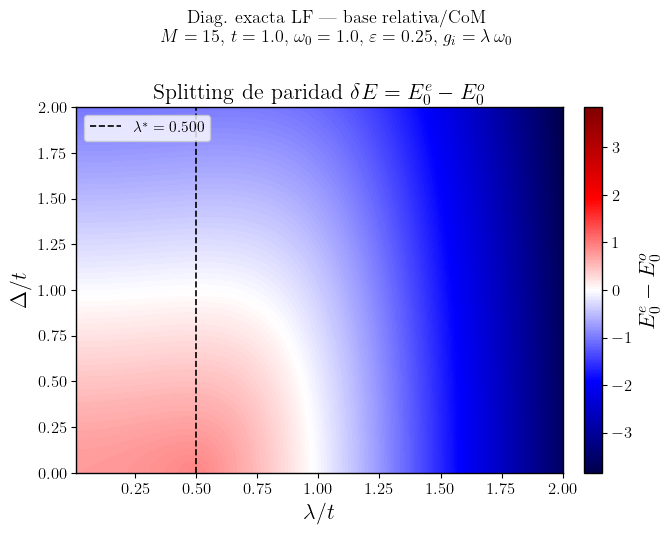

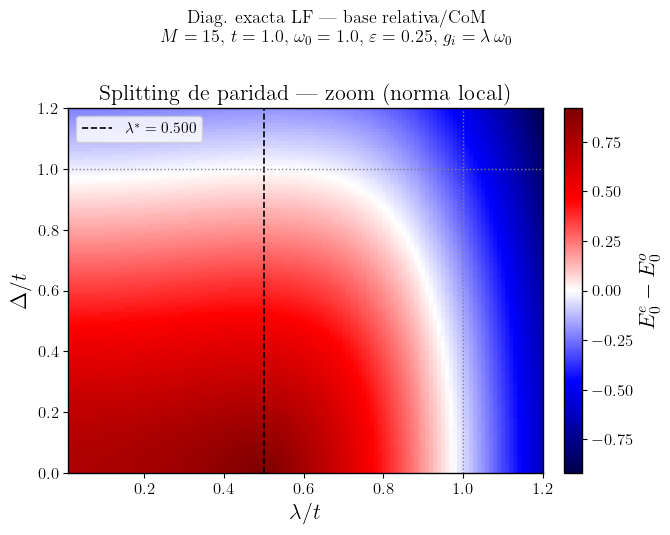

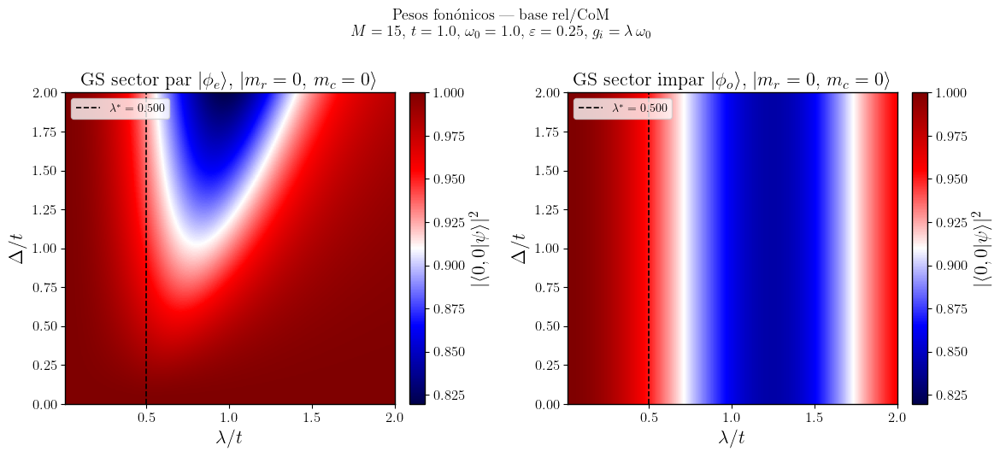

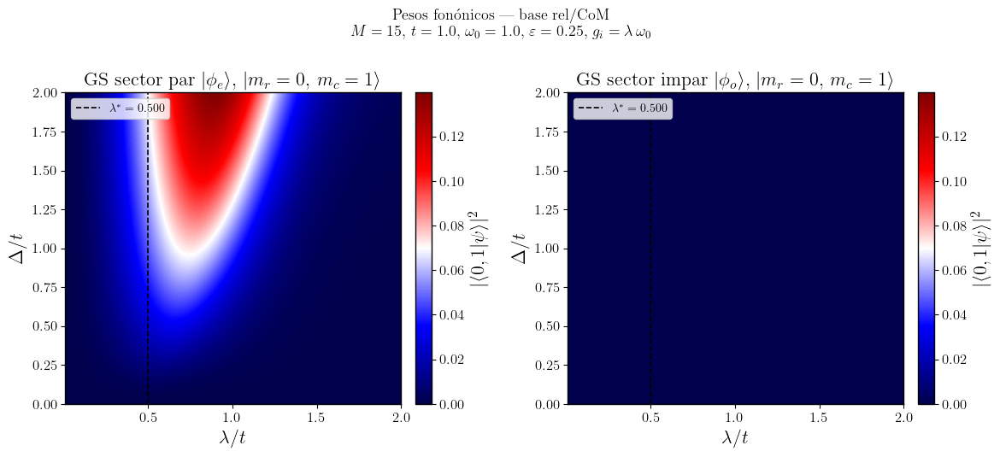

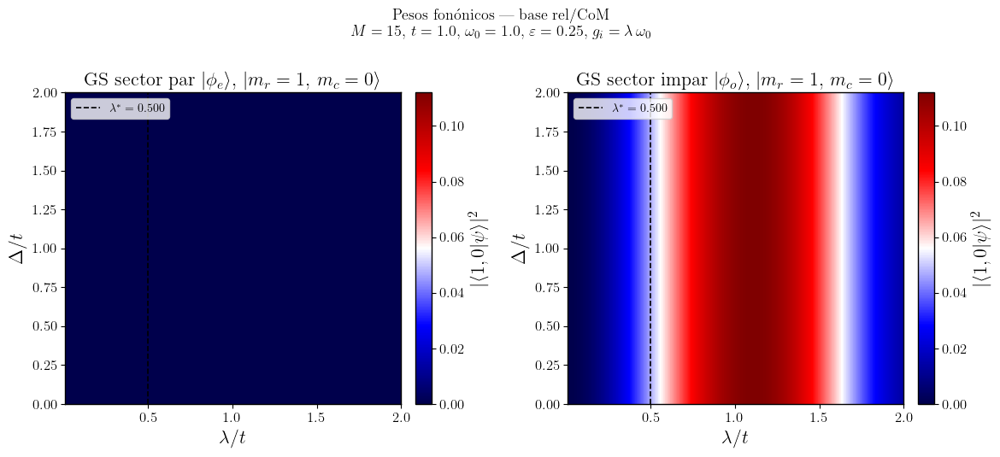

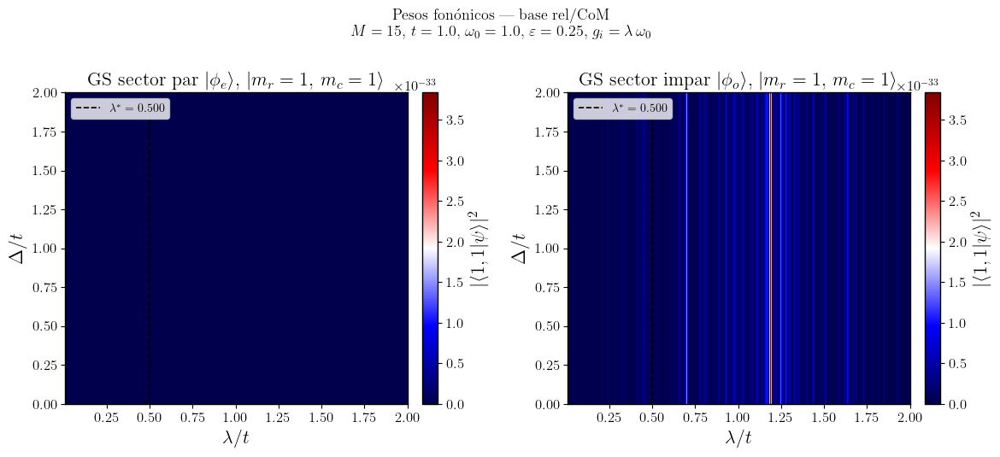

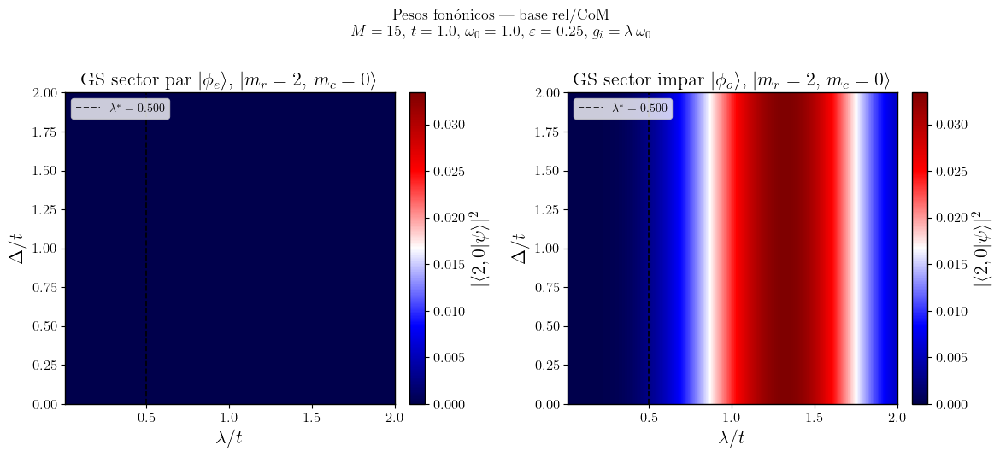

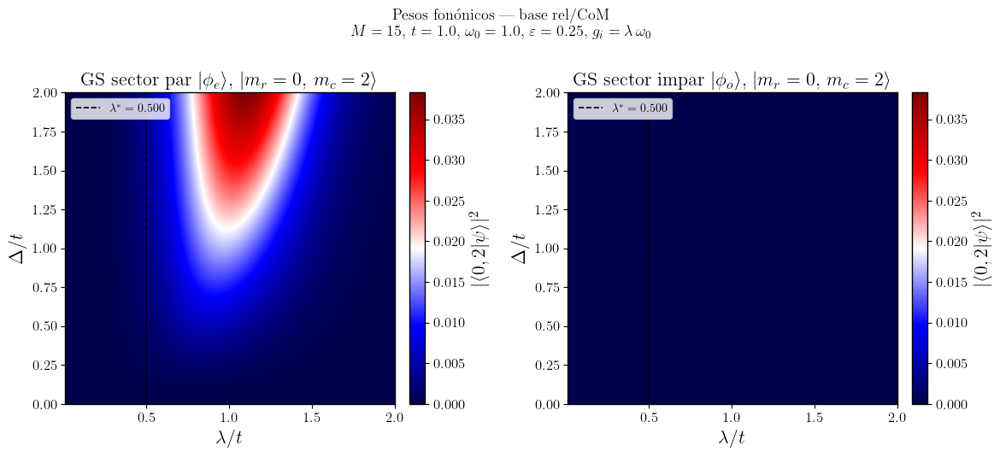

In [3]:
extent   = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
xlabel   = r'$\lambda/t$'
ylabel   = r'$\Delta/t$'
lam_star = np.sqrt(eps_val / omega0)
param_str = (
    rf"$M={M_max}$,  $t={t}$,  $\omega_0={omega0}$,  "
    rf"$\varepsilon={eps_val}$,  $g_i=\lambda\,\omega_0$"
)

# ── i.a  Mapa completo — splitting con signo ──────────────────────
vmax_p = np.max(np.abs(hmap_p))
norm_p = TwoSlopeNorm(vmin=-vmax_p, vcenter=0.0, vmax=vmax_p)

fig, ax = plt.subplots(figsize=(7, 5.5))
im = ax.imshow(hmap_p, origin='lower', aspect='auto',
               extent=extent, cmap='seismic', norm=norm_p)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$E^e_0 - E^o_0$')
ax.axvline(lam_star, color='black', ls='--', lw=1.2,
           label=rf'$\lambda^*={lam_star:.3f}$')
ax.set(xlabel=xlabel, ylabel=ylabel,
       title=r'Splitting de paridad $\delta E = E^e_0 - E^o_0$')
ax.legend(loc='upper left', fontsize=11)
fig.suptitle('Diag. exacta LF — base relativa/CoM\n' + param_str, fontsize=13)
plt.tight_layout()
plt.show()

# ── i.b  Zoom λ,Δ ∈ [0,1.2] — norma local ────────────────────────
lam_mask   = (lam_arr   >= 0.01) & (lam_arr   <= 1.2)
Delta_mask = (Delta_arr >= 0.0)  & (Delta_arr <= 1.2)

hmap_p_zoom = hmap_p[np.ix_(Delta_mask, lam_mask)]
vmax_zoom   = np.max(np.abs(hmap_p_zoom))
norm_zoom   = TwoSlopeNorm(vmin=-vmax_zoom, vcenter=0.0, vmax=vmax_zoom)

fig, ax = plt.subplots(figsize=(7, 5.5))
im = ax.imshow(hmap_p, origin='lower', aspect='auto',
               extent=extent, cmap='seismic', norm=norm_zoom)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$E^e_0 - E^o_0$')
ax.axvline(lam_star, color='black', ls='--', lw=1.2,
           label=rf'$\lambda^*={lam_star:.3f}$')
ax.axvline(1.0, color='gray', ls=':', lw=1.0)
ax.axhline(1.0, color='gray', ls=':', lw=1.0)
ax.set_xlim(0.01, 1.2)
ax.set_ylim(0.0,  1.2)
ax.set(xlabel=xlabel, ylabel=ylabel,
       title=r'Splitting de paridad — zoom (norma local)')
ax.legend(loc='upper left', fontsize=11)
fig.suptitle('Diag. exacta LF — base relativa/CoM\n' + param_str, fontsize=13)
plt.tight_layout()
plt.show()

# ── ii.  Pesos fonónicos por sector ───────────────────────────────
for (mr, mc), arrays in phonon_states.items():
    mn_str = rf'$|\langle {mr},{mc}|\psi\rangle|^2$'
    tag    = rf'$|m_r={mr},\,m_c={mc}\rangle$'

    vmax = 1.0 if (mr, mc) == (0, 0) else np.max([arrays["even"], arrays["odd"]])
    vmin = np.min([arrays["even"], arrays["odd"]])

    fig, axes = plt.subplots(1, 2, figsize=(12, 5.5))
    sector_labels = [r"par $|\phi_e\rangle$", r"impar $|\phi_o\rangle$"]

    for ax, label, data in zip(axes, sector_labels,
                                [arrays["even"], arrays["odd"]]):
        im = ax.imshow(data, origin='lower', aspect='auto',
                       extent=extent, cmap='seismic', vmin=vmin, vmax=vmax)
        cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cb.set_label(mn_str)
        ax.axvline(lam_star, color='black', ls='--', lw=1.2,
                   label=rf'$\lambda^*={lam_star:.3f}$')
        ax.legend(loc='upper left', fontsize=10)
        ax.set(xlabel=xlabel, ylabel=ylabel,
               title=rf'GS sector {label},  {tag}')

    fig.suptitle('Pesos fonónicos — base rel/CoM\n' + param_str, fontsize=13)
    plt.tight_layout()
    plt.show()


## Spectra analysis

In [3]:
# ── Parámetros para el espectro ───────────────────────────────────
t_spec      = 1.5
omega0_spec = 1.0
Delta_spec  = 1.5
eps_spec    = 0.25
M_max_spec  = 12
n_lam_spec  = 200

lam_arr_spec = np.linspace(0.01, 3.0, n_lam_spec)

# ── Cálculo del espectro ──────────────────────────────────────────
n_levels = 4

E_even = np.zeros((n_lam_spec, n_levels))
E_odd  = np.zeros((n_lam_spec, n_levels))

for j, lam in enumerate(tqdm(lam_arr_spec, desc="Espectro")):
    M_loc = get_M_CM(lam, M_max_spec)
    ev_e, _, ev_o, _, _, _ = diagonalize_CM(M=M_loc, eps=eps_spec, t=t_spec, Delta=Delta_spec, omega0=omega0_spec, lam=lam)
    E_even[j] = ev_e[:n_levels]
    E_odd[j]  = ev_o[:n_levels]

Espectro: 100%|██████████| 200/200 [00:12<00:00, 16.07it/s]


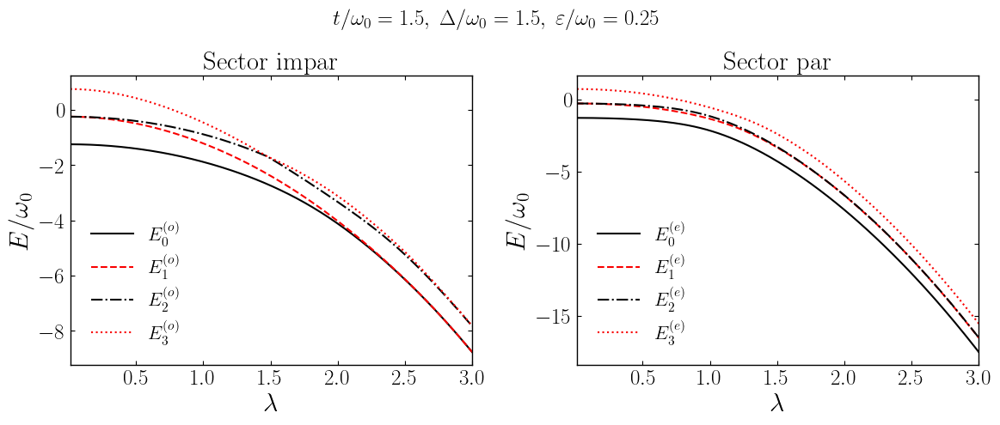

In [4]:
# ── Plot ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), sharey=False)

labels_odd  = [r'$E^{(o)}_0$', r'$E^{(o)}_1$', r'$E^{(o)}_2$', r'$E^{(o)}_3$']
labels_even = [r'$E^{(e)}_0$', r'$E^{(e)}_1$', r'$E^{(e)}_2$', r'$E^{(e)}_3$']

# 4 colores distintos, legibles en fondo blanco
level_colors = [ "#000000", "#f90000",  "#000000", "#f90000"]
lw = 1.5
ls_list = ['-', '--', '-.', ':']

# Panel izquierdo: sector impar
ax = axes[0]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_odd[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_odd[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel derecho: sector par
ax = axes[1]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_even[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_even[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig.suptitle(r'$t/\omega_0=1.5,\; \Delta/\omega_0=1.5, \;\varepsilon/\omega_0=0.25$', fontsize=18, y=0.925)
plt.tight_layout()
plt.show()

In [21]:
n_levels = 4

# ── Cálculo del espectro + pesos fonónicos ────────────────────────
E_even = np.zeros((n_lam_spec, n_levels))
E_odd  = np.zeros((n_lam_spec, n_levels))

# pesos[sector][estado, λ] para (0,0) y (0,1)
w00_even = np.zeros((n_lam_spec, n_levels))
w00_odd  = np.zeros((n_lam_spec, n_levels))
w01_even = np.zeros((n_lam_spec, n_levels))
w01_odd  = np.zeros((n_lam_spec, n_levels))

for j, lam in enumerate(tqdm(lam_arr_spec, desc="Espectro")):
    M_loc = get_M_CM(lam, M_max_spec)
    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps=eps_spec, t=t_spec,
        Delta=Delta_spec, omega0=omega0_spec, lam=lam
    )
    E_even[j] = ev_e[:n_levels]
    E_odd[j]  = ev_o[:n_levels]

    for k in range(n_levels):
        w00_even[j, k] = phonon_weight_CM(evec_e[:, k], 0, 0, nph, n_ph)
        w00_odd[j, k]  = phonon_weight_CM(evec_o[:, k], 0, 0, nph, n_ph)
        w01_even[j, k] = phonon_weight_CM(evec_e[:, k], 0, 1, nph, n_ph)
        w01_odd[j, k]  = phonon_weight_CM(evec_o[:, k], 1, 0, nph, n_ph)

print("¡Listo!")


Espectro: 100%|██████████| 200/200 [00:10<00:00, 18.65it/s]

¡Listo!


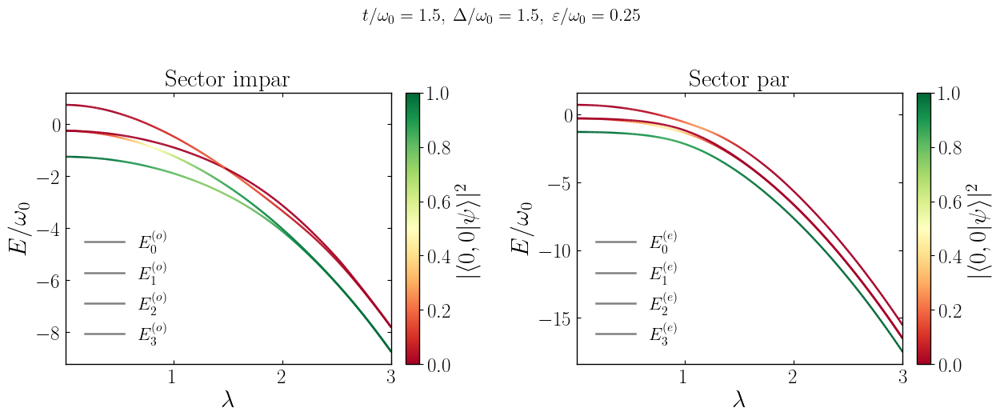

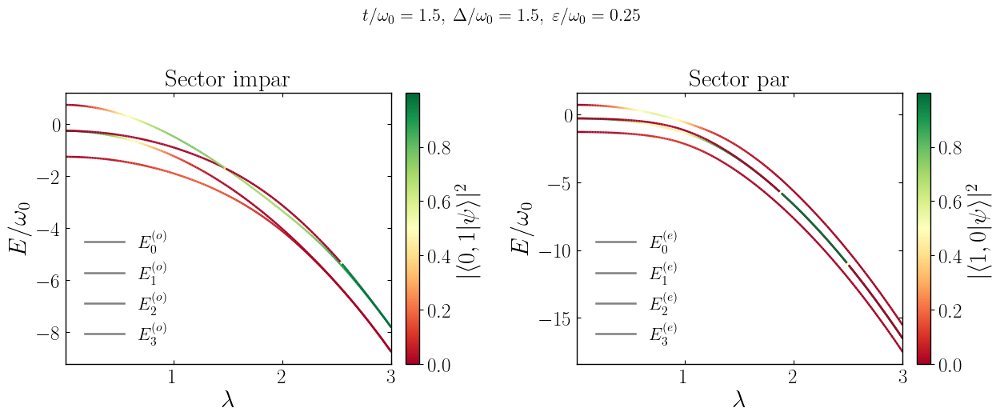

In [22]:

# ── Parámetros de coloración ──────────────────────────────────────
cmap = plt.cm.RdYlGn
lw   = 1.8
ls_list = ['-', '-', '-', '-']

labels_odd  = [r'$E^{(o)}_0$', r'$E^{(o)}_1$', r'$E^{(o)}_2$', r'$E^{(o)}_3$']
labels_even = [r'$E^{(e)}_0$', r'$E^{(e)}_1$', r'$E^{(e)}_2$', r'$E^{(e)}_3$']

def plot_spectrum_colored(ax, lam_arr, E_mat, weight_mat,
                          labels, ls_list, cmap, norm, lw=2.0):
    """Dibuja n_levels curvas coloreadas segmento a segmento."""
    n_pts, n_lev = E_mat.shape
    for k in range(n_lev):
        # Handle de leyenda: color = peso medio, estilo = nivel
        c_mean = cmap(norm(np.mean(weight_mat[:, k])))
        ax.plot([], [], ls=ls_list[k], color='gray', lw=lw, label=labels[k])
        for j in range(n_pts - 1):
            c_val = 0.5 * (weight_mat[j, k] + weight_mat[j+1, k])
            ax.plot(lam_arr[j:j+2], E_mat[j:j+2, k],
                    ls=ls_list[k], color=cmap(norm(c_val)),
                    lw=lw, solid_capstyle='butt')

# ══════════════════════════════════════════════════════════════════
# FIGURA 1 — coloreada por |<00|ψ>|²
# ══════════════════════════════════════════════════════════════════

norm00 = mcolors.Normalize(vmin=0.0, vmax=1.0)

fig1, axes1 = plt.subplots(1, 2, figsize=(13, 5.5))

# Panel impar
ax = axes1[0]
plot_spectrum_colored(ax, lam_arr_spec, E_odd,  w00_odd,
                      labels_odd,  ls_list, cmap, norm00, lw)
sm = ScalarMappable(cmap=cmap, norm=norm00)
sm.set_array([])
cb = fig1.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 0,0|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel par
ax = axes1[1]
plot_spectrum_colored(ax, lam_arr_spec, E_even, w00_even,
                      labels_even, ls_list, cmap, norm00, lw)
sm = ScalarMappable(cmap=cmap, norm=norm00)
sm.set_array([])
cb = fig1.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 0,0|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig1.suptitle(r'$t/\omega_0=1.5,\;\Delta/\omega_0=1.5,\;\varepsilon/\omega_0=0.25$',fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

# ══════════════════════════════════════════════════════════════════
# FIGURA 2 — coloreada por |<01|ψ>|²
# ══════════════════════════════════════════════════════════════════
vmax01 = w01_odd.max()
norm01 = mcolors.Normalize(vmin=0.0, vmax=vmax01)

vmax02 = w01_even.max()
norm02 = mcolors.Normalize(vmin=0.0, vmax=vmax02)

fig2, axes2 = plt.subplots(1, 2, figsize=(13, 5.5))

# Panel impar
ax = axes2[0]
plot_spectrum_colored(ax, lam_arr_spec, E_odd,  w01_odd,
                      labels_odd,  ls_list, cmap, norm01, lw)
sm = ScalarMappable(cmap=cmap, norm=norm01)
sm.set_array([])
cb = fig2.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 0,1|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel par
ax = axes2[1]
plot_spectrum_colored(ax, lam_arr_spec, E_even, w01_even,
                      labels_even, ls_list, cmap, norm02, lw)
sm = ScalarMappable(cmap=cmap, norm=norm02)
sm.set_array([])
cb = fig2.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 1,0|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig2.suptitle(r'$t/\omega_0=1.5,\;\Delta/\omega_0=1.5,\;\varepsilon/\omega_0=0.25$', fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

In [101]:
# ── Parámetros para el espectro ───────────────────────────────────
t_spec      = 1.0
omega0_spec = 1.0
Delta_spec  = 1.0
eps_spec    = 0.25
M_max_spec  = 12
n_lam_spec  = 100

lam_arr_spec = np.linspace(0.0, 3.0, n_lam_spec)

# ── Cálculo del espectro ──────────────────────────────────────────
n_levels = 4 

E_even = np.zeros((n_lam_spec, n_levels))
E_odd  = np.zeros((n_lam_spec, n_levels))

for j, lam in enumerate(tqdm(lam_arr_spec, desc="Espectro")):
    M_loc = get_M_CM(lam, M_max_spec)
    ev_e, _, ev_o, _, _, _ = diagonalize_CM(M=M_loc, eps=eps_spec, t=t_spec, Delta=Delta_spec, omega0=omega0_spec, lam=lam)
    E_even[j] = ev_e[:n_levels]
    E_odd[j]  = ev_o[:n_levels]

Espectro:   0%|          | 0/100 [00:00<?, ?it/s]

Espectro: 100%|██████████| 100/100 [00:10<00:00,  9.44it/s]


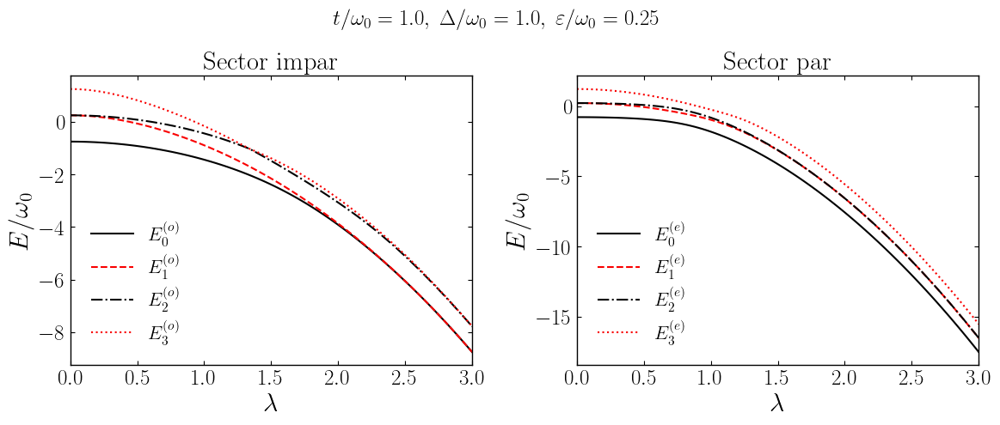

In [102]:
# ── Plot ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), sharey=False)

labels_odd  = [r'$E^{(o)}_0$', r'$E^{(o)}_1$', r'$E^{(o)}_2$', r'$E^{(o)}_3$']
labels_even = [r'$E^{(e)}_0$', r'$E^{(e)}_1$', r'$E^{(e)}_2$', r'$E^{(e)}_3$']

# 4 colores distintos, legibles en fondo blanco
level_colors = [ "#000000", "#f90000",  "#000000", "#f90000"]
lw = 1.5
ls_list = ['-', '--', '-.', ':']

# Panel izquierdo: sector impar
ax = axes[0]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_odd[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_odd[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel derecho: sector par
ax = axes[1]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_even[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_even[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig.suptitle(rf'$t/\omega_0={t_spec},\; \Delta/\omega_0={Delta_spec}, \;\varepsilon/\omega_0=0.25$', fontsize=18, y=0.925)
plt.tight_layout()
plt.show()

In [89]:
n_levels = 2
lam_arr_spec = np.linspace(1.0, 2.0, n_lam_spec)
# ── Cálculo del espectro + pesos fonónicos ────────────────────────
E_even = np.zeros((n_lam_spec, n_levels))
E_odd  = np.zeros((n_lam_spec, n_levels))

# pesos[sector][estado, λ] para (0,0) y (0,1)
w00_even = np.zeros((n_lam_spec, n_levels))
w00_odd  = np.zeros((n_lam_spec, n_levels))
w01_even = np.zeros((n_lam_spec, n_levels))
w01_odd  = np.zeros((n_lam_spec, n_levels))

for j, lam in enumerate(tqdm(lam_arr_spec, desc="Espectro")):
    M_loc = get_M_CM(lam, M_max_spec)
    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps=eps_spec, t=t_spec,
        Delta=Delta_spec, omega0=omega0_spec, lam=lam
    )
    E_even[j] = ev_e[:n_levels]
    E_odd[j]  = ev_o[:n_levels]

    for k in range(n_levels):
        w00_even[j, k] = phonon_weight_CM(evec_e[:, k], 0, 0, nph, n_ph)
        w00_odd[j, k]  = phonon_weight_CM(evec_o[:, k], 0, 0, nph, n_ph)
        w01_even[j, k] = phonon_weight_CM(evec_e[:, k], 0, 1, nph, n_ph)
        w01_odd[j, k]  = phonon_weight_CM(evec_o[:, k], 1, 0, nph, n_ph)

print("¡Listo!")


Espectro: 100%|██████████| 300/300 [00:29<00:00, 10.31it/s]

¡Listo!


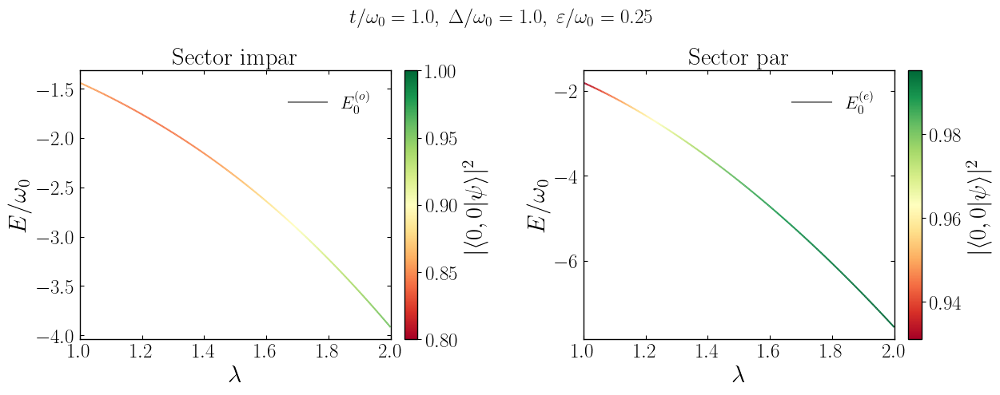

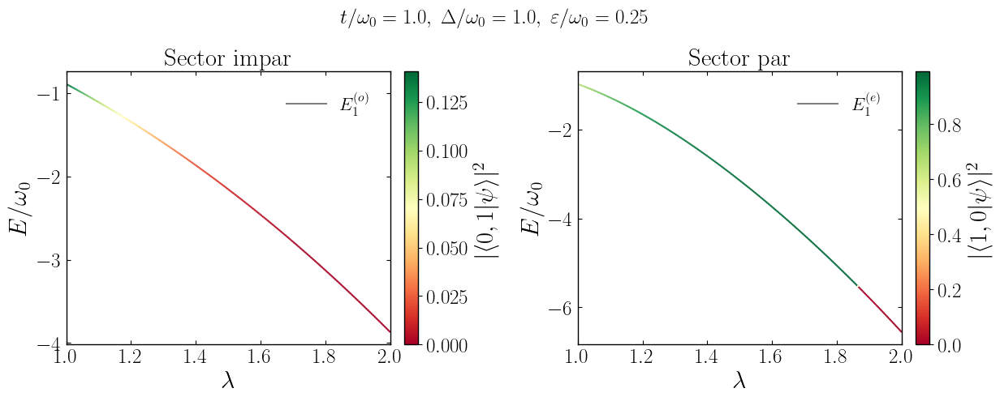

In [90]:

# ── Parámetros de coloración ──────────────────────────────────────
cmap = plt.cm.RdYlGn
lw   = 1.5
ls_list = ['-', '-', '-', '-']

labels_odd  = [r'$E^{(o)}_0$', r'$E^{(o)}_1$', r'$E^{(o)}_2$', r'$E^{(o)}_3$']
labels_even = [r'$E^{(e)}_0$', r'$E^{(e)}_1$', r'$E^{(e)}_2$', r'$E^{(e)}_3$']

def plot_spectrum_colored(ax, lam_arr, E_mat, weight_mat,
                          labels, ls_list, cmap, norm, lw=1.5,
                          levels=None):
    """Dibuja las curvas indicadas en `levels` coloreadas segmento a segmento.
    Si levels=None, dibuja todas."""
    n_pts, n_lev = E_mat.shape
    if levels is None:
        levels = range(n_lev)
    for k in levels:
        ax.plot([], [], ls=ls_list[k], color='gray', lw=lw, label=labels[k])
        for j in range(n_pts - 1):
            c_val = 0.5 * (weight_mat[j, k] + weight_mat[j+1, k])
            ax.plot(lam_arr[j:j+2], E_mat[j:j+2, k],
                    ls=ls_list[k], color=cmap(norm(c_val)),
                    lw=lw, solid_capstyle='butt')

# ══════════════════════════════════════════════════════════════════
# FIGURA 1 — coloreada por |<00|ψ>|²
# ══════════════════════════════════════════════════════════════════
vmin001 = w00_odd.min()
vmax001 = w00_odd.max()
norm001 = mcolors.Normalize(vmin=0.8, vmax=1.0)

vmin002 = w00_even.min()
vmax002 = w00_even.max()
norm002 = mcolors.Normalize(vmin=w00_even[:,0].min(), vmax=w00_even[:,0].max())


fig1, axes1 = plt.subplots(1, 2, figsize=(13, 5.5))

# Panel impar
ax = axes1[0]
plot_spectrum_colored(ax, lam_arr_spec, E_odd, w00_odd,
                      labels_odd, ls_list, cmap, norm001, lw, levels=[0])
sm = ScalarMappable(cmap=cmap, norm=norm001)
sm.set_array([])
cb = fig1.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 0,0|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel par
ax = axes1[1]
plot_spectrum_colored(ax, lam_arr_spec, E_even, w00_even,
                      labels_even, ls_list, cmap, norm002, lw, levels=[0])
sm = ScalarMappable(cmap=cmap, norm=norm002)
sm.set_array([])
cb = fig1.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 0,0|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig1.suptitle(r'$t/\omega_0=1.0,\;\Delta/\omega_0=1.0,\;\varepsilon/\omega_0=0.25$',fontsize=18, y=0.925)
plt.tight_layout()
plt.show()

# ══════════════════════════════════════════════════════════════════
# FIGURA 2 — coloreada por |<01|ψ>|²
# ══════════════════════════════════════════════════════════════════
vmax01 = w01_odd.max()
norm01 = mcolors.Normalize(vmin=0.0, vmax=vmax01)

vmax02 = w01_even.max()
norm02 = mcolors.Normalize(vmin=0.0, vmax=vmax02)

fig2, axes2 = plt.subplots(1, 2, figsize=(13, 5.5))

# Panel impar
ax = axes2[0]
plot_spectrum_colored(ax, lam_arr_spec, E_odd,  w01_odd,
                      labels_odd,  ls_list, cmap, norm01, lw, levels=[1])
sm = ScalarMappable(cmap=cmap, norm=norm01)
sm.set_array([])
cb = fig2.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 0,1|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel par
ax = axes2[1]
plot_spectrum_colored(ax, lam_arr_spec, E_even, w01_even,
                      labels_even, ls_list, cmap, norm02, lw, levels=[1])
sm = ScalarMappable(cmap=cmap, norm=norm02)
sm.set_array([])
cb = fig2.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$|\langle 1,0|\psi\rangle|^2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title('Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in',
               bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
          fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig2.suptitle(r'$t/\omega_0=1.0,\;\Delta/\omega_0=1.0,\;\varepsilon/\omega_0=0.25$', fontsize=18, y=0.925)
plt.tight_layout()
plt.show()

In [184]:
# ── Parámetros para el espectro ───────────────────────────────────
t_spec      = 0.5
omega0_spec = 1.0
Delta_spec  = 0.5
eps_spec    = 0.25
M_max_spec  = 15
n_lam_spec  = 200

lam_arr_spec = np.linspace(0.01, 3.0, n_lam_spec)

# ── Cálculo del espectro ──────────────────────────────────────────
n_levels = 4

E_even = np.zeros((n_lam_spec, n_levels))
E_odd  = np.zeros((n_lam_spec, n_levels))

for j, lam in enumerate(tqdm(lam_arr_spec, desc="Espectro")):
    M_loc = get_M_CM(lam, M_max_spec)
    ev_e, _, ev_o, _, _, _ = diagonalize_CM(M=M_loc, eps=eps_spec, t=t_spec, Delta=Delta_spec, omega0=omega0_spec, lam=lam)
    E_even[j] = ev_e[:n_levels]
    E_odd[j]  = ev_o[:n_levels]

Espectro: 100%|██████████| 200/200 [00:54<00:00,  3.69it/s]


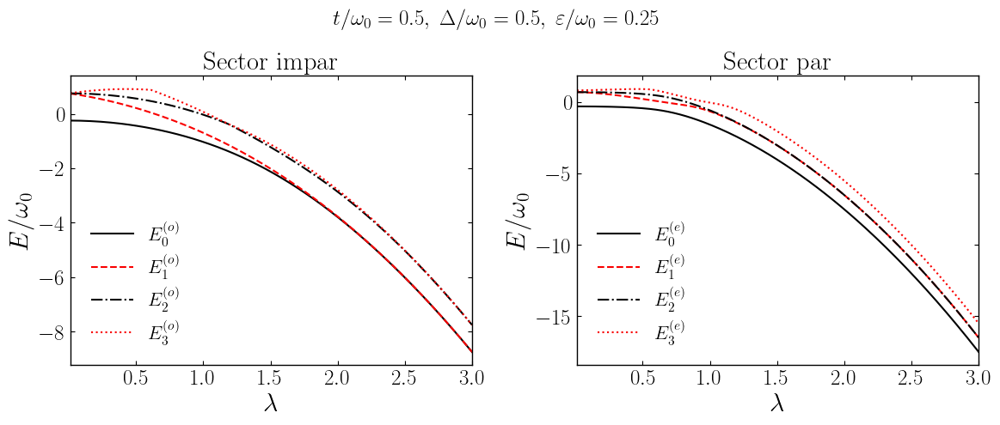

In [185]:
# ── Plot ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), sharey=False)

labels_odd  = [r'$E^{(o)}_0$', r'$E^{(o)}_1$', r'$E^{(o)}_2$', r'$E^{(o)}_3$']
labels_even = [r'$E^{(e)}_0$', r'$E^{(e)}_1$', r'$E^{(e)}_2$', r'$E^{(e)}_3$']

# 4 colores distintos, legibles en fondo blanco
level_colors = [ "#000000", "#f90000",  "#000000", "#f90000"]
lw = 1.5
ls_list = ['-', '--', '-.', ':']

# Panel izquierdo: sector impar
ax = axes[0]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_odd[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_odd[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel derecho: sector par
ax = axes[1]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_even[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_even[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig.suptitle(r'$t/\omega_0=0.5,\; \Delta/\omega_0=0.5, \;\varepsilon/\omega_0=0.25$', fontsize=18, y=0.925)
plt.tight_layout()
plt.show()

In [187]:
# ── Parámetros para el espectro ───────────────────────────────────
t_spec      = 2.0
omega0_spec = 1.0
Delta_spec  = 2.0
eps_spec    = 0.25
M_max_spec  = 20
n_lam_spec  = 200

lam_arr_spec = np.linspace(0.01, 3.0, n_lam_spec)

# ── Cálculo del espectro ──────────────────────────────────────────
n_levels = 4

E_even = np.zeros((n_lam_spec, n_levels))
E_odd  = np.zeros((n_lam_spec, n_levels))

for j, lam in enumerate(tqdm(lam_arr_spec, desc="Espectro")):
    M_loc = get_M_CM(lam, M_max_spec)
    ev_e, _, ev_o, _, _, _ = diagonalize_CM(M=M_loc, eps=eps_spec, t=t_spec, Delta=Delta_spec, omega0=omega0_spec, lam=lam)
    E_even[j] = ev_e[:n_levels]
    E_odd[j]  = ev_o[:n_levels]

Espectro:   0%|          | 0/200 [00:00<?, ?it/s]

Espectro: 100%|██████████| 200/200 [02:21<00:00,  1.42it/s]


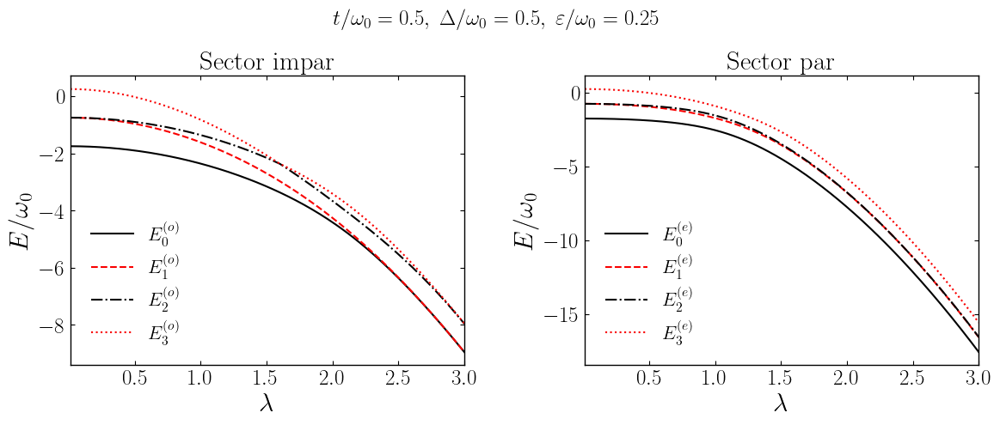

In [188]:
# ── Plot ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), sharey=False)

labels_odd  = [r'$E^{(o)}_0$', r'$E^{(o)}_1$', r'$E^{(o)}_2$', r'$E^{(o)}_3$']
labels_even = [r'$E^{(e)}_0$', r'$E^{(e)}_1$', r'$E^{(e)}_2$', r'$E^{(e)}_3$']

# 4 colores distintos, legibles en fondo blanco
level_colors = [ "#000000", "#f90000",  "#000000", "#f90000"]
lw = 1.5
ls_list = ['-', '--', '-.', ':']

# Panel izquierdo: sector impar
ax = axes[0]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_odd[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_odd[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector impar')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Panel derecho: sector par
ax = axes[1]
for k in range(n_levels):
    ax.plot(lam_arr_spec, E_even[:, k], ls=ls_list[k], color=level_colors[k], lw=lw, label=labels_even[k])
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E/\omega_0$')
ax.set_title(r'Sector par')
ax.set_xlim(lam_arr_spec[0], lam_arr_spec[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

fig.suptitle(r'$t/\omega_0=0.5,\; \Delta/\omega_0=0.5, \;\varepsilon/\omega_0=0.25$', fontsize=18, y=0.925)
plt.tight_layout()
plt.show()

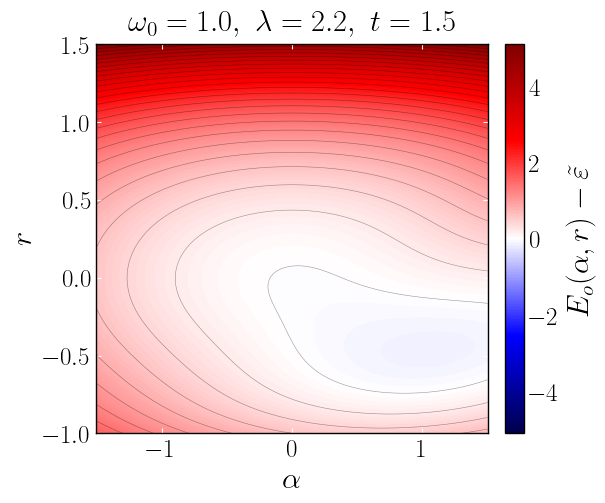

Mínimo global:  α = 1.0564   r = -0.4674   E−ε̃ = -0.1409


In [129]:
# ─── parámetros ──────────────────────────────────────────────────
omega0 = 1.0
lam    = 2.2
t      = 1.5
_S2    = np.sqrt(2.0)

# ─── malla (α, r) ────────────────────────────────────────────────
alpha = np.linspace(-1.5, 1.5, 400)
r     = np.linspace(-1.0, 1.5, 400)
A, R  = np.meshgrid(alpha, r)

# ─── superficie  E_o(α,r) − ε̃  ───────────────────────────────────
E = omega0*(A**2/4.0 + np.sinh(R)**2) \
    - t*np.exp(-0.5*(_S2*lam - A)**2 * np.exp(2.0*R))

# ─── heatmap ─────────────────────────────────────────────────────
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

vmax = np.max(np.abs(E))
vmin = np.min(np.abs(E))
norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

fig, ax = plt.subplots(figsize=(6.5, 5.5))
extent = [alpha[0], alpha[-1], r[0], r[-1]]
im = ax.imshow(E, origin='lower', aspect='auto', extent=extent,
               cmap='seismic', norm=norm)

cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$E_o(\alpha,r)-\tilde{\varepsilon}$')

ax.set_xlabel(r'$\alpha$')
ax.set_ylabel(r'$r$')
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, color='white')

# (opcional) contornos para resaltar las cuencas
ax.contour(A, R, E, levels=30, colors='k', linewidths=0.4, alpha=0.4)

ax.set_title(rf'$\omega_0={omega0},\ \lambda={lam},\ t={t}$', pad=10)

plt.tight_layout()
plt.savefig(f'Resultados/Superficie_Eo_lam{lam}t{t}.png', bbox_inches='tight',transparent=False, dpi=300)
plt.show()

# diagnóstico: posición del mínimo global
imin = np.unravel_index(np.argmin(E), E.shape)
print(f"Mínimo global:  α = {A[imin]:.4f}   r = {R[imin]:.4f}   "
      f"E−ε̃ = {E[imin]:.4f}")

Mínimo global:  α = 0.3346   r = -0.0288   E−ε̃ = -0.4395


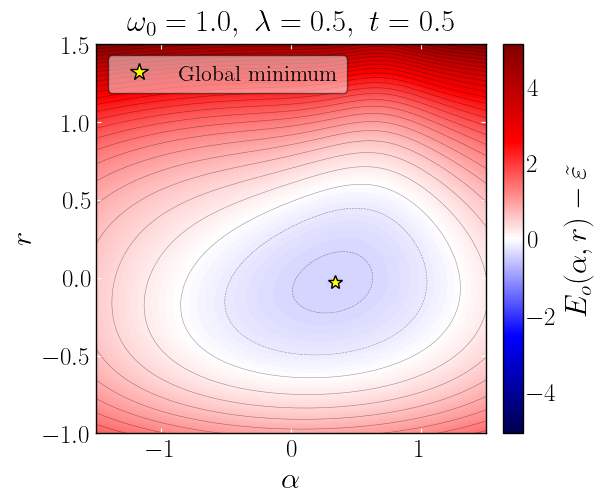

In [170]:
import matplotlib.lines as mlines
from scipy.ndimage import minimum_filter

# ─── parámetros ──────────────────────────────────────────────────
omega0 = 1.0
lam    = 0.5
t      = 0.5
_S2    = np.sqrt(2.0)

# ─── malla (α, r) ────────────────────────────────────────────────
alpha = np.linspace(-1.5, 1.5, 400)
r     = np.linspace(-1.0, 1.5, 400)
A, R  = np.meshgrid(alpha, r)

# ─── superficie  E_o(α,r) − ε̃  ───────────────────────────────────
E = omega0*(A**2/4.0 + np.sinh(R)**2) \
    - t*np.exp(-0.5*(_S2*lam - A)**2 * np.exp(2.0*R))

# ─── mínimo global ───────────────────────────────────────────────
imin = np.unravel_index(np.argmin(E), E.shape)
a_glob, r_glob = A[imin], R[imin]
print(f"Mínimo global:  α = {a_glob:.4f}   r = {r_glob:.4f}   E−ε̃ = {E[imin]:.4f}")

# ─── heatmap ─────────────────────────────────────────────────────
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

vmax = np.max(np.abs(E))
norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

fig, ax = plt.subplots(figsize=(6.5, 5.5))
extent = [alpha[0], alpha[-1], r[0], r[-1]]
im = ax.imshow(E, origin='lower', aspect='auto', extent=extent,
               cmap='seismic', norm=norm)

cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$E_o(\alpha,r)-\tilde{\varepsilon}$')

ax.set_xlabel(r'$\alpha$')
ax.set_ylabel(r'$r$')
ax.tick_params(axis='both', direction='in', bottom=True, top=True,
               left=True, right=True, color='white')

ax.contour(A, R, E, levels=30, colors='k', linewidths=0.4, alpha=0.4)
ax.set_title(rf'$\omega_0={omega0},\ \lambda={lam},\ t={t}$', pad=10)

# ─── marcador del mínimo global ──────────────────────────────────
ax.plot(a_glob, r_glob, marker='*', ms=10, mfc='yellow', mec='k', mew=1.0, ls='none', zorder=5)

# ─── leyenda en la esquina superior derecha ──────────────────────
handles = [mlines.Line2D([], [], marker='*', ms=13, mfc='yellow', mec='k', mew=1.0, ls='none', label='Global minimum')]

ax.legend(handles=handles,
          loc='upper left', frameon=True, edgecolor='black', framealpha=0.5)

fig.subplots_adjust(left=0.13, right=0.86, top=0.90, bottom=0.12)
plt.tight_layout()
plt.savefig(f'Resultados/Superficie_Eo_lam{lam}t{t}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

In [173]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib.colors import TwoSlopeNorm
from matplotlib.animation import FuncAnimation, PillowWriter

# ─── parámetros fijos ────────────────────────────────────────────
omega0 = 1.0
t      = 1.5
_S2    = np.sqrt(2.0)

# ─── malla (α, r) ────────────────────────────────────────────────
alpha = np.linspace(-1.5, 1.5, 400)
r     = np.linspace(-1.0, 1.5, 400)
A, R  = np.meshgrid(alpha, r)
extent = [alpha[0], alpha[-1], r[0], r[-1]]

# ─── barrido de λ ────────────────────────────────────────────────
lam_arr = np.linspace(0.0, 3.0, 120)      # 120 frames

def E_surface(lam):
    return omega0*(A**2/4.0 + np.sinh(R)**2) \
           - t*np.exp(-0.5*(_S2*lam - A)**2 * np.exp(2.0*R))

# ─── escala de color FIJA (común a todos los frames) ─────────────
# se calcula con el λ que da el mayor rango, para que el colormap no
# "salte" entre frames
vmax_global = max(np.max(np.abs(E_surface(l))) for l in lam_arr)
norm = TwoSlopeNorm(vmin=-vmax_global, vcenter=0.0, vmax=vmax_global)

# ─── figura base ─────────────────────────────────────────────────
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# después de crear fig, ax, la colorbar y las etiquetas, ANTES de FuncAnimation:


fig, ax = plt.subplots(figsize=(6.5, 5.5))

E0 = E_surface(lam_arr[0])
im = ax.imshow(E0, origin='lower', aspect='auto', extent=extent,
               cmap='seismic', norm=norm)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(r'$E_o(\alpha,r)-\tilde{\varepsilon}$')

ax.set_xlabel(r'$\alpha$')
ax.set_ylabel(r'$r$')
ax.tick_params(axis='both', direction='in', bottom=True, top=True,
               left=True, right=True, color='white')

# objetos que se actualizan cada frame
contour_holder = [ax.contour(A, R, E0, levels=30, colors='k',
                             linewidths=0.4, alpha=0.4)]
star, = ax.plot([], [], marker='*', ms=10, mfc='yellow', mec='k',
                mew=1.0, ls='none', zorder=5)
title = ax.set_title('', pad=10)

handles = [mlines.Line2D([], [], marker='*', ms=13, mfc='yellow', mec='k',
                         mew=1.0, ls='none', label='Global minimum')]
ax.legend(handles=handles, loc='upper left',
          frameon=True, edgecolor='black', framealpha=0.5)

fig.subplots_adjust(left=0.13, right=0.86, top=0.90, bottom=0.12)

# ─── función de actualización ────────────────────────────────────
def update(k):
    lam = lam_arr[k]
    E = E_surface(lam)

    im.set_data(E)                                  # nueva superficie

    # recalcular contornos (hay que borrar los viejos)
    for coll in contour_holder[0].collections:
        coll.remove()
    contour_holder[0] = ax.contour(A, R, E, levels=30, colors='k',
                                   linewidths=0.4, alpha=0.4)

    # mínimo global
    imin = np.unravel_index(np.argmin(E), E.shape)
    star.set_data([A[imin]], [R[imin]])

    title.set_text(rf'$\omega_0={omega0},\ \lambda={lam:.2f},\ t={t}$')
    print(f"\rFrame {k+1}/{len(lam_arr)}", end='', flush=True)  
    return im, star, title

# ─── animación y guardado ────────────────────────────────────────
anim = FuncAnimation(fig, update, frames=len(lam_arr), blit=False)

writer = PillowWriter(fps=10)
anim.save(f'Resultados/Superficie_Eo_barrido_lambda_t{t}.gif', writer=writer, dpi=120)
plt.close(fig)
print("GIF guardado en Resultados/Superficie_Eo_barrido_lambda.gif")

Frame 120/120GIF guardado en Resultados/Superficie_Eo_barrido_lambda.gif


# General results: Photonic sector

## Functions

In [2]:
# ══════════════════════════════════════════════════════════════════
# CELDA 1 — FUNCIONES
# ══════════════════════════════════════════════════════════════════

# ─── Operadores fonónicos (idéntico a la base de sitio) ───────────
def _phonon_ops_CM(nph):
    m    = np.arange(nph, dtype=float)
    off1 = np.sqrt(m[1:])
    Q    = np.diag(off1, -1) + np.diag(off1,  1)   # a + a†
    D    = np.diag(off1, -1) - np.diag(off1,  1)   # a† - a
    k    = np.arange(nph - 2, dtype=float)
    off2 = np.sqrt((k + 2) * (k + 1))
    R    = np.diag(off2, -2) + np.diag(off2,  2)   # a² + a†²
    return m, Q, D, R


# ─── Observables — un bloque electrónico ─────────────────────────
def _block_obs_CM(psi, nm, np_, lam, m, Q, D, R):
    """
    Calcula observables fonónicos para un bloque en la base rel/CoM.

    psi  : (nph, nph)   filas = m_r,  cols = m_c
    nm   : eigenvalor de n̂₋ en este bloque  (0, +1, −1)
    np_  : eigenvalor de n̂₊ en este bloque  (0,  1,  2)
    lam  : acoplamiento λ = g/ω₀

    Fórmulas (marco LF, tilde λ̃ = λ/√2):
      ⟨m̂_r⟩   = n_r + nm²(λ²/2)w − nm(λ/√2)q_r
      ⟨m̂_c⟩   = n_c + np²(λ²/2)w − np(λ/√2)q_c
      ⟨m̂_r²⟩  = n_r_sq + (λ²/2)nm²(r_r+4n_r+w)
                + (λ⁴/4)nm⁴w − (λ³/√2)nm³q_r
                − √2λ nm⟨N_r Q_r⟩ − (λ/√2)nm d_r
      ⟨X_r²⟩  = ½(r_r + 2n_r + w − 2√2λ nm q_r + 2λ²nm²w)
      ⟨P_r²⟩  = ½(2n_r − r_r + w)   [invariante LF]
      ⟨n̂₋X̂_r⟩ = (nm q_r − √2λ nm² w)/√2
      ⟨n̂₊X̂_r⟩ = (np q_r − √2λ nm np w)/√2
      ⟨n̂₋X̂_c⟩ = (nm q_c − √2λ nm np w)/√2
      ⟨n̂₊X̂_c⟩ = (np q_c − √2λ np² w)/√2
      ⟨X̂_r X̂_c⟩ = ½(q_r_q_c − √2λ np q_r − √2λ nm q_c + 2λ²nm np w)
    """
    prob   = np.abs(psi)**2
    w      = float(prob.sum())

    n_r    = float((m[:, None]    * prob).sum())
    n_c    = float((m[None, :]    * prob).sum())
    n_r_sq = float((m[:, None]**2 * prob).sum())
    n_c_sq = float((m[None, :]**2 * prob).sum())

    Qp_r = Q @ psi;      Qp_c = psi @ Q
    Rp_r = R @ psi;      Rp_c = psi @ R
    Dp_r = D @ psi;      Dp_c = -(psi @ D)    # signo por transpuesto

    def ev(A): return float(np.real((psi.conj() * A).sum()))

    q_r = ev(Qp_r);   q_c = ev(Qp_c)
    r_r = ev(Rp_r);   r_c = ev(Rp_c)
    d_r = ev(Dp_r);   d_c = ev(Dp_c)

    n_r_q_r = ev(m[:, None] * Qp_r)   # ⟨N_r Q_r⟩
    n_c_q_c = ev(m[None, :] * Qp_c)   # ⟨N_c Q_c⟩
    q_r_q_c = ev(Qp_r @ Q)            # ⟨Q_r Q_c⟩

    sq2 = np.sqrt(2)
    l   = lam
    l2  = lam**2;  l3 = lam**3;  l4 = lam**4
    nm2 = nm**2;   nm3 = nm**3;  nm4 = nm**4
    np2 = np_**2;  np3 = np_**3; np4 = np_**4

    # ── ⟨m̂_r⟩, ⟨m̂_c⟩ ───────────────────────────────────────────
    m_r = n_r + nm2*(l2/2)*w  - nm *(l/sq2)*q_r
    m_c = n_c + np2*(l2/2)*w  - np_*(l/sq2)*q_c

    # ── ⟨m̂_r²⟩, ⟨m̂_c²⟩ ─────────────────────────────────────────
    m_r_sq = (n_r_sq
              + (l2/2)*nm2*(r_r + 4*n_r + w)
              + (l4/4)*nm4*w
              - (l3/sq2)*nm3*q_r
              - sq2*l*nm *n_r_q_r
              - (l/sq2) *nm *d_r)

    m_c_sq = (n_c_sq
              + (l2/2)*np2*(r_c + 4*n_c + w)
              + (l4/4)*np4*w
              - (l3/sq2)*np3*q_c
              - sq2*l*np_*n_c_q_c
              - (l/sq2) *np_*d_c)

    # ── Cuadraturas ───────────────────────────────────────────────
    X_r_sq = 0.5*(r_r + 2*n_r + w - 2*sq2*l*nm *q_r + 2*l2*nm2*w)
    X_c_sq = 0.5*(r_c + 2*n_c + w - 2*sq2*l*np_*q_c + 2*l2*np2*w)
    P_r_sq = 0.5*(2*n_r - r_r + w)
    P_c_sq = 0.5*(2*n_c - r_c + w)

    X_r = (q_r - sq2*l*nm *w) / sq2
    X_c = (q_c - sq2*l*np_*w) / sq2

    # ── Correlaciones ⟨n̂± X̂_k⟩ ──────────────────────────────────
    nm_Xr = (nm *q_r - sq2*l*nm2     *w) / sq2
    np_Xr = (np_*q_r - sq2*l*nm*np_  *w) / sq2
    nm_Xc = (nm *q_c - sq2*l*nm*np_  *w) / sq2
    np_Xc = (np_*q_c - sq2*l*np2     *w) / sq2

    # ── ⟨X̂_r X̂_c⟩ ───────────────────────────────────────────────
    X_r_X_c = 0.5*(q_r_q_c
                   - sq2*l*np_*q_r
                   - sq2*l*nm *q_c
                   + 2*l2*nm*np_*w)

    DP_r_sq = P_r_sq + d_r**2 / 2.0
    DP_c_sq = P_c_sq + d_c**2 / 2.0

    return dict(w=w,
                m_r=m_r, m_c=m_c, m_r_sq=m_r_sq, m_c_sq=m_c_sq,
                X_r_sq=X_r_sq, X_c_sq=X_c_sq,
                P_r_sq=P_r_sq, P_c_sq=P_c_sq,
                X_r=X_r, X_c=X_c,
                nm_Xr=nm_Xr, np_Xr=np_Xr,
                nm_Xc=nm_Xc, np_Xc=np_Xc,
                X_r_X_c=X_r_X_c,
                DP_r_sq=DP_r_sq, DP_c_sq=DP_c_sq)


# ─── Suma sobre los dos bloques electrónicos ──────────────────────
def compute_observables_CM(evec, nph, n_ph, lam, sector):
    """
    Suma las contribuciones de los dos bloques electrónicos.

    Eigenvalores de (n̂₋, n̂₊) por bloque:
      sector even:  bloque A → |0,0⟩ (nm=0, np=0)
                    bloque B → |1,1⟩ (nm=0, np=2)
      sector odd :  bloque A → |1,0⟩ (nm=+1, np=1)
                    bloque B → |0,1⟩ (nm=−1, np=1)
    """
    norm  = np.dot(evec.conj(), evec).real
    inv   = 1.0 / np.sqrt(norm)
    psi_A = (evec[:n_ph] * inv).reshape(nph, nph)
    psi_B = (evec[n_ph:] * inv).reshape(nph, nph)

    m, Q, D, R = _phonon_ops_CM(nph)

    if sector == 'even':
        nm_A, np_A =  0, 0
        nm_B, np_B =  0, 2
    else:
        nm_A, np_A =  1, 1
        nm_B, np_B = -1, 1

    obsA = _block_obs_CM(psi_A, nm_A, np_A, lam, m, Q, D, R)
    obsB = _block_obs_CM(psi_B, nm_B, np_B, lam, m, Q, D, R)

    def S(k): return obsA[k] + obsB[k]

    m_r = S('m_r');  m_c = S('m_c')
    mr_sq = S('m_r_sq');  mc_sq = S('m_c_sq')
    X_r   = S('X_r');    X_c   = S('X_c')

    var_r = mr_sq - m_r**2
    var_c = mc_sq - m_c**2
    F_r = var_r / m_r if m_r > 1e-10 else np.nan
    F_c = var_c / m_c if m_c > 1e-10 else np.nan

    return dict(
        m_r=m_r,  m_c=m_c,  m_tot=m_r + m_c,
        F_r=F_r,  F_c=F_c,
        X_r_sq=S('X_r_sq'),  X_c_sq=S('X_c_sq'),
        P_r_sq=S('P_r_sq'),  P_c_sq=S('P_c_sq'),
        DX_r_sq=S('X_r_sq') - X_r**2,
        DX_c_sq=S('X_c_sq') - X_c**2,
        nm_Xr=S('nm_Xr'),  np_Xr=S('np_Xr'),
        nm_Xc=S('nm_Xc'),  np_Xc=S('np_Xc'),
        X_r_X_c=S('X_r_X_c'),
        DP_r_sq=S('DP_r_sq'),  DP_c_sq=S('DP_c_sq'),
    )


# ─── Función por punto ────────────────────────────────────────────
def compute_point_CM_obs(j, i, lam, Delta):
    M_loc = get_M_CM(lam, M_max)

    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps=eps_val, t=t, Delta=Delta, omega0=omega0, lam=lam)

    if ev_e[0] <= ev_o[0]:
        gs_vec, sector, sec_int = evec_e[:, 0], 'even', 0
    else:
        gs_vec, sector, sec_int = evec_o[:, 0], 'odd',  1

    obs = compute_observables_CM(gs_vec, nph, n_ph, lam, sector)
    obs['sector'] = sec_int
    return j, i, obs

print("Funciones rel/CoM cargadas.")

Funciones rel/CoM cargadas.


In [3]:
def _block_quadratures_CM(psi_raw, nm, np_, lam, m, Q, D, R):
    """
    ΔX² y ΔP² del modo relativo y CoM para un bloque electrónico,
    normalizando el bloque internamente (no globalmente).

    psi_raw : (nph, nph) SIN normalizar globalmente; filas=m_r, cols=m_c
    nm      : eigenvalor de n̂₋  (0, ±1)
    np_     : eigenvalor de n̂₊  (0, 1, 2)
    """
    w = float(np.sum(np.abs(psi_raw)**2))
    _nan = dict(w=0.0,
                X_r_sq=np.nan, X_c_sq=np.nan,
                P_r_sq=np.nan, P_c_sq=np.nan,
                DX_r_sq=np.nan, DX_c_sq=np.nan,
                DP_r_sq=np.nan, DP_c_sq=np.nan)
    if w < 1e-15:
        return _nan

    psi  = psi_raw / np.sqrt(w)
    prob = np.abs(psi)**2

    def ev(A): return float(np.real((psi.conj() * A).sum()))

    n_r = float((m[:, None] * prob).sum())
    n_c = float((m[None, :] * prob).sum())

    Qp_r = Q @ psi;    Qp_c = psi @ Q
    Rp_r = R @ psi;    Rp_c = psi @ R
    Dp_r = D @ psi;    Dp_c = -(psi @ D)

    q_r = ev(Qp_r);    q_c = ev(Qp_c)
    r_r = ev(Rp_r);    r_c = ev(Rp_c)
    d_r = ev(Dp_r);    d_c = ev(Dp_c)

    X_r_sq = 0.5 * (r_r + 2*n_r + 1.0)
    X_c_sq = 0.5 * (r_c + 2*n_c + 1.0)
    P_r_sq = 0.5 * (2*n_r - r_r + 1.0)
    P_c_sq = 0.5 * (2*n_c - r_c + 1.0)

    X_r = q_r / np.sqrt(2);    X_c = q_c / np.sqrt(2)
    P_r = d_r / np.sqrt(2);    P_c = d_c / np.sqrt(2)

    DX_r_sq = X_r_sq - X_r**2
    DX_c_sq = X_c_sq - X_c**2
    DP_r_sq = P_r_sq - P_r**2
    DP_c_sq = P_c_sq - P_c**2

    return dict(w=w,
                X_r_sq=X_r_sq, X_c_sq=X_c_sq,
                P_r_sq=P_r_sq, P_c_sq=P_c_sq,
                DX_r_sq=DX_r_sq, DX_c_sq=DX_c_sq,
                DP_r_sq=DP_r_sq, DP_c_sq=DP_c_sq)


def compute_phi_contributions_CM(evec, nph, n_ph, lam, sector):
    """
    Cuadraturas de |φ₁⟩ y |φ₂⟩ para el sector indicado.
    """
    inv   = 1.0 / np.sqrt(max(np.dot(evec.conj(), evec).real, 1e-30))
    psi_A = (evec[:n_ph] * inv).reshape(nph, nph)
    psi_B = (evec[n_ph:] * inv).reshape(nph, nph)

    m, Q, D, R = _phonon_ops_CM(nph)

    if sector == 'even':
        nm_A, np_A =  0, 0
        nm_B, np_B =  0, 2
    else:
        nm_A, np_A =  1, 1
        nm_B, np_B = -1, 1

    phi1 = _block_quadratures_CM(psi_A, nm_A, np_A, lam, m, Q, D, R)
    phi2 = _block_quadratures_CM(psi_B, nm_B, np_B, lam, m, Q, D, R)
    return phi1, phi2


def compute_point_CM_quad(j, i, lam, Delta):
    """
    Calcula cuadraturas por bloque para AMBOS sectores independientemente.
    Cada sector usa siempre su propio GS, sin comparar energías.

    Claves de salida:
      odd_phi1_*  → bloque A (|10⟩) del sector impar
      odd_phi2_*  → bloque B (|01⟩) del sector impar
      even_phi1_* → bloque A (|00⟩) del sector par
      even_phi2_* → bloque B (|11⟩) del sector par
      sector      → 0=par / 1=impar (solo informativo, no filtra)
    """
    M_loc = get_M_CM(lam, M_max)

    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps=eps_val, t=t, Delta=Delta, omega0=omega0, lam=lam)

    phi1_o, phi2_o = compute_phi_contributions_CM(
        evec_o[:, 0], nph, n_ph, lam, sector='odd')
    phi1_e, phi2_e = compute_phi_contributions_CM(
        evec_e[:, 0], nph, n_ph, lam, sector='even')

    sec_int = 0 if ev_e[0] <= ev_o[0] else 1

    obs = {'sector': sec_int,
           'E_even': float(ev_e[0]),
           'E_odd' : float(ev_o[0])}

    QUAD_KEYS = ('w', 'DX_r_sq', 'DX_c_sq', 'DP_r_sq', 'DP_c_sq')
    for prefix, src in [('odd_phi1',  phi1_o),
                        ('odd_phi2',  phi2_o),
                        ('even_phi1', phi1_e),
                        ('even_phi2', phi2_e)]:
        for k in QUAD_KEYS:
            obs[f'{prefix}_{k}'] = src[k]

    return j, i, obs



## Results

In [3]:
# ══════════════════════════════════════════════════════════════════
# CELDA 2 — EJECUCIÓN
# ══════════════════════════════════════════════════════════════════

t       = 1.0
omega0  = 1.0
eps_val = 0.25
M_max   = 15

n_lam, n_Delta = 500, 500
lam_arr   = np.linspace(0.01, 2.0, n_lam)
Delta_arr = np.linspace(0.0,  2.0, n_Delta)

all_args = [(j, i, lam, Delta)
            for j, lam   in enumerate(lam_arr)
            for i, Delta in enumerate(Delta_arr)]
n_total = n_lam * n_Delta
print(f"Grid: {n_lam}×{n_Delta} = {n_total:,} puntos")

# ─── Cálculo paralelo ────────────────────────────────────────────
with tqdm_joblib(tqdm(desc="Puntos completados", total=n_total, unit="pt")) as _:
    results = joblib.Parallel(n_jobs=-1, prefer='processes')(
        joblib.delayed(compute_point_CM_obs)(*args) for args in all_args)

# ─── Reconstrucción de arrays 2D ─────────────────────────────────
OBS_KEYS_CM = ['m_r', 'm_c', 'm_tot', 'F_r', 'F_c',
               'X_r_sq', 'X_c_sq', 'P_r_sq', 'P_c_sq',
               'DX_r_sq', 'DX_c_sq',
               'nm_Xr', 'np_Xr', 'nm_Xc', 'np_Xc',
               'X_r_X_c', 'DP_r_sq', 'DP_c_sq', 'sector']

hmaps_CM = {k: np.zeros((n_Delta, n_lam)) for k in OBS_KEYS_CM}
for j, i, obs in results:
    for k in OBS_KEYS_CM:
        hmaps_CM[k][i, j] = obs[k]

# ─── Correlaciones normalizadas ⟨n̂± X̂_k⟩ / λ ───────────────────
lam_grid = lam_arr[None, :]   # (1, n_lam) → broadcast a (n_Delta, n_lam)
for k in ['nm_Xr', 'np_Xr', 'nm_Xc', 'np_Xc']:
    with np.errstate(divide='ignore', invalid='ignore'):
        hmaps_CM[k + '_norm'] = np.where(
            lam_grid > 1e-10, hmaps_CM[k] / lam_grid, np.nan)

OBS_KEYS_CM += ['nm_Xr_norm', 'np_Xr_norm', 'nm_Xc_norm', 'np_Xc_norm']

print("\n¡Listo!")
for k in ['m_r', 'm_c', 'F_r', 'F_c']:
    arr = hmaps_CM[k]
    print(f"  {k}: [{np.nanmin(arr):.4f}, {np.nanmax(arr):.4f}]")


Grid: 500×500 = 250,000 puntos


Puntos completados:   0%|          | 24/250000 [00:04<11:41:08,  5.94pt/s]


NameError: name 'compute_observables_CM' is not defined

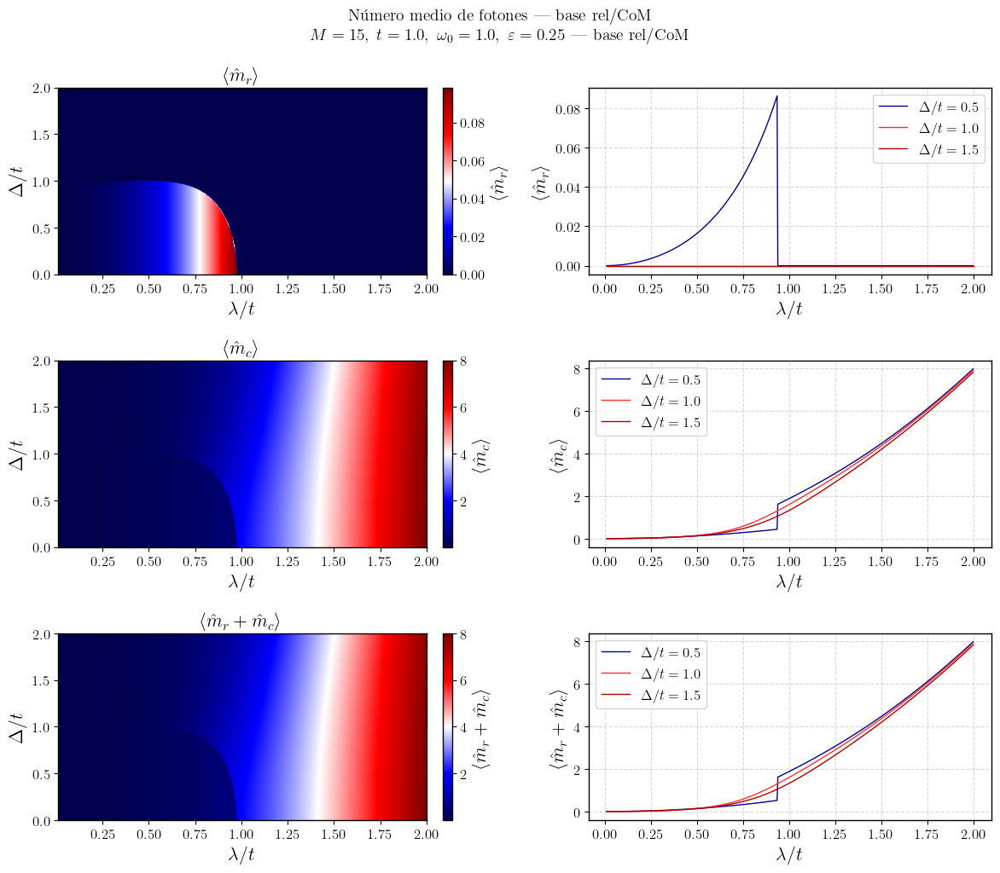

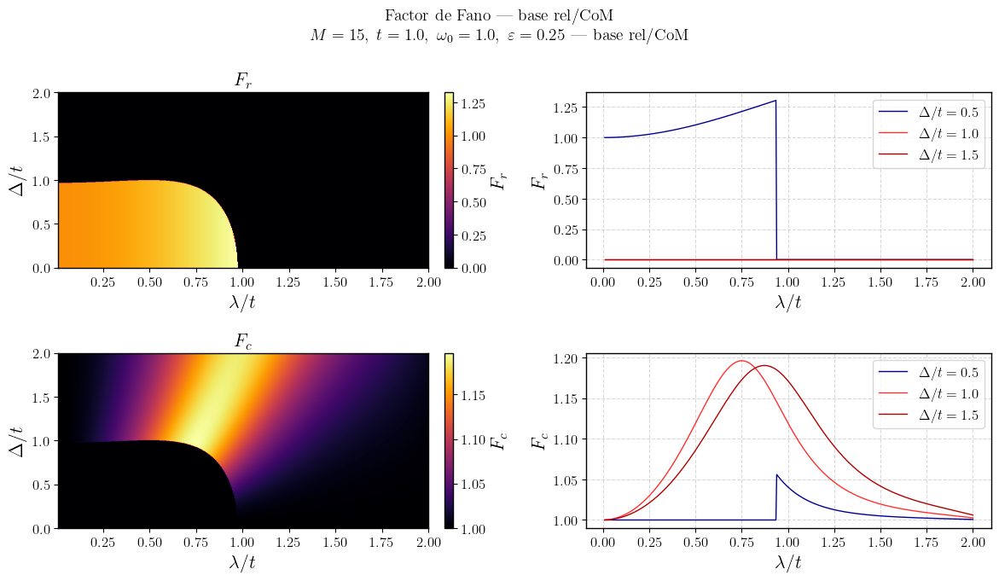

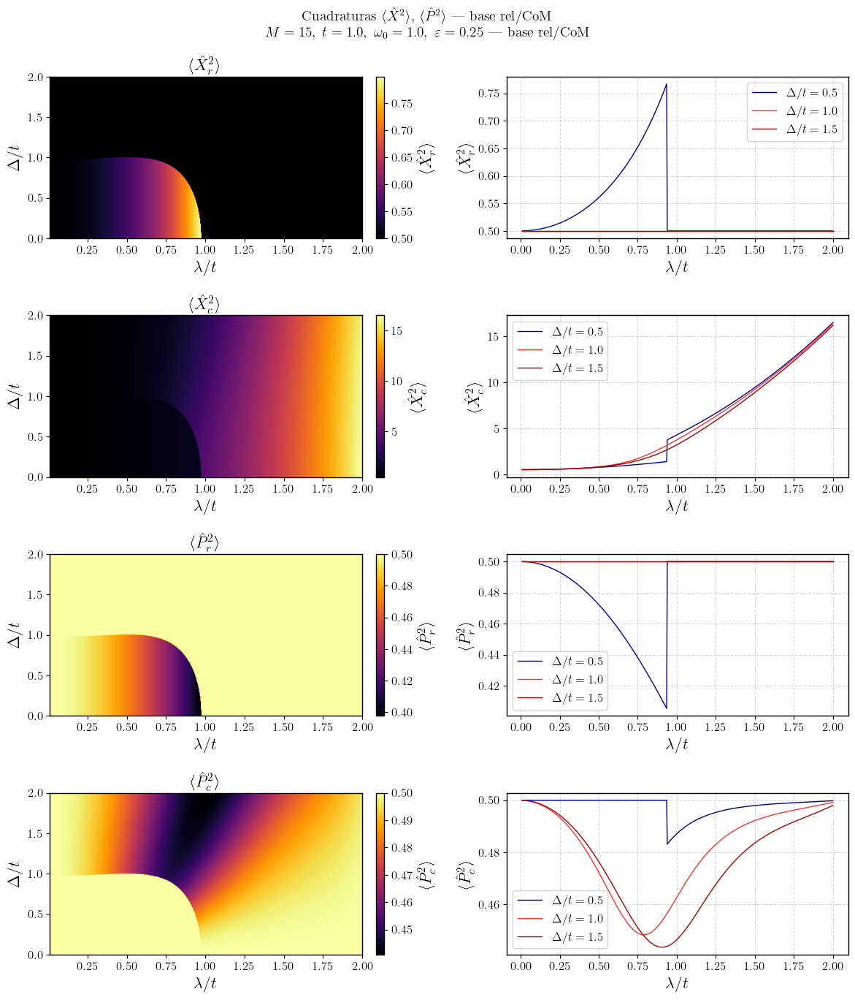

$(\Delta\hat{X}_r)^2$: min=0.5000  max=0.7992
$(\Delta\hat{X}_c)^2$: min=0.5000  max=0.6206
$(\Delta\hat{P}_r)^2$: min=0.3978  max=0.5000
$(\Delta\hat{P}_c)^2$: min=0.4408  max=0.5000


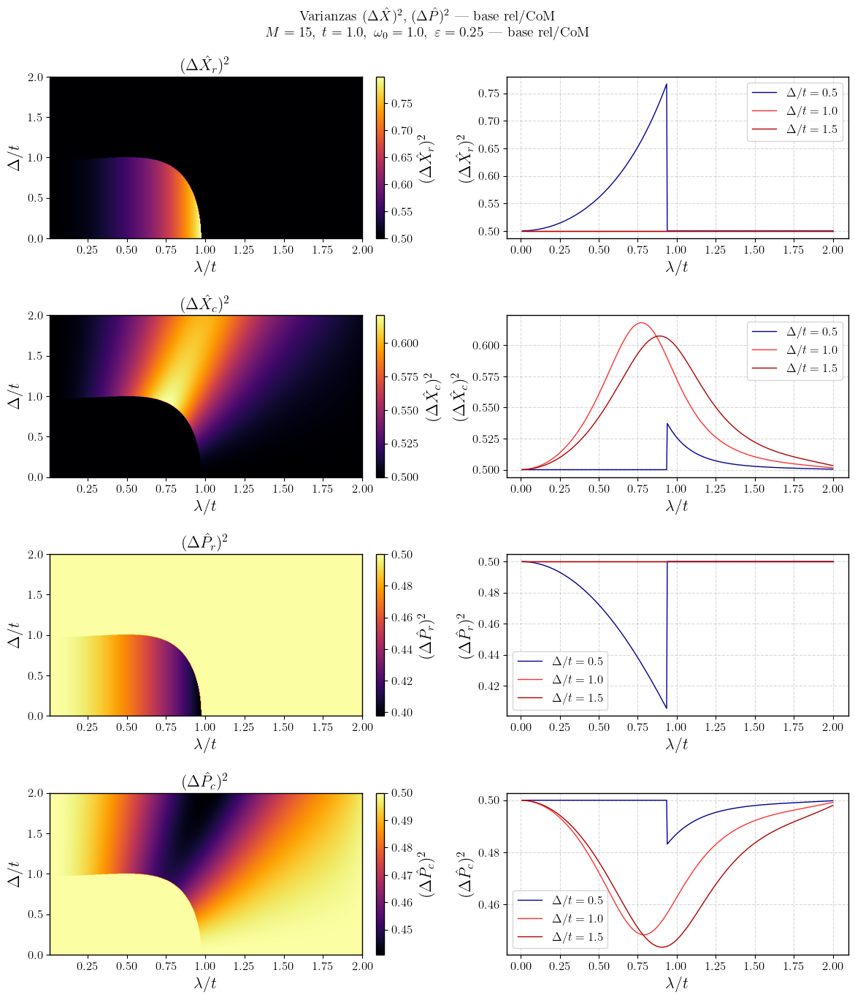

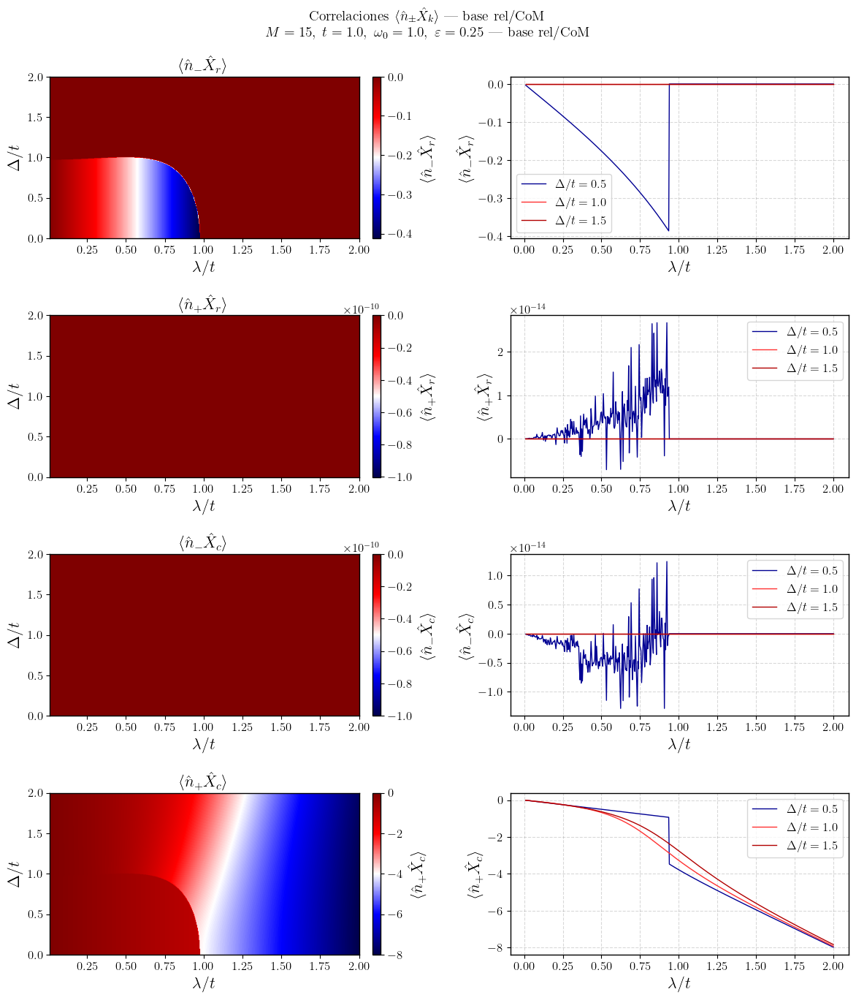

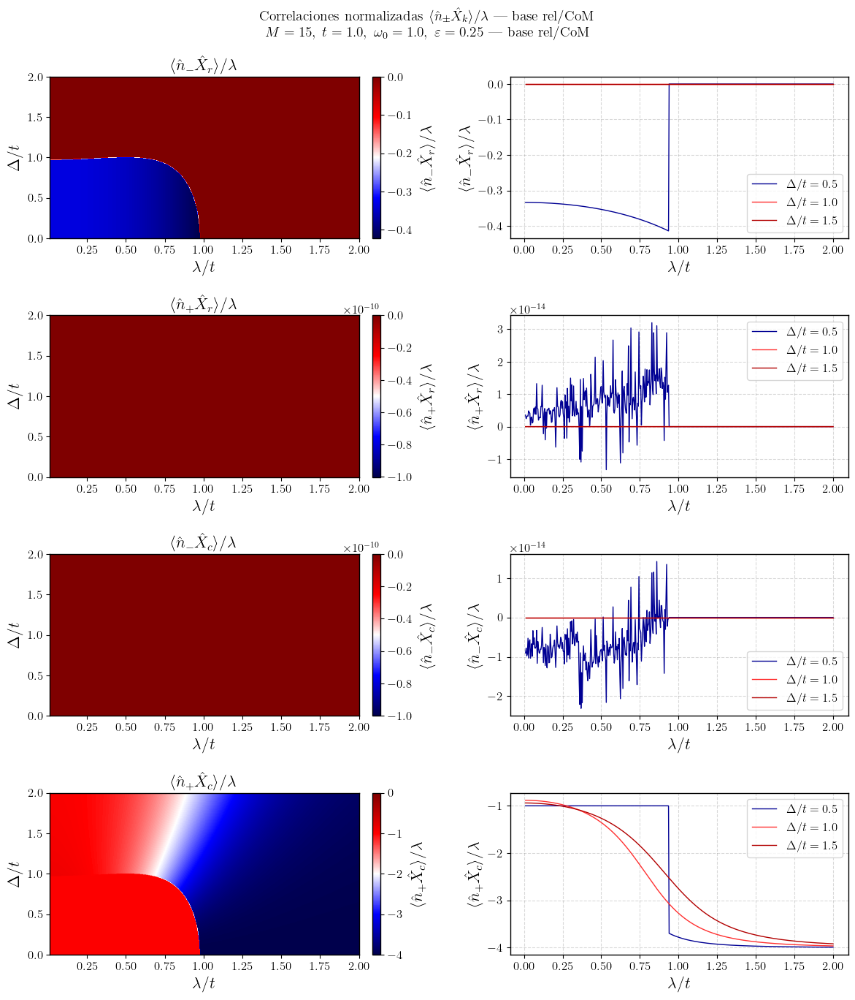

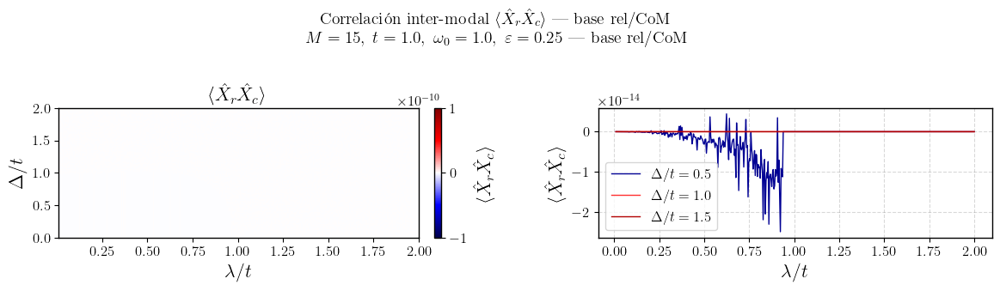

In [ ]:
# ══════════════════════════════════════════════════════════════════
# CELDA 3 — GRAFICACIÓN
# ══════════════════════════════════════════════════════════════════

extent   = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
xlabel   = r'$\lambda/t$'
ylabel   = r'$\Delta/t$'
lam_star = np.sqrt(eps_val / omega0)
pstr     = (rf"$M={M_max},\;t={t},\;\omega_0={omega0},\;"
            rf"\varepsilon={eps_val}$  —  base rel/CoM")

cut_Deltas  = [0.5, 1.0, 1.5]
cut_indices = [np.argmin(np.abs(Delta_arr - d)) for d in cut_Deltas]

C_BLUE = plt.cm.seismic(0.10)
C_RED1 = plt.cm.seismic(0.70)
C_RED2 = plt.cm.seismic(0.90)
CUT_COLORS = [C_BLUE, C_RED1, C_RED2]

h = 3.5

def _heatmap_cuts(fig, ax_l, ax_r, data, title,
                  cmap='seismic', vmin=None, vmax=None,
                  clabel=None, plot_ref=False):
    im = ax_l.imshow(data, origin='lower', aspect='auto',
                     extent=extent, cmap=cmap, vmin=vmin, vmax=vmax)
    cb = fig.colorbar(im, ax=ax_l, fraction=0.046, pad=0.04)
    if clabel: cb.set_label(clabel)
    ax_l.set(title=title, xlabel=xlabel, ylabel=ylabel)

    for idx, d_val, col in zip(cut_indices, cut_Deltas, CUT_COLORS):
        ax_r.plot(lam_arr, data[idx, :],
                  label=rf'$\Delta/t={d_val}$', lw=1.0, color=col)
    if plot_ref:
        ax_r.plot(lam_arr, lam_arr**2, 'k--', lw=1.0,
                  alpha=0.5, label=r'$(\lambda/t)^2$')
    ax_r.set_xlabel(xlabel)
    ax_r.set_ylabel(clabel or title)
    ax_r.legend()
    ax_r.grid(alpha=0.3, ls='--')

# ── 1. Número medio de fotones ────────────────────────────────────
fig, axes = plt.subplots(3, 2, figsize=(12, 3*h))
for i, (k, ttl, ref) in enumerate(zip(
        ['m_r', 'm_c', 'm_tot'],
        [r'$\langle\hat{m}_r\rangle$',
         r'$\langle\hat{m}_c\rangle$',
         r'$\langle\hat{m}_r+\hat{m}_c\rangle$'],
        [True, True, False])):
    _heatmap_cuts(fig, axes[i,0], axes[i,1], hmaps_CM[k],
                  ttl, cmap='seismic', clabel=ttl)
fig.suptitle('Número medio de fotones — base rel/CoM\n' + pstr)
plt.tight_layout(); plt.show()

# ── 2. Factor de Fano ─────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(12, 2*h))
for i, (k, ttl) in enumerate(zip(['F_r', 'F_c'],
                                   [r'$F_r$', r'$F_c$'])):
    data = np.where(np.isnan(hmaps_CM[k]), 0.0, hmaps_CM[k])
    _heatmap_cuts(fig, axes[i,0], axes[i,1], data, ttl,
                  cmap='inferno',
                  vmin=np.nanmin(data), vmax=np.nanmax(data), clabel=ttl)
fig.suptitle('Factor de Fano — base rel/CoM\n' + pstr)
plt.tight_layout(); plt.show()

# ── 3. Cuadraturas ⟨X²⟩ y ⟨P²⟩ ──────────────────────────────────
fig, axes = plt.subplots(4, 2, figsize=(12, 4*h))
for i, (k, ttl, cm) in enumerate(zip(
        ['X_r_sq', 'X_c_sq', 'P_r_sq', 'P_c_sq'],
        [r'$\langle\hat{X}_r^2\rangle$', r'$\langle\hat{X}_c^2\rangle$',
         r'$\langle\hat{P}_r^2\rangle$', r'$\langle\hat{P}_c^2\rangle$'],
        ['inferno', 'inferno', 'inferno', 'inferno'])):
    _heatmap_cuts(fig, axes[i,0], axes[i,1], hmaps_CM[k],
                  ttl, cmap=cm, clabel=ttl)
fig.suptitle(r'Cuadraturas $\langle\hat{X}^2\rangle$, $\langle\hat{P}^2\rangle$ — base rel/CoM'
             '\n' + pstr)
plt.tight_layout(); plt.show()

# ── 4. Varianzas (ΔX)² y (ΔP)² ───────────────────────────────────
fig, axes = plt.subplots(4, 2, figsize=(12, 4*h))
for i, (k, ttl) in enumerate(zip(
        ['DX_r_sq', 'DX_c_sq', 'DP_r_sq', 'DP_c_sq'],
        [r'$(\Delta\hat{X}_r)^2$', r'$(\Delta\hat{X}_c)^2$',
         r'$(\Delta\hat{P}_r)^2$', r'$(\Delta\hat{P}_c)^2$'])):
    vmax = np.nanmax(np.abs(hmaps_CM[k])) + 1e-10
    _heatmap_cuts(fig, axes[i,0], axes[i,1], hmaps_CM[k], ttl,
                  cmap='inferno',
                  vmin=np.nanmin(hmaps_CM[k]), vmax=vmax, clabel=ttl)
    print(f"{ttl}: min={np.nanmin(hmaps_CM[k]):.4f}  max={np.nanmax(hmaps_CM[k]):.4f}")
fig.suptitle(r'Varianzas $(\Delta\hat{X})^2$, $(\Delta\hat{P})^2$ — base rel/CoM'
             '\n' + pstr)
plt.tight_layout(); plt.show()

# ── 5. Correlaciones ⟨n̂± X̂_k⟩ ───────────────────────────────────
fig, axes = plt.subplots(4, 2, figsize=(12, 4*h))
for i, (k, ttl) in enumerate(zip(
        ['nm_Xr', 'np_Xr', 'nm_Xc', 'np_Xc'],
        [r'$\langle\hat{n}_-\hat{X}_r\rangle$',
         r'$\langle\hat{n}_+\hat{X}_r\rangle$',
         r'$\langle\hat{n}_-\hat{X}_c\rangle$',
         r'$\langle\hat{n}_+\hat{X}_c\rangle$'])):
    vmax = np.nanmax(np.abs(hmaps_CM[k])) + 1e-10
    _heatmap_cuts(fig, axes[i,0], axes[i,1], hmaps_CM[k], ttl,
                  cmap='seismic', vmin=-vmax, vmax=0, clabel=ttl)
fig.suptitle(r'Correlaciones $\langle\hat{n}_\pm\hat{X}_k\rangle$ — base rel/CoM'
             '\n' + pstr)
plt.tight_layout(); plt.show()

# ── 6. Correlaciones normalizadas ⟨n̂± X̂_k⟩ / λ ──────────────────
fig, axes = plt.subplots(4, 2, figsize=(12, 4*h))
for i, (k, ttl) in enumerate(zip(
        ['nm_Xr_norm', 'np_Xr_norm', 'nm_Xc_norm', 'np_Xc_norm'],
        [r'$\langle\hat{n}_-\hat{X}_r\rangle/\lambda$',
         r'$\langle\hat{n}_+\hat{X}_r\rangle/\lambda$',
         r'$\langle\hat{n}_-\hat{X}_c\rangle/\lambda$',
         r'$\langle\hat{n}_+\hat{X}_c\rangle/\lambda$'])):
    data = hmaps_CM[k]
    vmax = np.nanmax(np.abs(data)) + 1e-10
    _heatmap_cuts(fig, axes[i,0], axes[i,1], data, ttl,
                  cmap='seismic', vmin=-vmax, vmax=0, clabel=ttl)
fig.suptitle(r'Correlaciones normalizadas $\langle\hat{n}_\pm\hat{X}_k\rangle/\lambda$'
             ' — base rel/CoM\n' + pstr)
plt.tight_layout(); plt.show()

# ── 7. Correlación inter-modal ⟨X̂_r X̂_c⟩ ───────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, h))
vmax = np.nanmax(np.abs(hmaps_CM['X_r_X_c'])) + 1e-10
_heatmap_cuts(fig, axes[0], axes[1], hmaps_CM['X_r_X_c'],
              r'$\langle\hat{X}_r\hat{X}_c\rangle$',
              cmap='seismic', vmin=-vmax, vmax=vmax,
              clabel=r'$\langle\hat{X}_r\hat{X}_c\rangle$')
fig.suptitle(r'Correlación inter-modal $\langle\hat{X}_r\hat{X}_c\rangle$'
             ' — base rel/CoM\n' + pstr)
plt.tight_layout(); plt.show()

## Results per block

In [20]:
# ─── Función por punto — AMBOS sectores por separado ─────────────
def compute_point_CM_obs(j, i, lam, Delta):
    M_loc = get_M_CM(lam, M_max)

    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps=eps_val, t=t, Delta=Delta, omega0=omega0, lam=lam)

    # GS de CADA sector (no se elige el de menor energía)
    obs_e = compute_observables_CM(evec_e[:, 0], nph, n_ph, lam, 'even')
    obs_o = compute_observables_CM(evec_o[:, 0], nph, n_ph, lam, 'odd')

    # guardar también qué sector sería el GS global (por si lo quieres)
    obs_e['is_gs'] = 1.0 if ev_e[0] <= ev_o[0] else 0.0
    obs_o['is_gs'] = 1.0 if ev_o[0] <  ev_e[0] else 0.0

    return j, i, obs_e, obs_o

  # ══════════════════════════════════════════════════════════════════
# CELDA 2 — EJECUCIÓN (observables por sector, separados)
# ══════════════════════════════════════════════════════════════════
t       = 1.0
omega0  = 1.0
eps_val = 0.25
M_max   = 15

n_lam, n_Delta = 150, 150
lam_arr   = np.linspace(0.01, 3.0, n_lam)
Delta_arr = np.linspace(0.01,  3.0, n_Delta)

all_args = [(j, i, lam, Delta)
            for j, lam   in enumerate(lam_arr)
            for i, Delta in enumerate(Delta_arr)]
n_total = n_lam * n_Delta
print(f"Grid: {n_lam}×{n_Delta} = {n_total:,} puntos")

with tqdm_joblib(tqdm(desc="Puntos completados", total=n_total, unit="pt")) as _:
    results = joblib.Parallel(n_jobs=-1, prefer='processes')(
        joblib.delayed(compute_point_CM_obs)(*args) for args in all_args)

# ─── Reconstrucción: un set de arrays POR SECTOR ─────────────────
OBS_KEYS_CM = ['m_r', 'm_c', 'm_tot', 'F_r', 'F_c',
               'X_r_sq', 'X_c_sq', 'P_r_sq', 'P_c_sq',
               'DX_r_sq', 'DX_c_sq',
               'nm_Xr', 'np_Xr', 'nm_Xc', 'np_Xc',
               'X_r_X_c', 'DP_r_sq', 'DP_c_sq', 'is_gs']

hmaps_e = {k: np.zeros((n_Delta, n_lam)) for k in OBS_KEYS_CM}
hmaps_o = {k: np.zeros((n_Delta, n_lam)) for k in OBS_KEYS_CM}
for j, i, obs_e, obs_o in results:
    for k in OBS_KEYS_CM:
        hmaps_e[k][i, j] = obs_e[k]
        hmaps_o[k][i, j] = obs_o[k]

# ─── Correlaciones normalizadas ⟨n̂± X̂_k⟩ / λ, por sector ───────
lam_grid = lam_arr[None, :]
for hmaps in (hmaps_e, hmaps_o):
    for k in ['nm_Xr', 'np_Xr', 'nm_Xc', 'np_Xc']:
        with np.errstate(divide='ignore', invalid='ignore'):
            hmaps[k + '_norm'] = np.where(
                lam_grid > 1e-10, hmaps[k] / lam_grid, np.nan)

OBS_KEYS_CM += ['nm_Xr_norm', 'np_Xr_norm', 'nm_Xc_norm', 'np_Xc_norm']

print("\n¡Listo! (observables por sector)")
for k in ['m_r', 'm_c', 'F_r', 'F_c']:
    print(f"  {k}: even=[{np.nanmin(hmaps_e[k]):.3f}, {np.nanmax(hmaps_e[k]):.3f}]"
          f"  odd=[{np.nanmin(hmaps_o[k]):.3f}, {np.nanmax(hmaps_o[k]):.3f}]")  

Grid: 150×150 = 22,500 puntos


Puntos completados:   0%|          | 0/22500 [00:00<?, ?pt/s]

Puntos completados: 100%|██████████| 22500/22500 [18:29<00:00, 20.28pt/s] 



¡Listo! (observables por sector)
  m_r: even=[0.000, 0.000]  odd=[0.000, 4.372]
  m_c: even=[0.000, 18.000]  odd=[0.000, 4.500]
  F_r: even=[nan, nan]  odd=[1.000, 1.480]
  F_c: even=[0.955, 1.413]  odd=[1.000, 1.000]


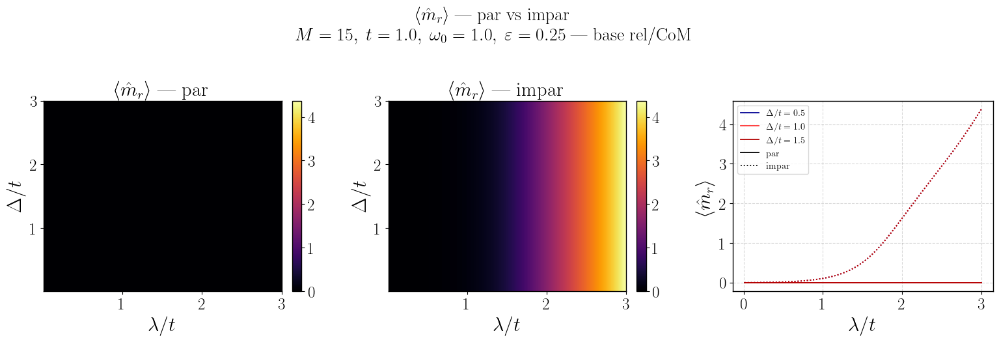

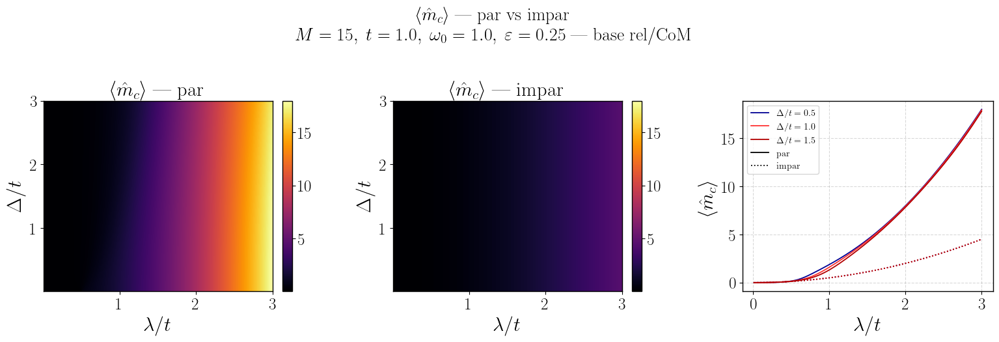

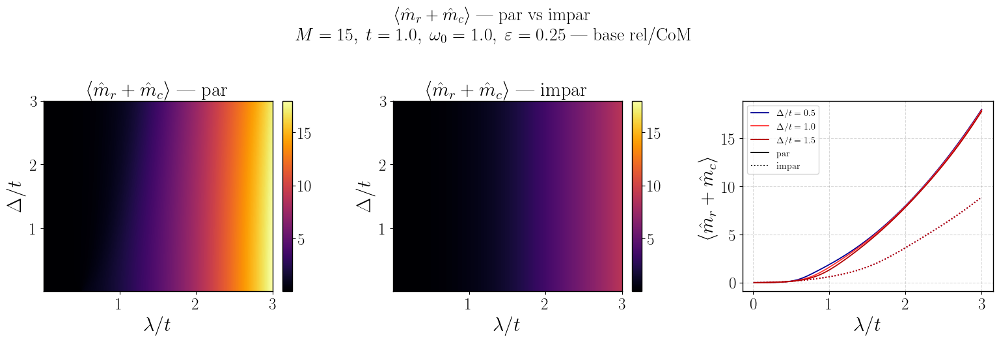

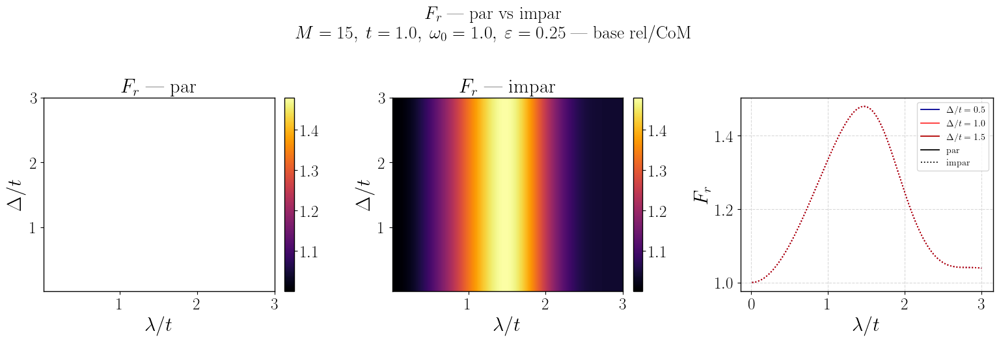

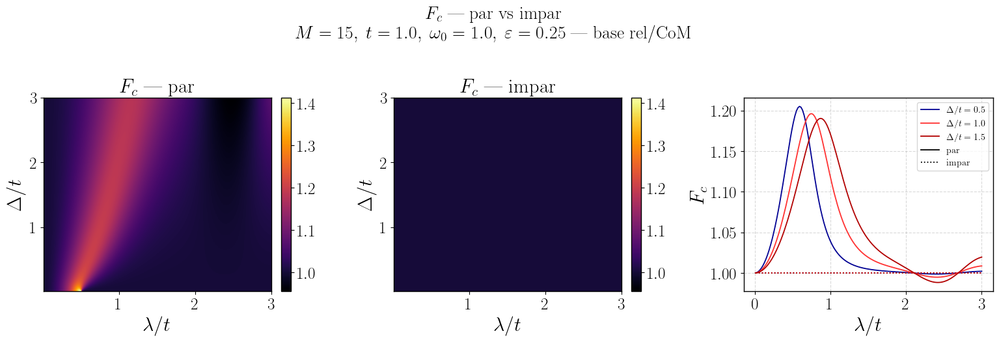

...

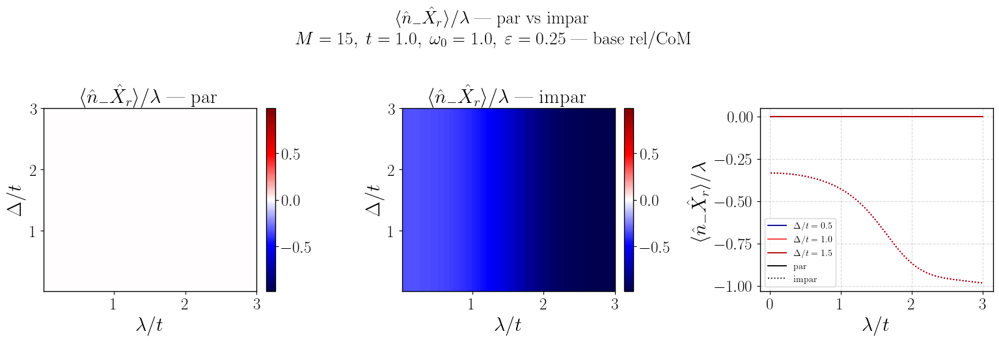

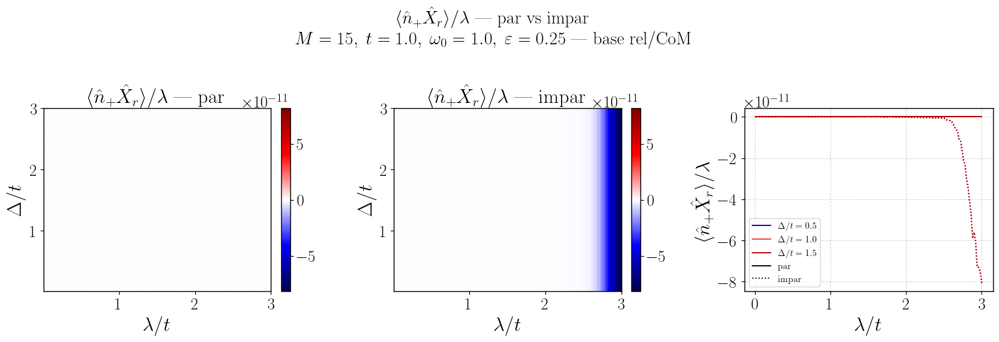

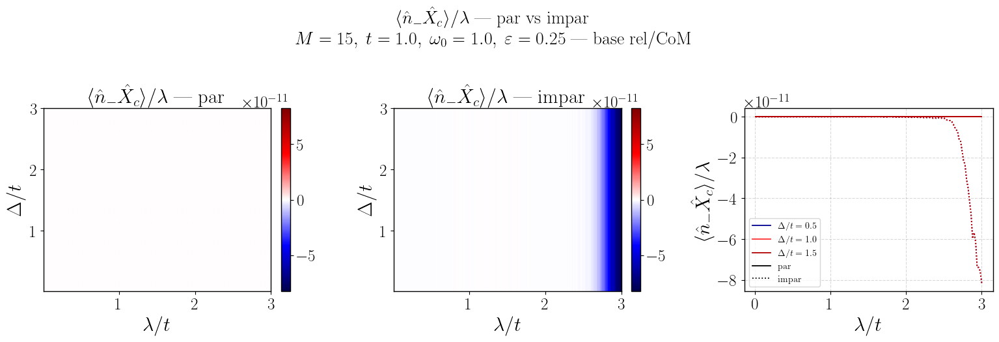

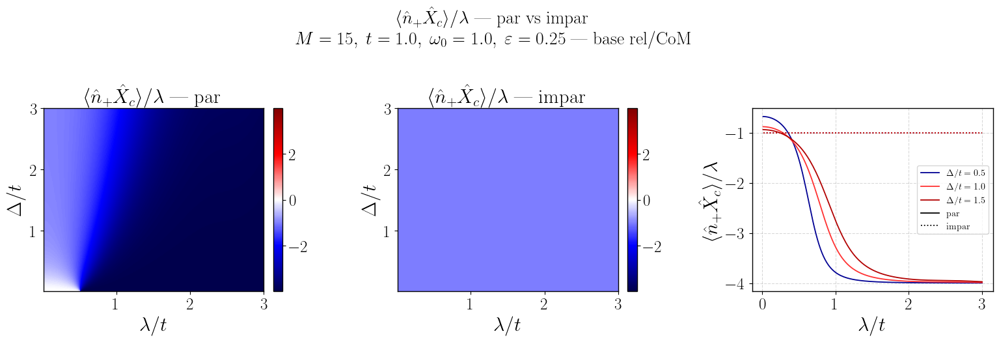

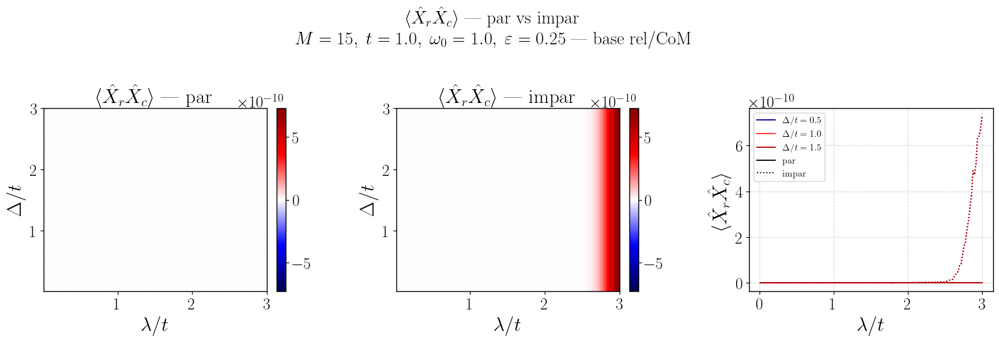

In [21]:
# ══════════════════════════════════════════════════════════════════
# CELDA 3 — GRAFICACIÓN POR SECTOR (par vs impar) — COMPLETA
# ══════════════════════════════════════════════════════════════════
n_Delta_data = hmaps_e['m_r'].shape[0]
cut_Deltas   = [0.5, 1.0, 1.5]
Delta_axis   = np.linspace(Delta_arr[0], Delta_arr[-1], n_Delta_data)
cut_indices  = [int(np.argmin(np.abs(Delta_axis - d))) for d in cut_Deltas]
extent       = [lam_arr[0], lam_arr[-1], Delta_axis[0], Delta_axis[-1]]
xlabel = r'$\lambda/t$';  ylabel = r'$\Delta/t$'
pstr   = (rf"$M={M_max},\;t={t},\;\omega_0={omega0},\;"
          rf"\varepsilon={eps_val}$  —  base rel/CoM")

C_BLUE = plt.cm.seismic(0.10)
C_RED1 = plt.cm.seismic(0.70)
C_RED2 = plt.cm.seismic(0.90)
CUT_COLORS = [C_BLUE, C_RED1, C_RED2]
h = 5.5

import matplotlib.lines as mlines

def _sector_row(fig, ax_e, ax_o, ax_cut, data_e, data_o, title,
                cmap='inferno', diverging=False, clabel=None, plot_ref=False):
    """Heatmap par | heatmap impar | cortes 1D. Rango robusto frente a NaN."""
    # rango común calculado SOLO sobre valores finitos de AMBOS sectores
    both = np.concatenate([data_e[np.isfinite(data_e)].ravel(),
                           data_o[np.isfinite(data_o)].ravel()])
    if diverging:
        vmax = np.nanmax(np.abs(both)) + 1e-12
        vmin, vmx = -vmax, vmax
    else:
        vmin, vmx = np.nanmin(both), np.nanmax(both)

    im_e = ax_e.imshow(data_e, origin='lower', aspect='auto', extent=extent,
                       cmap=cmap, vmin=vmin, vmax=vmx)
    fig.colorbar(im_e, ax=ax_e, fraction=0.046, pad=0.04)
    ax_e.set(title=f'{title} — par', xlabel=xlabel, ylabel=ylabel)

    im_o = ax_o.imshow(data_o, origin='lower', aspect='auto', extent=extent,
                       cmap=cmap, vmin=vmin, vmax=vmx)
    fig.colorbar(im_o, ax=ax_o, fraction=0.046, pad=0.04)
    ax_o.set(title=f'{title} — impar', xlabel=xlabel, ylabel=ylabel)

    for idx, col in zip(cut_indices, CUT_COLORS):
        ax_cut.plot(lam_arr, data_e[idx, :], '-',  color=col, lw=1.3)
        ax_cut.plot(lam_arr, data_o[idx, :], ':',  color=col, lw=1.3)
    if plot_ref:
        ax_cut.plot(lam_arr, lam_arr**2, 'k--', lw=1.0, alpha=0.5)
    ax_cut.set_xlabel(xlabel)
    ax_cut.set_ylabel(clabel or title)
    ax_cut.grid(alpha=0.3, ls='--')

    handles  = [mlines.Line2D([], [], color=col, lw=1.3, label=rf'$\Delta/t={d}$')
                for col, d in zip(CUT_COLORS, cut_Deltas)]
    handles += [mlines.Line2D([], [], color='k', ls='-',  lw=1.3, label='par'),
                mlines.Line2D([], [], color='k', ls=':', lw=1.3, label='impar')]
    ax_cut.legend(handles=handles, fontsize=10, ncol=1)

# ──────────────────────────────────────────────────────────────────
# Lista COMPLETA de observables: (key, título, cmap, diverging, ref)
#   diverging=True → seismic simétrico (observables con signo)
#   diverging=False → inferno con rango real [min,max]
# ──────────────────────────────────────────────────────────────────
PLOTS = [
    # número de fotones
    ('m_r',   r'$\langle\hat{m}_r\rangle$',          'inferno', False, False ),
    ('m_c',   r'$\langle\hat{m}_c\rangle$',          'inferno', False, False ),
    ('m_tot', r'$\langle\hat{m}_r+\hat{m}_c\rangle$','inferno', False, False),
    # factor de Fano (SIEMPRE > 1 → inferno, rango real)
    ('F_r',   r'$F_r$',                               'inferno', False, False),
    ('F_c',   r'$F_c$',                               'inferno', False, False),
    # cuadraturas <X^2>, <P^2>
    ('X_r_sq', r'$\langle\hat{X}_r^2\rangle$',        'inferno', False, False),
    ('X_c_sq', r'$\langle\hat{X}_c^2\rangle$',        'inferno', False, False),
    ('P_r_sq', r'$\langle\hat{P}_r^2\rangle$',        'inferno', False, False),
    ('P_c_sq', r'$\langle\hat{P}_c^2\rangle$',        'inferno', False, False),
    # varianzas (ΔX)^2, (ΔP)^2
    ('DX_r_sq', r'$(\Delta\hat{X}_r)^2$',             'inferno', False, False),
    ('DX_c_sq', r'$(\Delta\hat{X}_c)^2$',             'inferno', False, False),
    ('DP_r_sq', r'$(\Delta\hat{P}_r)^2$',             'inferno', False, False),
    ('DP_c_sq', r'$(\Delta\hat{P}_c)^2$',             'inferno', False, False),
    # correlaciones <n± X_k> (con signo → seismic)
    ('nm_Xr', r'$\langle\hat{n}_-\hat{X}_r\rangle$',  'seismic', True, False),
    ('np_Xr', r'$\langle\hat{n}_+\hat{X}_r\rangle$',  'seismic', True, False),
    ('nm_Xc', r'$\langle\hat{n}_-\hat{X}_c\rangle$',  'seismic', True, False),
    ('np_Xc', r'$\langle\hat{n}_+\hat{X}_c\rangle$',  'seismic', True, False),
    # correlaciones normalizadas a λ
    ('nm_Xr_norm', r'$\langle\hat{n}_-\hat{X}_r\rangle/\lambda$', 'seismic', True, False),
    ('np_Xr_norm', r'$\langle\hat{n}_+\hat{X}_r\rangle/\lambda$', 'seismic', True, False),
    ('nm_Xc_norm', r'$\langle\hat{n}_-\hat{X}_c\rangle/\lambda$', 'seismic', True, False),
    ('np_Xc_norm', r'$\langle\hat{n}_+\hat{X}_c\rangle/\lambda$', 'seismic', True, False),
    # correlación inter-modal
    ('X_r_X_c', r'$\langle\hat{X}_r\hat{X}_c\rangle$', 'seismic', True, False),
]

for k, ttl, cmap, div, ref in PLOTS:
    fig, axes = plt.subplots(1, 3, figsize=(16, h))
    _sector_row(fig, axes[0], axes[1], axes[2],
                hmaps_e[k], hmaps_o[k], ttl,
                cmap=cmap, diverging=div, clabel=ttl, plot_ref=ref)
    fig.suptitle(ttl + ' — par vs impar\n' + pstr)
    plt.tight_layout(); plt.show()

## Weigths

In [4]:
# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN
# ══════════════════════════════════════════════════════════════════


t       = 1.0
omega0  = 1.0
eps_val = 0.25
M_max   = 25

n_lam, n_Delta = 200, 200
lam_arr = np.concatenate([
    np.linspace(0.01, 2.0, 150),   # fino, M=25 suficiente
    np.linspace(2.1,  3.0, 50),   # grueso, M=40+
])

Delta_arr = np.linspace(0.0,  3.0, n_Delta)

PHI_KEYS = []
for prefix in ['odd_phi1', 'odd_phi2', 'even_phi1', 'even_phi2']:
    for k in ['w', 'DX_r_sq', 'DX_c_sq', 'DP_r_sq', 'DP_c_sq']:
        PHI_KEYS.append(f'{prefix}_{k}')

OBS_KEYS_QUAD = ['sector', 'E_even', 'E_odd'] + PHI_KEYS

all_args = [(j, i, lam, Delta)
            for j, lam   in enumerate(lam_arr)
            for i, Delta in enumerate(Delta_arr)]

print(f"Grid: {n_lam}×{n_Delta} = {n_lam*n_Delta:,} puntos")
with tqdm_joblib(tqdm(desc="Puntos", total=n_lam*n_Delta, unit="pt")) as _:
    results = joblib.Parallel(n_jobs=-1, prefer='processes')(
        joblib.delayed(compute_point_CM_quad)(*args) for args in all_args)

hmaps_CM = {k: np.full((n_Delta, n_lam), np.nan) for k in OBS_KEYS_QUAD}
for j, i, obs in results:
    for k in OBS_KEYS_QUAD:
        hmaps_CM[k][i, j] = obs.get(k, np.nan)

# Producto de Heisenberg ΔX²·ΔP² por bloque y sector
for prefix in ['odd_phi1', 'odd_phi2', 'even_phi1', 'even_phi2']:
    hmaps_CM[f'{prefix}_UP_r'] = hmaps_CM[f'{prefix}_DX_r_sq'] * hmaps_CM[f'{prefix}_DP_r_sq']
    hmaps_CM[f'{prefix}_UP_c'] = hmaps_CM[f'{prefix}_DX_c_sq'] * hmaps_CM[f'{prefix}_DP_c_sq']

print("¡Listo!")



Grid: 200×200 = 40,000 puntos


Puntos:   0%|          | 0/40000 [00:00<?, ?pt/s]

Puntos: 100%|██████████| 40000/40000 [13:06:29<00:00,  1.18s/pt]  


¡Listo!


odd_phi1_DX_r_sq: min=0.5000  max=0.9045
odd_phi1_DP_r_sq: min=0.3145  max=0.5000
odd_phi2_DX_r_sq: min=0.5000  max=0.9045
odd_phi2_DP_r_sq: min=0.3145  max=0.5000


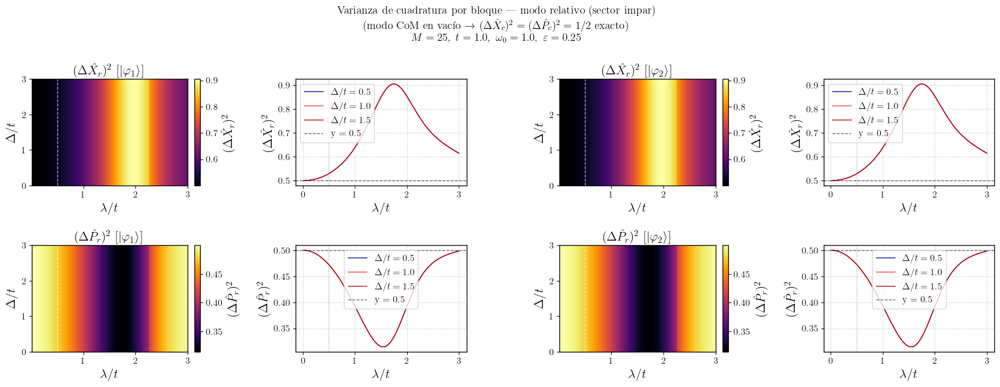

even_phi1_DX_c_sq: min=0.5000  max=0.6506
even_phi1_DP_c_sq: min=0.3931  max=0.8920
even_phi2_DX_c_sq: min=0.4896  max=0.5639
even_phi2_DP_c_sq: min=0.4435  max=0.5108


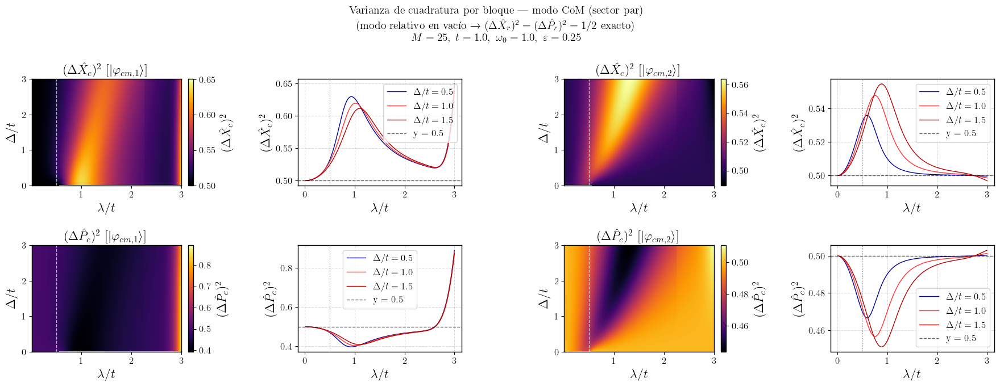

odd_phi1_UP_r: min=0.25000  max=0.34085
odd_phi2_UP_r: min=0.25000  max=0.34085
even_phi1_UP_c: min=0.25000  max=0.58035
even_phi2_UP_c: min=0.25000  max=0.25014


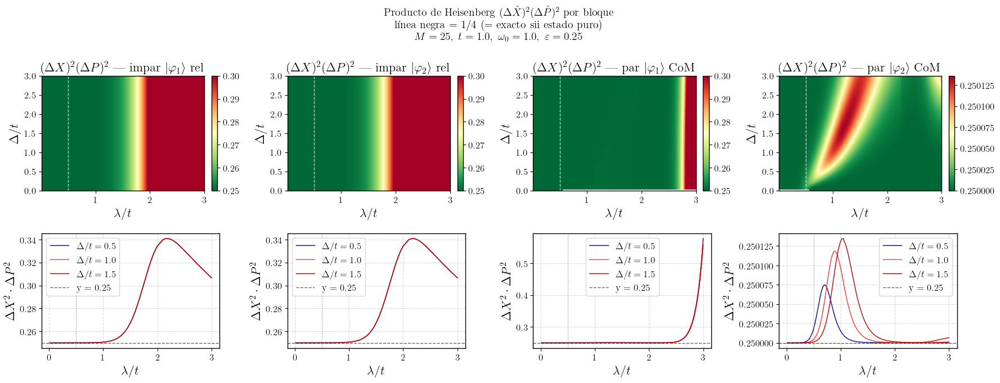

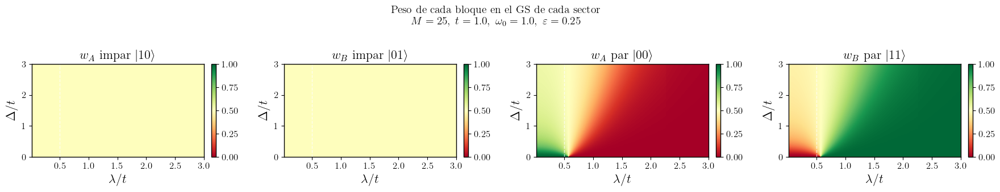

In [5]:

# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN
# ══════════════════════════════════════════════════════════════════
extent   = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
xlabel   = r'$\lambda/t$'
ylabel   = r'$\Delta/t$'
lam_star = np.sqrt(eps_val / omega0)
pstr     = rf"$M={M_max},\;t={t},\;\omega_0={omega0},\;\varepsilon={eps_val}$"
cmap_nan = plt.cm.inferno.copy(); cmap_nan.set_bad('lightgray')

cut_Deltas  = [0.5, 1.0, 1.5]
cut_indices = [np.argmin(np.abs(Delta_arr - d)) for d in cut_Deltas]
CUT_COLS    = [plt.cm.seismic(0.10), plt.cm.seismic(0.70), plt.cm.seismic(0.90)]
h = 3.5

def _hm(fig, ax, data, title, cmap='inferno', vmin=None, vmax=None, clabel=None):
    im = ax.imshow(data, origin='lower', aspect='auto', extent=extent,
                   cmap=cmap, vmin=vmin, vmax=vmax)
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    if clabel: cb.set_label(clabel)
    ax.axvline(lam_star, color='w', ls='--', lw=1.0, alpha=0.7)
    ax.set(title=title, xlabel=xlabel, ylabel=ylabel)
    return im

def _cuts(ax, data, ylabel, hline=None):
    for idx, dv, col in zip(cut_indices, cut_Deltas, CUT_COLS):
        ax.plot(lam_arr, data[idx, :], lw=1.0, color=col,
                label=rf'$\Delta/t={dv}$')
    if hline is not None:
        ax.axhline(hline, color='k', ls='--', lw=1.0, alpha=0.6,
                   label=f'y = {hline}')
    ax.axvline(lam_star, color='gray', ls=':', lw=0.8)
    ax.set(xlabel=xlabel, ylabel=ylabel)
    ax.legend(); ax.grid(alpha=0.3, ls='--')


# ── Fig 1: Sector IMPAR — ΔX_r² y ΔP_r² (modo relativo) ──────────
fig, axes = plt.subplots(2, 4, figsize=(18, 2*h))
for col, (prefix, label) in enumerate([('odd_phi1', r'$|\varphi_1\rangle$'),
                                        ('odd_phi2', r'$|\varphi_2\rangle$')]):
    for row, (sq, ttl_k) in enumerate(
            [('DX_r_sq', r'$(\Delta\hat{X}_r)^2$'),
             ('DP_r_sq', r'$(\Delta\hat{P}_r)^2$')]):
        key  = f'{prefix}_{sq}'
        data = hmaps_CM[key]
        vmin_k = np.nanmin(data); vmax_k = np.nanmax(data)
        _hm(fig, axes[row, col*2], data,
            rf'{ttl_k}  [{label}]', cmap=cmap_nan,
            vmin=vmin_k, vmax=vmax_k, clabel=ttl_k)
        _cuts(axes[row, col*2+1], data, ttl_k, hline=0.5)
        print(f"{key}: min={vmin_k:.4f}  max={vmax_k:.4f}")

fig.suptitle(r'Varianza de cuadratura por bloque — modo relativo (sector impar)'
             '\n(modo CoM en vacío → '
             r'$(\Delta\hat{X}_c)^2=(\Delta\hat{P}_c)^2=1/2$ exacto)'
             '\n' + pstr)
plt.tight_layout(); plt.show()


# ── Fig 2: Sector PAR — ΔX_c² y ΔP_c² (modo CoM) ─────────────────
fig, axes = plt.subplots(2, 4, figsize=(18, 2*h))
for col, (prefix, label) in enumerate([('even_phi1', r'$|\varphi_{cm,1}\rangle$'),
                                        ('even_phi2', r'$|\varphi_{cm,2}\rangle$')]):
    for row, (sq, ttl_k) in enumerate(
            [('DX_c_sq', r'$(\Delta\hat{X}_c)^2$'),
             ('DP_c_sq', r'$(\Delta\hat{P}_c)^2$')]):
        key  = f'{prefix}_{sq}'
        data = hmaps_CM[key]
        vmin_k = np.nanmin(data); vmax_k = np.nanmax(data)
        _hm(fig, axes[row, col*2], data,
            rf'{ttl_k}  [{label}]', cmap=cmap_nan,
            vmin=vmin_k, vmax=vmax_k, clabel=ttl_k)
        _cuts(axes[row, col*2+1], data, ttl_k, hline=0.5)
        print(f"{key}: min={vmin_k:.4f}  max={vmax_k:.4f}")

fig.suptitle(r'Varianza de cuadratura por bloque — modo CoM (sector par)'
             '\n(modo relativo en vacío → '
             r'$(\Delta\hat{X}_r)^2=(\Delta\hat{P}_r)^2=1/2$ exacto)'
             '\n' + pstr)
plt.tight_layout(); plt.show()


# ── Fig 3: Producto de Heisenberg ΔX²·ΔP² ────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(18, 2*h))
vac = 0.25
panel_info = [
    ('odd_phi1',  'r', r'impar $|\varphi_1\rangle$ rel'),
    ('odd_phi2',  'r', r'impar $|\varphi_2\rangle$ rel'),
    ('even_phi1', 'c', r'par $|\varphi_1\rangle$ CoM'),
    ('even_phi2', 'c', r'par $|\varphi_2\rangle$ CoM'),
]
for col, (prefix, mode, lbl) in enumerate(panel_info):
    key  = f'{prefix}_UP_{mode}'
    data = hmaps_CM[key]
    vmin_k = np.nanmin(data); vmax_k = np.nanmax(data)
    title = rf'$(\Delta X)^2(\Delta P)^2$ — {lbl}'
    _hm(fig, axes[0, col], data, title, cmap='RdYlGn_r',
        vmin=max(vmin_k, 0.24), vmax=min(vmax_k, 0.30))
    _cuts(axes[1, col], data, r'$\Delta X^2 \cdot \Delta P^2$', hline=vac)
    print(f"{key}: min={vmin_k:.5f}  max={vmax_k:.5f}")

fig.suptitle(r'Producto de Heisenberg $(\Delta\hat{X})^2(\Delta\hat{P})^2$ por bloque'
             '\n' + r'línea negra = $1/4$ (= exacto sii estado puro)'
             '\n' + pstr)
plt.tight_layout(); plt.show()


# ── Fig 4: Pesos por bloque ────────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(18, h))
for ax, prefix, ttl in zip(
        axes,
        ['odd_phi1', 'odd_phi2', 'even_phi1', 'even_phi2'],
        [r'$w_A$ impar $|10\rangle$', r'$w_B$ impar $|01\rangle$',
         r'$w_A$ par $|00\rangle$',   r'$w_B$ par $|11\rangle$']):
    _hm(fig, ax, hmaps_CM[f'{prefix}_w'], ttl,
        cmap='RdYlGn', vmin=0, vmax=1)
fig.suptitle('Peso de cada bloque en el GS de cada sector\n' + pstr)
plt.tight_layout(); plt.show()

## Non-gaussianity tests

In [13]:
# ══════════════════════════════════════════════════════════════════
#  TEST DE CUMULANTES — GAUSSIANIDAD
#  ─────────────────────────────────────────────────────────────────
#  Para estado gaussiano: γ₁ = κ₃/κ₂^(3/2) = 0  y  γ₂ = κ₄/κ₂² = 0
#
#  Se calculan para Q_r = a_r+a_r† y Q_c = A+A†:
#
#  1. Por bloque (marco LF, bloque normalizado internamente)
#       → detecta si cada nube polarónica |φ_k⟩ es gaussiana
#
#  2. Estado total (marco LF)
#       → para sector impar simétrico: idéntico al por-bloque (trivial)
#
#  3. Estado total (marco laboratorio, con e^{-Ŝ})
#       → incluye desplazamiento condicional n̂_± · λ/√2
#       → predicción analítica (sector impar, simétrico):
#              κ₄_tot_lab(Q_r) = −8λ⁴  →  γ₂ < 0  (bimodal, no-gaussiano)
#              κ₄_tot_lab(Q_c) ≈ 0      (ambos bloques CoM desplazados igual)
# ══════════════════════════════════════════════════════════════════


# ── Helpers ────────────────────────────────────────────────────────

def _raw_moments(psi2d, Q, mode='r', nmax=4):
    """
    Momentos crudos μ[n] = w · ⟨Q^n⟩_bloque  para n = 0, …, nmax.
    μ[0] = w = Σ|psi|²  (norma del bloque, puede ser ≠ 1).

    mode='r': Q actúa en filas  (modo relativo, Q @ psi)
    mode='c': Q actúa en cols   (modo CoM, psi @ Q)
    """
    def ev(A): return float(np.real((psi2d.conj() * A).sum()))
    mu   = [float(np.sum(np.abs(psi2d)**2))]   # μ[0] = w
    curr = psi2d.copy()
    for _ in range(nmax):
        curr = (Q @ curr) if mode == 'r' else (curr @ Q)
        mu.append(ev(curr))
    return mu                                   # lista de longitud nmax+1


def _shift_moments(mu_global, shift, nmax=4):
    """
    Transforma μ_global = [w⟨Q^n⟩] → [w⟨(Q+shift)^n⟩]
    mediante la expansión binomial (Q+c)^n = Σ_k C(n,k)·c^{n-k}·Q^k.

    Equivale al cambio de frame LF→lab vía D(α): ⟨Q⟩ → ⟨Q⟩ + 2α.
    """
    return [
        sum(_C(n, k) * (shift**(n-k)) * mu_global[k] for k in range(n+1))
        for n in range(nmax+1)
    ]


def _cumulants(mu):
    """
    Convierte momentos crudos μ = [w, w·m₁, w·m₂, w·m₃, w·m₄]
    a cumulantes κ₁,…,κ₄ y cumulantes normalizados γ₁, γ₂.

    Para estado gaussiano: γ₁ = γ₂ = 0 exactamente.
    """
    w = mu[0]
    if w < 1e-14:
        return {k: np.nan for k in ('k1','k2','k3','k4','g1','g2')}
    m1, m2, m3, m4 = mu[1]/w, mu[2]/w, mu[3]/w, mu[4]/w
    k1 = m1
    k2 = m2 - m1**2
    k3 = m3 - 3*m2*m1   + 2*m1**3
    k4 = m4 - 4*m3*m1   - 3*m2**2 + 12*m2*m1**2 - 6*m1**4
    s  = abs(k2)
    return dict(k1=k1, k2=k2, k3=k3, k4=k4,
                g1=(k3 / s**1.5 if s > 1e-12 else np.nan),
                g2=(k4 / s**2   if s > 1e-12 else np.nan))


# ── Función principal ───────────────────────────────────────────────

def compute_cumulants_CM(evec, nph, n_ph, lam, sector, nmax=4):
    """
    Cumulantes de Q_r = a_r+a_r† y Q_c = A+A† para:

      · Por bloque (marco LF)          → φ1_r, φ2_r, φ1_c, φ2_c
      · Estado total (marco LF)        → tot_r_LF, tot_c_LF
      · Estado total (marco lab)        → tot_r_lab, tot_c_lab

    Desplazamientos LF→lab (de e^{-Ŝ}):
      shift en Q_r = n̂₋ · √2λ    (bloques A/B)
      shift en Q_c = n̂₊ · √2λ

    Predicción analítica (sector impar, simétrico w_A=w_B=½):
      κ₄(Q_r)_tot_lab = −8λ⁴   →   γ₂(Q_r) < 0  (no-gaussiano)
      κ₄(Q_c)_tot_lab ≈ 0       (desplazamiento CoM igual en ambos bloques)
    """
    inv   = 1.0 / np.sqrt(max(np.dot(evec.conj(), evec).real, 1e-30))
    psi_A = (evec[:n_ph] * inv).reshape(nph, nph)
    psi_B = (evec[n_ph:] * inv).reshape(nph, nph)

    _, Q, _, _ = _phonon_ops_CM(nph)
    sq2 = np.sqrt(2)

    # ── Momentos globales (psi_A, psi_B ya globalmente normalizados) ──
    mu_rA = _raw_moments(psi_A, Q, 'r', nmax)
    mu_rB = _raw_moments(psi_B, Q, 'r', nmax)
    mu_cA = _raw_moments(psi_A, Q, 'c', nmax)
    mu_cB = _raw_moments(psi_B, Q, 'c', nmax)

    # ── 1. Por bloque (marco LF) ──────────────────────────────────
    cum = dict(
        phi1_r=_cumulants(mu_rA), phi2_r=_cumulants(mu_rB),
        phi1_c=_cumulants(mu_cA), phi2_c=_cumulants(mu_cB),
    )

    # ── 2. Estado total (marco LF) ────────────────────────────────
    mu_r_LF = [mu_rA[n] + mu_rB[n] for n in range(nmax+1)]
    mu_c_LF = [mu_cA[n] + mu_cB[n] for n in range(nmax+1)]
    cum['tot_r_LF'] = _cumulants(mu_r_LF)
    cum['tot_c_LF'] = _cumulants(mu_c_LF)

    # ── Desplazamientos condicionales e^{-Ŝ}: n̂_± · √2λ ──────────
    if sector == 'odd':
        nm_A, nm_B, np_A, np_B = +1, -1, +1, +1
    else:  # even
        nm_A, nm_B, np_A, np_B =  0,  0,  0, +2

    sh_rA, sh_rB = nm_A*sq2*lam, nm_B*sq2*lam
    sh_cA, sh_cB = np_A*sq2*lam, np_B*sq2*lam

    # ── 3. Estado total (marco laboratorio) ──────────────────────
    mu_rA_lab = _shift_moments(mu_rA, sh_rA, nmax)
    mu_rB_lab = _shift_moments(mu_rB, sh_rB, nmax)
    mu_cA_lab = _shift_moments(mu_cA, sh_cA, nmax)
    mu_cB_lab = _shift_moments(mu_cB, sh_cB, nmax)

    mu_r_lab = [mu_rA_lab[n] + mu_rB_lab[n] for n in range(nmax+1)]
    mu_c_lab = [mu_cA_lab[n] + mu_cB_lab[n] for n in range(nmax+1)]
    cum['tot_r_lab'] = _cumulants(mu_r_lab)
    cum['tot_c_lab'] = _cumulants(mu_c_lab)

    return cum


def compute_point_CM_cum(j, i, lam, Delta):
    M_loc = get_M_CM(lam, M_max)
    ev_e, evec_e, ev_o, evec_o, nph, n_ph = diagonalize_CM(
        M=M_loc, eps=eps_val, t=t, Delta=Delta, omega0=omega0, lam=lam)
    if ev_e[0] <= ev_o[0]:
        gs_vec, sector, sec_int = evec_e[:, 0], 'even', 0
    else:
        gs_vec, sector, sec_int = evec_o[:, 0], 'odd',  1
    cum = compute_cumulants_CM(gs_vec, nph, n_ph, lam, sector)
    cum['sector'] = sec_int
    return j, i, cum

In [14]:

# ══════════════════════════════════════════════════════════════════
#  EJECUCIÓN
# ══════════════════════════════════════════════════════════════════

t       = 1.0
omega0  = 1.0
eps_val = 0.25
M_max   = 12
 
n_lam, n_Delta = 200, 200
lam_arr   = np.linspace(0.01, 2.0, n_lam)
Delta_arr = np.linspace(0.0,  2.0, n_Delta)

CUM_SRCS = ['phi1_r', 'phi2_r', 'phi1_c', 'phi2_c',
            'tot_r_LF', 'tot_c_LF', 'tot_r_lab', 'tot_c_lab']
CUM_QS   = ['k1', 'k2', 'k3', 'k4', 'g1', 'g2']
CUM_KEYS = [f'{s}_{q}' for s in CUM_SRCS for q in CUM_QS] + ['sector']

all_args = [(j, i, lam, Delta)
            for j, lam   in enumerate(lam_arr)
            for i, Delta in enumerate(Delta_arr)]

print(f"Grid: {n_lam}×{n_Delta} = {n_lam*n_Delta:,} puntos")
with tqdm_joblib(tqdm(desc="Cumulantes", total=n_lam*n_Delta, unit="pt")) as _:
    results_cum = Parallel(n_jobs=-1, prefer='processes')(
        delayed(compute_point_CM_cum)(*args) for args in all_args)

hmaps_cum = {k: np.full((n_Delta, n_lam), np.nan) for k in CUM_KEYS}
for j, i, cum in results_cum:
    for src in CUM_SRCS:
        for q in CUM_QS:
            hmaps_cum[f'{src}_{q}'][i, j] = cum.get(src, {}).get(q, np.nan)
    hmaps_cum['sector'][i, j] = cum.get('sector', np.nan)

# ── Predicción analítica: γ₂(Q_r)_lab = −8λ⁴/κ₂² (sector impar) ──
lam2d  = lam_arr[None, :]
k2_lab = hmaps_cum['tot_r_lab_k2']
hmaps_cum['g2_pred'] = np.where(
    k2_lab > 1e-10, -8.0*lam2d**4 / k2_lab**2, np.nan)

print("\n¡Listo!  Resumen γ₂:")
for k in ['phi1_r_g2','phi2_r_g2','tot_r_LF_g2','tot_r_lab_g2','tot_c_lab_g2']:
    a = hmaps_cum[k]
    print(f"  {k:25s}: [{np.nanmin(a):.5f},  {np.nanmax(a):.5f}]")


Grid: 200×200 = 40,000 puntos


Cumulantes: 100%|██████████| 40000/40000 [05:39<00:00, 117.95pt/s]



¡Listo!  Resumen γ₂:
  phi1_r_g2                : [-0.00581,  0.00000]
  phi2_r_g2                : [-0.00581,  0.00000]
  tot_r_LF_g2              : [-0.15207,  0.00000]
  tot_r_lab_g2             : [-1.22413,  0.00000]
  tot_c_lab_g2             : [-1.06002,  27.63457]


phi1_r_g2: [-0.00581,  0.00000]
phi2_r_g2: [-0.00581,  0.00000]
phi1_c_g2: [-0.21794,  6.68023]
phi2_c_g2: [-0.00128,  0.02751]


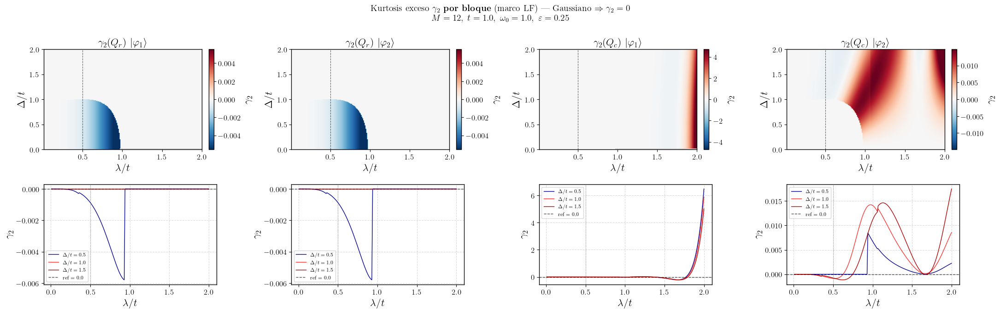

tot_r_LF_g2: [-0.15207,  0.00000]
tot_c_LF_g2: [-0.26722,  4.99909]
tot_r_lab_g2: [-1.22413,  0.00000]
tot_c_lab_g2: [-1.06002,  27.63457]


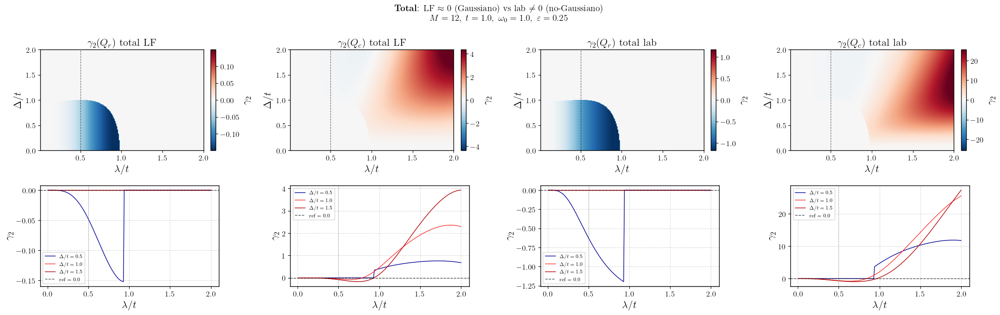

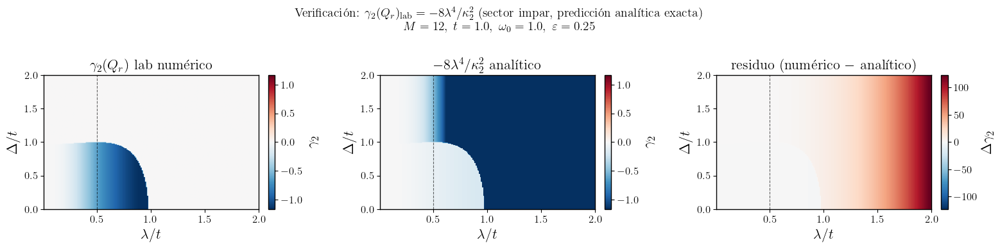

In [15]:

# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN
# ══════════════════════════════════════════════════════════════════
extent   = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
xlabel   = r'$\lambda/t$'
ylabel   = r'$\Delta/t$'
lam_star = np.sqrt(eps_val / omega0)
pstr     = rf"$M={M_max},\;t={t},\;\omega_0={omega0},\;\varepsilon={eps_val}$"

CUT_COLS    = [plt.cm.seismic(0.10), plt.cm.seismic(0.70), plt.cm.seismic(0.90)]
cut_Deltas  = [0.5, 1.0, 1.5]
cut_indices = [np.argmin(np.abs(Delta_arr - d)) for d in cut_Deltas]
h = 3.5

cmap_g = plt.cm.RdBu_r.copy(); cmap_g.set_bad('lightgray')


def _hm(fig, ax, data, title, vmin=None, vmax=None, cmap=cmap_g, cl=None):
    im = ax.imshow(data, origin='lower', aspect='auto', extent=extent,
                   cmap=cmap, vmin=vmin, vmax=vmax)
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    if cl: cb.set_label(cl)
    ax.axvline(lam_star, color='k', ls='--', lw=0.8, alpha=0.6)
    ax.set(title=title, xlabel=xlabel, ylabel=ylabel)


def _cuts(ax, data, yl, href=0.0):
    for idx, dv, col in zip(cut_indices, cut_Deltas, CUT_COLS):
        ax.plot(lam_arr, data[idx, :], lw=1.0, color=col,
                label=rf'$\Delta/t={dv}$')
    ax.axhline(href, color='k', ls='--', lw=1.0, alpha=0.7,
               label=f'ref = {href}')
    ax.axvline(lam_star, color='gray', ls=':', lw=0.8)
    ax.set(xlabel=xlabel, ylabel=yl)
    ax.legend(fontsize=8); ax.grid(alpha=0.3, ls='--')


def _vabs(data):
    """Rango simétrico al percentil 99 para colormap centrado en 0."""
    valid = data[~np.isnan(data)]
    return max(np.percentile(np.abs(valid), 99), 1e-8) if valid.size else 0.1


# ── Fig 1: γ₂ por bloque (marco LF) — debe ser ≈ 0 ──────────────
#   Confirma que cada nube polarónica |φ_k⟩ es gaussiana.
fig, axes = plt.subplots(2, 4, figsize=(22, 2*h))
items1 = [
    ('phi1_r_g2', r'$\gamma_2(Q_r)$  $|\varphi_1\rangle$'),
    ('phi2_r_g2', r'$\gamma_2(Q_r)$  $|\varphi_2\rangle$'),
    ('phi1_c_g2', r'$\gamma_2(Q_c)$  $|\varphi_1\rangle$'),
    ('phi2_c_g2', r'$\gamma_2(Q_c)$  $|\varphi_2\rangle$'),
]
for col, (key, ttl) in enumerate(items1):
    d = hmaps_cum[key]
    v = _vabs(d)
    _hm(fig, axes[0, col], d, ttl, vmin=-v, vmax=v, cl=r'$\gamma_2$')
    _cuts(axes[1, col], d, r'$\gamma_2$')
    print(f"{key}: [{np.nanmin(d):.5f},  {np.nanmax(d):.5f}]")

fig.suptitle(
    r'Kurtosis exceso $\gamma_2$ \textbf{por bloque} (marco LF)'
    r' — Gaussiano $\Rightarrow \gamma_2 = 0$' + '\n' + pstr)
plt.tight_layout(); plt.show()


# ── Fig 2: γ₂ total LF vs laboratorio ────────────────────────────
#   LF ≈ 0 (Gaussiano) vs lab ≠ 0 (no-Gaussiano, bimodal)
fig, axes = plt.subplots(2, 4, figsize=(22, 2*h))
items2 = [
    ('tot_r_LF_g2',  r'$\gamma_2(Q_r)$ total  LF'),
    ('tot_c_LF_g2',  r'$\gamma_2(Q_c)$ total  LF'),
    ('tot_r_lab_g2', r'$\gamma_2(Q_r)$ total  lab'),
    ('tot_c_lab_g2', r'$\gamma_2(Q_c)$ total  lab'),
]
for col, (key, ttl) in enumerate(items2):
    d = hmaps_cum[key]
    v = _vabs(d)
    _hm(fig, axes[0, col], d, ttl, vmin=-v, vmax=v, cl=r'$\gamma_2$')
    _cuts(axes[1, col], d, r'$\gamma_2$')
    print(f"{key}: [{np.nanmin(d):.5f},  {np.nanmax(d):.5f}]")

fig.suptitle(
    r'\textbf{Total}: LF $\approx 0$ (Gaussiano) vs lab $\neq 0$ (no-Gaussiano)'
    + '\n' + pstr)
plt.tight_layout(); plt.show()


# ── Fig 3: Verificación analítica κ₄ = −8λ⁴ ─────────────────────
#   Compara γ₂(Q_r)_lab numérico con la predicción −8λ⁴/κ₂²
#   Sector impar, estado simétrico.  Residuo ≈ 0 valida la teoría.
d_num  = hmaps_cum['tot_r_lab_g2']
d_pred = hmaps_cum['g2_pred']
d_diff = d_num - d_pred

fig, axes = plt.subplots(1, 3, figsize=(16, h+0.5))
v_n = _vabs(d_num)
v_d = _vabs(d_diff)

_hm(fig, axes[0], d_num,  r'$\gamma_2(Q_r)$ lab  numérico',
    vmin=-v_n, vmax=v_n,  cl=r'$\gamma_2$')
_hm(fig, axes[1], d_pred, r'$-8\lambda^4/\kappa_2^2$  analítico',
    vmin=-v_n, vmax=v_n,  cl=r'$\gamma_2$')
_hm(fig, axes[2], d_diff, r'residuo  (numérico $-$ analítico)',
    vmin=-v_d, vmax=v_d,  cl=r'$\Delta\gamma_2$')

fig.suptitle(
    r'Verificación: $\gamma_2(Q_r)_{\rm lab} = -8\lambda^4/\kappa_2^2$'
    r'  (sector impar, predicción analítica exacta)' + '\n' + pstr)
plt.tight_layout(); plt.show()

## Variational method

### Functions

In [4]:

_S2 = np.sqrt(2.0)

def energy_grad_odd(x, lam):
    """E_o(α,r) y su gradiente analítico (factor ½ incluido)."""
    alpha, r = x
    eps_t = eps_val - lam**2 * omega0
    d = _S2*lam - alpha
    A = d*d
    B = np.exp(2.0*r)
    F = np.exp(-0.5*A*B)
    E = eps_t + omega0*(0.25*alpha*alpha + np.sinh(r)**2) - t*F
    dE_da = 0.5*omega0*alpha - t*F*B*d            # ∂F/∂α = F·B·d
    dE_dr = omega0*np.sinh(2.0*r) + t*A*B*F         # ∂F/∂r = −A·B·F
    return E, np.array([dE_da, dE_dr])

def minimize_odd(lam, x_warm=None):
    """
    Mínimo global de E_o por multistart L-BFGS-B.
    Los seeds cubren AMBAS ramas (localizada α≈0 y polarónica α≈√2λ),
    así que el barrido captura solo la transición de autoatrapamiento.
    """
    amax = _S2*lam + 1.0
    bounds = [(-0.5, amax), (-1.5, 1.5)]
    seeds = [(0.0, 0.0), (0.0, -0.1),
             (_S2*lam, 0.0), (_S2*lam, -0.25),
             (0.5*_S2*lam, -0.1)]
    if x_warm is not None:
        seeds = [tuple(x_warm)] + seeds
    lo = [b[0] for b in bounds]; hi = [b[1] for b in bounds]
    bestE, bestx = np.inf, None
    for s in seeds:
        x0 = np.clip(np.array(s, float), lo, hi)
        res = minimize(energy_grad_odd, x0, args=(lam,), jac=True,
                       method='L-BFGS-B', bounds=bounds,
                       options={'ftol': 1e-14, 'gtol': 1e-11, 'maxiter': 500})
        if res.fun < bestE:
            bestE, bestx = res.fun, res.x
    return bestE, bestx

def E_odd_exact(lam, M):
    """
    Energía exacta del sector impar por diagonalización en el modo relativo.
    Idéntica al estado fundamental de tu H_o con el modo CoM en vacío (m_c=0):
        H_o^rel = [[ ε̃ + ω0·n ,  t·D(√2λ)  ],
                   [ t·D(√2λ)ᵀ ,  ε̃ + ω0·n ]]
    Reutiliza tu disp_matrix y tu truncación get_M_CM(lam, M_max).
    """
    if M is None:
        M = get_M_CM(lam, M_max)
    eps_t = eps_val - lam**2 * omega0
    Dt = disp_matrix(M, _S2*lam)                       # (M+1)×(M+1)
    diag = eps_t*np.eye(M+1) + np.diag(np.arange(M+1)*omega0)
    n1 = M + 1
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = diag
    H[n1:, n1:] = diag
    H[:n1, n1:] = t*Dt
    H[n1:, :n1] = t*Dt.T
    return np.linalg.eigvalsh(H)[0]

# ─── Añadir a la CELDA A ─────────────────────────────────────────
def squeezed_vacuum(M, r):
    """S(r)|0> en base de Fock, convención S(r)=exp[r/2(â²−â†²)]. Estable vía C(2k,k)."""
    vec  = np.zeros(M + 1)
    pref = 1.0 / np.sqrt(np.cosh(r))
    th   = np.tanh(r)
    for k in range(M // 2 + 1):
        if 2*k <= M:
            vec[2*k] = pref * ((-th)**k) * np.sqrt(float(_C(2*k, k))) / (2.0**k)
    return vec

def fidelity_odd(lam, x, M=None):
    """
    |<ψ_exact|ψ_var>|² en el sector impar (modo CoM en vacío para ambos).
    Ambos estados en la base {|10>|m>, |01>|m>}, m=0..M.
    x = (α, r) óptimos. M independiente de M_max: aquí se necesita la
    función de onda completa resuelta, no solo la energía.
    """
    if M is None:
        M = int(max(40, np.ceil(4.0*lam*lam) + 25))
    n1 = M + 1
    # estado exacto: mismo bloque relativo que E_odd_exact
    eps_t = eps_val - lam**2 * omega0
    Dt    = disp_matrix(M, _S2*lam)
    diag  = eps_t*np.eye(n1) + np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = diag;  H[n1:, n1:] = diag
    H[:n1, n1:] = t*Dt;  H[n1:, :n1] = t*Dt.T
    _, V = eigh(H)
    psi_ex = V[:, 0]
    
    # estado variacional: c1|10>φ1 + c2|01>φ2,  (c1,c2)=(1,−1)/√2  (estado enlazante)
    a, r = x
    sv   = squeezed_vacuum(M, r)
    phi1 = disp_matrix(M,  a/2.0) @ sv
    phi2 = disp_matrix(M, -a/2.0) @ sv
    psi_var = np.concatenate([phi1, -phi2]) / np.sqrt(2.0)
    psi_var /= np.linalg.norm(psi_var)
    return abs(np.vdot(psi_ex, psi_var))**2

# ───  SECTOR PAR (4 parámetros) ──────────────
# Usa globales t, omega0, eps_val, _S2, disp_matrix, squeezed_vacuum, eigh, minimize.
# El sector par usa el modo CoM y D(−√2λ); depende de Δ (a diferencia del impar).

def energy_grad_even(x, lam, Delta):
    """E_e(α1,α2,r1,r2) y su gradiente analítico (factor ½ ya incluido en F)."""
    a, b, p, q = x
    eps_t = eps_val - lam**2 * omega0
    s1, s2 = np.sinh(p)**2, np.sinh(q)**2
    P   = 0.5*omega0*(a*a + b*b + s1 + s2)
    dlt = -eps_t + 0.5*omega0*(a*a - b*b + s1 - s2)
    rho = q - p
    mu  = _S2*lam + a - b
    Dd  = 1.0 + np.exp(2*rho)
    g   = mu*mu*np.exp(2*q)/Dd
    F   = np.exp(-g)/np.sqrt(np.cosh(rho))
    R   = np.sqrt(dlt*dlt + Delta*Delta*F*F)
    E   = eps_t + P - R
    dP = np.array([omega0*a, omega0*b,
                   0.5*omega0*np.sinh(2*p), 0.5*omega0*np.sinh(2*q)])
    dd = np.array([omega0*a, -omega0*b,
                   0.5*omega0*np.sinh(2*p), -0.5*omega0*np.sinh(2*q)])
    dg = np.array([ 2*mu*np.exp(2*q)/Dd, -2*mu*np.exp(2*q)/Dd,
                    2*g*np.exp(2*rho)/Dd, 2*g/Dd ])
    th = np.tanh(rho)
    dF = np.array([F*(-dg[0]), F*(-dg[1]),
                   F*(-dg[2] + 0.5*th), F*(-dg[3] - 0.5*th)])
    gr = dP if R < 1e-300 else dP - (dlt*dd + Delta*Delta*F*dF)/R
    return E, gr

def minimize_even(lam, Delta, x_warm=None):
    """Mínimo global de E_e por multistart L-BFGS-B (seeds cubren ambas configs)."""
    amax = _S2*lam + 1.0
    bounds = [(-amax, amax), (-amax, amax), (-1.5, 1.5), (-1.5, 1.5)]
    h = 0.5*_S2*lam
    seeds = [(0,0,0,0), (-h,h,-0.1,-0.1), (h,-h,-0.1,-0.1), (-h,h,0,0),
             (0,0,-0.1,-0.1), (-_S2*lam,0,-0.1,-0.1), (0,_S2*lam,-0.1,-0.1)]
    if x_warm is not None:
        seeds = [tuple(x_warm)] + seeds
    lo = [b[0] for b in bounds]; hi = [b[1] for b in bounds]
    bestE, bestx = np.inf, None
    for s in seeds:
        x0 = np.clip(np.array(s, float), lo, hi)
        res = minimize(energy_grad_even, x0, args=(lam, Delta), jac=True,
                       method='L-BFGS-B', bounds=bounds,
                       options={'ftol': 1e-14, 'gtol': 1e-11, 'maxiter': 800})
        if res.fun < bestE:
            bestE, bestx = res.fun, res.x
    return bestE, bestx

def get_weights_even(lam, Delta, x):
    """Pesos |c1^e|², |c2^e| vía la 2×2 (A C; C B), A≠B en general (BCS-like)."""
    a, b, p, q = x
    eps_t = eps_val - lam**2 * omega0
    A = omega0*(a*a + np.sinh(p)**2)
    B = 2*eps_t + omega0*(b*b + np.sinh(q)**2)
    rho = q - p; mu = _S2*lam + a - b
    F = np.exp(-mu*mu*np.exp(2*q)/(1+np.exp(2*rho)))/np.sqrt(np.cosh(rho))
    C = Delta*F
    Emin = 0.5*(A+B) - np.sqrt(0.25*(A-B)**2 + C*C)
    n1, n2 = C, Emin - A
    nrm = np.hypot(n1, n2)
    if nrm < 1e-15: return 1.0, 0.0
    return (n1/nrm)**2, (n2/nrm)**2

def E_even_exact(lam, Delta, M=None):
    """Energía exacta del sector par (modo CoM; rel en vacío)."""
    if M is None:
        M = int(max(40, np.ceil(4.0*lam*lam) + 25))
    eps_t = eps_val - lam**2 * omega0
    Dd = disp_matrix(M, -_S2*lam); n1 = M + 1
    n = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = n                              # |00>: ε=0
    H[n1:, n1:] = 2*eps_t*np.eye(n1) + n         # |11>: 2ε̃
    H[:n1, n1:] = Delta*Dd; H[n1:, :n1] = Delta*Dd.T
    return np.linalg.eigvalsh(H)[0]

def fidelity_even(lam, Delta, x, M=None):
    """|<ψ_exact|ψ_var>|² del sector par (modo rel en vacío para ambos)."""
    if M is None:
        M = int(max(40, np.ceil(4.0*lam*lam) + 25))
    n1 = M + 1
    eps_t = eps_val - lam**2 * omega0
    Dd = disp_matrix(M, -_S2*lam); n = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1))
    H[:n1, :n1] = n; H[n1:, n1:] = 2*eps_t*np.eye(n1) + n
    H[:n1, n1:] = Delta*Dd; H[n1:, :n1] = Delta*Dd.T
    _, V = eigh(H); psi_ex = V[:, 0]
    a, b, p, q = x
    phi1 = disp_matrix(M, a) @ squeezed_vacuum(M, p)
    phi2 = disp_matrix(M, b) @ squeezed_vacuum(M, q)
    A = omega0*(a*a + np.sinh(p)**2); B = 2*eps_t + omega0*(b*b + np.sinh(q)**2)
    rho = q - p; mu = _S2*lam + a - b
    F = np.exp(-mu*mu*np.exp(2*q)/(1+np.exp(2*rho)))/np.sqrt(np.cosh(rho)); C = Delta*F
    Emin = 0.5*(A+B) - np.sqrt(0.25*(A-B)**2 + C*C)
    c1, c2 = 1.0, ((Emin - A)/C if abs(C) > 1e-14 else 0.0)
    nn = np.hypot(c1, c2); c1, c2 = c1/nn, c2/nn
    psi_var = np.concatenate([c1*phi1, c2*phi2]); psi_var /= np.linalg.norm(psi_var)
    return abs(np.vdot(psi_ex, psi_var))**2

### Variational energy: Odd sector

In [6]:

# ─── Barrido en λ (el sector impar no depende de Δ) ───────────────

t = 1.0
omega0 = 1.0
eps_val = 0.25

lam_var = np.linspace(0.01, 4.0, 200) 

alpha_arr = np.empty_like(lam_var)
r_arr     = np.empty_like(lam_var)
Evar_arr  = np.empty_like(lam_var)
Eex_arr   = np.empty_like(lam_var)
fid_arr = np.empty_like(lam_var)

warm = None
for k, lam in enumerate(lam_var):
    E, x = minimize_odd(lam, x_warm=warm)
    warm = x
    alpha_arr[k], r_arr[k] = x
    Evar_arr[k] = E
    Eex_arr[k]  = E_odd_exact(lam, M=30)

relerr = np.abs(Evar_arr - Eex_arr) / np.abs(Eex_arr)

# Chequeo: la energía variacional es COTA SUPERIOR ⇒ Evar ≥ Eex
print("max(Eex − Evar) = %.2e  (debe ser ≲ 1e-10)" % np.max(Eex_arr - Evar_arr))
print("error relativo:  min=%.2e  max=%.2e" % (relerr.min(), relerr.max()))

for k, lam in enumerate(lam_var):
    fid_arr[k] = fidelity_odd(lam, (alpha_arr[k], r_arr[k]))

print("fidelidad:  min=%.5f  max=%.6f" % (fid_arr.min(), fid_arr.max()))

max(Eex − Evar) = -4.44e-16  (debe ser ≲ 1e-10)
error relativo:  min=5.92e-16  max=2.67e-02
fidelidad:  min=0.95246  max=1.000000


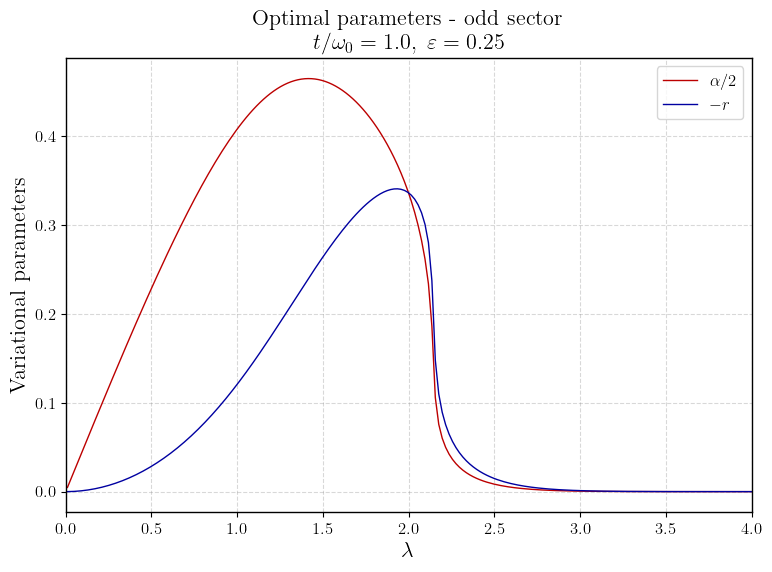

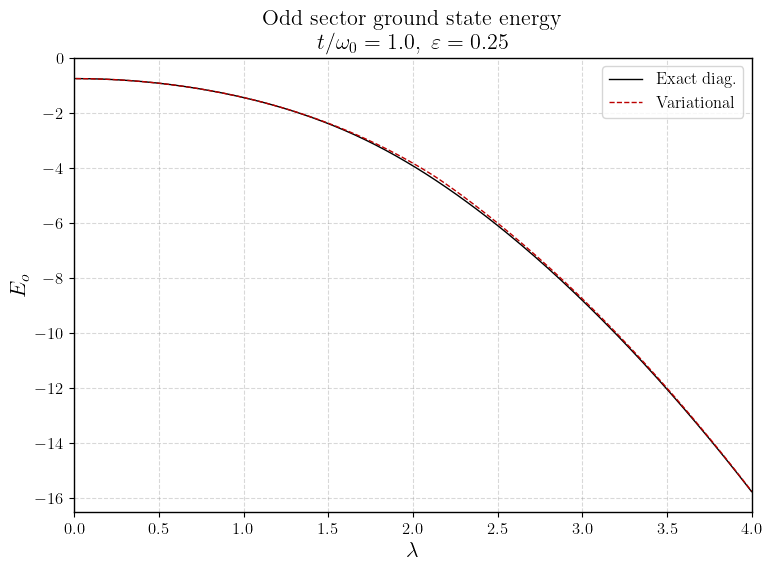

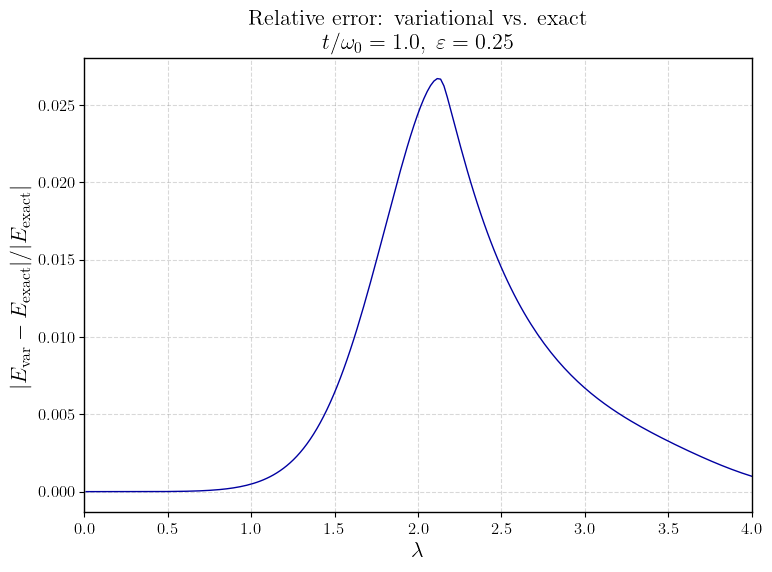

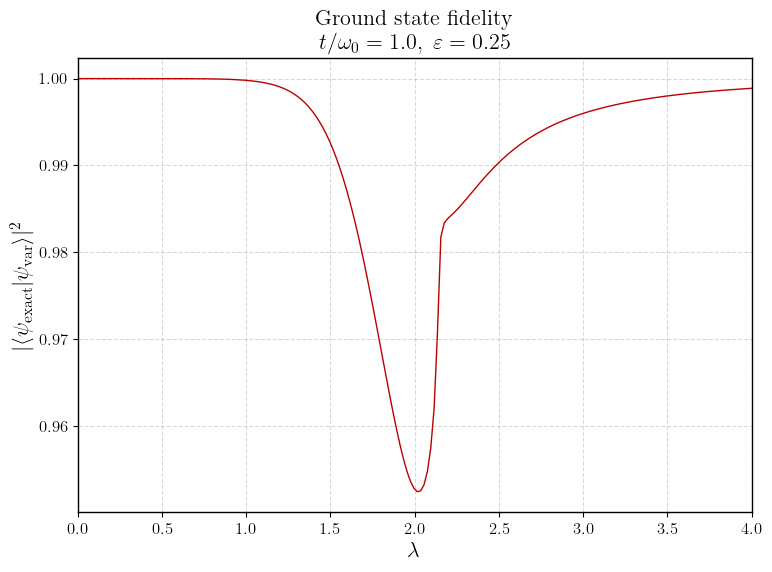

In [7]:
C_A = plt.cm.seismic(0.12)   # blue
C_B = plt.cm.seismic(0.88)   # red
pstr_1d = rf"$t/\omega_0={t/omega0},\ \varepsilon={eps_val}$"

# ── (1) Variational parameters α, r vs λ ───────────────────────
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lam_var, alpha_arr/2, '-', color=C_B, lw=1.0, label=r'$\alpha/2$')
ax.plot(lam_var, -r_arr,     '-', color=C_A, lw=1.0, label=r'$-r$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'Variational parameters')
ax.set_title(r'Optimal parameters - odd sector' + '\n' + pstr_1d)
ax.set_xlim(0.0, lam_var.max())
ax.legend(); ax.grid(alpha=0.3, ls='--')
plt.tight_layout(); plt.show()

# ── (2) Energy: variational vs exact diagonalization ───────────
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lam_var, Eex_arr,  '-',  color='k', lw=1.0, label=r'Exact diag.')
ax.plot(lam_var, Evar_arr, '--', color=C_B, lw=1.0, label=r'Variational')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$E_o$')
ax.set_title(r'Odd sector ground state energy' + '\n' + pstr_1d)
ax.set_xlim(0.0, lam_var.max())
ax.legend(); ax.grid(alpha=0.3, ls='--')
plt.tight_layout(); plt.show()

# ── (3) Relative error (log scale) ──────────────────────────────
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lam_var, relerr, '-', color=C_A, lw=1.0)
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$')
ax.set_title(r'Relative error: variational vs. exact' + '\n' + pstr_1d)
ax.set_xlim(0.0, lam_var.max())
ax.grid(alpha=0.3, ls='--', which='both')
plt.tight_layout(); plt.show()

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lam_var, fid_arr, '-', color=C_B, lw=1.0)
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$')
ax.set_title(r'Ground state fidelity' + '\n' + pstr_1d)
ax.set_xlim(0.0, lam_var.max())
ax.grid(alpha=0.3, ls='--')
plt.tight_layout(); plt.show()

### Variational energy: Even sector

In [8]:
# ─── Barrido en λ a Δ fijo (el sector par SÍ depende de Δ) ───────
Delta_e   = 1.0                      
lam_sweet = np.sqrt(eps_val/omega0)     

a1_arr = np.empty_like(lam_var); a2_arr = np.empty_like(lam_var)
r1_arr = np.empty_like(lam_var); r2_arr = np.empty_like(lam_var)
Eve_arr = np.empty_like(lam_var); Eve_ex = np.empty_like(lam_var)
c1e_arr = np.empty_like(lam_var); fide_arr = np.empty_like(lam_var)

warm = None
for k, lam in enumerate(lam_var):
    E, x = minimize_even(lam, Delta_e, x_warm=warm); warm = x
    a1_arr[k], a2_arr[k], r1_arr[k], r2_arr[k] = x
    Eve_arr[k] = E
    Eve_ex[k]  = E_even_exact(lam, Delta_e, M=40)
    c1e_arr[k], _ = get_weights_even(lam, Delta_e, x)
    fide_arr[k]   = fidelity_even(lam, Delta_e, x)

relerr_e = np.abs(Eve_arr - Eve_ex)/np.abs(Eve_ex)
print("max(Eex − Evar) = %.2e" % np.max(Eve_ex - Eve_arr))
print("fidelidad par:  min=%.5f  max=%.6f" % (fide_arr.min(), fide_arr.max()))

max(Eex − Evar) = 9.35e-04
fidelidad par:  min=0.99996  max=1.000000


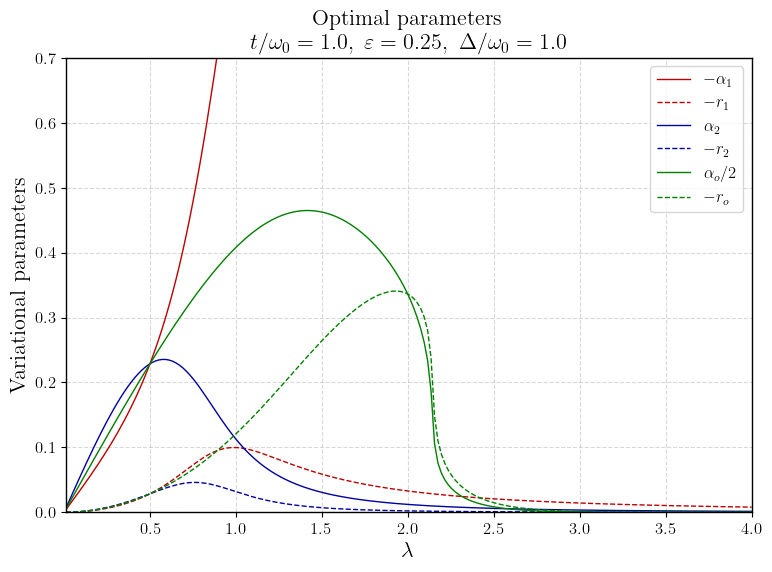

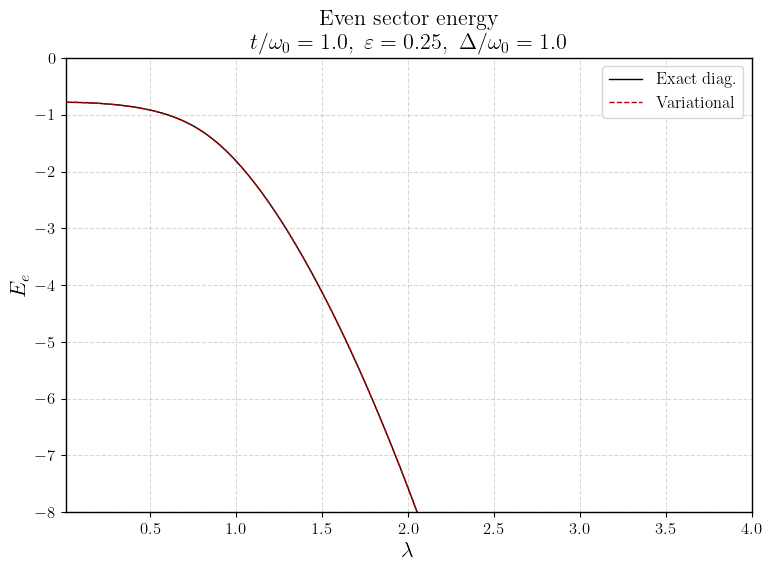

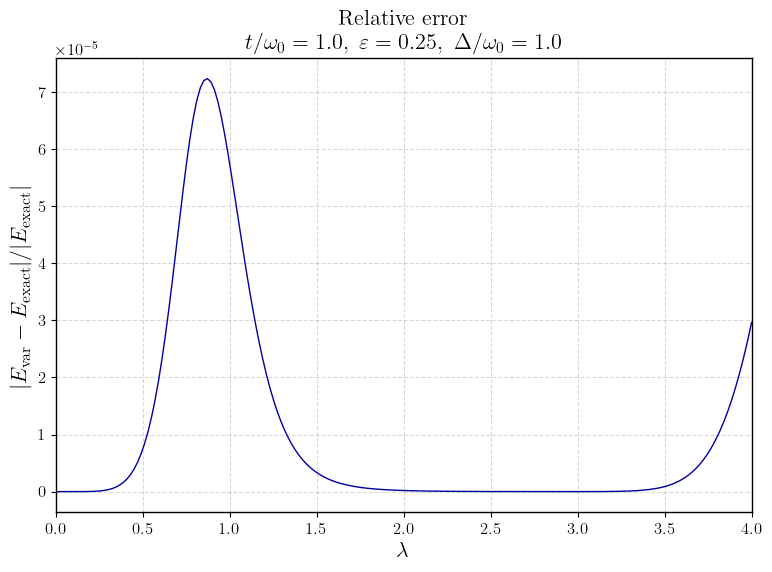

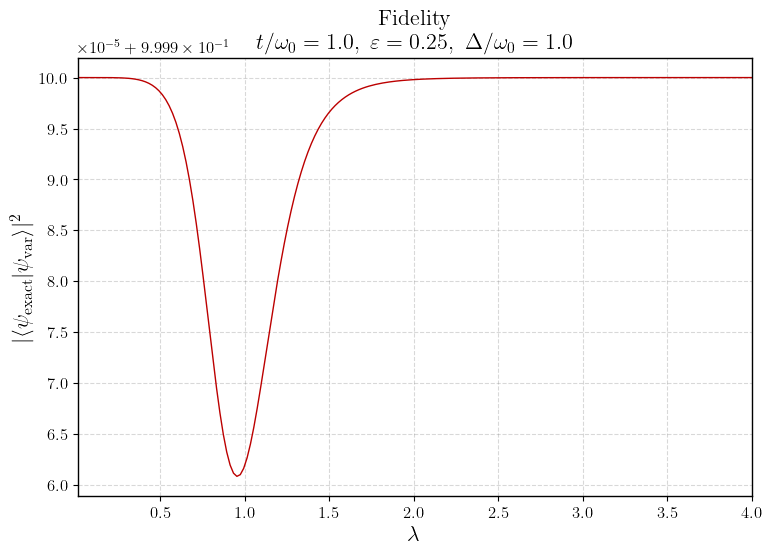

In [9]:
# ─── Even sector plots ────────────────────────────────────────
pstr_e = rf"$t/\omega_0={t/omega0},\ \varepsilon={eps_val},\ \Delta/\omega_0={Delta_e/omega0}$"

# (1) The 4 parameters
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lam_var, -a1_arr, '-',  color=C_B, lw=1.0, label=r'$-\alpha_1$')
ax.plot(lam_var, -r1_arr, '--', color=C_B, lw=1.0, label=r'$-r_1$')
ax.plot(lam_var, a2_arr, '-',  color=C_A, lw=1.0, label=r'$\alpha_2$')
ax.plot(lam_var, -r2_arr, '--', color=C_A, lw=1.0, label=r'$-r_2$')
ax.plot(lam_var, alpha_arr/2, '-', color='green', lw=1.0, label=r'$\alpha_o/2$')
ax.plot(lam_var, -r_arr,     '--', color='green' ,lw=1.0, label=r'$-r_o$')
ax.set_ylim(0, 0.7)
ax.set_xlim(0.01,4.0)
ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(r'Variational parameters')
ax.set_title(r'Optimal parameters' + '\n' + pstr_e)
ax.legend(); ax.grid(alpha=0.3, ls='--')
plt.tight_layout(); plt.show()

# (2) Energy: var vs exact   (3) Relative error   (4) Fidelity
for arr, ylab, ttl, logy in [
    ((Eve_ex, Eve_arr), r'$E_e$', 'Even sector energy', False),
    (relerr_e, r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
     'Relative error', True),
    (fide_arr, r'$|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
     'Fidelity', False)]:
    fig, ax = plt.subplots(figsize=(8, 6))
    if isinstance(arr, tuple):
        ax.plot(lam_var, arr[0], '-',  color='k', lw=1.0, label=r'Exact diag.')
        ax.plot(lam_var, arr[1], '--', color=C_B, lw=1.0, label=r'Variational')
        #ax.plot(lam_var, Eex_arr,  '-',  color='k', lw=1.0, label=r'Exact diag.')
        #ax.plot(lam_var, Evar_arr, '--', color=C_B, lw=1.0, label=r'Variational')
        ax.set_xlim(0.01,4.0)
        ax.set_ylim(-8.0, 0.0)
        ax.legend()
    elif logy:
        ax.plot(lam_var, arr, '-', color=C_A, lw=1.0)
        ax.set_xlim(0.0,4.0)
    else:
        ax.plot(lam_var, arr, '-', color=C_B, lw=1.0)
        ax.set_xlim(0.01,4.0)
    ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(ylab)
    ax.set_title(ttl + '\n' + pstr_e)
    ax.grid(alpha=0.3, ls='--', which='both')
    plt.tight_layout(); plt.show()

### Photonic observables and correlations

In [24]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — observables analíticos GS (impar y par)
# ══════════════════════════════════════════════════════════════════
from tqdm.auto import tqdm

omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 200)
cv_list = [0.5, 1.0, 1.5]              # t/ω0 (impar)  y  Δ/ω0 (par)

# ─── SECTOR IMPAR: observables como función de (α, r) ─────────────
def obs_odd(alpha, r, lam):
    b   = alpha/2.0 - lam/_S2                  # β = α/2 − λ/√2
    sh, ch = np.sinh(r), np.cosh(r)
    mu  = b*b + sh*sh                          # ⟨m_r⟩
    out = {}
    out['m_r']      = mu
    out['X2_r']     = 2.0*b*b + 0.5*np.exp(-2.0*r)
    out['P2_r']     = 0.5*np.exp(2.0*r)
    out['nmX_r']    = alpha/_S2 - lam          # ⟨n_- X_r⟩
    out['nmX_r_lam']= alpha/(_S2*lam) - 1.0    # ⟨n_- X_r⟩/λ
    sig             = 2.0*ch*ch*sh*sh + b*b*np.exp(-2.0*r)
    out['F_r']      = sig/mu
    X2_c            = lam*lam + 0.5            # CoM espectador (coherente)
    out['X1X2']     = 0.5*(X2_c - out['X2_r'])
    return out

# ─── SECTOR PAR: observables como función de (α1,α2,r1,r2,c1²,c2²) ─
def obs_even(a1, a2, r1, r2, w1, w2, lam):
    a2p = a2 - _S2*lam                         # α2' = α2 − √2 λ
    s1, s2 = np.sinh(r1), np.sinh(r2)
    c1h, c2h = np.cosh(r1), np.cosh(r2)
    mu1 = a1*a1   + s1*s1                       # μ1
    mu2 = a2p*a2p + s2*s2                       # μ2
    sig1 = 2.0*c1h*c1h*s1*s1 + a1*a1  *np.exp(-2.0*r1)
    sig2 = 2.0*c2h*c2h*s2*s2 + a2p*a2p*np.exp(-2.0*r2)
    Xc   = _S2*(w1*a1 + w2*a2p)
    out = {}
    out['m_c']   = w1*mu1 + w2*mu2
    out['X_c']   = Xc
    out['X2_c']  = w1*(2.0*a1*a1 + 0.5*np.exp(-2.0*r1)) + w2*(2.0*a2p*a2p + 0.5*np.exp(-2.0*r2))
    out['P2_c']  = w1*0.5*np.exp(2.0*r1) + w2*0.5*np.exp(2.0*r2)
    out['npX_c']     = 2.0*_S2*w2*a2p
    out['npX_c_lam'] = 2.0*_S2*w2*(a2/lam - _S2)
    out['dX2_c'] = (w1*0.5*np.exp(-2.0*r1) + w2*0.5*np.exp(-2.0*r2)
                    + 2.0*w1*w2*(a1 - a2 + _S2*lam)**2)
    out['F_c']   = (w1*sig1 + w2*sig2 + w1*w2*(mu1 - mu2)**2) / (w1*mu1 + w2*mu2)
    X2_r         = 0.5                          # relativo espectador (vacío)
    out['X1X2']  = 0.5*(out['X2_c'] - X2_r)
    return out

# ─── barrido y almacenamiento ────────────────────────────────────
keys_odd  = ['m_r','X2_r','P2_r','nmX_r','nmX_r_lam','F_r','X1X2']
keys_even = ['m_c','X_c','X2_c','P2_c','npX_c','npX_c_lam','dX2_c','F_c','X1X2']

O_odd  = {k: {cv: np.empty_like(lam_arr) for cv in cv_list} for k in keys_odd}
O_even = {k: {cv: np.empty_like(lam_arr) for cv in cv_list} for k in keys_even}

# barra única sobre el total de puntos (2 sectores × |cv_list| × |lam_arr|)
total = 2 * len(cv_list) * len(lam_arr)
pbar = tqdm(total=total, desc="Barrido observables")

for cv in cv_list:
    # ----- IMPAR (t = cv) -----
    t = cv
    warm = None
    for j, lam in enumerate(lam_arr):
        _, x = minimize_odd(lam, x_warm=warm); warm = x
        d = obs_odd(x[0], x[1], lam)
        for k in keys_odd:
            O_odd[k][cv][j] = d[k]
        pbar.update(1)

    # ----- PAR (Δ = cv) -----
    warm = None
    for j, lam in enumerate(lam_arr):
        _, x = minimize_even(lam, cv, x_warm=warm); warm = x
        w1, w2 = get_weights_even(lam, cv, x)
        d = obs_even(x[0], x[1], x[2], x[3], w1, w2, lam)
        for k in keys_even:
            O_even[k][cv][j] = d[k]
        pbar.update(1)

pbar.close()
print("Observables analíticos listos (impar y par).")

Barrido observables:   0%|          | 0/1200 [00:00<?, ?it/s]

Barrido observables: 100%|██████████| 1200/1200 [00:12<00:00, 94.09it/s] 

Observables analíticos listos (impar y par).


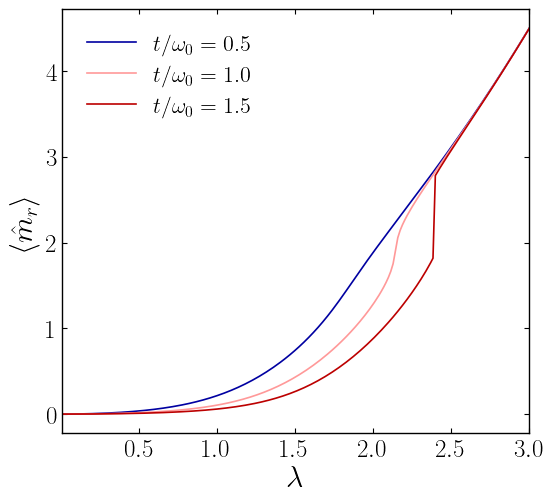

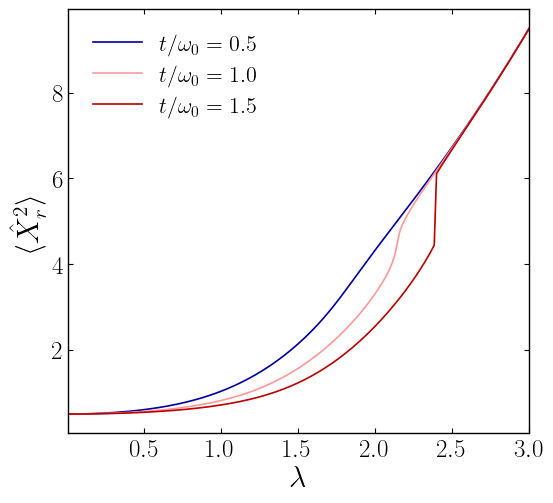

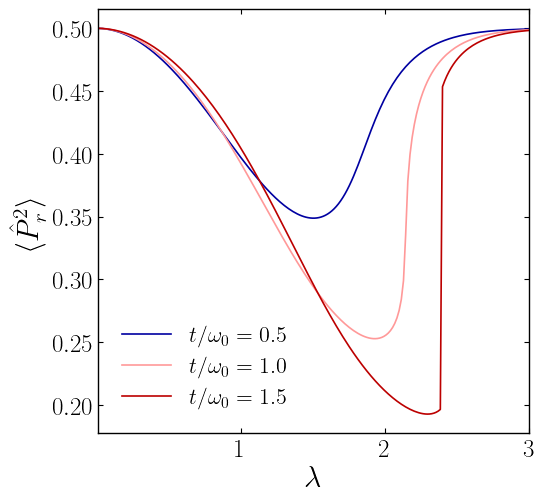

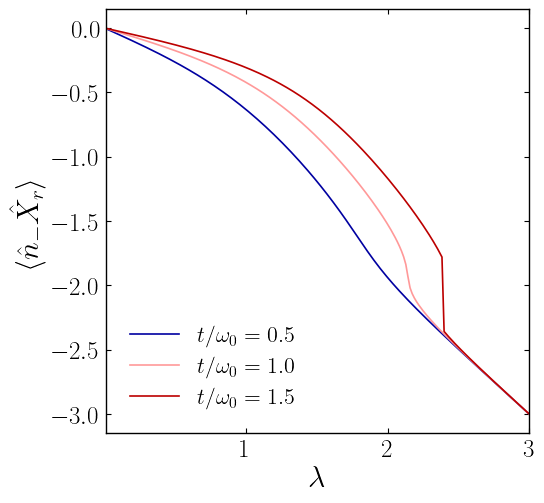

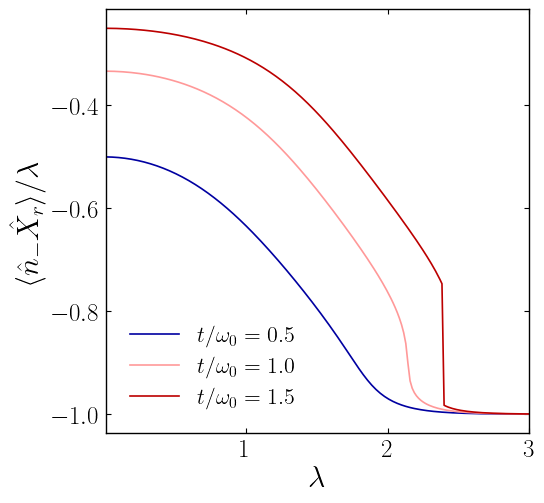

...

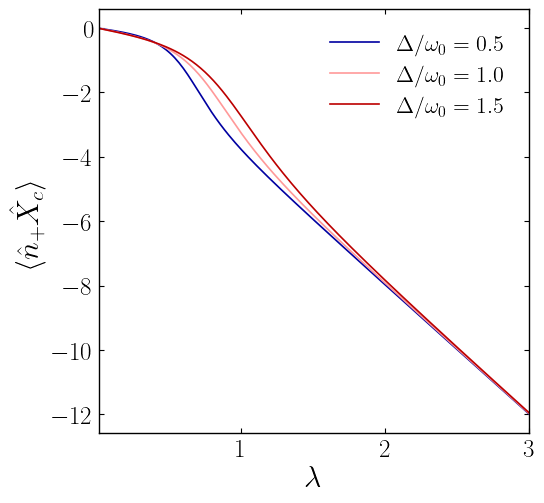

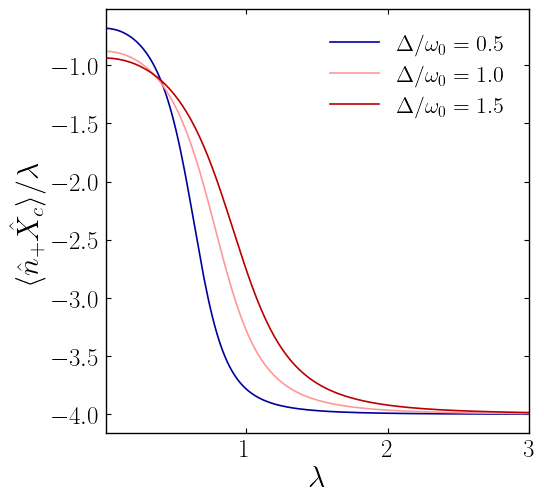

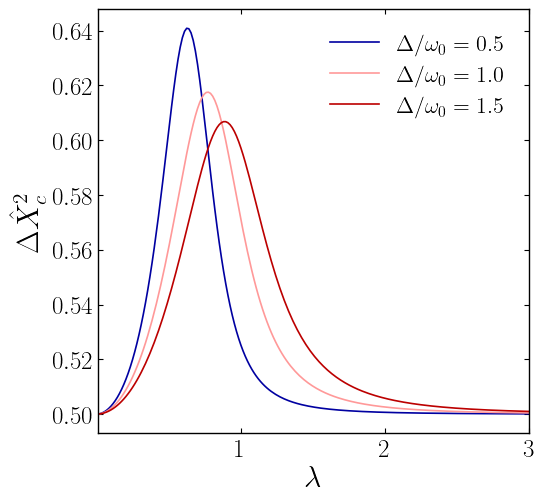

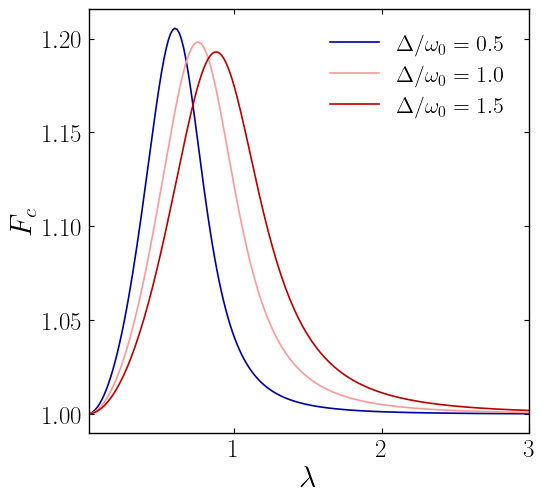

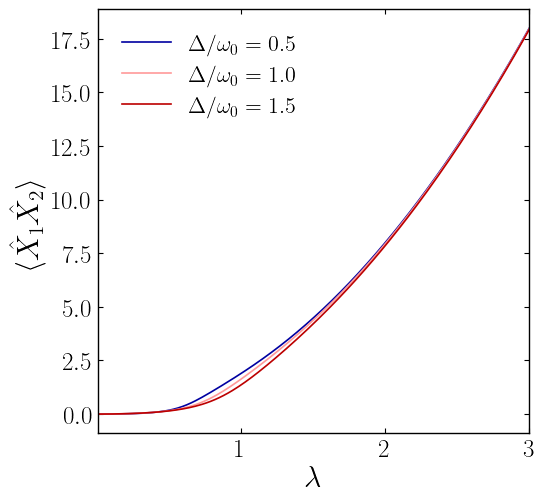

In [25]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — observables (estilo consolidado)
# ══════════════════════════════════════════════════════════════════
COLS = [plt.cm.seismic(0.12), plt.cm.seismic(0.6), plt.cm.seismic(0.88)]
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

def _style(ax, ylabel, coupling_sym):
    ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(ylabel)
    ax.set_xlim(0.01, lam_arr.max())
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

def plot_observable(data, keylabel, ylabel, coupling_sym, fname=None):
    fig, ax = plt.subplots(figsize=(6, 5.5))
    for cv, c in zip(cv_list, COLS):
        ax.plot(lam_arr, data[cv], '-', color=c, lw=1.2,
                label=rf'${coupling_sym}/\omega_0={cv}$')
    _style(ax, ylabel, coupling_sym)
    if fname is not None:
        plt.savefig('Observables_Variacional/' + fname, bbox_inches='tight', transparent=False, dpi=300)
    plt.tight_layout(); plt.show()

# ─── (i) SECTOR IMPAR ────────────────────────────────────────────
plot_observable(O_odd['m_r'],       'm_r',  r'$\langle \hat{m}_r\rangle$',                       't', 'odd_mr.png')
plot_observable(O_odd['X2_r'],      'X2_r', r'$\langle \hat{X}_r^2\rangle$',                     't', 'odd_X2r.png')
plot_observable(O_odd['P2_r'],      'P2_r', r'$\langle \hat{P}_r^2\rangle$',                     't', 'odd_P2r.png')
plot_observable(O_odd['nmX_r'],     'nmXr', r'$\langle \hat{n}_- \hat{X}_r\rangle$',             't', 'odd_nmXr.png')
plot_observable(O_odd['nmX_r_lam'], 'nmXl', r'$\langle \hat{n}_- \hat{X}_r\rangle/\lambda$',     't', 'odd_nmXr_lam.png')
plot_observable(O_odd['F_r'],       'Fr',   r'$F_r$',                                            't', 'odd_Fr.png')
plot_observable(O_odd['X1X2'], 'X1X2', r'$\langle \hat{X}_1 \hat{X}_2\rangle$', 't', 'odd_X1X2.png')

# ─── (ii) SECTOR PAR ─────────────────────────────────────────────
plot_observable(O_even['m_c'],       'm_c',  r'$\langle \hat{m}_c\rangle$',                      r'\Delta', 'even_mc.png')
plot_observable(O_even['X_c'],       'X_c',  r'$\langle \hat{X}_c\rangle$',                      r'\Delta', 'even_Xc.png')
plot_observable(O_even['X2_c'],      'X2_c', r'$\langle \hat{X}_c^2\rangle$',                    r'\Delta', 'even_X2c.png')
plot_observable(O_even['P2_c'],      'P2_c', r'$\langle \hat{P}_c^2\rangle$',                    r'\Delta', 'even_P2c.png')
plot_observable(O_even['npX_c'],     'npXc', r'$\langle \hat{n}_+ \hat{X}_c\rangle$',            r'\Delta', 'even_npXc.png')
plot_observable(O_even['npX_c_lam'], 'npXl', r'$\langle \hat{n}_+ \hat{X}_c\rangle/\lambda$', r'\Delta', 'even_npXc_lam.png')
plot_observable(O_even['dX2_c'],     'dX2c', r'$\Delta \hat{X}_c^2$',                            r'\Delta', 'even_dX2c.png')
plot_observable(O_even['F_c'],       'Fc',   r'$F_c$',                                           r'\Delta', 'even_Fc.png')
plot_observable(O_even['X1X2'], 'X1X2', r'$\langle \hat{X}_1 \hat{X}_2\rangle$', r'\Delta', 'even_X1X2.png')

In [94]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — observables en el plano (λ, s)  [heatmaps]
#   s = t  (impar)   |   s = Δ  (par)
# ══════════════════════════════════════════════════════════════════

omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 300)
s_arr   = np.linspace(0.01, 3.0, 300)     # t (impar) o Δ (par)

# ─── obs por sector (idénticas a tu versión) ─────────────────────
def obs_odd(alpha, r, lam):
    b   = alpha/2.0 - lam/_S2
    sh, ch = np.sinh(r), np.cosh(r)
    mu  = b*b + sh*sh
    out = {}
    out['m_r']      = mu
    out['X2_r']     = 2.0*b*b + 0.5*np.exp(-2.0*r)
    out['P2_r']     = 0.5*np.exp(2.0*r)
    out['nmX_r']    = alpha/_S2 - lam
    out['nmX_r_lam']= alpha/(_S2*lam) - 1.0
    sig             = 2.0*ch*ch*sh*sh + b*b*np.exp(-2.0*r)
    out['F_r']      = sig/mu
    X2_c            = lam*lam + 0.5
    out['X1X2']     = 0.5*(X2_c - out['X2_r'])
    return out

def obs_even(a1, a2, r1, r2, w1, w2, lam):
    a2p = a2 - _S2*lam
    s1, s2 = np.sinh(r1), np.sinh(r2)
    c1h, c2h = np.cosh(r1), np.cosh(r2)
    mu1 = a1*a1   + s1*s1
    mu2 = a2p*a2p + s2*s2
    sig1 = 2.0*c1h*c1h*s1*s1 + a1*a1  *np.exp(-2.0*r1)
    sig2 = 2.0*c2h*c2h*s2*s2 + a2p*a2p*np.exp(-2.0*r2)
    out = {}
    out['m_c']   = w1*mu1 + w2*mu2
    out['X_c']   = _S2*(w1*a1 + w2*a2p)
    out['X2_c']  = w1*(2.0*a1*a1 + 0.5*np.exp(-2.0*r1)) + w2*(2.0*a2p*a2p + 0.5*np.exp(-2.0*r2))
    out['P2_c']  = w1*0.5*np.exp(2.0*r1) + w2*0.5*np.exp(2.0*r2)
    out['npX_c']     = 2.0*_S2*w2*a2p
    out['npX_c_lam'] = 2.0*_S2*w2*(a2/lam - _S2)
    out['dX2_c'] = (w1*0.5*np.exp(-2.0*r1) + w2*0.5*np.exp(-2.0*r2)
                    + 2.0*w1*w2*(a1 - a2 + _S2*lam)**2)
    out['F_c']   = (w1*sig1 + w2*sig2 + w1*w2*(mu1 - mu2)**2) / (w1*mu1 + w2*mu2)
    X2_r         = 0.5
    out['X1X2']  = 0.5*(out['X2_c'] - X2_r)
    return out

keys_odd  = ['m_r','X2_r','P2_r','nmX_r','nmX_r_lam','F_r','X1X2']
keys_even = ['m_c','X_c','X2_c','P2_c','npX_c','npX_c_lam','dX2_c','F_c','X1X2']

# almacenamiento 2D:  M[clave][i_s, j_lam]
M_odd  = {k: np.full((len(s_arr), len(lam_arr)), np.nan) for k in keys_odd}
M_even = {k: np.full((len(s_arr), len(lam_arr)), np.nan) for k in keys_even}

total = 2 * len(s_arr) * len(lam_arr)
pbar = tqdm(total=total, desc="Heatmaps (λ, s)")

# ----- IMPAR: s = t -----
for i, sv in enumerate(s_arr):
    t = sv                                    # el impar lee t global
    warm = None
    for j, lam in enumerate(lam_arr):
        _, x = minimize_odd(lam, x_warm=warm); warm = x
        d = obs_odd(x[0], x[1], lam)
        for k in keys_odd:
            M_odd[k][i, j] = d[k]
        pbar.update(1)

# ----- PAR: s = Δ -----
for i, sv in enumerate(s_arr):
    warm = None
    for j, lam in enumerate(lam_arr):
        _, x = minimize_even(lam, sv, x_warm=warm); warm = x
        w1, w2 = get_weights_even(lam, sv, x)
        d = obs_even(x[0], x[1], x[2], x[3], w1, w2, lam)
        for k in keys_even:
            M_even[k][i, j] = d[k]
        pbar.update(1)

pbar.close()
print("Heatmaps listos (impar y par).")

Heatmaps (λ, s): 100%|██████████| 180000/180000 [26:53<00:00, 111.58it/s]

Heatmaps listos (impar y par).


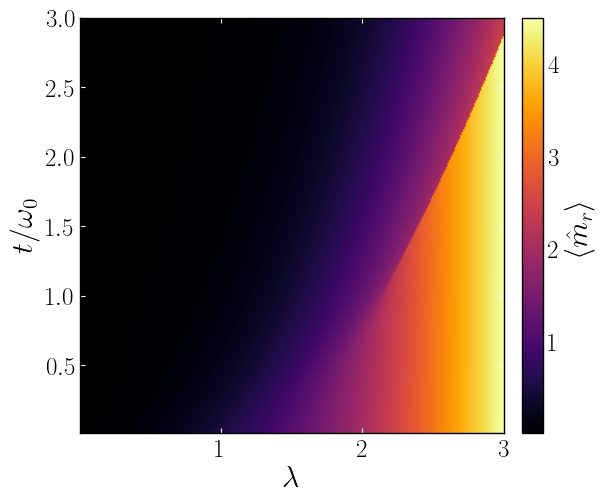

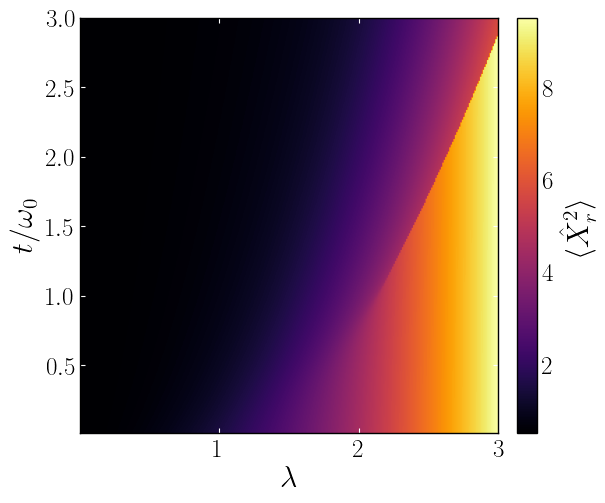

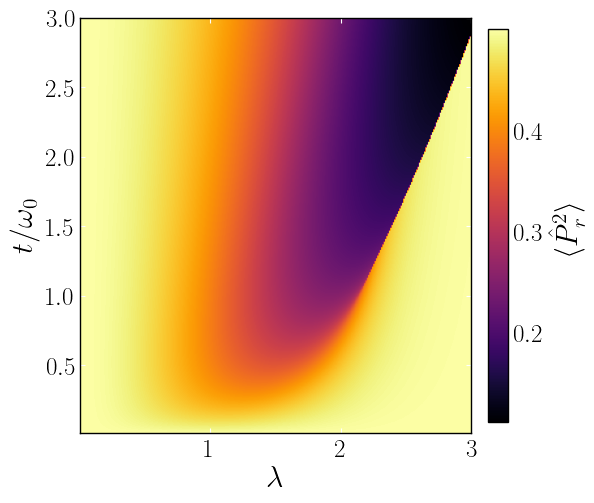

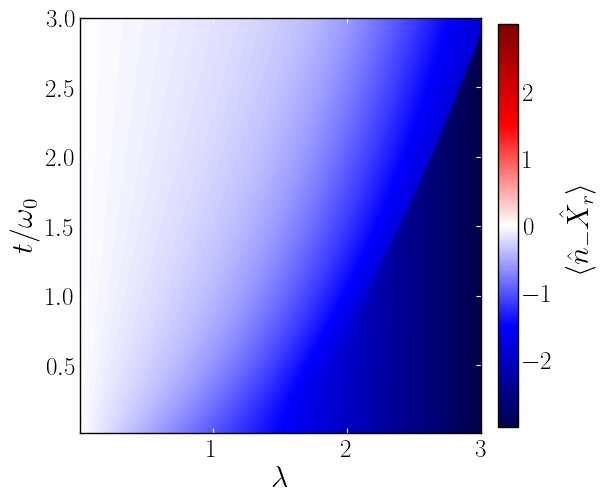

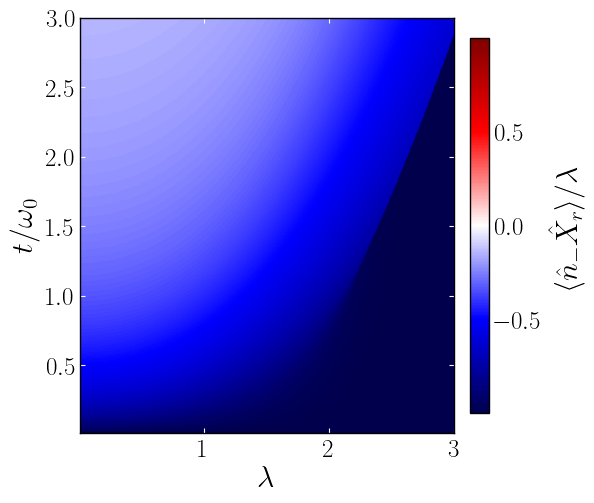

...

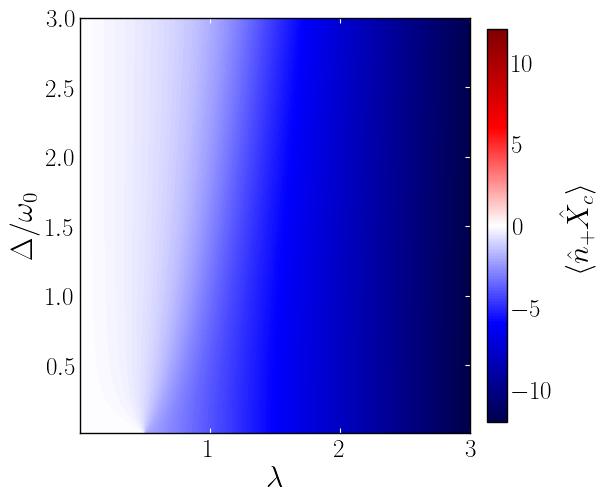

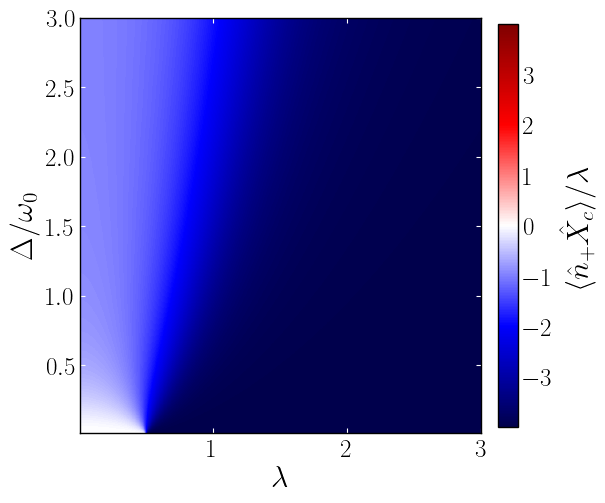

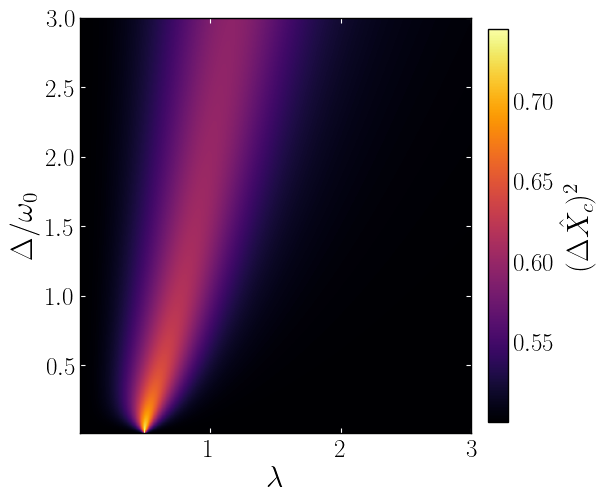

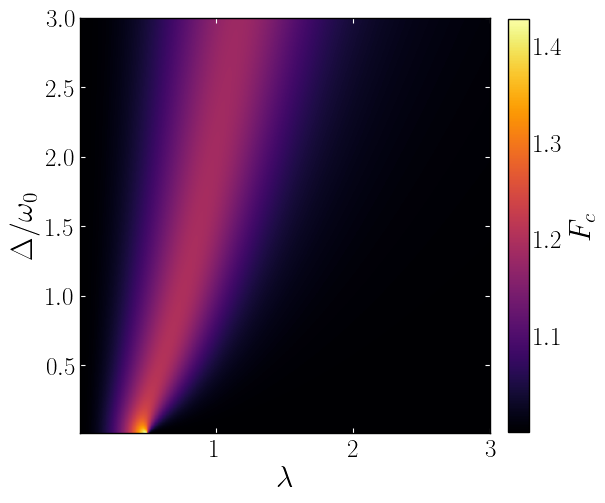

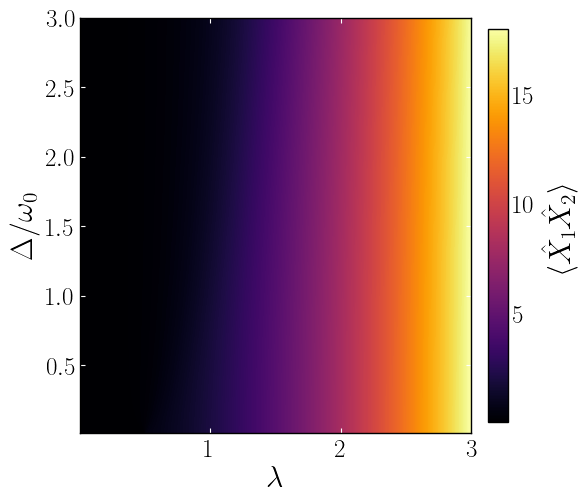

In [95]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — un heatmap por observable
# ══════════════════════════════════════════════════════════════════
from matplotlib.colors import TwoSlopeNorm
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

extent = [lam_arr[0], lam_arr[-1], s_arr[0], s_arr[-1]]   # x=λ, y=s

def plot_heatmap(M, ylabel_s, title, fname=None, diverging=False):
    fig, ax = plt.subplots(figsize=(6.5, 5.5))
    data = M
    if diverging:
        vmax = np.nanmax(np.abs(data))
        norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
        cmap = 'seismic'
    else:
        norm = None
        cmap = 'inferno'
    im = ax.imshow(data, origin='lower', aspect='auto', extent=extent,
                   cmap=cmap, norm=norm)
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cb.set_label(title)
    ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(ylabel_s)
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True,
                   color='white')
    if fname is not None:
        plt.savefig('Observables_Variacional/' + fname, bbox_inches='tight', transparent=False, dpi=300)
    plt.tight_layout(); plt.show()

# ─── SECTOR IMPAR  (eje y = t/ω0) ────────────────────────────────
yl_o = r'$t/\omega_0$'
plot_heatmap(M_odd['m_r'],       yl_o, r'$\langle \hat{m}_r\rangle$',               'hm_odd_mr.png')
plot_heatmap(M_odd['X2_r'],      yl_o, r'$\langle \hat{X}_r^2\rangle$',             'hm_odd_X2r.png')
plot_heatmap(M_odd['P2_r'],      yl_o, r'$\langle \hat{P}_r^2\rangle$',             'hm_odd_P2r.png')
plot_heatmap(M_odd['nmX_r'],     yl_o, r'$\langle \hat{n}_- \hat{X}_r\rangle$',     'hm_odd_nmXr.png',     diverging=True)
plot_heatmap(M_odd['nmX_r_lam'], yl_o, r'$\langle \hat{n}_- \hat{X}_r\rangle/\lambda$', 'hm_odd_nmXr_lam.png', diverging=True)
plot_heatmap(M_odd['F_r'],       yl_o, r'$F_r$',                                    'hm_odd_Fr.png')
plot_heatmap(M_odd['X1X2'],      yl_o, r'$\langle \hat{X}_1 \hat{X}_2\rangle$',     'hm_odd_X1X2.png',     diverging=True)

# ─── SECTOR PAR  (eje y = Δ/ω0) ──────────────────────────────────
yl_e = r'$\Delta/\omega_0$'
plot_heatmap(M_even['m_c'],       yl_e, r'$\langle \hat{m}_c\rangle$',              'hm_even_mc.png')
plot_heatmap(M_even['X_c'],       yl_e, r'$\langle \hat{X}_c\rangle$',              'hm_even_Xc.png',      diverging=True)
plot_heatmap(M_even['X2_c'],      yl_e, r'$\langle \hat{X}_c^2\rangle$',            'hm_even_X2c.png')
plot_heatmap(M_even['P2_c'],      yl_e, r'$\langle \hat{P}_c^2\rangle$',            'hm_even_P2c.png')
plot_heatmap(M_even['npX_c'],     yl_e, r'$\langle \hat{n}_+ \hat{X}_c\rangle$',    'hm_even_npXc.png',    diverging=True)
plot_heatmap(M_even['npX_c_lam'], yl_e, r'$\langle \hat{n}_+ \hat{X}_c\rangle/\lambda$', 'hm_even_npXc_lam.png', diverging=True)
plot_heatmap(M_even['dX2_c'],     yl_e, r'$(\Delta \hat{X}_c)^2$',                  'hm_even_dX2c.png')
plot_heatmap(M_even['F_c'],       yl_e, r'$F_c$',                                   'hm_even_Fc.png')
plot_heatmap(M_even['X1X2'],      yl_e, r'$\langle \hat{X}_1 \hat{X}_2\rangle$',    'hm_even_X1X2.png')

In [22]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — observables del GS GLOBAL (sector ganador)
# ══════════════════════════════════════════════════════════════════

omega0  = 1.0
eps_val = 0.25
t       = 1.0                      # fijo
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 200)
dv_list = [0.5, 1.0, 1.5]          # Δ/(t·ω0)  → Δ = dv * t * ω0

# ─── observables del sector IMPAR (modo rel activo, CoM espectador) ─
def obs_odd_full(alpha, r, lam):
    b   = alpha/2.0 - lam/_S2
    sh, ch = np.sinh(r), np.cosh(r)
    mu_r = b*b + sh*sh
    sig_r = 2.0*ch*ch*sh*sh + b*b*np.exp(-2.0*r)
    o = {}
    # modo relativo (activo)
    o['m_r']   = mu_r
    o['X2_r']  = 2.0*b*b + 0.5*np.exp(-2.0*r)
    o['P2_r']  = 0.5*np.exp(2.0*r)
    o['nmX_r'] = alpha/_S2 - lam
    o['F_r']   = sig_r/mu_r
    # modo CoM (espectador: coherente |-λ/√2⟩)
    o['m_c']   = lam*lam/2.0
    o['X2_c']  = lam*lam + 0.5
    o['P2_c']  = 0.5
    o['npX_c'] = -lam
    o['F_c']   = 1.0
    o['dX2_c'] = 0.5                       # coherente: ΔX² = 1/2
    return o

# ─── observables del sector PAR (modo CoM activo, rel espectador) ───
def obs_even_full(a1, a2, r1, r2, w1, w2, lam):
    a2p = a2 - _S2*lam
    s1, s2 = np.sinh(r1), np.sinh(r2)
    c1h, c2h = np.cosh(r1), np.cosh(r2)
    mu1 = a1*a1   + s1*s1
    mu2 = a2p*a2p + s2*s2
    sig1 = 2.0*c1h*c1h*s1*s1 + a1*a1  *np.exp(-2.0*r1)
    sig2 = 2.0*c2h*c2h*s2*s2 + a2p*a2p*np.exp(-2.0*r2)
    o = {}
    # modo CoM (activo)
    o['m_c']   = w1*mu1 + w2*mu2
    o['X2_c']  = w1*(2.0*a1*a1 + 0.5*np.exp(-2.0*r1)) + w2*(2.0*a2p*a2p + 0.5*np.exp(-2.0*r2))
    o['P2_c']  = w1*0.5*np.exp(2.0*r1) + w2*0.5*np.exp(2.0*r2)
    o['npX_c'] = 2.0*_S2*w2*a2p
    o['dX2_c'] = (w1*0.5*np.exp(-2.0*r1) + w2*0.5*np.exp(-2.0*r2)
                  + 2.0*w1*w2*(a1 - a2 + _S2*lam)**2)
    o['F_c']   = (w1*sig1 + w2*sig2 + w1*w2*(mu1 - mu2)**2) / (w1*mu1 + w2*mu2)
    # modo relativo (espectador: vacío)
    o['m_r']   = 0.0
    o['X2_r']  = 0.5
    o['P2_r']  = 0.5
    o['nmX_r'] = 0.0
    o['F_r']   = 1.0
    return o

# ─── claves y almacenamiento ─────────────────────────────────────
keys = ['m_c','m_r','m_sum','F_r','F_c','X2_r','X2_c','P2_r','P2_c',
        'dX2_c','nmX_r','npX_c','nmX_r_lam','npX_c_lam','X1X2']
        
O = {k: {dv: np.empty_like(lam_arr) for dv in dv_list} for k in keys}
winner = {dv: np.empty(len(lam_arr), dtype=int) for dv in dv_list}   # 0=impar, 1=par

total = len(dv_list) * len(lam_arr)
pbar = tqdm(total=total, desc="GS global (sector ganador)")

for dv in dv_list:
    Delta = dv * t * omega0
    warm_o = warm_e = None
    for j, lam in enumerate(lam_arr):
        # 1) parámetros y energía de AMBOS sectores
        Eo, xo = minimize_odd(lam, x_warm=warm_o);            warm_o = xo
        Ee, xe = minimize_even(lam, Delta, x_warm=warm_e);    warm_e = xe

        # 2) elegir el GS de menor energía
        if Eo <= Ee:
            o = obs_odd_full(xo[0], xo[1], lam)
            winner[dv][j] = 0
        else:
            w1, w2 = get_weights_even(lam, Delta, xe)
            o = obs_even_full(xe[0], xe[1], xe[2], xe[3], w1, w2, lam)
            winner[dv][j] = 1

        # 3) observables (incluye combinaciones derivadas)
        o['m_sum']     = o['m_r'] + o['m_c']
        o['nmX_r_lam'] = o['nmX_r'] / lam
        o['npX_c_lam'] = o['npX_c'] / lam
        o['X1X2']      = 0.5 * (o['X2_c'] - o['X2_r'])      # ⟨X₁X₂⟩
        for k in keys:
            O[k][dv][j] = o[k]
        pbar.update(1)

pbar.close()
print("Observables del GS global listos.")
for dv in dv_list:
    nflip = np.sum(np.abs(np.diff(winner[dv])))
    print(f"  Δ/(\omega_0 t)={dv}: cambios de sector ganador = {nflip}")

GS global (sector ganador): 100%|██████████| 600/600 [00:11<00:00, 51.46it/s]

Observables del GS global listos.
  Δ/(\omega_0 t)=0.5: cambios de sector ganador = 1
  Δ/(\omega_0 t)=1.0: cambios de sector ganador = 0
  Δ/(\omega_0 t)=1.5: cambios de sector ganador = 0


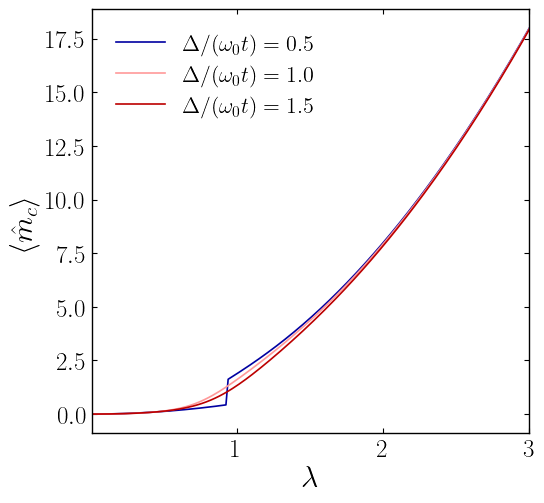

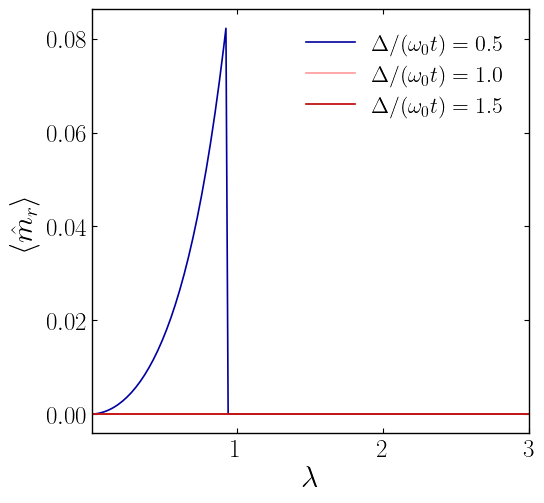

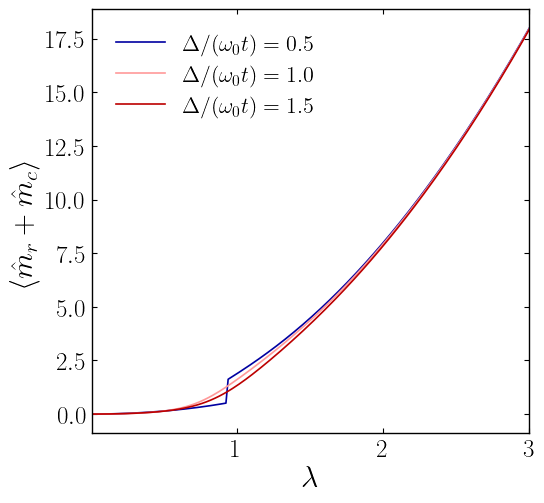

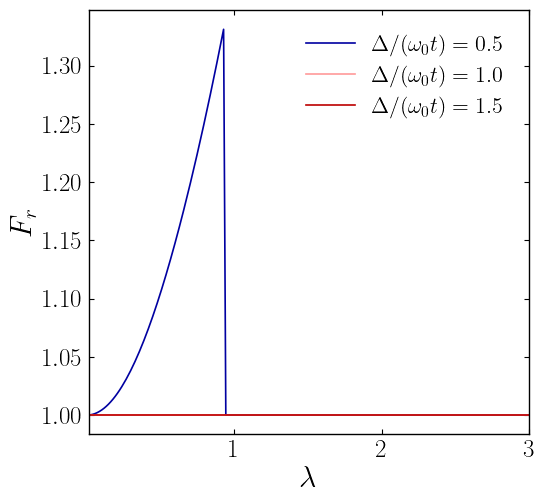

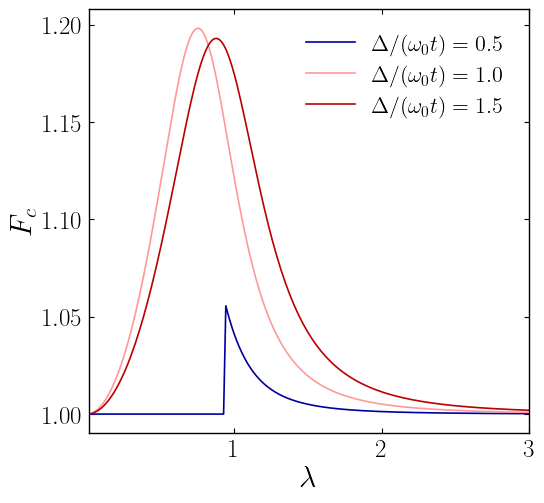

...

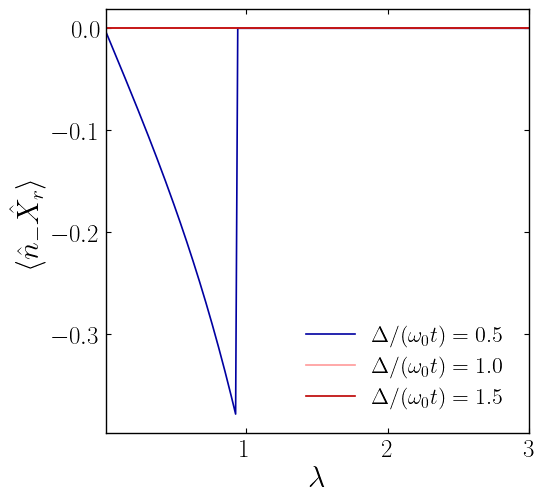

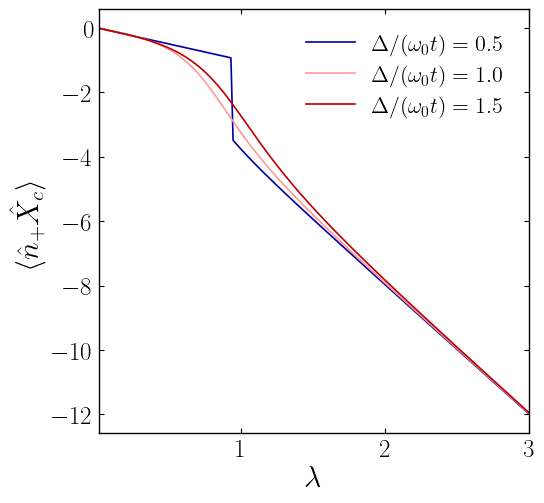

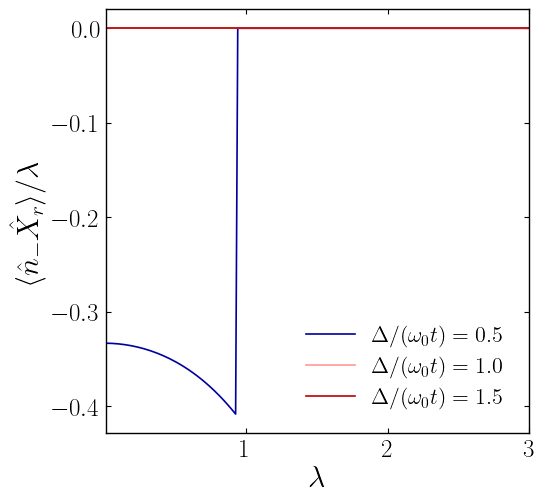

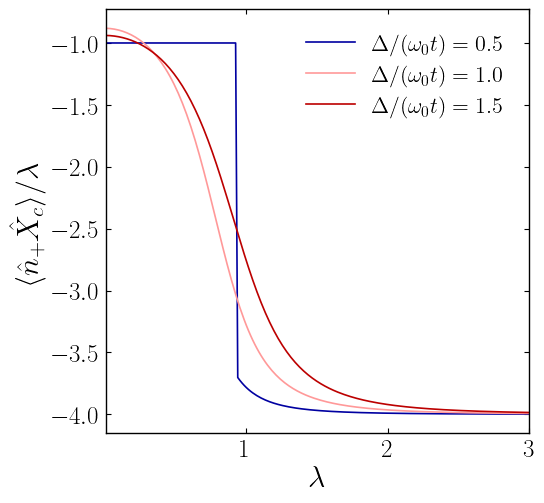

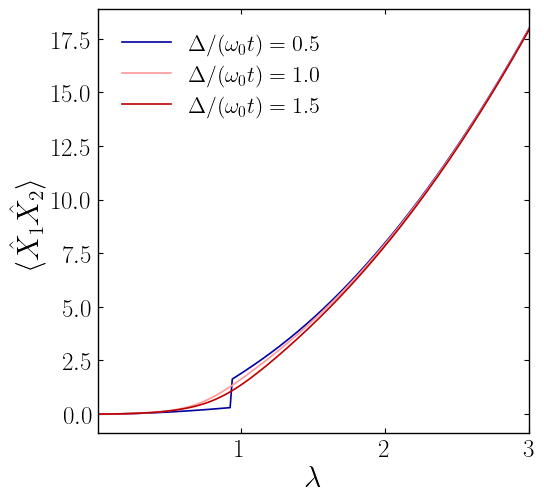

In [23]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — observables del GS global
# ══════════════════════════════════════════════════════════════════
COLS = [plt.cm.seismic(0.12), plt.cm.seismic(0.6), plt.cm.seismic(0.88)]
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

def plot_global(key, ylabel, fname=None):
    fig, ax = plt.subplots(figsize=(6, 5.5))
    for dv, c in zip(dv_list, COLS):
        ax.plot(lam_arr, O[key][dv], '-', color=c, lw=1.2,
                label=rf'$\Delta/(\omega_0 t)={dv}$')
    ax.set_xlabel(r'$\lambda/t$'); ax.set_ylabel(ylabel)
    ax.set_xlim(0.01, lam_arr.max())
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
    if fname is not None:
        plt.savefig('Observables_Variacional/' + fname, bbox_inches='tight', transparent=False, dpi=300)
    plt.tight_layout(); plt.show()

plot_global('m_c',       r'$\langle \hat{m}_c\rangle$',                  'gs_mc.png')
plot_global('m_r',       r'$\langle \hat{m}_r\rangle$',                  'gs_mr.png')
plot_global('m_sum',     r'$\langle \hat{m}_r+\hat{m}_c\rangle$',        'gs_msum.png')
plot_global('F_r',       r'$F_r$',                                       'gs_Fr.png')
plot_global('F_c',       r'$F_c$',                                       'gs_Fc.png')
plot_global('X2_r',      r'$\langle \hat{X}_r^2\rangle$',                'gs_X2r.png')
plot_global('X2_c',      r'$\langle \hat{X}_c^2\rangle$',                'gs_X2c.png')
plot_global('P2_r',      r'$\langle \hat{P}_r^2\rangle$',                'gs_P2r.png')
plot_global('P2_c',      r'$\langle \hat{P}_c^2\rangle$',                'gs_P2c.png')
plot_global('dX2_c',     r'$(\Delta \hat{X}_c)^2$',                      'gs_dX2c.png')
plot_global('nmX_r',     r'$\langle \hat{n}_- \hat{X}_r\rangle$',        'gs_nmXr.png')
plot_global('npX_c',     r'$\langle \hat{n}_+ \hat{X}_c\rangle$',        'gs_npXc.png')
plot_global('nmX_r_lam', r'$\langle \hat{n}_- \hat{X}_r\rangle/\lambda$','gs_nmXr_lam.png')
plot_global('npX_c_lam', r'$\langle \hat{n}_+ \hat{X}_c\rangle/\lambda$','gs_npXc_lam.png')
plot_global('X1X2', r'$\langle \hat{X}_1 \hat{X}_2\rangle$', 'gs_X1X2.png')

In [96]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — observables del GS GLOBAL en el plano (λ, Δ)
#   t = 1 fijo ;  se elige el sector de menor energía en cada punto
# ══════════════════════════════════════════════════════════════════

omega0  = 1.0
eps_val = 0.25
t       = 1.0                      # fijo
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 300)
Del_arr = np.linspace(0.01, 3.0, 300)     # Δ (eje y)

# ─── obs por sector (idénticas a tu versión global) ──────────────
def obs_odd_full(alpha, r, lam):
    b   = alpha/2.0 - lam/_S2
    sh, ch = np.sinh(r), np.cosh(r)
    mu_r = b*b + sh*sh
    sig_r = 2.0*ch*ch*sh*sh + b*b*np.exp(-2.0*r)
    o = {}
    o['m_r']   = mu_r
    o['X2_r']  = 2.0*b*b + 0.5*np.exp(-2.0*r)
    o['P2_r']  = 0.5*np.exp(2.0*r)
    o['nmX_r'] = alpha/_S2 - lam
    o['F_r']   = sig_r/mu_r
    o['m_c']   = lam*lam/2.0
    o['X2_c']  = lam*lam + 0.5
    o['P2_c']  = 0.5
    o['npX_c'] = -lam
    o['F_c']   = 1.0
    o['dX2_c'] = 0.5
    return o

def obs_even_full(a1, a2, r1, r2, w1, w2, lam):
    a2p = a2 - _S2*lam
    s1, s2 = np.sinh(r1), np.sinh(r2)
    c1h, c2h = np.cosh(r1), np.cosh(r2)
    mu1 = a1*a1   + s1*s1
    mu2 = a2p*a2p + s2*s2
    sig1 = 2.0*c1h*c1h*s1*s1 + a1*a1  *np.exp(-2.0*r1)
    sig2 = 2.0*c2h*c2h*s2*s2 + a2p*a2p*np.exp(-2.0*r2)
    o = {}
    o['m_c']   = w1*mu1 + w2*mu2
    o['X2_c']  = w1*(2.0*a1*a1 + 0.5*np.exp(-2.0*r1)) + w2*(2.0*a2p*a2p + 0.5*np.exp(-2.0*r2))
    o['P2_c']  = w1*0.5*np.exp(2.0*r1) + w2*0.5*np.exp(2.0*r2)
    o['npX_c'] = 2.0*_S2*w2*a2p
    o['dX2_c'] = (w1*0.5*np.exp(-2.0*r1) + w2*0.5*np.exp(-2.0*r2)
                  + 2.0*w1*w2*(a1 - a2 + _S2*lam)**2)
    o['F_c']   = (w1*sig1 + w2*sig2 + w1*w2*(mu1 - mu2)**2) / (w1*mu1 + w2*mu2)
    o['m_r']   = 0.0
    o['X2_r']  = 0.5
    o['P2_r']  = 0.5
    o['nmX_r'] = 0.0
    o['F_r']   = 1.0
    return o

keys = ['m_c','m_r','m_sum','F_r','F_c','X2_r','X2_c','P2_r','P2_c',
        'dX2_c','nmX_r','npX_c','nmX_r_lam','npX_c_lam','X1X2']

# almacenamiento 2D:  M[clave][i_Δ, j_λ]
M = {k: np.full((len(Del_arr), len(lam_arr)), np.nan) for k in keys}
W = np.zeros((len(Del_arr), len(lam_arr)), dtype=int)   # sector ganador (0=impar,1=par)

total = len(Del_arr) * len(lam_arr)
pbar = tqdm(total=total, desc="GS global (λ, Δ)")

for i, Delta in enumerate(Del_arr):
    warm_o = warm_e = None
    for j, lam in enumerate(lam_arr):
        Eo, xo = minimize_odd(lam, x_warm=warm_o);          warm_o = xo
        Ee, xe = minimize_even(lam, Delta, x_warm=warm_e);  warm_e = xe

        if Eo <= Ee:
            o = obs_odd_full(xo[0], xo[1], lam)
            W[i, j] = 0
        else:
            w1, w2 = get_weights_even(lam, Delta, xe)
            o = obs_even_full(xe[0], xe[1], xe[2], xe[3], w1, w2, lam)
            W[i, j] = 1

        o['m_sum']     = o['m_r'] + o['m_c']
        o['nmX_r_lam'] = o['nmX_r'] / lam if lam > 0 else np.nan
        o['npX_c_lam'] = o['npX_c'] / lam if lam > 0 else np.nan
        o['X1X2']      = 0.5 * (o['X2_c'] - o['X2_r'])
        for k in keys:
            M[k][i, j] = o[k]
        pbar.update(1)

pbar.close()
print("Heatmaps del GS global listos.")
print(f"  fracción de puntos con sector par ganador: {W.mean():.3f}")

GS global (λ, Δ): 100%|██████████| 90000/90000 [25:34<00:00, 58.67it/s]

Heatmaps del GS global listos.
  fracción de puntos con sector par ganador: 0.902


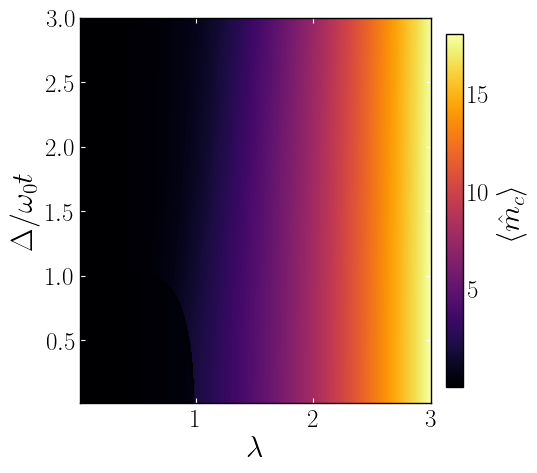

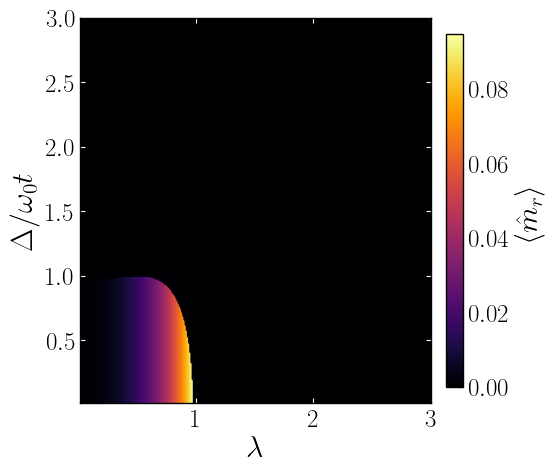

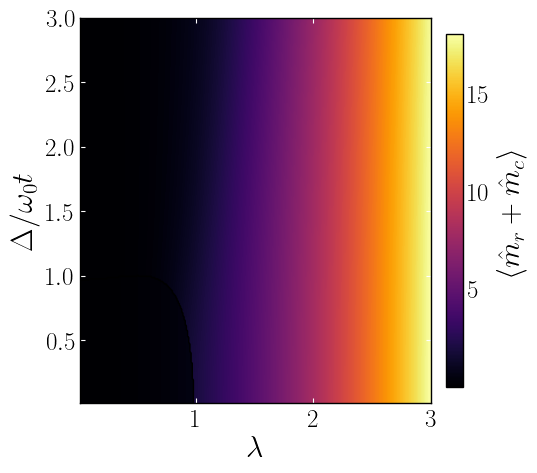

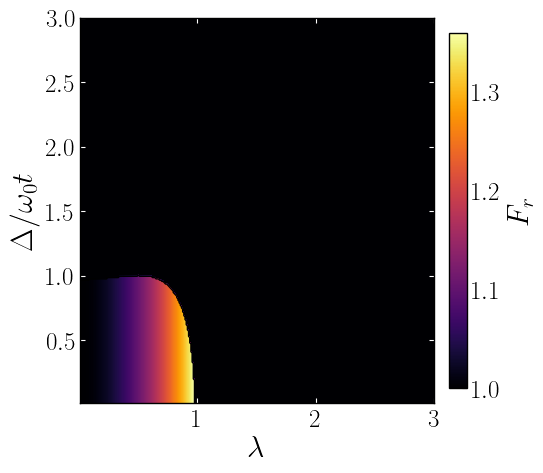

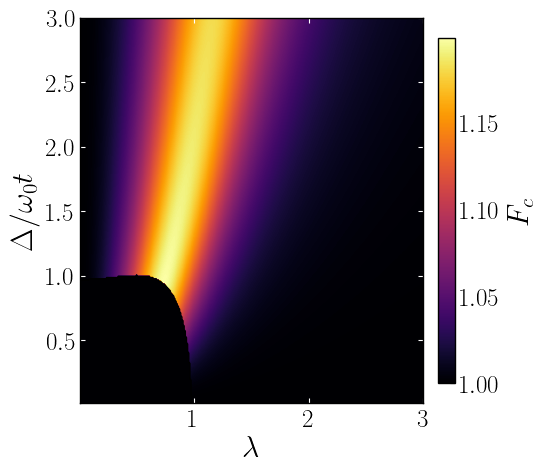

...

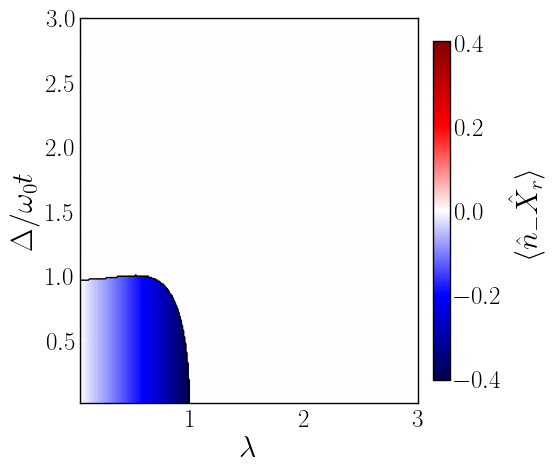

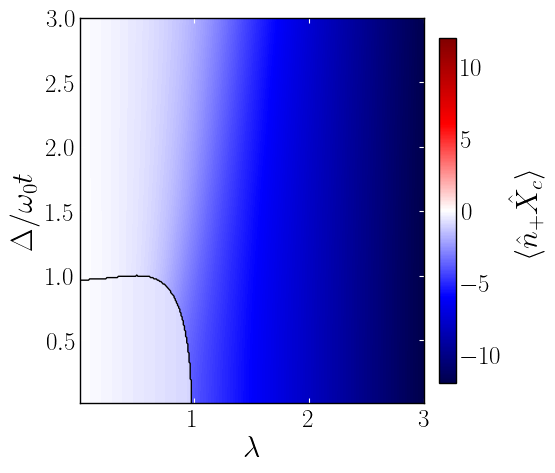

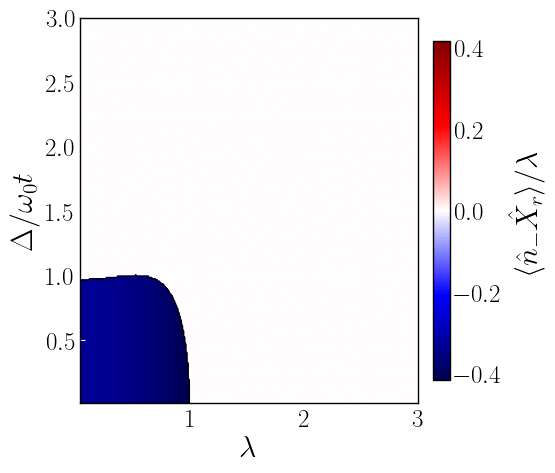

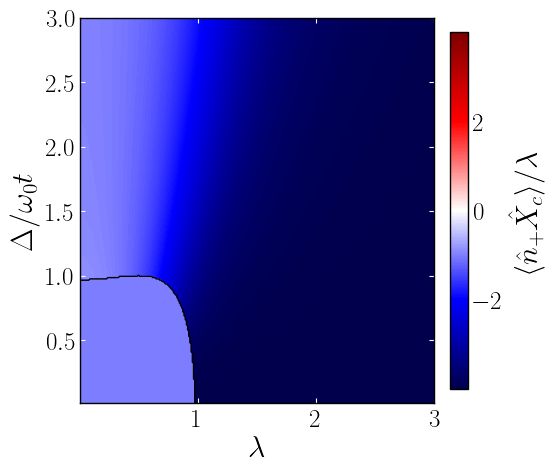

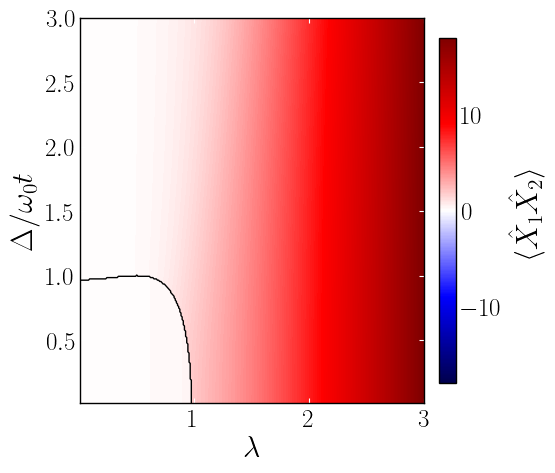

In [97]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — heatmaps del GS global (λ, Δ)
# ══════════════════════════════════════════════════════════════════

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

extent = [lam_arr[0], lam_arr[-1], Del_arr[0], Del_arr[-1]]   # x=λ, y=Δ

def plot_heatmap_global(data, title, fname=None, diverging=False, overlay_boundary=True):
    fig, ax = plt.subplots(figsize=(6, 5.2))
    if diverging:
        vmax = np.nanmax(np.abs(data))
        norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax); cmap = 'seismic'
    else:
        norm = None; cmap = 'inferno'
    im = ax.imshow(data, origin='lower', aspect='auto', extent=extent, cmap=cmap, norm=norm)
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04); cb.set_label(title)
    # frontera de paridad (contorno donde cambia el sector ganador)
    if overlay_boundary:
        ax.contour(lam_arr, Del_arr, W, levels=[0.5], colors='k', linewidths=1.0)
    ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(r'$\Delta/\omega_0 t$')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True,
                   left=True, right=True, color='white')
    if fname is not None:
        plt.savefig('Observables_Variacional/' + fname, bbox_inches='tight', transparent=False, dpi=300)
    plt.tight_layout(); plt.show()


# ─── observables ─────────────────────────────────────────────────
plot_heatmap_global(M['m_c'],       r'$\langle \hat{m}_c\rangle$',                   'hm_gs_mc.png')
plot_heatmap_global(M['m_r'],       r'$\langle \hat{m}_r\rangle$',                   'hm_gs_mr.png')
plot_heatmap_global(M['m_sum'],     r'$\langle \hat{m}_r+\hat{m}_c\rangle$',         'hm_gs_msum.png')
plot_heatmap_global(M['F_r'],       r'$F_r$',                                        'hm_gs_Fr.png')
plot_heatmap_global(M['F_c'],       r'$F_c$',                                        'hm_gs_Fc.png')
plot_heatmap_global(M['X2_r'],      r'$\langle \hat{X}_r^2\rangle$',                 'hm_gs_X2r.png')
plot_heatmap_global(M['X2_c'],      r'$\langle \hat{X}_c^2\rangle$',                 'hm_gs_X2c.png')
plot_heatmap_global(M['P2_r'],      r'$\langle \hat{P}_r^2\rangle$',                 'hm_gs_P2r.png')
plot_heatmap_global(M['P2_c'],      r'$\langle \hat{P}_c^2\rangle$',                 'hm_gs_P2c.png')
plot_heatmap_global(M['dX2_c'],     r'$(\Delta \hat{X}_c)^2$',                       'hm_gs_dX2c.png')
plot_heatmap_global(M['nmX_r'],     r'$\langle \hat{n}_- \hat{X}_r\rangle$',         'hm_gs_nmXr.png',     diverging=True)
plot_heatmap_global(M['npX_c'],     r'$\langle \hat{n}_+ \hat{X}_c\rangle$',         'hm_gs_npXc.png',     diverging=True)
plot_heatmap_global(M['nmX_r_lam'], r'$\langle \hat{n}_- \hat{X}_r\rangle/\lambda$', 'hm_gs_nmXr_lam.png', diverging=True)
plot_heatmap_global(M['npX_c_lam'], r'$\langle \hat{n}_+ \hat{X}_c\rangle/\lambda$', 'hm_gs_npXc_lam.png', diverging=True)
plot_heatmap_global(M['X1X2'],      r'$\langle \hat{X}_1 \hat{X}_2\rangle$',         'hm_gs_X1X2.png',     diverging=True)

In [26]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — observables del GS GLOBAL (sector ganador)
#                      Δ fijo, barriendo t/ω0
# ══════════════════════════════════════════════════════════════════

omega0  = 1.0
eps_val = 0.25
Delta   = 1.0                      # fijo
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 200)
tv_list = [0.5, 1.0, 1.5]          # t/ω0

# ─── observables del sector IMPAR (modo rel activo, CoM espectador) ─
def obs_odd_full(alpha, r, lam):
    b   = alpha/2.0 - lam/_S2
    sh, ch = np.sinh(r), np.cosh(r)
    mu_r = b*b + sh*sh
    sig_r = 2.0*ch*ch*sh*sh + b*b*np.exp(-2.0*r)
    o = {}
    # modo relativo (activo)
    o['m_r']   = mu_r
    o['X2_r']  = 2.0*b*b + 0.5*np.exp(-2.0*r)
    o['P2_r']  = 0.5*np.exp(2.0*r)
    o['nmX_r'] = alpha/_S2 - lam
    o['F_r']   = sig_r/mu_r
    # modo CoM (espectador: coherente |-λ/√2⟩)
    o['m_c']   = lam*lam/2.0
    o['X2_c']  = lam*lam + 0.5
    o['P2_c']  = 0.5
    o['npX_c'] = -lam
    o['F_c']   = 1.0
    o['dX2_c'] = 0.5                       # coherente: ΔX² = 1/2
    return o

# ─── observables del sector PAR (modo CoM activo, rel espectador) ───
def obs_even_full(a1, a2, r1, r2, w1, w2, lam):
    a2p = a2 - _S2*lam
    s1, s2 = np.sinh(r1), np.sinh(r2)
    c1h, c2h = np.cosh(r1), np.cosh(r2)
    mu1 = a1*a1   + s1*s1
    mu2 = a2p*a2p + s2*s2
    sig1 = 2.0*c1h*c1h*s1*s1 + a1*a1  *np.exp(-2.0*r1)
    sig2 = 2.0*c2h*c2h*s2*s2 + a2p*a2p*np.exp(-2.0*r2)
    o = {}
    # modo CoM (activo)
    o['m_c']   = w1*mu1 + w2*mu2
    o['X2_c']  = w1*(2.0*a1*a1 + 0.5*np.exp(-2.0*r1)) + w2*(2.0*a2p*a2p + 0.5*np.exp(-2.0*r2))
    o['P2_c']  = w1*0.5*np.exp(2.0*r1) + w2*0.5*np.exp(2.0*r2)
    o['npX_c'] = 2.0*_S2*w2*a2p
    o['dX2_c'] = (w1*0.5*np.exp(-2.0*r1) + w2*0.5*np.exp(-2.0*r2)
                  + 2.0*w1*w2*(a1 - a2 + _S2*lam)**2)
    o['F_c']   = (w1*sig1 + w2*sig2 + w1*w2*(mu1 - mu2)**2) / (w1*mu1 + w2*mu2)
    # modo relativo (espectador: vacío)
    o['m_r']   = 0.0
    o['X2_r']  = 0.5
    o['P2_r']  = 0.5
    o['nmX_r'] = 0.0
    o['F_r']   = 1.0
    return o

# ─── claves y almacenamiento ─────────────────────────────────────
keys = ['m_c','m_r','m_sum','F_r','F_c','X2_r','X2_c','P2_r','P2_c',
        'dX2_c','nmX_r','npX_c','nmX_r_lam','npX_c_lam','X1X2']

O = {k: {tv: np.empty_like(lam_arr) for tv in tv_list} for k in keys}
winner = {tv: np.empty(len(lam_arr), dtype=int) for tv in tv_list}   # 0=impar, 1=par

total = len(tv_list) * len(lam_arr)
pbar = tqdm(total=total, desc="GS global (sector ganador)")

for tv in tv_list:
    t = tv                                    # ← el impar lee t global
    warm_o = warm_e = None
    for j, lam in enumerate(lam_arr):
        # 1) parámetros y energía de AMBOS sectores
        Eo, xo = minimize_odd(lam, x_warm=warm_o);            warm_o = xo
        Ee, xe = minimize_even(lam, Delta, x_warm=warm_e);    warm_e = xe

        # 2) elegir el GS de menor energía
        if Eo <= Ee:
            o = obs_odd_full(xo[0], xo[1], lam)
            winner[tv][j] = 0
        else:
            w1, w2 = get_weights_even(lam, Delta, xe)
            o = obs_even_full(xe[0], xe[1], xe[2], xe[3], w1, w2, lam)
            winner[tv][j] = 1

        # 3) observables (incluye combinaciones derivadas)
        o['m_sum']     = o['m_r'] + o['m_c']
        o['nmX_r_lam'] = o['nmX_r'] / lam
        o['npX_c_lam'] = o['npX_c'] / lam
        o['X1X2']      = 0.5 * (o['X2_c'] - o['X2_r'])      # ⟨X₁X₂⟩
        for k in keys:
            O[k][tv][j] = o[k]
        pbar.update(1)

pbar.close()
print("Observables del GS global listos.")
for tv in tv_list:
    nflip = np.sum(np.abs(np.diff(winner[tv])))
    print(f"  t/ω0={tv}: cambios de sector ganador = {nflip}")

GS global (sector ganador): 100%|██████████| 600/600 [00:13<00:00, 44.28it/s]

Observables del GS global listos.
  t/ω0=0.5: cambios de sector ganador = 0
  t/ω0=1.0: cambios de sector ganador = 0
  t/ω0=1.5: cambios de sector ganador = 1


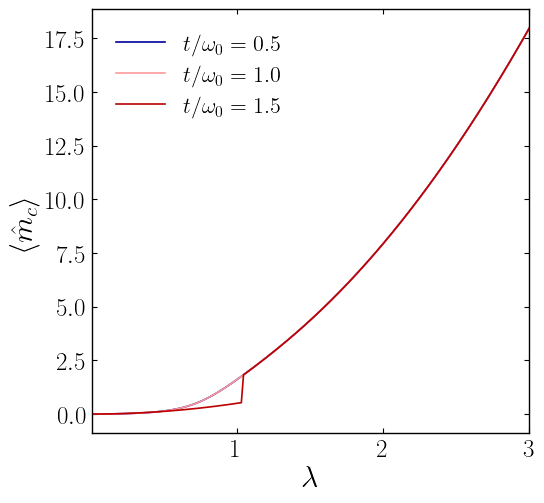

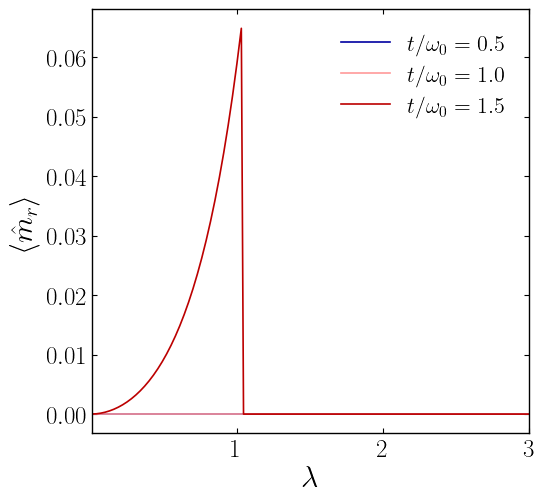

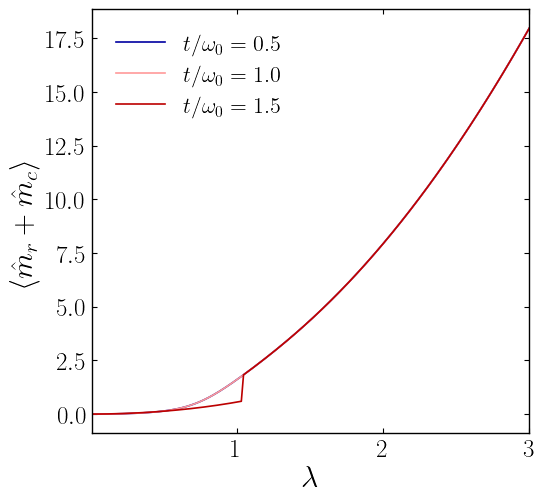

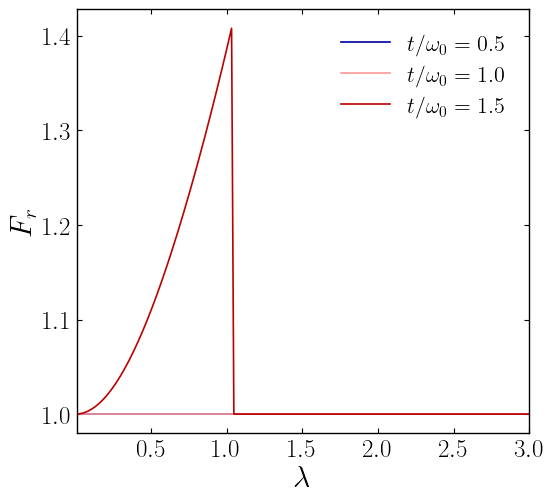

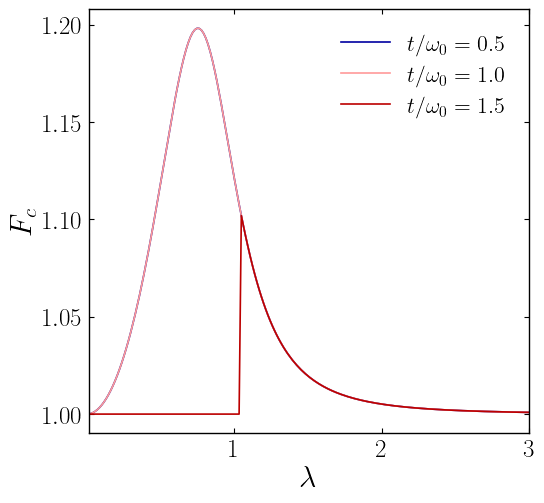

...

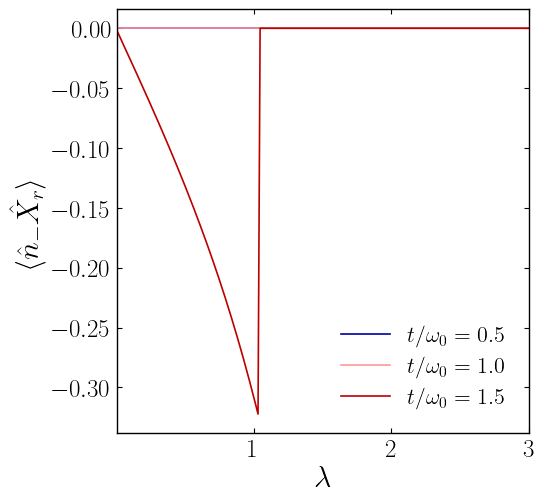

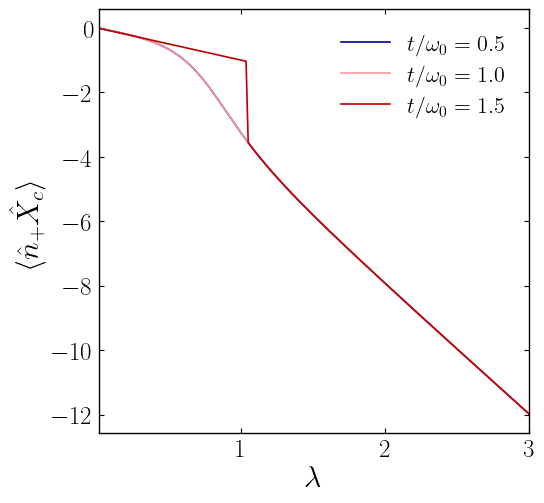

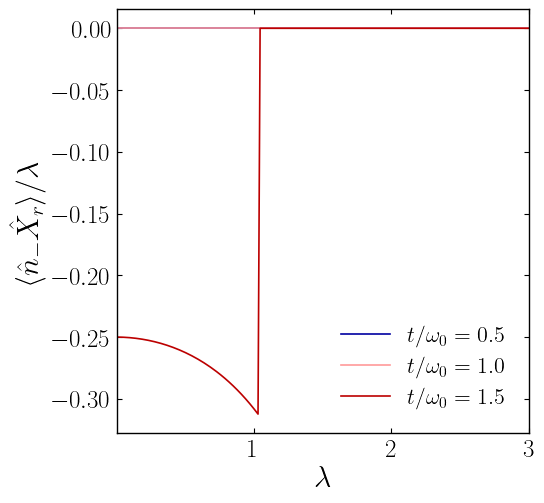

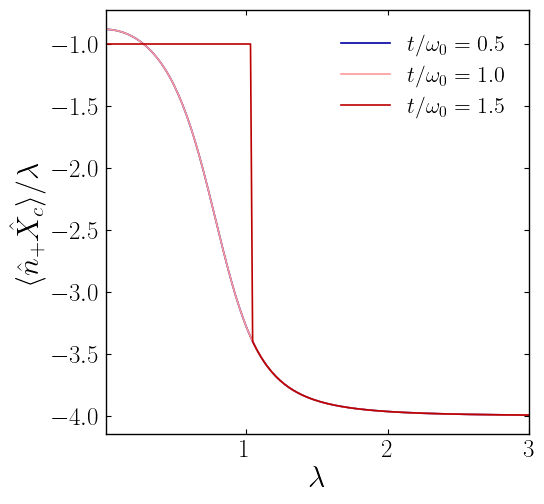

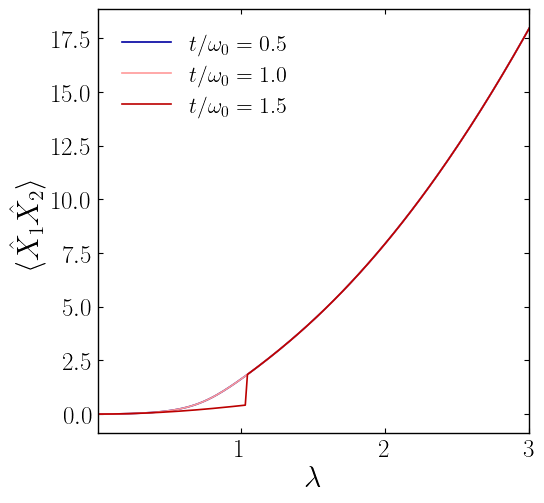

In [27]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — observables del GS global (barriendo t/ω0)
# ══════════════════════════════════════════════════════════════════
COLS = [plt.cm.seismic(0.12), plt.cm.seismic(0.6), plt.cm.seismic(0.88)]
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

def plot_global(key, ylabel, fname=None):
    fig, ax = plt.subplots(figsize=(6, 5.5))
    for tv, c in zip(tv_list, COLS):
        ax.plot(lam_arr, O[key][tv], '-', color=c, lw=1.2,
                label=rf'$t/\omega_0={tv}$')
    ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(ylabel)
    ax.set_xlim(0.01, lam_arr.max())
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)
    if fname is not None:
        plt.savefig('Resultados/' + fname, bbox_inches='tight', transparent=False, dpi=300)
    plt.tight_layout(); plt.show()

plot_global('m_c',       r'$\langle \hat{m}_c\rangle$',                  'gs_mc.png')
plot_global('m_r',       r'$\langle \hat{m}_r\rangle$',                  'gs_mr.png')
plot_global('m_sum',     r'$\langle \hat{m}_r+\hat{m}_c\rangle$',        'gs_msum.png')
plot_global('F_r',       r'$F_r$',                                       'gs_Fr.png')
plot_global('F_c',       r'$F_c$',                                       'gs_Fc.png')
plot_global('X2_r',      r'$\langle \hat{X}_r^2\rangle$',                'gs_X2r.png')
plot_global('X2_c',      r'$\langle \hat{X}_c^2\rangle$',                'gs_X2c.png')
plot_global('P2_r',      r'$\langle \hat{P}_r^2\rangle$',                'gs_P2r.png')
plot_global('P2_c',      r'$\langle \hat{P}_c^2\rangle$',                'gs_P2c.png')
plot_global('dX2_c',     r'$(\Delta \hat{X}_c)^2$',                      'gs_dX2c.png')
plot_global('nmX_r',     r'$\langle \hat{n}_- \hat{X}_r\rangle$',        'gs_nmXr.png')
plot_global('npX_c',     r'$\langle \hat{n}_+ \hat{X}_c\rangle$',        'gs_npXc.png')
plot_global('nmX_r_lam', r'$\langle \hat{n}_- \hat{X}_r\rangle/\lambda$','gs_nmXr_lam.png')
plot_global('npX_c_lam', r'$\langle \hat{n}_+ \hat{X}_c\rangle/\lambda$','gs_npXc_lam.png')
plot_global('X1X2',      r'$\langle \hat{X}_1 \hat{X}_2\rangle$',        'gs_X1X2.png')

### Block Fidelity

In [151]:
# ══════════════════════════════════════════════════════════════════
#  FIDELIDAD POR BLOQUE — CORTES 1D en λ, separando φ1 y φ2
#   (i)  sector impar, barriendo t/ω0 ∈ {0.5, 1.0, 1.5}
#   (ii) sector par,   barriendo Δ/ω0 ∈ {0.5, 1.0, 1.5}
#  Asume: disp_matrix, squeezed_vacuum, minimize_odd, minimize_even.
# ══════════════════════════════════════════════════════════════════

# ─── fidelidad por bloque (estado de un solo modo) ───────────────
def _fid(chi, alpha, r):
    w = float(np.real(np.vdot(chi, chi)))
    if w < 1e-15:
        return np.nan
    phi = disp_matrix(M, alpha) @ squeezed_vacuum(M, r)     # D(α)S(r)|0⟩
    return abs(np.vdot(chi/np.sqrt(w), phi))**2

# ─── bloques exactos reducidos (χ1, χ2 del modo activo) ──────────
def _odd_blocks(lam, t_val):
    eps_t = eps_val - lam**2*omega0
    Dt = disp_matrix(M, _S2*lam); n1 = M+1
    diag = eps_t*np.eye(n1) + np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1)); H[:n1,:n1]=diag; H[n1:,n1:]=diag
    H[:n1,n1:]=t_val*Dt; H[n1:,:n1]=t_val*Dt.T
    gs = np.linalg.eigh(H)[1][:, 0]
    return gs[:n1], gs[n1:]                         # |10⟩, |01⟩

def _even_blocks(lam, Delta):
    eps_t = eps_val - lam**2*omega0
    Dd = disp_matrix(M, -_S2*lam); n1 = M+1
    n  = np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1)); H[:n1,:n1]=n; H[n1:,n1:]=2*eps_t*np.eye(n1)+n
    H[:n1,n1:]=Delta*Dd; H[n1:,:n1]=Delta*Dd.T
    gs = np.linalg.eigh(H)[1][:, 0]
    return gs[:n1], gs[n1:]                         # |00⟩, |11⟩


In [157]:
# ─── parámetros del sistema (re-declarados) ──────────────────────
omega0  = 1.0
eps_val = 0.25
M       = 40
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 160)

# ─── (i) SECTOR IMPAR — φ1 y φ2 vs λ, varios t/ω0 ───────────────
t_values = [0.5, 1.0, 1.5]
fid_o1 = {tv: np.empty_like(lam_arr) for tv in t_values}
fid_o2 = {tv: np.empty_like(lam_arr) for tv in t_values}
for tv in t_values:
    t = tv                                          # minimize_odd usa la global t
    for k, lam in enumerate(lam_arr):
        _, (a, r) = minimize_odd(lam)
        c1, c2 = _odd_blocks(lam, tv)
        fid_o1[tv][k] = _fid(c1,  a/2.0, r)
        fid_o2[tv][k] = _fid(c2, -a/2.0, r)
t = 1.0                                             # restaura la global

# ─── (ii) SECTOR PAR — φ1 y φ2 vs λ, varios Δ/ω0 ───────────────
D_values = [0.5, 1.0, 1.5]
fid_e1 = {Dv: np.empty_like(lam_arr) for Dv in D_values}
fid_e2 = {Dv: np.empty_like(lam_arr) for Dv in D_values}
for Dv in D_values:
    for k, lam in enumerate(lam_arr):
        _, (a1, a2, r1, r2) = minimize_even(lam, Dv)
        c1, c2 = _even_blocks(lam, Dv)
        fid_e1[Dv][k] = _fid(c1, a1, r1)
        fid_e2[Dv][k] = _fid(c2, a2, r2)



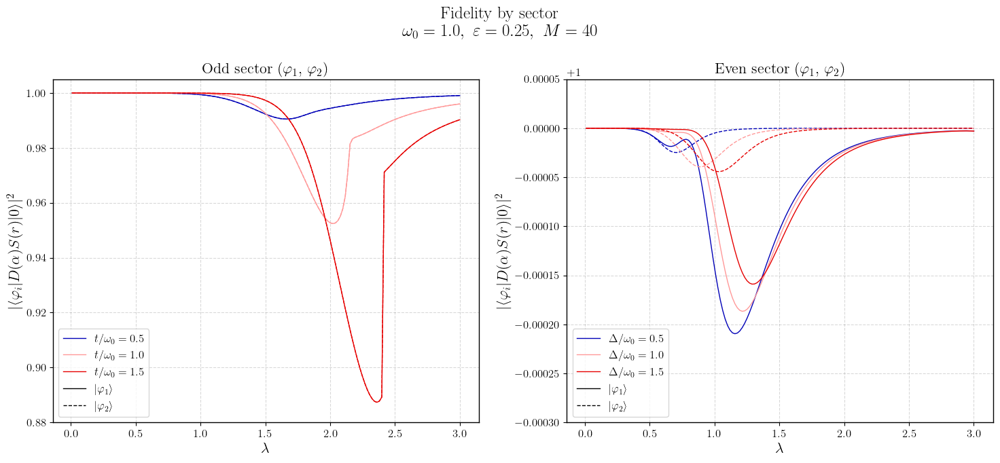

In [182]:
# ══════════════════════════════════════════════════════════════════
#  PLOTTING  (solid = φ1,  dashed = φ2)
# ══════════════════════════════════════════════════════════════════
lam_star = np.sqrt(eps_val/omega0)
COLS = [plt.cm.seismic(0.15), plt.cm.seismic(0.6), plt.cm.seismic(0.8)]

fig, (axo, axe) = plt.subplots(1, 2, figsize=(15, 7))

for tv, c in zip(t_values, COLS):
    axo.plot(lam_arr, fid_o1[tv], '-',  color=c, lw=1.0, label=rf'$t/\omega_0={tv}$')
    axo.plot(lam_arr, fid_o2[tv], '--', color=c, lw=1.0)
axo.plot([], [], '-', color='k', lw=1.0, label=r'$|\varphi_1\rangle$')
axo.plot([], [], '--', color='k', lw=1.0, label=r'$|\varphi_2\rangle$')
axo.set(xlabel=r'$\lambda$',
        ylabel=r'$|\langle\varphi_{i}|D(\alpha)S(r)|0\rangle|^2$',
        title=r'Odd sector  ($\varphi_1$, $\varphi_2$)', ylim=(0.88, 1.005))
axo.legend(); axo.grid(alpha=0.3, ls='--')

for Dv, c in zip(D_values, COLS):
    axe.plot(lam_arr, fid_e1[Dv], '-',  color=c, lw=1.0, label=rf'$\Delta/\omega_0={Dv}$')
    axe.plot(lam_arr, fid_e2[Dv], '--', color=c, lw=1.0)
axe.plot([], [], '-', color='k', lw=1.0, label=r'$|\varphi_1\rangle$')
axe.plot([], [], '--', color='k', lw=1.0, label=r'$|\varphi_2\rangle$')
axe.set(xlabel=r'$\lambda$',
        ylabel=r'$|\langle\varphi_{i}|D(\alpha)S(r)|0\rangle|^2$',
        title=r'Even sector  ($\varphi_1$, $\varphi_2$)', ylim=(0.9997, 1.00005))
axe.legend(); axe.grid(alpha=0.3, ls='--')

fig.suptitle(r'Fidelity by sector'+ '\n' + rf'$\omega_0={omega0},\ \varepsilon={eps_val},\ M={M}$', fontsize=18)
plt.tight_layout(); plt.show()

### General results

In [3]:
# ─── parámetros del sistema ──────────────────────────────────────
t       = 1.0
omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)

# ─── malla (λ/t, Δ/t) ────────────────────────────────────────────
n_lam, n_Delta = 200, 200
lam_arr   = np.linspace(0.0, 1.5, n_lam)     # λ/t   (t = 1)
Delta_arr = np.linspace(0.0, 1.5, n_Delta)   # Δ/t

# ─── E_o(λ): el sector impar NO depende de Δ (1D, con warm start) ─
E_odd_1d = np.empty(n_lam)
warm = None
for k, lam in enumerate(lam_arr):
    E, x = minimize_odd(lam, x_warm=warm); warm = x
    E_odd_1d[k] = E
print("E_o (1D) listo.")

# ─── E_e(λ,Δ): barrido 2D, una fila por Δ con continuación en λ ───
def _even_row(Delta):
    row = np.empty(n_lam); w = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_even(lam, Delta, x_warm=w); w = x
        row[k] = E
    return row

print(f"Grid {n_lam}×{n_Delta}: calculando E_e ...")
E_even_2d = np.empty((n_Delta, n_lam))
chunks = np.array_split(np.arange(n_Delta), 20)   # 20 trozos → progreso cada 5%
done = 0
with joblib.parallel_backend('loky', n_jobs=-1):
    for idx in chunks:
        res = joblib.Parallel()(joblib.delayed(_even_row)(Delta_arr[i]) for i in idx)
        for i, row in zip(idx, res):
            E_even_2d[i] = row
        done += len(idx)
        print(f"  E_e: {100.0*done/n_Delta:5.1f}% completado")

# ─── splitting δE = E_e − E_o  (broadcast de E_o sobre Δ) ─────────
dE = E_even_2d - E_odd_1d[None, :]            # (n_Delta, n_lam)
print("δE: min=%.4f  max=%.4f" % (dE.min(), dE.max()))



E_o (1D) listo.
Grid 200×200: calculando E_e ...
  E_e:   5.0% completado
  E_e:  10.0% completado
  E_e:  15.0% completado
  E_e:  20.0% completado
  E_e:  25.0% completado
  E_e:  30.0% completado
  E_e:  35.0% completado
  E_e:  40.0% completado
  E_e:  45.0% completado
  E_e:  50.0% completado
  E_e:  55.0% completado
  E_e:  60.0% completado
  E_e:  65.0% completado
  E_e:  70.0% completado
  E_e:  75.0% completado
  E_e:  80.0% completado
  E_e:  85.0% completado
  E_e:  90.0% completado
  E_e:  95.0% completado
  E_e: 100.0% completado
δE: min=-1.9063  max=0.9162


In [11]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — datos para las 5 tareas
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 4.0, 200)    # λ/t   (t = 1)

cv_list = [0.5, 1.0, 1.5]                 # t/ω0 (impar)  y  Δ/ω0 (par)

M_test = 40
def _Mof(lam):
    return int(max(40, np.ceil(4.0*lam*lam) + 25))

# diccionarios indexados por valor de acoplamiento ----------------
alpha_o = {}; r_o = {}; Evar_o = {}; Eex_o = {}; fid_o = {}; rel_o = {}
a1_e = {}; a2_e = {}; r1_e = {}; r2_e = {}
Evar_e = {}; Eex_e = {}; fid_e = {}; rel_e = {}

for cv in cv_list:
    # ----- SECTOR IMPAR (túnel t = cv; no depende de Δ) -----
    t = cv
    ao = np.empty_like(lam_arr); ro = np.empty_like(lam_arr)
    Ev = np.empty_like(lam_arr); Ee = np.empty_like(lam_arr)
    fo = np.empty_like(lam_arr); re = np.empty_like(lam_arr)
    warm = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_odd(lam, x_warm=warm); warm = x
        ao[k], ro[k] = x
        Ev[k] = E
        Ee[k] = E_odd_exact(lam, M= _Mof(lam))
        fo[k] = fidelity_odd(lam, x)
        re[k] = abs(E - Ee[k]) / abs(Ee[k])
    alpha_o[cv]=ao; r_o[cv]=ro; Evar_o[cv]=Ev; Eex_o[cv]=Ee; fid_o[cv]=fo; rel_o[cv]=re

    # ----- SECTOR PAR (pairing Δ = cv; no depende de t) -----
    a1 = np.empty_like(lam_arr); a2 = np.empty_like(lam_arr)
    rr1 = np.empty_like(lam_arr); rr2 = np.empty_like(lam_arr)
    Ev = np.empty_like(lam_arr); Ee = np.empty_like(lam_arr)
    fe = np.empty_like(lam_arr); re = np.empty_like(lam_arr)
    warm = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_even(lam, cv, x_warm=warm); warm = x
        a1[k], a2[k], rr1[k], rr2[k] = x
        Ev[k] = E
        Ee[k] = E_even_exact(lam, cv)
        fe[k] = fidelity_even(lam, cv, x)
        re[k] = abs(E - Ee[k]) / abs(Ee[k])
    a1_e[cv]=a1; a2_e[cv]=a2; r1_e[cv]=rr1; r2_e[cv]=rr2
    Evar_e[cv]=Ev; Eex_e[cv]=Ee; fid_e[cv]=fe; rel_e[cv]=re

print("Tareas 1, 2, 4 (y 3 vía cv=1.0): barrido principal listo.")

Tareas 1, 2, 4 (y 3 vía cv=1.0): barrido principal listo.


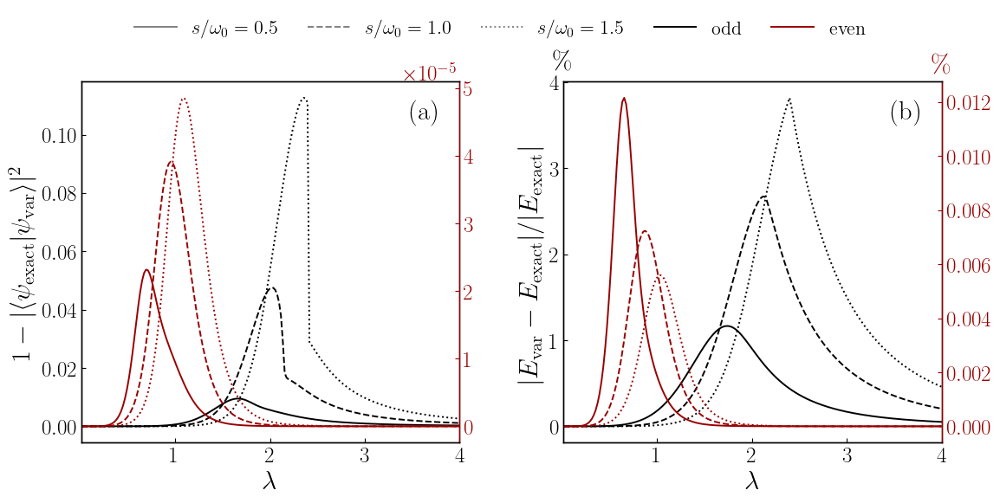

Fidelity by sector, omega_0=1.0,\ \varepsilon=0.25
Relative error by sector, omega_0=1.0,\ \varepsilon=0.25


In [ ]:
lam_arr = np.linspace(0.01, 4.0, 200)
LS = {0.5: '-', 1.0: '--', 1.5: ':'}
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)   # rojo intenso

fid_o_err = {cv: 1.0 - fid_o[cv] for cv in cv_list}
fid_e_err = {cv: 1.0 - fid_e[cv] for cv in cv_list}

fig, (ax_o1, ax_o2) = plt.subplots(1, 2, figsize=(12, 6))

# ═══════════════════════════════════════════════════════════════
# Panel (a): Fidelidad
# ═══════════════════════════════════════════════════════════════
ax_e1 = ax_o1.twinx()

for cv in cv_list:
    ax_o1.plot(lam_arr, fid_o_err[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e1.plot(lam_arr, fid_e_err[cv], LS[cv], color=C_EVEN, lw=1.4)

ax_o1.set_xlabel(r'$\lambda$')
ax_o1.set_ylabel(r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                 color=C_ODD)
ax_o1.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o1.tick_params(axis='x', direction='in')
ax_o1.set_xlim(0.01, 4.0)

ax_e1.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e1.spines['right'].set_color(C_EVEN)
ax_e1.spines['left'].set_color(C_ODD)

ax_o1.text(0.95, 0.95, '(a)', transform=ax_o1.transAxes,
           ha='right', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Panel (b): Error relativo
# ═══════════════════════════════════════════════════════════════
ax_e2 = ax_o2.twinx()

for cv in cv_list:
    ax_o2.plot(lam_arr, 100*rel_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e2.plot(lam_arr, 100*rel_e[cv], LS[cv], color=C_EVEN, lw=1.4)

ax_o2.set_xlabel(r'$\lambda$')
ax_o2.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                 color=C_ODD)
ax_o2.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o2.tick_params(axis='x', direction='in')
ax_o2.set_xlim(0.01, 4.0)
ax_o2.text(0.0, 1.02, r'$\%$', transform=ax_o2.transAxes,
           color=C_ODD, ha='center', va='bottom')

ax_e2.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e2.spines['right'].set_color(C_EVEN)
ax_e2.spines['left'].set_color(C_ODD)
ax_e2.text(1.0, 1.01, r'$\%$', transform=ax_e2.transAxes,
           color=C_EVEN, ha='center', va='bottom')

ax_o2.text(0.95, 0.95, '(b)', transform=ax_o2.transAxes,
           ha='right', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Leyenda compartida — a la derecha de la figura
# ═══════════════════════════════════════════════════════════════
handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                         label=rf'$s/\omega_0={cv}$') for cv in cv_list]
handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

fig.legend(handles=handles,
           loc='upper center',
           bbox_to_anchor=(0.5,1.01),     # centrada sobre la figura
           ncol=len(handles),               # una sola fila
           frameon=False,
           borderpad=0.6, handlelength=2.2, labelspacing=0.4, columnspacing=1.5)

plt.tight_layout()
plt.subplots_adjust(top=0.85)              # espacio para la leyenda arriba
plt.savefig(f'Resultados/Fidelidad_y_error_relativo_por_sector.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()


print(r'Fidelity by sector, ' + rf'omega_0={omega0},\ \varepsilon={eps_val}')
print(r'Relative error by sector, ' + rf'omega_0={omega0},\ \varepsilon={eps_val}')

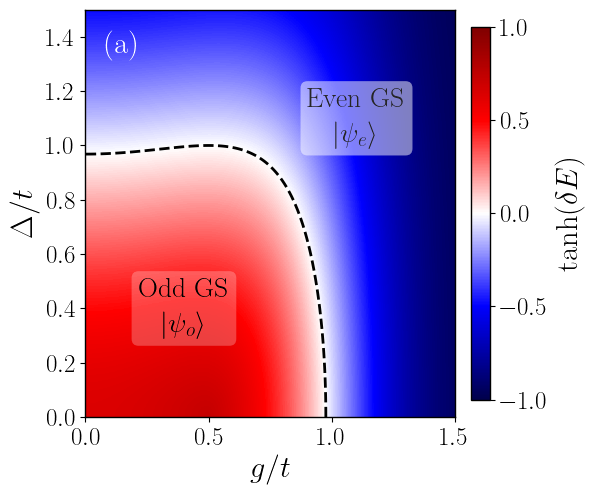

Parity Splitting $\delta E = E^e_0 - E^o_0$
$t=1.0,\ \varepsilon=0.25,\ \omega_0=1.0$


In [7]:
n_lam, n_Delta = 200, 200
lam_arr   = np.linspace(0.0, 1.5, n_lam)     # λ/t   (t = 1)
Delta_arr = np.linspace(0.0, 1.5, n_Delta)   # Δ/t

# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN
# ══════════════════════════════════════════════════════════════════
extent    = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
xlabel    = r'$g/t$'
ylabel    = r'$\Delta/t$'
lam_star  = np.sqrt(eps_val/omega0)
param_str = rf"$t={t:.1f},\ \varepsilon={eps_val},\ \omega_0={omega0}$"
vmin_masked = np.min(dE)
vmax_masked = np.max(dE)
norm_p    = TwoSlopeNorm(vmin=-1.0, vcenter=0.0, vmax=1.0)

fig, ax = plt.subplots(figsize=(6.5, 5.5))
im = ax.imshow(np.tanh(dE), origin='lower', aspect='auto', extent=extent, cmap='seismic', norm=norm_p)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=r'$\tanh(\delta E)$')

ax.contour(lam_arr, Delta_arr, dE, levels=[0.0], colors='k', linewidths=2.0, alpha=1.0, linestyles='--', label=rf'data=$\delta E =0$')               
ax.set(xlabel=xlabel, ylabel=ylabel)

import matplotlib.patheffects as pe

txt1 = ax.text(1.1, 1.1, r'\begin{center} Even GS \\ $|\psi_e\rangle$ \end{center}', 
        fontsize=20, color='0.15', ha='center', va='center', bbox=dict(
    facecolor='white',
    alpha=0.5,
    edgecolor='none',
    pad=5,
    boxstyle='round,pad=0.25'
))

txt2 = ax.text(0.4, 0.4, r'\begin{center} Odd GS \\ $|\psi_o\rangle$ \end{center}', 
        fontsize=20, color='black', ha='center', va='center', bbox=dict(
    facecolor='white',
    alpha=0.25,
    edgecolor='none',
    pad=5,
    boxstyle='round,pad=0.25'
))

ax.text(0.15, 0.95, '(a)', transform=ax.transAxes, ha='right', va='top',
          fontweight='bold', color='white')

plt.tight_layout()
plt.savefig(
    'Resultados/Parity_Splitting.png',
    bbox_inches='tight',
    transparent=False,
    dpi=300
)
plt.show()

print(r'Parity Splitting $\delta E = E^e_0 - E^o_0$')
print(param_str)

        

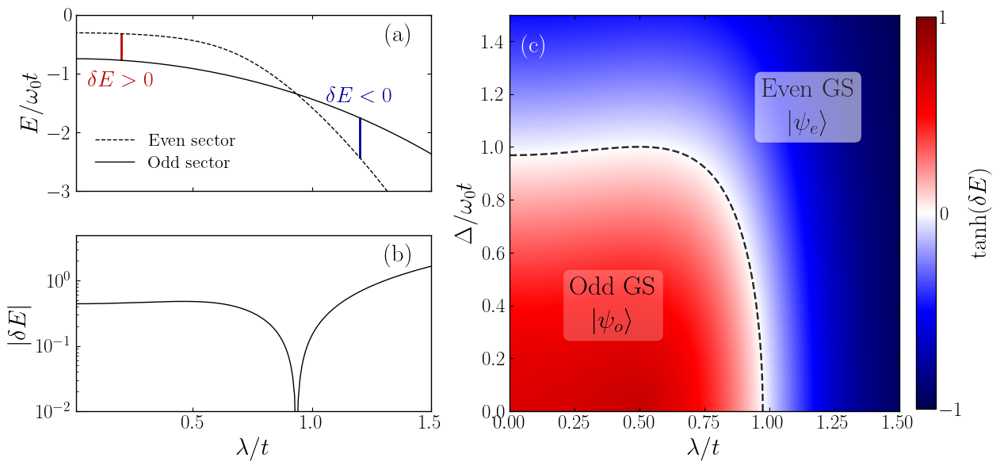

Parity Splitting + Variational energy, $t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$


In [38]:
n_lam, n_Delta = 200, 200
lam_arr   = np.linspace(0.0, 1.5, n_lam)     # λ/t   (t = 1)
Delta_arr = np.linspace(0.0, 1.5, n_Delta)   # Δ/t


C_A  = plt.cm.seismic(0.12)   # azul
C_B  = plt.cm.seismic(0.88)   # rojo
C_C  = plt.cm.seismic(0.6)    # rojo intermedio
COLS = [C_A, C_C, C_B]
lam_star = np.sqrt(eps_val / omega0)

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ── Crear figura con GridSpec ──────────────────────────────────
fig = plt.figure(figsize=(14, 6.5))
gs = fig.add_gridspec(2, 2, width_ratios=[1.0, 1.2], height_ratios=[1, 1],
                      hspace=0.25, wspace=0.2)

# ═══════════════════════════════════════════════════════════════
# Panel (a): Parity Splitting (mapa de calor) – ocupa toda la izquierda
# ═══════════════════════════════════════════════════════════════
ax_a = fig.add_subplot(gs[:, 1])   # abarca ambas filas

extent = [lam_arr[0], lam_arr[-1], Delta_arr[0], Delta_arr[-1]]
vmin_masked = np.min(dE)
vmax_masked = np.max(dE)
norm_p = TwoSlopeNorm(vmin=-1.0, vcenter=0.0, vmax=1.0)

im = ax_a.imshow(np.tanh(dE), origin='lower', aspect='auto',
                 extent=extent, cmap='seismic', norm=norm_p)
cb = fig.colorbar(im, ax=ax_a, fraction=0.046, pad=0.04, label=r'$\tanh(\delta E)$', ticks=[-1.0, 0.0, 1.0])

ax_a.contour(lam_arr, Delta_arr, dE, levels=[0.0], colors='0.15', linewidths=1.75, alpha=1.0, linestyles='--')

ax_a.set_xlabel(r'$\lambda/t$')
ax_a.set_ylabel(r'$\Delta/\omega_0 t$')
ax_a.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)

txt1 = ax_a.text(1.15, 1.15, r'\begin{center} Even GS \\ $|\psi_e\rangle$ \end{center}', 
        fontsize=24, color='0.15', ha='center', va='center', bbox=dict(
    facecolor='white',
    alpha=0.55,
    edgecolor='none',
    pad=5,
    boxstyle='round,pad=0.25'
))

txt2 = ax_a.text(0.4, 0.4, r'\begin{center} Odd GS \\ $|\psi_o\rangle$ \end{center}', 
        fontsize=24, color='black', ha='center', va='center', bbox=dict(
    facecolor='white',
    alpha=0.25,
    edgecolor='none',
    pad=5,
    boxstyle='round,pad=0.25'
))


# Etiqueta (a) en esquina superior derecha (usando coordenadas de ejes)
ax_a.text(0.1, 0.95, '(c)', transform=ax_a.transAxes, ha='right', va='top',
          fontweight='bold', color='white')

# ═══════════════════════════════════════════════════════════════
# Panel (b): Energías variacionales (arriba derecha)
# ═══════════════════════════════════════════════════════════════
ax_b = fig.add_subplot(gs[0, 0])

ax_b.plot(lam_arr, Evar_e[0.5], '--', color='black', lw=1.0, label='Even sector', zorder=1)
ax_b.plot(lam_arr, Evar_o[1.0], '-', color='black', lw=1.0, label='Odd sector', zorder=1)

# Indicación de δE en λ ≈ 0.2
lam_target = 0.2
idx = np.argmin(np.abs(lam_arr - lam_target))
y_even = Evar_e[0.5][idx]
y_odd  = Evar_o[1.0][idx]
y_mid  = (y_even + y_odd) / 2.0

ax_b.plot([lam_target, lam_target], [y_odd + 0.01, y_even - 0.01],
          color=C_B, lw=2.0, linestyle='-', zorder=0)
ax_b.text(lam_target, y_odd - 0.35, r'$\delta E >0$',
          ha='center', va='center', color=C_B, fontsize=20)

lam_target2 = 1.2
idx = np.argmin(np.abs(lam_arr - lam_target2))
y_even2 = Evar_e[0.5][idx]
y_odd2 = Evar_o[1.0][idx]
y_mid2 = (y_even2 + y_odd2) / 2.0

ax_b.plot([lam_target2, lam_target2], [y_odd2 - 0.01, y_even2 + 0.01],
          color=C_A, lw=2.0, linestyle='-', zorder=0)
ax_b.text(lam_target2 , y_odd2 + 0.35, r'$\delta E <0$',
          ha='center', va='center', color=C_A, fontsize=20)

ax_b.set_ylabel(r'$E/\omega_0 t$')
ax_b.set_xlim(0.01, 1.5)
ax_b.set_ylim(-3.0, 0.0)
ax_b.tick_params(axis='x', direction='in', labelbottom=False, bottom=True, top=True, right=True, left=True)
ax_b.tick_params(axis='y', direction='in', right=True, left=True)
ax_b.legend(frameon=True, edgecolor='black', framealpha=0.0,
            fancybox=False, borderpad=0.6, handlelength=2.2, labelspacing=0.4)

# Etiqueta (b)
ax_b.text(0.95, 0.95, '(a)', transform=ax_b.transAxes, ha='right', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Panel (c): Diferencia absoluta (abajo derecha)
# ═══════════════════════════════════════════════════════════════
ax_c = fig.add_subplot(gs[1, 0])

ax_c.semilogy(lam_arr, np.abs(Evar_e[0.5] - Evar_o[1.0]), '-', color='black', lw=1.0)
ax_c.set_xlabel(r'$\lambda/t$')
ax_c.set_ylabel(r'$|\delta E|$')
ax_c.set_xlim(0.01, 1.5)
ax_c.set_ylim(0.01, 5.0)
ax_b.tick_params(axis='x', direction='in', bottom=True, top=True, right=True, left=True)
ax_b.tick_params(axis='y', direction='in', right=True, left=True)
# Etiqueta (c)
ax_c.text(0.95, 0.95, '(b)', transform=ax_c.transAxes, ha='right', va='top', fontweight='bold')

plt.tight_layout()
plt.show()

# Guardar la figura combinada
fig.savefig('Resultados/combined_parity_tanhenergy.png', bbox_inches='tight', transparent=False, dpi=300)

print('Parity Splitting + Variational energy, ' + 
      rf"$t/\omega_0=1.0,\ \varepsilon={eps_val},\ \Delta/\omega_0=0.5$")

In [43]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — datos para las 5 tareas
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 200)
cv_list = [0.5, 1.0, 1.5]                 # t/ω0 (impar)  y  Δ/ω0 (par)

def _Mof(lam):
    return int(max(40, np.ceil(4.0*lam*lam) + 25))

# diccionarios indexados por valor de acoplamiento ----------------
alpha_o = {}; r_o = {}; Evar_o = {}; Eex_o = {}; fid_o = {}; rel_o = {}
a1_e = {}; a2_e = {}; r1_e = {}; r2_e = {}
Evar_e = {}; Eex_e = {}; fid_e = {}; rel_e = {}

for cv in cv_list:
    # ----- SECTOR IMPAR (túnel t = cv; no depende de Δ) -----
    t = cv
    ao = np.empty_like(lam_arr); ro = np.empty_like(lam_arr)
    Ev = np.empty_like(lam_arr); Ee = np.empty_like(lam_arr)
    fo = np.empty_like(lam_arr); re = np.empty_like(lam_arr)
    warm = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_odd(lam, x_warm=warm); warm = x
        ao[k], ro[k] = x
        Ev[k] = E
        Ee[k] = E_odd_exact(lam, M=_Mof(lam))
        fo[k] = fidelity_odd(lam, x)
        re[k] = abs(E - Ee[k]) / abs(Ee[k])
    alpha_o[cv]=ao; r_o[cv]=ro; Evar_o[cv]=Ev; Eex_o[cv]=Ee; fid_o[cv]=fo; rel_o[cv]=re

    # ----- SECTOR PAR (pairing Δ = cv; no depende de t) -----
    a1 = np.empty_like(lam_arr); a2 = np.empty_like(lam_arr)
    rr1 = np.empty_like(lam_arr); rr2 = np.empty_like(lam_arr)
    Ev = np.empty_like(lam_arr); Ee = np.empty_like(lam_arr)
    fe = np.empty_like(lam_arr); re = np.empty_like(lam_arr)
    warm = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_even(lam, cv, x_warm=warm); warm = x
        a1[k], a2[k], rr1[k], rr2[k] = x
        Ev[k] = E
        Ee[k] = E_even_exact(lam, cv)
        fe[k] = fidelity_even(lam, cv, x)
        re[k] = abs(E - Ee[k]) / abs(Ee[k])
    a1_e[cv]=a1; a2_e[cv]=a2; r1_e[cv]=rr1; r2_e[cv]=rr2
    Evar_e[cv]=Ev; Eex_e[cv]=Ee; fid_e[cv]=fe; rel_e[cv]=re

print("Tareas 1, 2, 4 (y 3 vía cv=1.0): barrido principal listo.")

# ─── TAREA 5: β = −λ/√2 + α/2  con  t/ω0 = 1,  ε̃ = 0 (sweet spot por λ) ───
t = 1.0
beta_arr = np.empty_like(lam_arr)
warm = None
for k, lam in enumerate(lam_arr):
    eps_val = lam**2 * omega0            # fija  ε̃ = ε − λ²ω0 = 0
    E, x = minimize_odd(lam, x_warm=warm); warm = x
    beta_arr[k] = -lam/_S2 + x[0]/2.0
eps_val = 0.25                            # restaura el valor base
print("Tarea 5: β(λ) en el sweet spot listo.")

Tareas 1, 2, 4 (y 3 vía cv=1.0): barrido principal listo.
Tarea 5: β(λ) en el sweet spot listo.


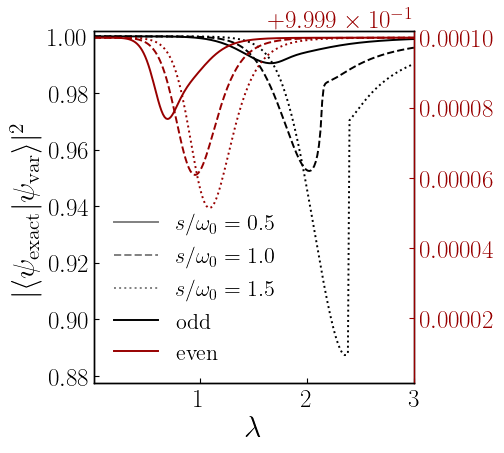

Fidelity by sector, omega_0=1.0,\ \varepsilon=0.25


In [ ]:


LS = {0.5: '-', 1.0: '--', 1.5: ':'}      # estilo de línea por acoplamiento
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)             # rojo intenso

fig, ax_o = plt.subplots(figsize=(5.5, 5))
ax_e = ax_o.twinx()                        # eje y derecho, comparte x

for cv in cv_list:
    ax_o.plot(lam_arr, fid_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e.plot(lam_arr, fid_e[cv], LS[cv], color=C_EVEN, lw=1.4)

# ── eje izquierdo: impar (negro) ──────────────────────────────────
yo = min(fid_o[cv].min() for cv in cv_list)
ax_o.set_xlabel(r'$\lambda$')
ax_o.set_ylabel(r'$|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                color=C_ODD)
ax_o.set_ylim(yo-0.01, 1.002)
ax_o.tick_params(axis='y', colors=C_ODD, direction='in')
ax_o.tick_params(axis='x', direction='in')
ax_o.set_xlim(0.01, 3.0)

# ── eje derecho: par (rojo) ───────────────────────────────────────
ye = min(fid_e[cv].min() for cv in cv_list)
ax_e.set_ylim(ye-5e-5, 1.000002)
ax_e.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e.spines['right'].set_color(C_EVEN)
ax_e.spines['left'].set_color(C_ODD)


# ── leyenda: solo el estilo de línea codifica el acoplamiento ─────
handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                         label=rf'$s/\omega_0={cv}$') for cv in cv_list]

handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]
                         
ax_o.legend(handles=handles, frameon=True, edgecolor='black',
            framealpha=0.0, fancybox=False, loc='lower left')

plt.tight_layout(); plt.show()

print(r'Fidelity by sector, ' + rf'omega_0={omega0},\ \varepsilon={eps_val}')

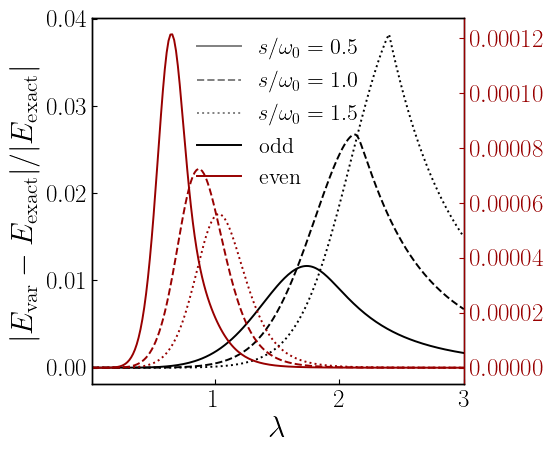

Relative error by sector, omega_0=1.0,\ \varepsilon=0.25


In [45]:
LS = {0.5: '-', 1.0: '--', 1.5: ':'}      # estilo de línea por acoplamiento
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)             # rojo intenso

fig, ax_o = plt.subplots(figsize=(6, 5))
ax_e = ax_o.twinx()                        # eje y derecho, comparte x

for cv in cv_list:
    ax_o.plot(lam_arr, rel_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e.plot(lam_arr, rel_e[cv], LS[cv], color=C_EVEN, lw=1.4)

# ── eje izquierdo: impar (negro) ──────────────────────────────────
ax_o.set_xlabel(r'$\lambda$')
ax_o.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                color=C_ODD)
ax_o.tick_params(axis='y', colors=C_ODD, direction='in')
ax_o.tick_params(axis='x', direction='in')
ax_o.set_xlim(0.01, 3.0)

# ── eje derecho: par (rojo) ───────────────────────────────────────
ax_e.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e.spines['right'].set_color(C_EVEN)
ax_e.spines['left'].set_color(C_ODD)

# ── leyenda: solo el estilo de línea codifica el acoplamiento ─────
handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                         label=rf'$s/\omega_0={cv}$') for cv in cv_list]

handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

ax_o.legend(handles=handles, frameon=True, edgecolor='black',
            framealpha=0.0, fancybox=False, loc='upper center')

plt.tight_layout(); plt.show()

print(r'Relative error by sector, ' + rf'omega_0={omega0},\ \varepsilon={eps_val}')

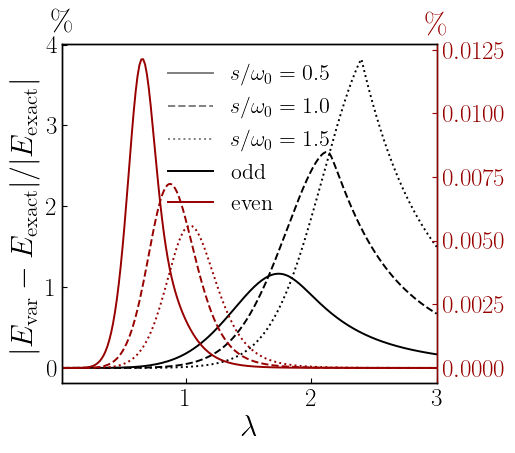

Relative error by sector, omega_0=1.0,\ \varepsilon=0.25


In [46]:
LS = {0.5: '-', 1.0: '--', 1.5: ':'}      # estilo de línea por acoplamiento
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)             # rojo intenso

fig, ax_o = plt.subplots(figsize=(5.5, 5))
ax_e = ax_o.twinx()                        # eje y derecho, comparte x

for cv in cv_list:
    ax_o.plot(lam_arr, 100*rel_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e.plot(lam_arr, 100*rel_e[cv], LS[cv], color=C_EVEN, lw=1.4)

# ── eje izquierdo: impar (negro) ──────────────────────────────────
ax_o.set_xlabel(r'$\lambda$')
ax_o.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                color=C_ODD)
ax_o.tick_params(axis='y', colors=C_ODD, direction='in')
ax_o.tick_params(axis='x', direction='in')
ax_o.set_xlim(0.01, 3.0)
ax_o.text(0.0, 1.02, r'$\%$', transform=ax_o.transAxes,
          color=C_ODD, ha='center', va='bottom')

# ── eje derecho: par (rojo) ───────────────────────────────────────
ax_e.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e.spines['right'].set_color(C_EVEN)
ax_e.spines['left'].set_color(C_ODD)
ax_e.text(1.0, 1.01, r'$\%$', transform=ax_e.transAxes,
          color=C_EVEN, ha='center', va='bottom')

# ── leyenda: solo el estilo de línea codifica el acoplamiento ─────
handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                         label=rf'$s/\omega_0={cv}$') for cv in cv_list]

handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

ax_o.legend(handles=handles, frameon=True, edgecolor='black',
            framealpha=0.0, fancybox=False, loc='upper center')

plt.tight_layout(); plt.show()

print(r'Relative error by sector, ' + rf'omega_0={omega0},\ \varepsilon={eps_val}')

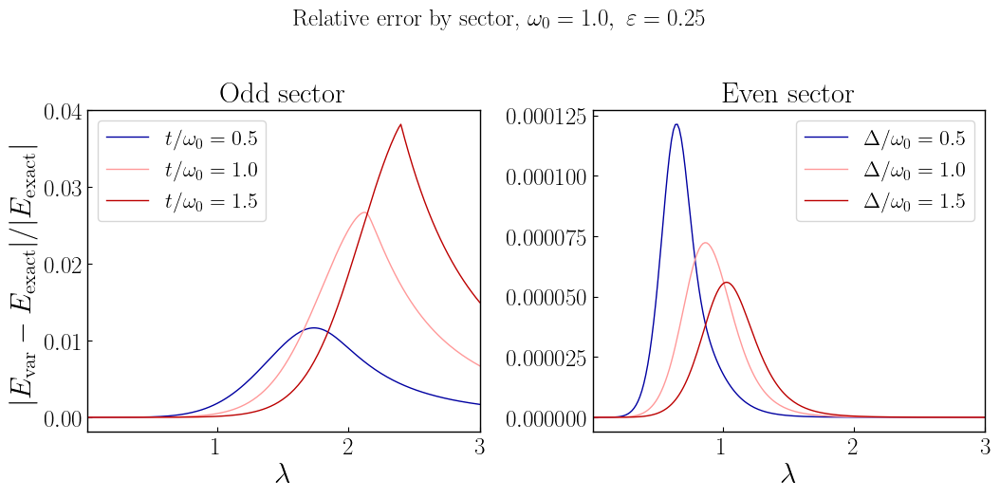

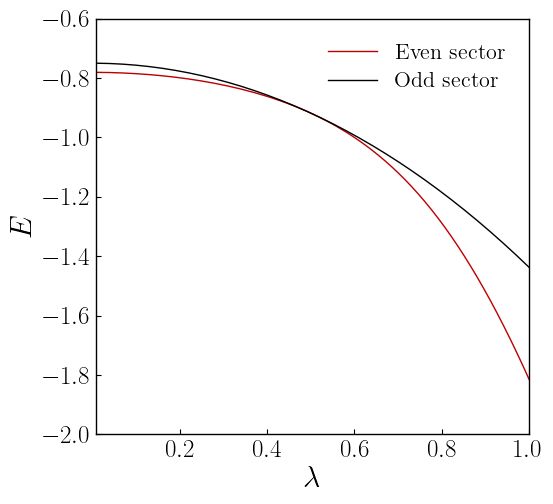

Variational ground state energy, $t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$


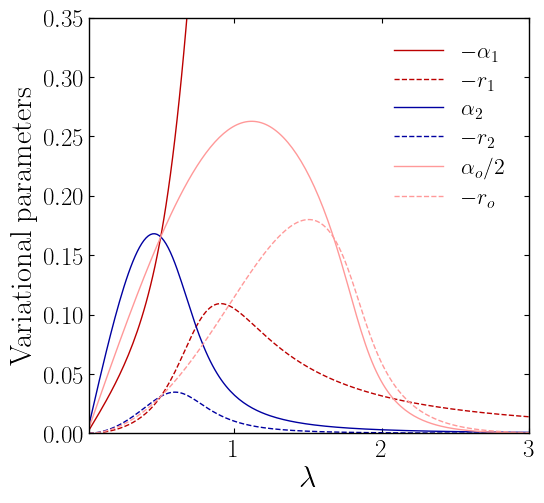

Optimal parameters, $t/\omega_0=0.5,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$


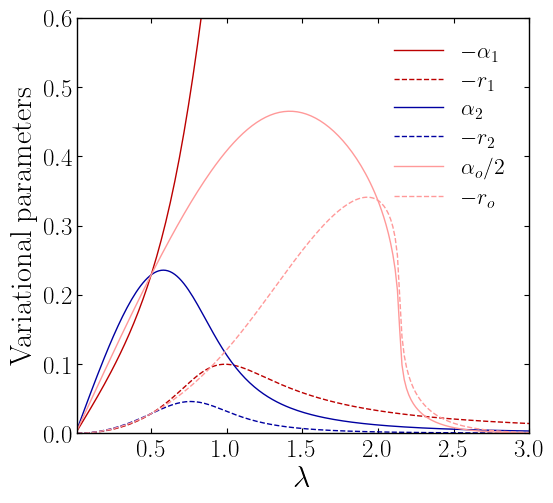

Optimal parameters, $t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=1.0$


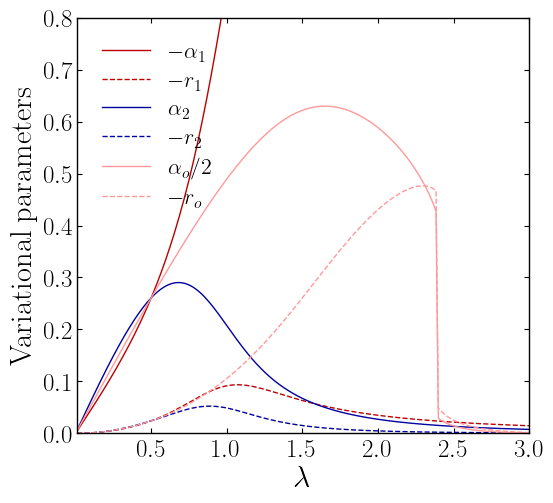

Optimal parameters, $t/\omega_0=1.5,\ \varepsilon=0.25,\ \Delta/\omega_0=1.5$


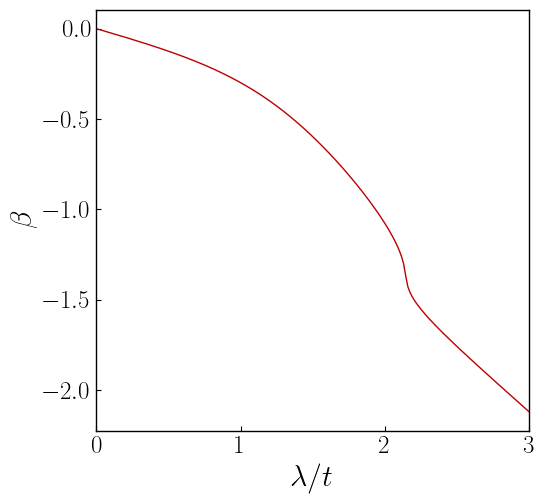

Displacement $\beta$, $t/\omega_0=1.0,\ \tilde\varepsilon=0$


In [47]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — 5 tareas
# ══════════════════════════════════════════════════════════════════
C_A  = plt.cm.seismic(0.12)   # azul
C_B  = plt.cm.seismic(0.88)   # rojo
C_C  = plt.cm.seismic(0.6)   # rojo
COLS = [plt.cm.seismic(0.12), plt.cm.seismic(0.6), plt.cm.seismic(0.88)]
lam_star = np.sqrt(eps_val/omega0)

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ── TAREA 2: error relativo de la energía por sector ──────────────
fig, (axo, axe) = plt.subplots(1, 2, figsize=(11, 5.5))
for cv, c in zip(cv_list, COLS):
    axo.plot(lam_arr, rel_o[cv], '-',  color=c, lw=1.0, label=rf'$t/\omega_0={cv}$')
    axe.plot(lam_arr, rel_e[cv], '-', color=c, lw=1.0, label=rf'$\Delta/\omega_0={cv}$')
axo.set(xlabel=r'$\lambda$',
        ylabel=r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
        title=r'Odd sector', xlim=(0.01, lam_arr.max()))
axo.legend()
axe.set(xlabel=r'$\lambda$',
        title=r'Even sector', xlim=(0.01, lam_arr.max()))
axe.legend(); 
fig.suptitle(r'Relative error by sector, ' +  rf'$\omega_0={omega0},\ \varepsilon={eps_val}$', fontsize=18)
plt.tight_layout(); plt.show()

# ── TAREA 3: energías variacionales GS (par sólida, impar discontinua) ──
pstr3 = rf"$t/\omega_0={1.0},\ \varepsilon={0.25},\ \Delta/\omega_0={0.5}$"
fig, ax = plt.subplots(figsize=(6, 5.5))
ax.plot(lam_arr, Evar_e[1.0], '-',  color=C_B, lw=1.0, label=r'Even sector')
ax.plot(lam_arr, Evar_o[1.0], '-', color='black', lw=1.0, label=r'Odd sector')
ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(r'$E$')
ax.set_xlim(0.01, 1.0)
ax.set_ylim(-2.0, -0.6)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2,
              labelspacing=0.4) 
plt.savefig(
    'Resultados/Variational_ground_state_energy.png',
    bbox_inches='tight',
    transparent=False,
    dpi=300
)
plt.tight_layout(); plt.show()
print(r'Variational ground state energy, ' + pstr3)

ylim_by_cv = {0.5: 0.35, 1.0: 0.6, 1.5: 0.8}   # ajusta cada tope a gusto

for cv in cv_list:
    pstr_e = rf"$t/\omega_0={cv},\ \varepsilon={eps_val},\ \Delta/\omega_0={cv}$"
    fig, ax = plt.subplots(figsize=(6, 5.5))
    ax.plot(lam_arr, -a1_e[cv],     '-',  color=C_B,    lw=1.0, label=r'$-\alpha_1$')
    ax.plot(lam_arr, -r1_e[cv],     '--', color=C_B,    lw=1.0, label=r'$-r_1$')
    ax.plot(lam_arr,  a2_e[cv],     '-',  color=C_A,    lw=1.0, label=r'$\alpha_2$')
    ax.plot(lam_arr, -r2_e[cv],     '--', color=C_A,    lw=1.0, label=r'$-r_2$')
    ax.plot(lam_arr, alpha_o[cv]/2, '-',  color=C_C, lw=1.0, label=r'$\alpha_o/2$')
    ax.plot(lam_arr, -r_o[cv],      '--', color=C_C, lw=1.0, label=r'$-r_o$')
    ax.set_ylim(0, ylim_by_cv[cv]); ax.set_xlim(0.01, 3.0)
    ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(r'Variational parameters')
    ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
    ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2,
              labelspacing=0.4)
    plt.savefig(
    'Resultados/Optimal_parameters_' + str(cv) + '.png',
    bbox_inches='tight',
    transparent=False,
    dpi=300
)
    plt.tight_layout(); plt.show()
    print(r'Optimal parameters, ' + pstr_e)

# ── TAREA 5: β = −λ/√2 + α/2  en el sweet spot (ε̃=0), t/ω0=1 ──────
fig, ax = plt.subplots(figsize=(6, 5.5))
ax.plot(lam_arr, beta_arr, '-', color=C_B, lw=1.0)
ax.set_xlabel(r'$\lambda/t$')
ax.set_ylabel(r'$\beta$')
ax.set_xlim(0.0, lam_arr.max())
plt.tight_layout(); plt.show()
print(r'Displacement $\beta$, ' + rf'$t/\omega_0={1.0},\ \tilde\varepsilon=0$')

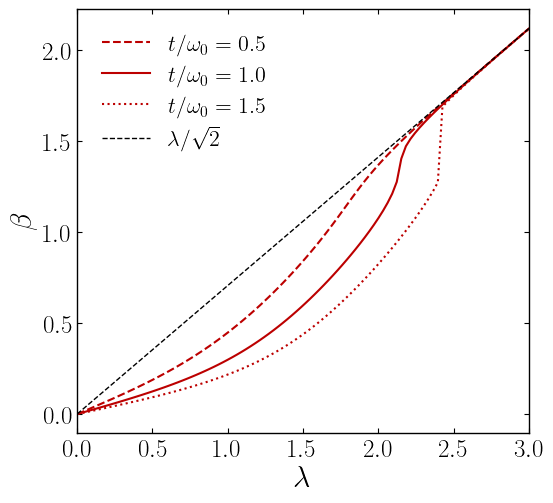

In [10]:
eps_val =  0.25
omega0  = 1.0
C_A  = plt.cm.seismic(0.12)   # azul
C_B  = plt.cm.seismic(0.88)   # rojo
C_C  = plt.cm.seismic(0.6)   # rojo

# ─── TAREA 5: β = −λ/√2 + α/2  con  t/ω0 = 1,  ε̃ = 0 (sweet spot por λ) ───
def compute_beta(t, lam_arr, omega0=1.0, S2=np.sqrt(2.0)):
    """
    Calcula β(λ) para un valor de t en el sweet spot ε̃ = ε - λ²ω₀ = 0.
    """
    beta_arr = np.empty_like(lam_arr)
    x_warm = None
    for k, lam in enumerate(lam_arr):
        eps_val = lam**2 * omega0   # condición ε̃ = 0
        # Se pasa el valor de t a la función de minimización
        E, x = minimize_odd(lam, x_warm=x_warm)
        x_warm = x
        beta_arr[k] = lam / S2 - x[0] / 2.0
    return beta_arr

# Parámetros comunes
lam_arr = np.linspace(0.0, 3.0, 100)   # define tu rango de λ
t_values = [0.5, 1.0, 1.5]
styles = ['--', '-', ':']

fig, ax = plt.subplots(figsize=(6, 5.5))

for t in t_values:
    t = t  # Asegúrate de que t esté definido en el ámbito de la función
    beta_arr = compute_beta(t, lam_arr)
    ax.plot(lam_arr, beta_arr, styles[t_values.index(t)], color=C_B, lw=1.5, label=f'$t/\omega_0 = {t}$')

ax.plot(lam_arr, lam_arr/np.sqrt(2), 'k--', lw=1.0, label=r'$\lambda/\sqrt{2}$')
ax.set_xlabel(r'$\lambda$')   # o quizás $\lambda$ si quieres
ax.set_ylabel(r'$\beta$')
ax.set_xlim(0.0, lam_arr.max())
ax.tick_params(axis='both', direction='in', bottom=True, top=True, right=True, left=True)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2,
              labelspacing=0.4)
plt.savefig(
    'Resultados/Displacement_beta_sweet_spot.png',
    bbox_inches='tight',
    transparent=False,
    dpi=300
)
plt.tight_layout()
plt.show()

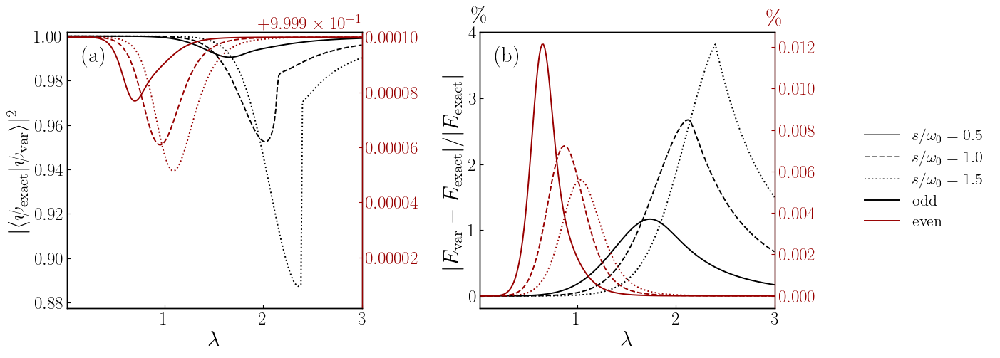

Fidelity + Relative error by sector, omega_0=1.0, eps=0.25


In [55]:
lam_arr = np.linspace(0.01, 3.0, 200)
LS = {0.5: '-', 1.0: '--', 1.5: ':'}
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)   # rojo intenso

fig, (ax_o1, ax_o2) = plt.subplots(1, 2, figsize=(12, 5.5))

# ═══════════════════════════════════════════════════════════════
# Panel (a): Fidelidad
# ═══════════════════════════════════════════════════════════════
ax_e1 = ax_o1.twinx()

for cv in cv_list:
    ax_o1.plot(lam_arr, fid_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e1.plot(lam_arr, fid_e[cv], LS[cv], color=C_EVEN, lw=1.4)

yo = min(fid_o[cv].min() for cv in cv_list)
ax_o1.set_xlabel(r'$\lambda$')
ax_o1.set_ylabel(r'$|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                 color=C_ODD)
ax_o1.set_ylim(yo - 0.01, 1.002)
ax_o1.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o1.tick_params(axis='x', direction='in')
ax_o1.set_xlim(0.01, 3.0)

ye = min(fid_e[cv].min() for cv in cv_list)
ax_e1.set_ylim(ye - 5e-5, 1.000002)
ax_e1.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e1.spines['right'].set_color(C_EVEN)
ax_e1.spines['left'].set_color(C_ODD)

ax_o1.text(0.05, 0.95, '(a)', transform=ax_o1.transAxes,
           ha='left', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Panel (b): Error relativo
# ═══════════════════════════════════════════════════════════════
ax_e2 = ax_o2.twinx()

for cv in cv_list:
    ax_o2.plot(lam_arr, 100*rel_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e2.plot(lam_arr, 100*rel_e[cv], LS[cv], color=C_EVEN, lw=1.4)

ax_o2.set_xlabel(r'$\lambda$')
ax_o2.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/|E_{\mathrm{exact}}|$',
                 color=C_ODD)
ax_o2.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o2.tick_params(axis='x', direction='in')
ax_o2.set_xlim(0.01, 3.0)
ax_o2.text(0.0, 1.02, r'$\%$', transform=ax_o2.transAxes,
           color=C_ODD, ha='center', va='bottom')

ax_e2.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e2.spines['right'].set_color(C_EVEN)
ax_e2.spines['left'].set_color(C_ODD)
ax_e2.text(1.0, 1.01, r'$\%$', transform=ax_e2.transAxes,
           color=C_EVEN, ha='center', va='bottom')

ax_o2.text(0.05, 0.95, '(b)', transform=ax_o2.transAxes,
           ha='left', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Leyenda compartida — a la derecha de la figura
# ═══════════════════════════════════════════════════════════════
handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                         label=rf'$s/\omega_0={cv}$') for cv in cv_list]
handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

fig.legend(handles=handles,
           loc='center left',
           bbox_to_anchor=(1.01, 0.5),     # justo a la derecha del borde
           frameon=True, edgecolor='black',
           framealpha=0.0, fancybox=False,
           borderpad=0.6, handlelength=2.2, labelspacing=0.4)

plt.tight_layout()
plt.savefig('Resultados/Fidelidad_y_error_relativo_por_sector.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

print(r'Fidelity + Relative error by sector, ' + rf'omega_0={omega0}, eps={eps_val}')

In [64]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE EJECUCIÓN — datos para las 5 tareas
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 1.5, 200)
cv_list = [0.5, 1.0, 1.5]                 # t/ω0 (impar)  y  Δ/ω0 (par)

def _Mof(lam):
    return int(max(40, np.ceil(4.0*lam*lam) + 25))

# diccionarios indexados por valor de acoplamiento ----------------
alpha_o = {}; r_o = {}; Evar_o = {}; Eex_o = {}; fid_o = {}; rel_o = {}
a1_e = {}; a2_e = {}; r1_e = {}; r2_e = {}
Evar_e = {}; Eex_e = {}; fid_e = {}; rel_e = {}

for cv in cv_list:
    # ----- SECTOR IMPAR (túnel t = cv; no depende de Δ) -----
    t = cv
    ao = np.empty_like(lam_arr); ro = np.empty_like(lam_arr)
    Ev = np.empty_like(lam_arr); Ee = np.empty_like(lam_arr)
    fo = np.empty_like(lam_arr); re = np.empty_like(lam_arr)
    warm = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_odd(lam, x_warm=warm); warm = x
        ao[k], ro[k] = x
        Ev[k] = E
        Ee[k] = E_odd_exact(lam, M=_Mof(lam))
        fo[k] = fidelity_odd(lam, x)
        re[k] = abs(E - Ee[k]) / abs(Ee[k])
    alpha_o[cv]=ao; r_o[cv]=ro; Evar_o[cv]=Ev; Eex_o[cv]=Ee; fid_o[cv]=fo; rel_o[cv]=re

    # ----- SECTOR PAR (pairing Δ = cv; no depende de t) -----
    a1 = np.empty_like(lam_arr); a2 = np.empty_like(lam_arr)
    rr1 = np.empty_like(lam_arr); rr2 = np.empty_like(lam_arr)
    Ev = np.empty_like(lam_arr); Ee = np.empty_like(lam_arr)
    fe = np.empty_like(lam_arr); re = np.empty_like(lam_arr)
    warm = None
    for k, lam in enumerate(lam_arr):
        E, x = minimize_even(lam, cv, x_warm=warm); warm = x
        a1[k], a2[k], rr1[k], rr2[k] = x
        Ev[k] = E
        Ee[k] = E_even_exact(lam, cv)
        fe[k] = fidelity_even(lam, cv, x)
        re[k] = abs(E - Ee[k]) / abs(Ee[k])
    a1_e[cv]=a1; a2_e[cv]=a2; r1_e[cv]=rr1; r2_e[cv]=rr2
    Evar_e[cv]=Ev; Eex_e[cv]=Ee; fid_e[cv]=fe; rel_e[cv]=re

print("Tareas 1, 2, 4 (y 3 vía cv=1.0): barrido principal listo.")

Tareas 1, 2, 4 (y 3 vía cv=1.0): barrido principal listo.


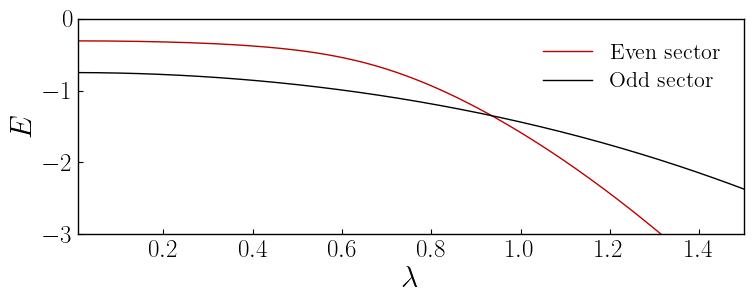

Variational ground state energy, $t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$


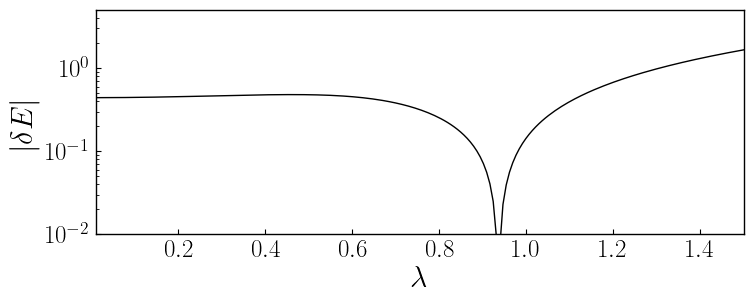

$t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$


In [65]:
C_A  = plt.cm.seismic(0.12)   # azul
C_B  = plt.cm.seismic(0.88)   # rojo
C_C  = plt.cm.seismic(0.6)   # rojo
COLS = [plt.cm.seismic(0.12), plt.cm.seismic(0.6), plt.cm.seismic(0.88)]
lam_star = np.sqrt(eps_val/omega0)

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'


# ── TAREA 3: energías variacionales GS (par sólida, impar discontinua) ──
pstr3 = rf"$t/\omega_0={1.0},\ \varepsilon={0.25},\ \Delta/\omega_0={0.5}$"
fig, ax = plt.subplots(figsize=(8, 3.5))
ax.plot(lam_arr, Evar_e[0.5], '-',  color=C_B, lw=1.0, label=r'Even sector')
ax.plot(lam_arr, Evar_o[1.0], '-', color='black', lw=1.0, label=r'Odd sector')
ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(r'$E$')
ax.set_xlim(0.01, 1.5)
ax.set_ylim(-3.0, 0.0)
ax.legend(frameon=True, edgecolor='black', framealpha=0.0,
              fancybox=False, borderpad=0.6, handlelength=2.2,
              labelspacing=0.4) 
plt.savefig(
    'Resultados/Variational_ground_state_energy2.png',
    bbox_inches='tight',
    transparent=False,
    dpi=300
)
plt.tight_layout(); plt.show()
print(r'Variational ground state energy, ' + pstr3)

pstr3 = rf"$t/\omega_0={1.0},\ \varepsilon={0.25},\ \Delta/\omega_0={0.5}$"
fig, ax = plt.subplots(figsize=(8, 3.5))
ax.semilogy(lam_arr, np.abs(Evar_e[0.5]-Evar_o[1.0]), '-',  color='black', lw=1.0)
ax.set_xlabel(r'$\lambda$'); ax.set_ylabel(r'$|\delta E|$')
ax.set_xlim(0.01, 1.5)
ax.set_ylim(0.01,5.0) 
#plt.savefig('Resultados/Variational_ground_state_energy2.png',bbox_inches='tight',transparent=False,dpi=300)
plt.tight_layout(); plt.show()
print(pstr3)


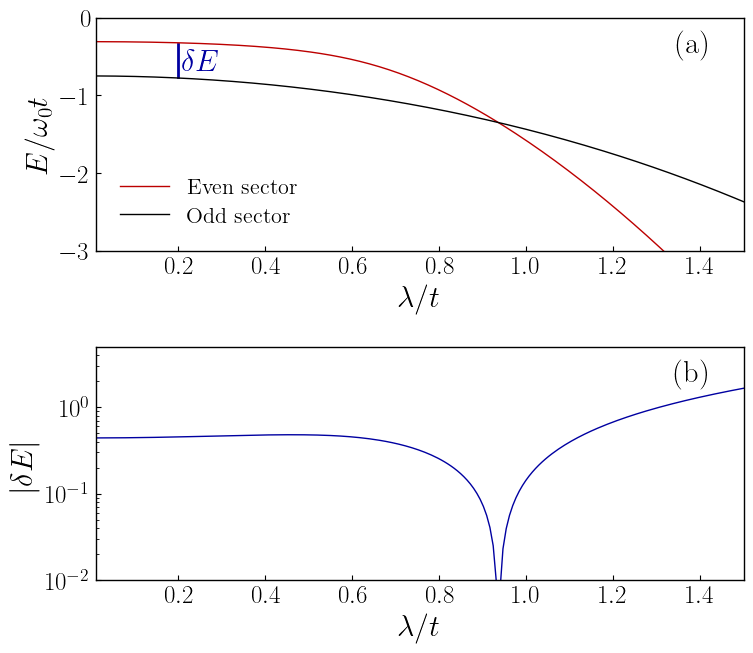

Variational ground state energy, $t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$
Absolute energy difference, $t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$


In [66]:

# ── Configuración de colores y variables globales ─────────────────
C_A  = plt.cm.seismic(0.12)   # azul
C_B  = plt.cm.seismic(0.88)   # rojo
C_C  = plt.cm.seismic(0.6)    # rojo intermedio
COLS = [C_A, C_C, C_B]
lam_star = np.sqrt(eps_val / omega0)   # suponiendo que eps_val, omega0 existen

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ── Cadena de parámetros común ───────────────────────────────────
pstr3 = rf"$t/\omega_0=1.0,\ \varepsilon=0.25,\ \Delta/\omega_0=0.5$"

# ── Crear figura con 2 paneles ───────────────────────────────────
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 7))

# ═════════════════════════════════════════════════════════════════
# Panel (a): Energías variacionales GS (lineal)
# ═════════════════════════════════════════════════════════════════
ax1.plot(lam_arr, Evar_e[0.5], '-', color=C_B, lw=1.0, label=r'Even sector', zorder=1)
ax1.plot(lam_arr, Evar_o[1.0], '-', color='black', lw=1.0, label=r'Odd sector', zorder=1)

# ── Añadir indicación de δE en λ ≈ 0.2 ─────────────────
lam_target = 0.2
# Buscar el índice más cercano a lam_target
idx = np.argmin(np.abs(lam_arr - lam_target))
y_even = Evar_e[0.5][idx]
y_odd  = Evar_o[1.0][idx]
y_mid  = (y_even + y_odd) / 2.0

# Línea vertical que conecta las dos curvas 
ax1.plot([lam_target, lam_target], [y_odd+0.01, y_even-0.01],
         color=C_A, lw=2.0, linestyle='-', zorder=0)

# Texto con la flecha doble y δE
ax1.text(lam_target+0.05, y_mid-0.025, r'$\delta E$',
         ha='center', va='center', color=C_A)

ax1.set_xlabel(r'$\lambda/t$')
ax1.set_ylabel(r'$E/\omega_0t$')
ax1.set_xlim(0.01, 1.5)
ax1.set_ylim(-3.0, 0.0)
ax1.legend(frameon=True, edgecolor='black', framealpha=0.0,
           fancybox=False, borderpad=0.6, handlelength=2.2,
           labelspacing=0.4)

# Etiqueta (a) en la esquina superior derecha
ax1.text(0.95, 0.95, '(a)', transform=ax1.transAxes, ha='right', va='top', fontweight='bold')

# ═════════════════════════════════════════════════════════════════
# Panel (b): Diferencia absoluta (escala logarítmica en y)
# ═════════════════════════════════════════════════════════════════
ax2.semilogy(lam_arr, np.abs(Evar_e[0.5] - Evar_o[1.0]), '-',
             color=C_A, lw=1.0)  # label se puede omitir aquí o adaptar
ax2.set_xlabel(r'$\lambda/t$')
ax2.set_ylabel(r'$|\delta E|$')
ax2.set_xlim(0.01, 1.5)
ax2.set_ylim(0.01, 5.0)
# Etiqueta (b)
ax2.text(0.95, 0.95, '(b)', transform=ax2.transAxes, ha='right', va='top',fontweight='bold')

plt.tight_layout()
plt.show()

fig.savefig('Resultados/combined_energy_plot.png', bbox_inches='tight',transparent=False, dpi=300)

print('Variational ground state energy, ' + pstr3)
print('Absolute energy difference, ' + pstr3)

In [67]:
# ─── parámetros del sistema ──────────────────────────────────────
Delta   = 1.0                      # fijo (escala de referencia)
omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)

# ─── malla en (λ/Δ, t/(ω0 Δ)) ───────────────────────────────────
n_lam, n_t = 200, 200
x_arr = np.linspace(0.0, 2.0, n_lam)    # λ/Δ  → λ = x·Δ = x
y_arr = np.linspace(0.0, 2.0, n_t)      # t/(ω0·Δ) → t = y

# ─── E_e(λ, Δ=1): solo depende de λ → precomputa en 1D ───────────
E_even_1d = np.empty(n_lam)
warm = None
for k, lam in enumerate(x_arr):
    E, x = minimize_even(lam, Delta, x_warm=warm); warm = x
    E_even_1d[k] = E
print("E_e (1D, Δ=1) listo.")

# ─── E_o(λ, t): depende de ambos → barrido 2D por filas de t ─────
def _odd_row(tv):
    """Fila de E_o para t = tv, barriendo λ con warm-start."""
    global t
    t = tv                            # minimize_odd lee t como global
    row = np.empty(n_lam); w = None
    for k, lam in enumerate(x_arr):
        E, x = minimize_odd(lam, x_warm=w); w = x
        row[k] = E
    return row

print(f"Grid {n_t}×{n_lam}: calculando E_o ...")
E_odd_2d = np.empty((n_t, n_lam))
chunks = np.array_split(np.arange(n_t), 20)   # 5% de progreso por trozo
done = 0
with joblib.parallel_backend('loky', n_jobs=-1):
    for idx in chunks:
        res = joblib.Parallel()(joblib.delayed(_odd_row)(y_arr[i]) for i in idx)
        for i, row in zip(idx, res):
            E_odd_2d[i] = row
        done += len(idx)
        print(f"  E_o: {100.0*done/n_t:5.1f}% completado")

# ─── splitting δE = E_e − E_o  (broadcast de E_e sobre t) ─────────
dE = E_even_1d[None, :] - E_odd_2d    # (n_t, n_lam)
print("δE: min=%.4f  max=%.4f" % (dE.min(), dE.max()))

E_e (1D, Δ=1) listo.
Grid 200×200: calculando E_o ...
  E_o:   5.0% completado
  E_o:  10.0% completado
  E_o:  15.0% completado
  E_o:  20.0% completado
  E_o:  25.0% completado
  E_o:  30.0% completado
  E_o:  35.0% completado
  E_o:  40.0% completado
  E_o:  45.0% completado
  E_o:  50.0% completado
  E_o:  55.0% completado
  E_o:  60.0% completado
  E_o:  65.0% completado
  E_o:  70.0% completado
  E_o:  75.0% completado
  E_o:  80.0% completado
  E_o:  85.0% completado
  E_o:  90.0% completado
  E_o:  95.0% completado
  E_o: 100.0% completado
δE: min=-3.8166  max=0.9850


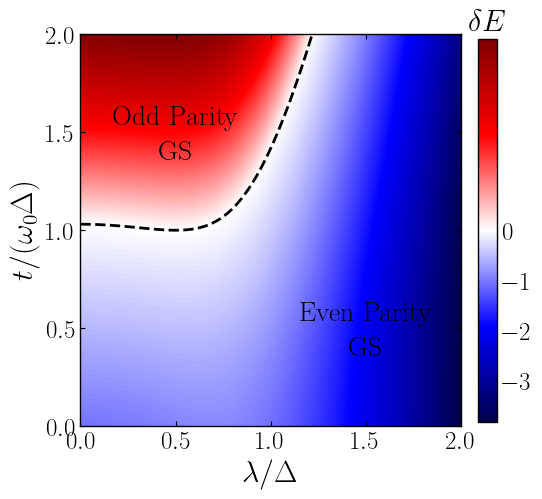

Parity Splitting en (λ/Δ, t/ω0Δ)
$\Delta=1.0,\ \varepsilon=0.25,\ \omega_0=1.0$


In [71]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN
# ══════════════════════════════════════════════════════════════════
extent    = [x_arr[0], x_arr[-1], y_arr[0], y_arr[-1]]
xlabel    = r'$\lambda/\Delta$'
ylabel    = r'$t/(\omega_0\Delta)$'
param_str = rf"$\Delta={Delta},\ \varepsilon={eps_val},\ \omega_0={omega0}$"

vmin_m = np.min(dE); vmax_m = np.max(dE)
norm_p = TwoSlopeNorm(vmin=vmin_m, vcenter=0.0, vmax=vmax_m)

fig, ax = plt.subplots(figsize=(6, 5.5))
im = ax.imshow(dE, origin='lower', aspect='auto',
               extent=extent, cmap='seismic', norm=norm_p)
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.ax.set_title(r'$\delta E$')
ax.contour(x_arr, y_arr, dE, levels=[0.0],
           colors='k', linewidths=2.0, linestyles='--')
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.tick_params(axis='both', direction='in', bottom=True, top=True,
               left=True, right=True)
# etiquetas de región
ax.text(1.5, 0.5, r'\begin{center}Even Parity\\GS\end{center}',
        fontsize=20, color='black', ha='center', va='center')
ax.text(0.5, 1.5, r'\begin{center}Odd Parity\\GS\end{center}',
        fontsize=20, color='black', ha='center', va='center')
plt.tight_layout()
plt.savefig('Resultados/Parity_Splitting_tDelta.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()
print(r'Parity Splitting en (λ/Δ, t/ω0Δ)')
print(param_str)

In [52]:
# ══════════════════════════════════════════════════════════════════
# CELDA — benchmark en el SWEET SPOT (ε = λ²ω0)
#   Ambos sectores comparten parámetros variacionales (del impar),
#   porque en el sweet spot E_o y E_e son la MISMA función (t↔Δ).
#   La diagonalización exacta sí se hace por sector.
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 4.0, 200)
cv_list = [0.5, 1.0, 1.5]

def _Mof(lam):
    return int(max(40, np.ceil(4.0*lam*lam) + 25))

# (alpha, r) del impar  →  (a1, a2, r1, r2) del par, SIN desplazamiento
def odd_to_even_params(alpha, r):
    return (-alpha/2.0, alpha/2.0, r, r)     # α1=-α/2, α2=α/2, r1=r2=r

alpha_o = {}; r_o = {}; Evar_o = {}; Eex_o = {}; fid_o = {}; rel_o = {}
Evar_e = {}; Eex_e = {}; fid_e = {}; rel_e = {}

for cv in cv_list:
    t = cv
    ao = np.empty_like(lam_arr); ro = np.empty_like(lam_arr)
    Ev   = np.empty_like(lam_arr)                                  # E_var impar
    Ee_o = np.empty_like(lam_arr); fo = np.empty_like(lam_arr); re_o = np.empty_like(lam_arr)
    Eve  = np.empty_like(lam_arr)                                  # E_var par
    Ee_e = np.empty_like(lam_arr); fe = np.empty_like(lam_arr); re_e = np.empty_like(lam_arr)
    warm = None
    for k, lam in enumerate(lam_arr):
        eps_val = lam**2 * omega0          # sweet spot

        # ── ÚNICA minimización: funcional impar (= funcional par aquí) ──
        E, x = minimize_odd(lam, x_warm=warm); warm = x
        alpha, r = x
        ao[k], ro[k] = alpha, r
        Ev[k] = E

        # ── benchmark IMPAR (t = cv) ──
        Ee_o[k] = E_odd_exact(lam, M=_Mof(lam))
        fo[k]   = fidelity_odd(lam, x)
        re_o[k] = abs(Ev[k] - Ee_o[k])              # E_var impar vs E_exact impar

        # ── benchmark PAR (Δ = cv), MISMOS parámetros variacionales ──
        x_e = odd_to_even_params(alpha, r)
        Ee_e[k] = E_even_exact(lam, cv)
        fe[k]   = fidelity_even(lam, cv, x_e)
        # energía variacional del par en el sweet spot con los mismos (α, r):
        #   E_e = ω0(α²/4 + sinh²r) − Δ·exp[−½(√2λ−α)²e^{2r}]
        Eve[k]  = omega0*(0.25*alpha**2 + np.sinh(r)**2) \
                  - cv*np.exp(-0.5*(_S2*lam - alpha)**2 * np.exp(2.0*r))
        re_e[k] = abs(Eve[k] - Ee_e[k])             # E_var par vs E_exact par

    alpha_o[cv]=ao; r_o[cv]=ro; Evar_o[cv]=Ev
    Eex_o[cv]=Ee_o; fid_o[cv]=fo; rel_o[cv]=re_o
    Evar_e[cv]=Eve; Eex_e[cv]=Ee_e; fid_e[cv]=fe; rel_e[cv]=re_e

print("Benchmark sweet spot listo (parámetros compartidos impar↔par).")

# ── verificación 1: ¿coinciden los benchmarks de ambos sectores? ──
for cv in cv_list:
    df_fid = np.max(np.abs(fid_o[cv] - fid_e[cv]))
    df_Ev  = np.max(np.abs(Evar_o[cv] - Evar_e[cv]))
    df_Ee  = np.max(np.abs(Eex_o[cv]  - Eex_e[cv]))
    print(f"  cv={cv}: max|fid_o-fid_e|={df_fid:.2e}  "
          f"max|Evar_o-Evar_e|={df_Ev:.2e}  max|Eex_o-Eex_e|={df_Ee:.2e}")

Benchmark sweet spot listo (parámetros compartidos impar↔par).
  cv=0.5: max|fid_o-fid_e|=8.22e-15  max|Evar_o-Evar_e|=0.00e+00  max|Eex_o-Eex_e|=9.46e-15
  cv=1.0: max|fid_o-fid_e|=2.00e-15  max|Evar_o-Evar_e|=0.00e+00  max|Eex_o-Eex_e|=9.15e-15
  cv=1.5: max|fid_o-fid_e|=3.44e-15  max|Evar_o-Evar_e|=5.55e-17  max|Eex_o-Eex_e|=1.08e-14


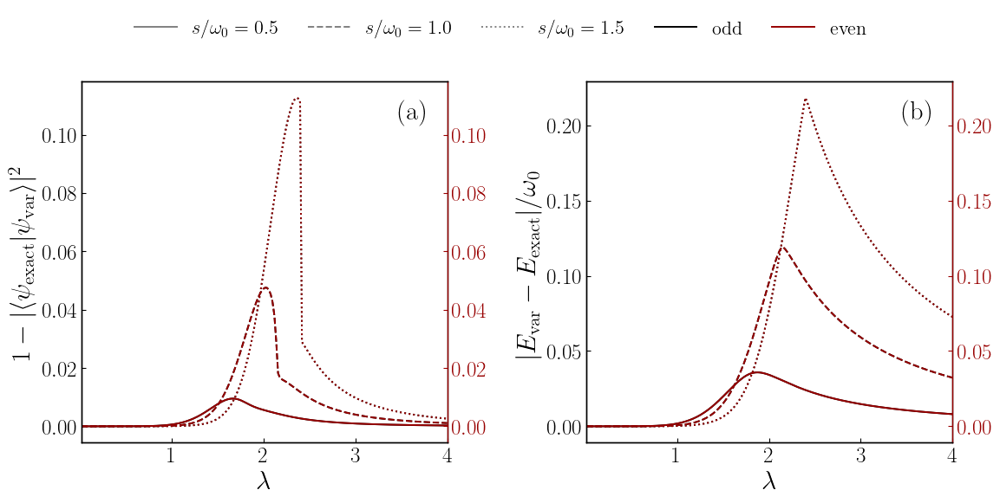

Fidelity by sector, omega_0=1.0,\ \varepsilon=16.0
Relative error by sector, omega_0=1.0,\ \varepsilon=16.0


In [53]:
LS = {0.5: '-', 1.0: '--', 1.5: ':'}
C_ODD = 'black'
C_EVEN = plt.cm.seismic(0.95)   # rojo intenso

fid_o_err = {cv: 1.0 - fid_o[cv] for cv in cv_list}
fid_e_err = {cv: 1.0 - fid_e[cv] for cv in cv_list}

fig, (ax_o1, ax_o2) = plt.subplots(1, 2, figsize=(12, 6))

# ═══════════════════════════════════════════════════════════════
# Panel (a): Fidelidad
# ═══════════════════════════════════════════════════════════════
ax_e1 = ax_o1.twinx()

for cv in cv_list:
    ax_o1.plot(lam_arr, fid_o_err[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e1.plot(lam_arr, fid_e_err[cv], LS[cv], color=C_EVEN, lw=1.4)

ax_o1.set_xlabel(r'$\lambda$')
ax_o1.set_ylabel(r'$1-|\langle\psi_{\mathrm{exact}}|\psi_{\mathrm{var}}\rangle|^2$',
                 color=C_ODD)
ax_o1.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o1.tick_params(axis='x', direction='in')
ax_o1.set_xlim(0.01, 4.0)

ax_e1.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e1.spines['right'].set_color(C_EVEN)
ax_e1.spines['left'].set_color(C_ODD)

ax_o1.text(0.95, 0.95, '(a)', transform=ax_o1.transAxes,
           ha='right', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Panel (b): Error relativo
# ═══════════════════════════════════════════════════════════════
ax_e2 = ax_o2.twinx()

for cv in cv_list:
    ax_o2.plot(lam_arr, rel_o[cv], LS[cv], color=C_ODD,  lw=1.4)
    ax_e2.plot(lam_arr, rel_e[cv], LS[cv], color=C_EVEN, lw=1.4)

ax_o2.set_xlabel(r'$\lambda$')
ax_o2.set_ylabel(r'$|E_{\mathrm{var}}-E_{\mathrm{exact}}|/\omega_0$',
                 color=C_ODD)
ax_o2.tick_params(axis='y', colors=C_ODD,  direction='in')
ax_o2.tick_params(axis='x', direction='in')
ax_o2.set_xlim(0.01, 4.0)


ax_e2.tick_params(axis='y', colors=C_EVEN, direction='in')
ax_e2.spines['right'].set_color(C_EVEN)
ax_e2.spines['left'].set_color(C_ODD)

ax_o2.text(0.95, 0.95, '(b)', transform=ax_o2.transAxes,
           ha='right', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Leyenda compartida — a la derecha de la figura
# ═══════════════════════════════════════════════════════════════
handles = [mlines.Line2D([], [], color='gray', ls=LS[cv], lw=1.4,
                         label=rf'$s/\omega_0={cv}$') for cv in cv_list]
handles += [mlines.Line2D([], [], color=C_ODD,  lw=1.4, label='odd'),
            mlines.Line2D([], [], color=C_EVEN, lw=1.4, label='even')]

fig.legend(handles=handles,
           loc='upper center',
           bbox_to_anchor=(0.5,1.01),     # centrada sobre la figura
           ncol=len(handles),               # una sola fila
           frameon=False,
           borderpad=0.6, handlelength=2.2, labelspacing=0.4, columnspacing=1.5)

plt.tight_layout()
plt.subplots_adjust(top=0.85)              # espacio para la leyenda arriba
plt.savefig(f'Resultados/Fidelidad_y_error_relativo_por_sector.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()


print(r'Fidelity by sector, ' + rf'omega_0={omega0},\ \varepsilon={eps_val}')
print(r'Relative error by sector, ' + rf'omega_0={omega0},\ \varepsilon={eps_val}')

In [54]:
# ═══════════════════════════════════════════════════════════════
# Diagnóstico: energías en el punto de error absoluto máximo
# ═══════════════════════════════════════════════════════════════
print("\n" + "="*70)
print("  Energías en el λ de error absoluto MÁXIMO (por cv)")
print("="*70)
for cv in cv_list:
    # ----- sector impar -----
    k_o   = int(np.argmax(rel_o[cv]))
    lam_o = lam_arr[k_o]
    print(f"\n  cv = {cv}")
    print(f"  ── IMPAR (t/ω0={cv}) ──")
    print(f"     λ*            = {lam_o:.4f}")
    print(f"     E_var/ω0      = {Evar_o[cv][k_o]:.6f}")
    print(f"     E_exact/ω0    = {Eex_o[cv][k_o]:.6f}")
    print(f"     |ΔE|/ω0       = {rel_o[cv][k_o]:.6f}")
    # ----- sector par -----
    k_e   = int(np.argmax(rel_e[cv]))
    lam_e = lam_arr[k_e]
    print(f"  ── PAR (Δ/ω0={cv}) ──")
    print(f"     λ*            = {lam_e:.4f}")
    print(f"     E_var/ω0      = {Evar_e[cv][k_e]:.6f}")
    print(f"     E_exact/ω0    = {Eex_e[cv][k_e]:.6f}")
    print(f"     |ΔE|/ω0       = {rel_e[cv][k_e]:.6f}")
print("="*70)


  Energías en el λ de error absoluto MÁXIMO (por cv)

  cv = 0.5
  ── IMPAR (t/ω0=0.5) ──
     λ*            = 1.8747
     E_var/ω0      = -0.022979
     E_exact/ω0    = -0.058793
     |ΔE|/ω0       = 0.035813
  ── PAR (Δ/ω0=0.5) ──
     λ*            = 1.8747
     E_var/ω0      = -0.022979
     E_exact/ω0    = -0.058793
     |ΔE|/ω0       = 0.035813

  cv = 1.0
  ── IMPAR (t/ω0=1.0) ──
     λ*            = 2.1554
     E_var/ω0      = -0.016914
     E_exact/ω0    = -0.135791
     |ΔE|/ω0       = 0.118877
  ── PAR (Δ/ω0=1.0) ──
     λ*            = 2.1554
     E_var/ω0      = -0.016914
     E_exact/ω0    = -0.135791
     |ΔE|/ω0       = 0.118877

  cv = 1.5
  ── IMPAR (t/ω0=1.5) ──
     λ*            = 2.3960
     E_var/ω0      = -0.007892
     E_exact/ω0    = -0.226095
     |ΔE|/ω0       = 0.218203
  ── PAR (Δ/ω0=1.5) ──
     λ*            = 2.3960
     E_var/ω0      = -0.007892
     E_exact/ω0    = -0.226095
     |ΔE|/ω0       = 0.218203


In [42]:
lam_test = 3.0; cv_test = 0.5
eps_val = lam_test**2 * omega0
t = cv_test
_, x = minimize_odd(lam_test)
for Mtest in [_Mof(lam_test), 2*_Mof(lam_test)]:
    f = fidelity_odd(lam_test, x, M=Mtest)
    print(f"M={Mtest}: fid_odd={f:.6f}")

M=61: fid_odd=0.999047
M=122: fid_odd=0.999047


### Wigner functions

#### Functions

In [5]:
# ══════════════════════════════════════════════════════════════════
# CELDA — FUNCIONES DE WIGNER (sweet spot) con normalización analítica
#   N_± = [2(1 ± e^{-2β² e^{2r}})]^{-1/2}
# ══════════════════════════════════════════════════════════════════
N_FOCK = 40  # truncación Fock para QuTiP

from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker

def coh_squeezed(beta, r, N=N_FOCK):
    """|r,β⟩ = D(β) S(r) |0⟩  (qutip.Qobj, ket)."""
    vac = qt.basis(N, 0)
    return qt.displace(N, beta) * qt.squeeze(N, r) * vac

def cat_norm(beta, r, sign):
    """
    Factor de normalización analítico del gato
        |Cat_±⟩ = N_± ( |r,β⟩ ± |r,-β⟩ ),
        N_± = [ 2 ( 1 ± e^{-2 β² e^{2r}} ) ]^{-1/2}.
    sign = +1 → N_+ ;  sign = -1 → N_- .
    """
    overlap = np.exp(-2.0 * beta**2 * np.exp(2.0*r))   # ⟨r,-β|r,β⟩ = e^{-2β²e^{2r}}
    return 1.0 / np.sqrt(2.0 * (1.0 + sign*overlap))

def cat_state(beta, r, sign, N=N_FOCK):
    """
    Estado gato comprimido con normalización ANALÍTICA:
        |Cat_±⟩ = N_± ( |r,β⟩ ± |r,-β⟩ ).
    Las dos componentes están en ±β con el mismo squeezing r.
    """
    psi = coh_squeezed(beta, r, N) + sign * coh_squeezed(-beta, r, N)
    return cat_norm(beta, r, sign) * psi

def mixture_dm(beta, r, N=N_FOCK):
    """Mezcla estadística 50/50 de |r,β⟩ y |r,-β⟩ (estado reducido sin medir)."""
    p1 = coh_squeezed( beta, r, N)
    p2 = coh_squeezed(-beta, r, N)
    return 0.5*(p1*p1.dag()) + 0.5*(p2*p2.dag())

xvec = np.linspace(-6, 6, 500)
pvec = np.linspace(-6, 6, 500)

def wigner_and_cuts(state, xvec=xvec, pvec=pvec):
    """Devuelve W(x,p), corte en p=0, y corte en x=0."""
    W = qt.wigner(state, xvec, pvec)
    ip0 = np.argmin(np.abs(pvec))
    ix0 = np.argmin(np.abs(xvec))
    cut_p0 = W[ip0, :]      # W(x, P=0)
    cut_x0 = W[:, ix0]      # W(X=0, p)
    return W, cut_p0, cut_x0

def get_wigner_data(states):
    Ws, cuts_p0, cuts_x0 = [], [], []
    for s in states:
        W, cut_p, cut_x = wigner_and_cuts(s)
        Ws.append(W)
        cuts_p0.append(cut_p)
        cuts_x0.append(cut_x)
    return Ws, cuts_p0, cuts_x0

def plot_wigner_single(W, cut_reim0, cut_re0im, title,
                       xvec=xvec, pvec=pvec, cmap='RdBu',
                       axis_lim=(-1.5*np.sqrt(2), 1.5*np.sqrt(2)),
                       cut_margin=1.15, figsize=(8.5, 8.5),
                       cbar_shrink=0.4, cbar_x=-0.12, cbar_w=0.04, labeleven=False):
    re = xvec/np.sqrt(2)
    im = pvec/np.sqrt(2)

    vmax = np.max(np.abs(W))
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

    fig, ax_main = plt.figure(figsize=figsize), None
    ax_main = fig.add_subplot(1, 1, 1)

    # ── mapa central ──────────────────────────────────────────────
    im_h = ax_main.pcolormesh(re, im, W, cmap=cmap, norm=norm, shading='auto')
    ax_main.axhline(0.0, color='k', ls='--', lw=1.5)
    ax_main.axvline(0.0, color='k', ls='--', lw=1.5)
    ax_main.set_xlim(*axis_lim); ax_main.set_ylim(*axis_lim)

    # ── Forzar xticks cada 1 ──────────────────────────────
    ax_main.yaxis.set_major_locator(ticker.MultipleLocator(1))
    
    if labeleven == True:
        ax_main.yaxis.set_major_locator(ticker.MultipleLocator(2))

    ax_main.set_aspect('equal', adjustable='box')   
    ax_main.set_axisbelow(False)

    # ── paneles laterales y colorbar anclados al mapa ─────────────
    divider  = make_axes_locatable(ax_main)
    ax_below = divider.append_axes("bottom", size="30%", pad=0.05, sharex=ax_main)
    ax_right = divider.append_axes("right",  size="30%", pad=0.05, sharey=ax_main)

    ax_main.tick_params(axis='x', labelbottom=False, labeltop=True,
                        direction='in', top=True, bottom=True)
    ax_main.tick_params(axis='y', direction='in', left=True, right=True)   # ← AÑADIR
    ax_main.text(0.0, 1.05, r'$\mathrm{Re}(\alpha)$', transform=ax_main.transAxes,
                 ha='left', va='bottom')
    ax_main.text(-0.05, 1.0, r'$\mathrm{Im}(\alpha)$', transform=ax_main.transAxes,
                 ha='right', va='top', rotation=90)

    # ── límite simétrico común de los cortes ──────────────────────
    m = cut_margin * max(np.max(np.abs(cut_reim0)), np.max(np.abs(cut_re0im)))

    # ── corte inferior: W(Re α, Im α = 0)  [eje x invertido] ──────
    ax_below.plot(re, cut_reim0, color='k', lw=1.3)
    ax_below.set_xlim(axis_lim[0], axis_lim[1])
    ax_below.invert_xaxis()
    if np.all(cut_reim0 > 0):       # estrictamente positivo
        ax_below.set_ylim(0.0, m)
    else:                           # hay W < 0  o  W = 0
        ax_below.set_ylim(-m, m)
    ax_below.set_ylabel(r'$W$', rotation=0, labelpad=15, va='center')
    ax_below.tick_params(axis='x', labelbottom=False, direction='in', top=True, right=True)
    ax_below.tick_params(axis='y', direction='in', top=True, right=True)

    # ── corte derecho: W(Re α = 0, Im α) ──────────────────────────
    ax_right.plot(cut_re0im, im, color='k', lw=1.3)
    tol = 1e-3   # umbral para ignorar positividad/negatividad espuria
    has_pos = np.max(cut_re0im) >  tol
    has_neg = np.min(cut_re0im) < -tol

    if has_pos and has_neg:          # cambia de signo
        ax_right.set_xlim(m, -m)
    elif has_pos:                    # esencialmente positivo
        ax_right.set_xlim(m, 0.0)    # invertido: +m (izq) … 0 (der)
    elif has_neg:                    # esencialmente negativo
        ax_right.set_xlim(0.0, -m)   # invertido: 0 (izq) … −m (der)
    else:                            # ~0 en todo el corte
        ax_right.set_xlim(m, -m)
    ax_right.set_xlabel(r'$W$')
    ax_right.tick_params(axis='y', labelleft=False, direction='in', top=True, right=True)
    ax_right.tick_params(axis='x', direction='in', top=True, right=True)

    # ── colorbar como inset del mapa: centrada y con "shrink" ─────
    cax = ax_main.inset_axes([cbar_x, (1 - cbar_shrink)/2, cbar_w, cbar_shrink])
    cbar = fig.colorbar(im_h, cax=cax)
    cax.yaxis.set_ticks_position('left')
    cax.yaxis.set_label_position('left')
    cax.set_title(r'$W$')
    return fig

def plot_all_wigner(Ws, cuts_p0, cuts_x0, titles, suptitle, **kwargs):
    """Una figura separada por cada estado. Imprime el suptitle y los extremos."""
    print(f"\n{suptitle}")
    print("  " + "-"*52)
    print(f"  {'estado':<28}{'W_min':>11}{'W_max':>11}")
    print("  " + "-"*52)
    for k in range(len(Ws)):
        print(f"  {titles[k]:<28}{float(np.min(Ws[k])):>11.4f}{float(np.max(Ws[k])):>11.4f}")
    print("  " + "-"*52)

    figs = []
    for k in range(len(Ws)):
        fig = plot_wigner_single(Ws[k], cuts_p0[k], cuts_x0[k], titles[k], **kwargs)
        plt.savefig('Resultados/Wigner_' + titles[k].replace(' ', '_') + '.png',
        bbox_inches='tight',
        transparent=False,
        dpi=300)
        plt.show()
        figs.append(fig)
    return figs

#### $t$ = 1.0, $\Delta$ = 1.0, $\varepsilon$ = 0.25, $\lambda$ = 0.5

eps_t = 0.000e+00  (should be ~0 at sweet spot)
Odd sector:  alpha=0.4576  r=-0.0285  E_o=-0.917864
Even sector:    a1=-0.2288  a2=0.2288  r1=-0.0285  r2=-0.0285  E_e=-0.917864

beta_o (odd) = -0.1247   beta_e (even, centered) = -0.1247  (should match)



Odd sector - relative mode ($\lambda=0.50,\ r=-0.0285,\ \beta=-0.1247,\ \varepsilon=0.25,\ t/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3180     0.1421
  Cat $+$                          0.0000     0.3182
  ----------------------------------------------------


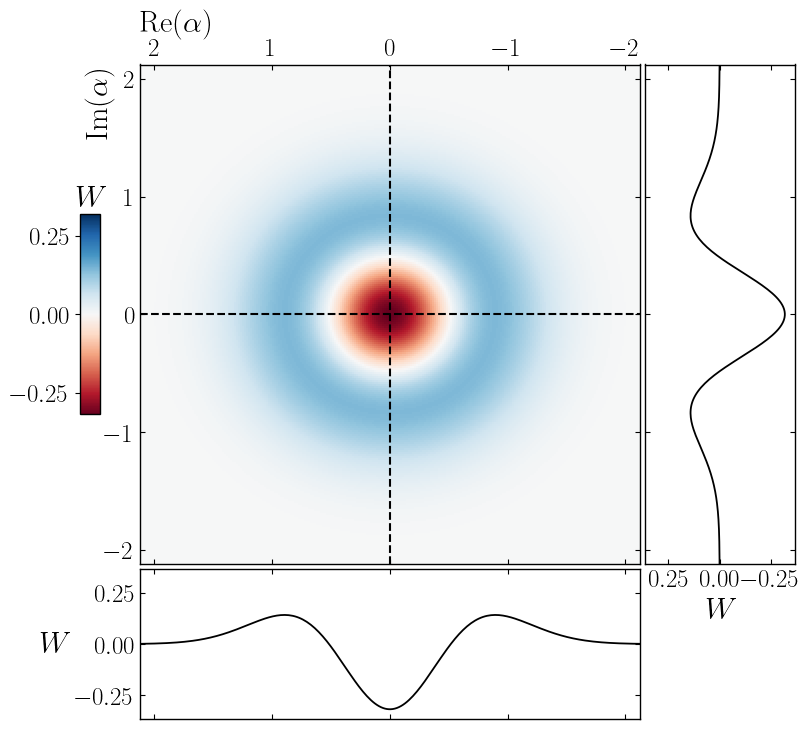

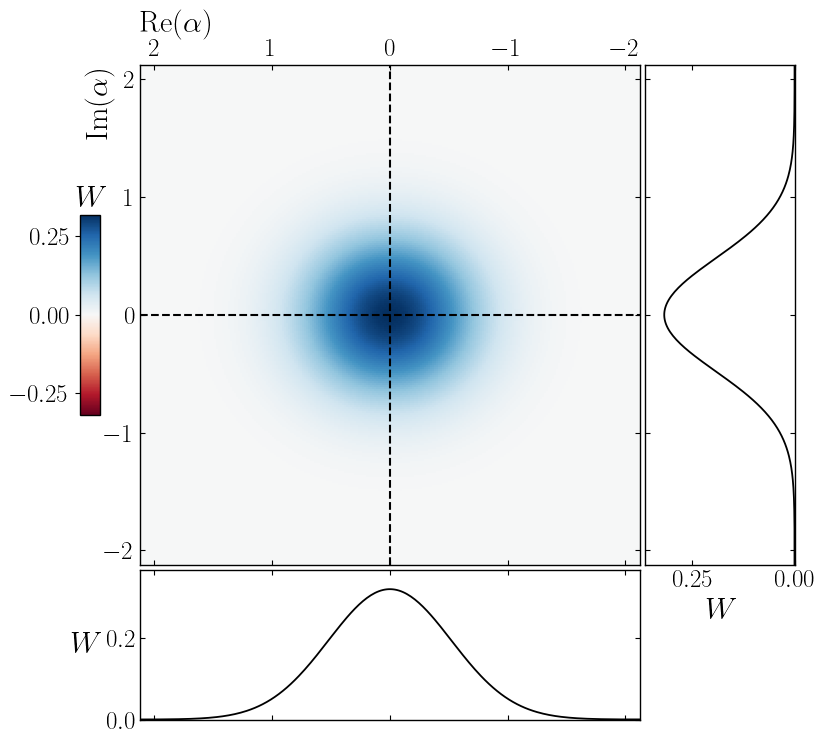


Even sector - CoM mode ($\lambda=0.50,\ r=-0.0285,\ \beta=-0.1247,\ \varepsilon=0.25,\ \Delta/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3180     0.1421
  Cat $+$                          0.0000     0.3182
  ----------------------------------------------------


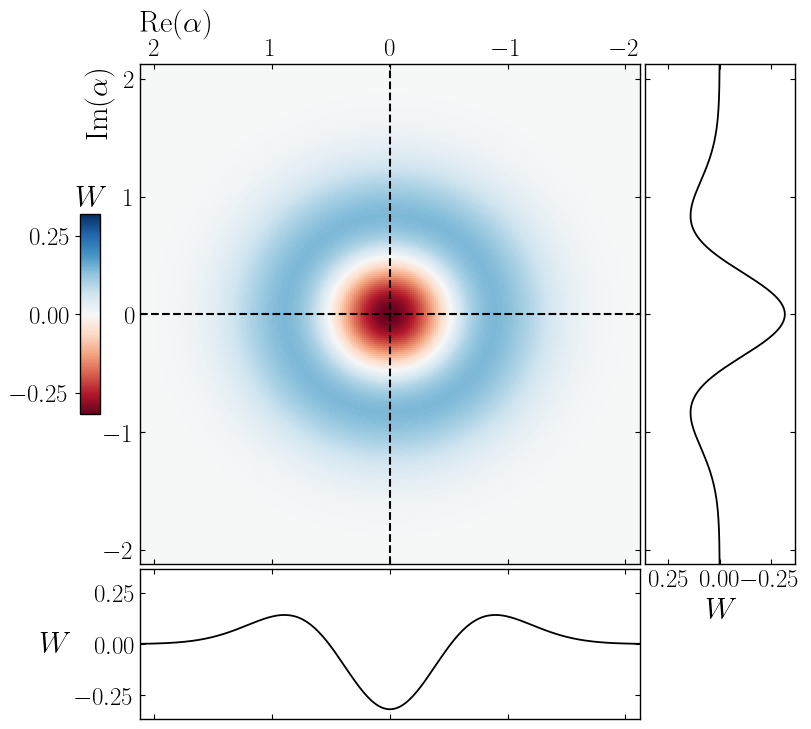

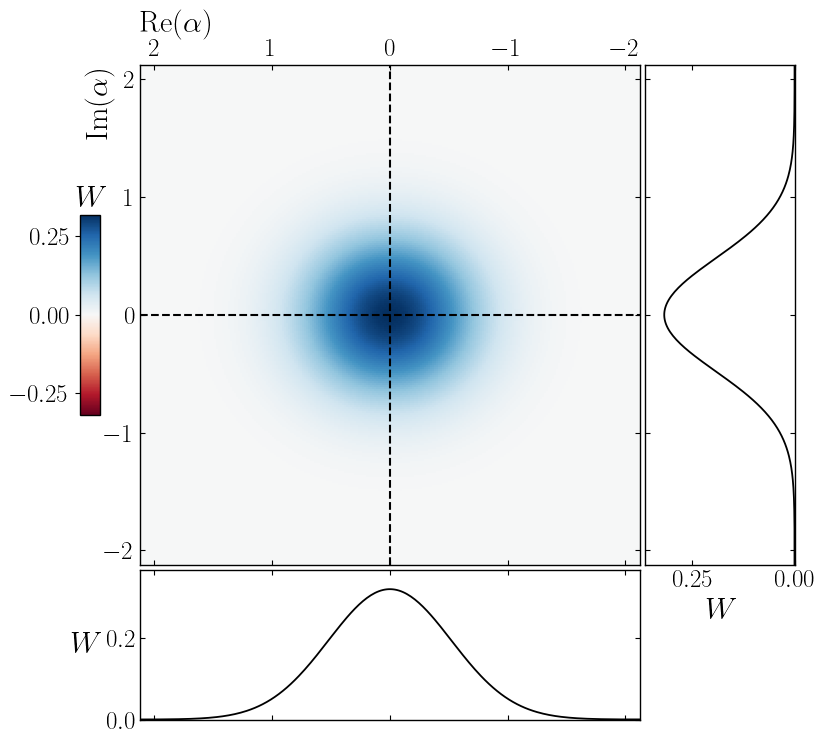

In [8]:
# ══════════════════════════════════════════════════════════════════
# CELL — PARAMETERS AT SWEET SPOT AND STATE CONSTRUCTION
# ══════════════════════════════════════════════════════════════════
t       = 1.0
Delta_e = 1.0
omega0  = 1.0
eps_val = 0.25
lam     = np.sqrt(eps_val/omega0)

E_o, x_o = minimize_odd(lam)
alpha, r = x_o

E_e, x_e = minimize_even(lam, Delta_e)
a1, a2, rp1, rp2 = x_e
r_e        = 0.5*(rp1 + rp2)
alpha_half = a2

print(f"eps_t = {eps_val - lam**2*omega0:.3e}  (should be ~0 at sweet spot)")
print(f"Odd sector:  alpha={alpha:.4f}  r={r:.4f}  E_o={E_o:.6f}")
print(f"Even sector:    a1={a1:.4f}  a2={a2:.4f}  r1={rp1:.4f}  r2={rp2:.4f}  E_e={E_e:.6f}")

# ─── β en el marco laboratorio (idéntico para ambos sectores) ────
beta_o = -lam/_S2 + alpha/2.0          # odd:  modo relativo
beta_e = -lam/_S2 + alpha_half         # even: modo CoM (recentrado)
print(f"\nbeta_o (odd) = {beta_o:.4f}   beta_e (even, centered) = {beta_e:.4f}  (should match)")

# ─── estados gato con normalización analítica ────────────────────
cat_o_minus = cat_state(beta_o, r,   sign=-1.0)
cat_o_plus  = cat_state(beta_o, r,   sign=+1.0)
cat_e_minus = cat_state(beta_e, r_e, sign=-1.0)
cat_e_plus  = cat_state(beta_e, r_e, sign=+1.0)

odd_states  = [cat_o_minus, cat_o_plus]
odd_titles  = [r"Cat $-$", r"Cat $+$"]

even_states = [cat_e_minus, cat_e_plus]
even_titles = [r"Cat $-$", r"Cat $+$"]

# ══════════════════════════════════════════════════════════════════
# CELL — graficación: odd (modo relativo) y even (modo CoM)
# ══════════════════════════════════════════════════════════════════

# ─── sector impar ────────────────────────────────────────────────
Ws_odd, cuts_odd_p0, cuts_odd_x0 = get_wigner_data(odd_states)
figs_odd = plot_all_wigner(
    Ws_odd, cuts_odd_p0, cuts_odd_x0, odd_titles,
    suptitle=rf"Odd sector - relative mode "
             rf"($\lambda={lam:.2f},\ r={r:.4f},\ \beta={beta_o:.4f},"
             rf"\ \varepsilon={eps_val},\ t/\omega_0={t/omega0}$)",
)

# ─── sector par ──────────────────────────────────────────────────
Ws_even, cuts_even_p0, cuts_even_x0 = get_wigner_data(even_states)
figs_even = plot_all_wigner(
    Ws_even, cuts_even_p0, cuts_even_x0, even_titles,
    suptitle=rf"Even sector - CoM mode "
             rf"($\lambda={lam:.2f},\ r={r_e:.4f},\ \beta={beta_e:.4f},"
             rf"\ \varepsilon={eps_val},\ \Delta/\omega_0={Delta_e/omega0}$)",
)

#### $t$ = 1.0, $\Delta$ = 1.0, $\varepsilon$ = 1.0, $\lambda$ = 1.0

eps_t = 0.000e+00  (should be ~0 at sweet spot)
Odd sector:  alpha=0.8162  r=-0.1208  E_o=-0.687773
Even sector:    a1=-0.4081  a2=0.4081  r1=-0.1208  r2=-0.1208  E_e=-0.687773

beta_o (odd) = -0.2990   beta_e (even, centered) = -0.2990  (should match)

Odd sector - relative mode ($\lambda=1.00,\ r=-0.1208,\ \beta=-0.2990,\ \varepsilon=1.0,\ t/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3180     0.1421
  Cat $+$                         -0.0000     0.3182
  ----------------------------------------------------


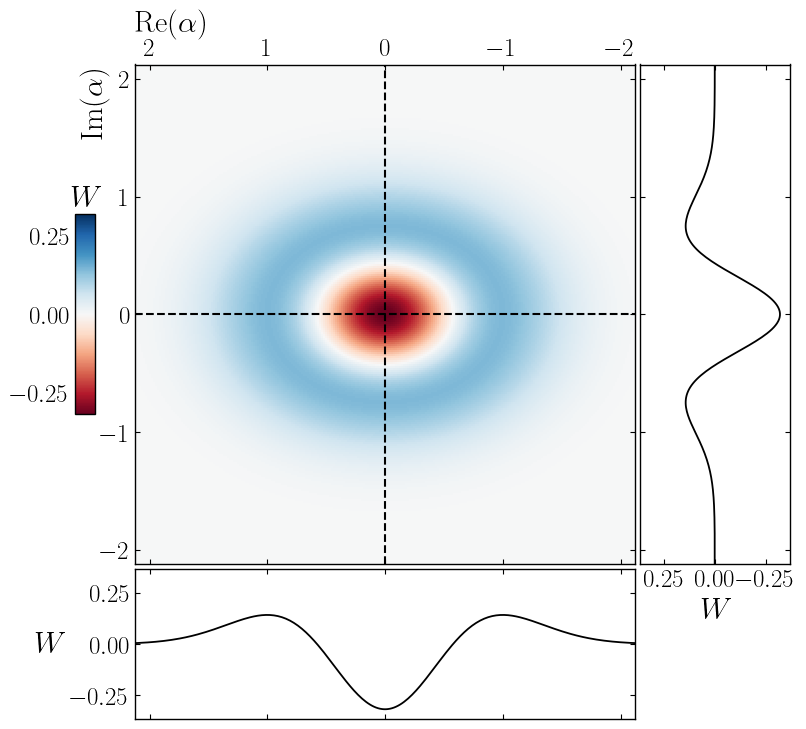

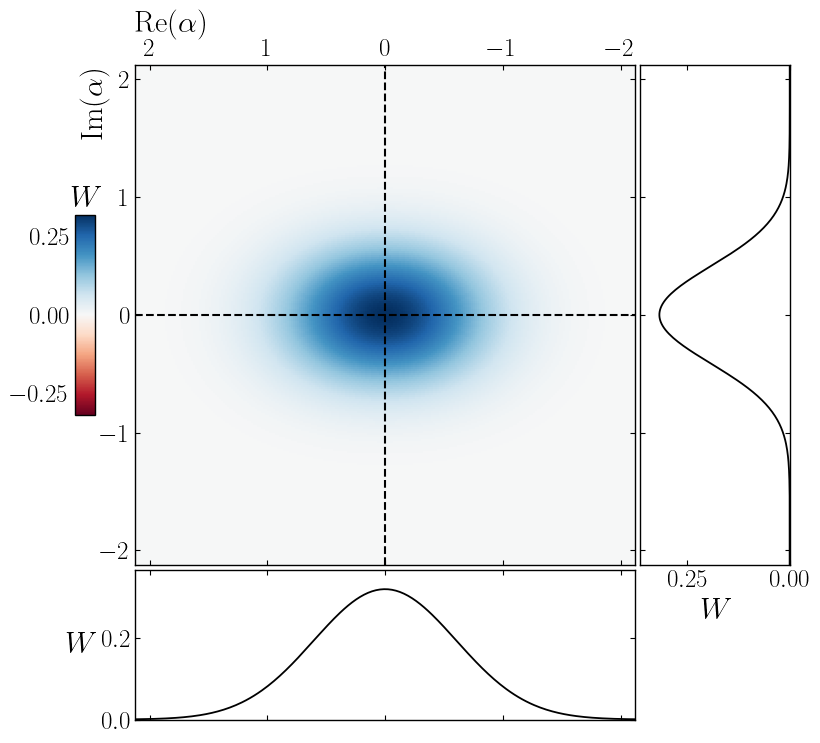


Even sector - CoM mode ($\lambda=1.00,\ r=-0.1208,\ \beta=-0.2990,\ \varepsilon=1.0,\ \Delta/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3180     0.1421
  Cat $+$                         -0.0000     0.3182
  ----------------------------------------------------


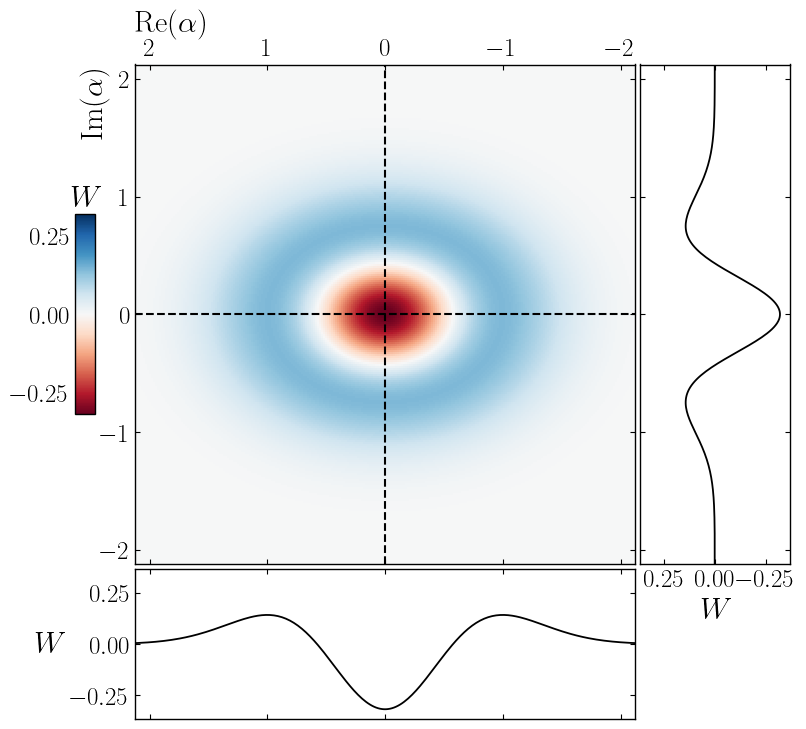

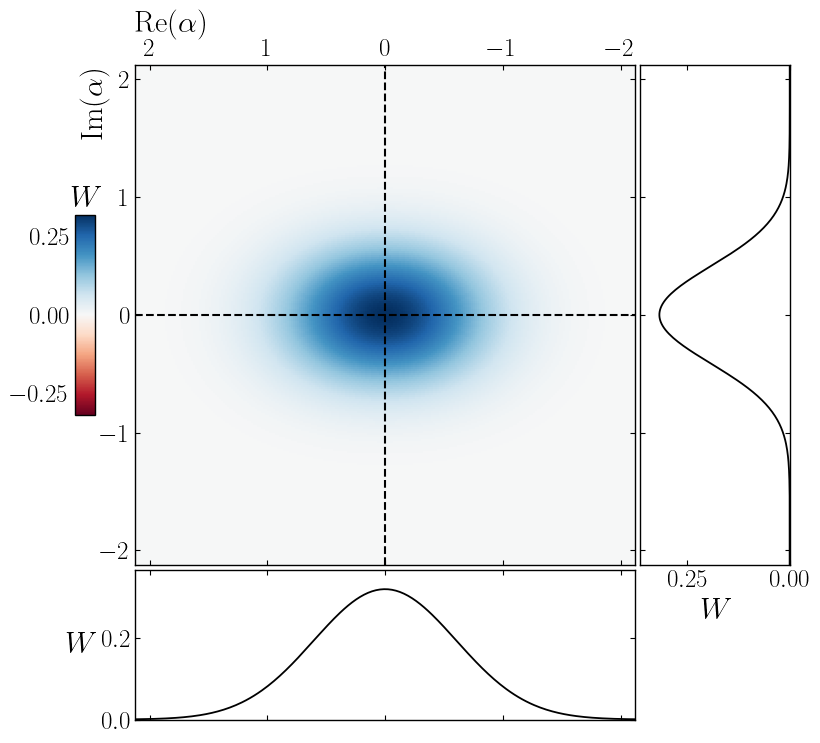

In [61]:
# ══════════════════════════════════════════════════════════════════
# CELL — PARAMETERS AT SWEET SPOT AND STATE CONSTRUCTION
# ══════════════════════════════════════════════════════════════════
t       = 1.0
Delta_e = 1.0
omega0  = 1.0
eps_val = 1.0
lam     = np.sqrt(eps_val/omega0)

E_o, x_o = minimize_odd(lam)
alpha, r = x_o

E_e, x_e = minimize_even(lam, Delta_e)
a1, a2, rp1, rp2 = x_e
r_e        = 0.5*(rp1 + rp2)
alpha_half = a2

print(f"eps_t = {eps_val - lam**2*omega0:.3e}  (should be ~0 at sweet spot)")
print(f"Odd sector:  alpha={alpha:.4f}  r={r:.4f}  E_o={E_o:.6f}")
print(f"Even sector:    a1={a1:.4f}  a2={a2:.4f}  r1={rp1:.4f}  r2={rp2:.4f}  E_e={E_e:.6f}")

# ─── β en el marco laboratorio (idéntico para ambos sectores) ────
beta_o = -lam/_S2 + alpha/2.0          # odd:  modo relativo
beta_e = -lam/_S2 + alpha_half         # even: modo CoM (recentrado)
print(f"\nbeta_o (odd) = {beta_o:.4f}   beta_e (even, centered) = {beta_e:.4f}  (should match)")

# ─── estados gato con normalización analítica ────────────────────
cat_o_minus = cat_state(beta_o, r,   sign=-1.0)
cat_o_plus  = cat_state(beta_o, r,   sign=+1.0)
cat_e_minus = cat_state(beta_e, r_e, sign=-1.0)
cat_e_plus  = cat_state(beta_e, r_e, sign=+1.0)

odd_states  = [cat_o_minus, cat_o_plus]
odd_titles  = [r"Cat $-$", r"Cat $+$"]

even_states = [cat_e_minus, cat_e_plus]
even_titles = [r"Cat $-$", r"Cat $+$"]

# ══════════════════════════════════════════════════════════════════
# CELL — graficación: odd (modo relativo) y even (modo CoM)
# ══════════════════════════════════════════════════════════════════

# ─── sector impar ────────────────────────────────────────────────
Ws_odd, cuts_odd_p0, cuts_odd_x0 = get_wigner_data(odd_states)
figs_odd = plot_all_wigner(
    Ws_odd, cuts_odd_p0, cuts_odd_x0, odd_titles,
    suptitle=rf"Odd sector - relative mode "
             rf"($\lambda={lam:.2f},\ r={r:.4f},\ \beta={beta_o:.4f},"
             rf"\ \varepsilon={eps_val},\ t/\omega_0={t/omega0}$)",
)

# ─── sector par ──────────────────────────────────────────────────
Ws_even, cuts_even_p0, cuts_even_x0 = get_wigner_data(even_states)
figs_even = plot_all_wigner(
    Ws_even, cuts_even_p0, cuts_even_x0, even_titles,
    suptitle=rf"Even sector - CoM mode "
             rf"($\lambda={lam:.2f},\ r={r_e:.4f},\ \beta={beta_e:.4f},"
             rf"\ \varepsilon={eps_val},\ \Delta/\omega_0={Delta_e/omega0}$)",
)

#### $t$ = 1.0, $\Delta$ = 1.0, $\varepsilon$ = $1.5^{2}$, $\lambda$ = 1.5

eps_t = 2.220e-16  (should be ~0 at sweet spot)
Odd sector:  alpha=0.9049  r=-0.1830  E_o=-0.550227
Even sector:    a1=-0.4525  a2=0.4525  r1=-0.1830  r2=-0.1830  E_e=-0.550227

beta_o (odd) = -0.4136   beta_e (even, centered) = -0.4136  (should match)

Odd sector - relative mode ($\lambda=1.22,\ r=-0.1830,\ \beta=-0.4136,\ \varepsilon=1.5,\ t/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3171     0.1422
  Cat $+$                         -0.0000     0.3179
  ----------------------------------------------------


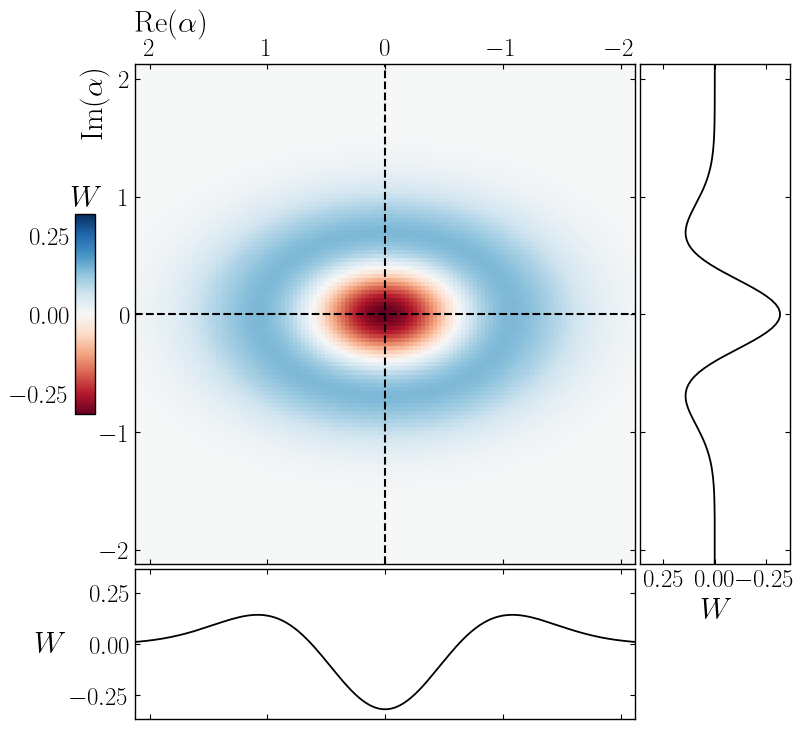

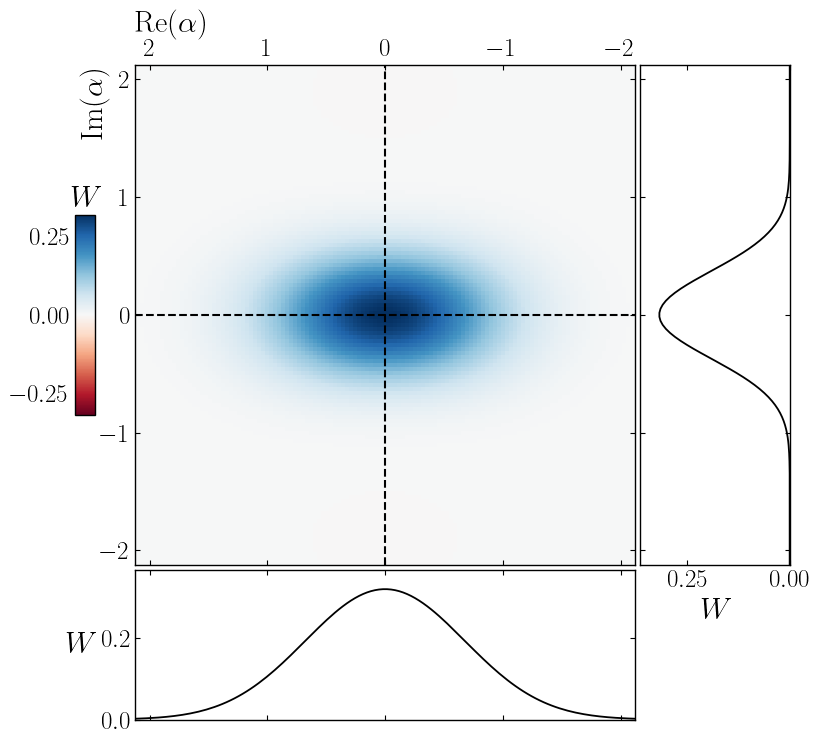


Even sector - CoM mode ($\lambda=1.22,\ r=-0.1830,\ \beta=-0.4136,\ \varepsilon=1.5,\ \Delta/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3171     0.1422
  Cat $+$                         -0.0000     0.3179
  ----------------------------------------------------


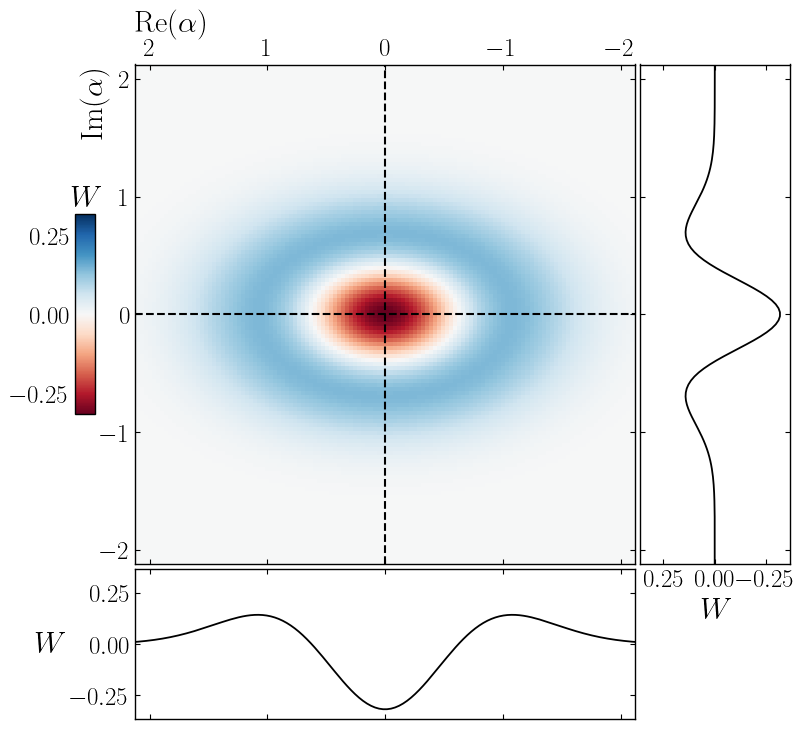

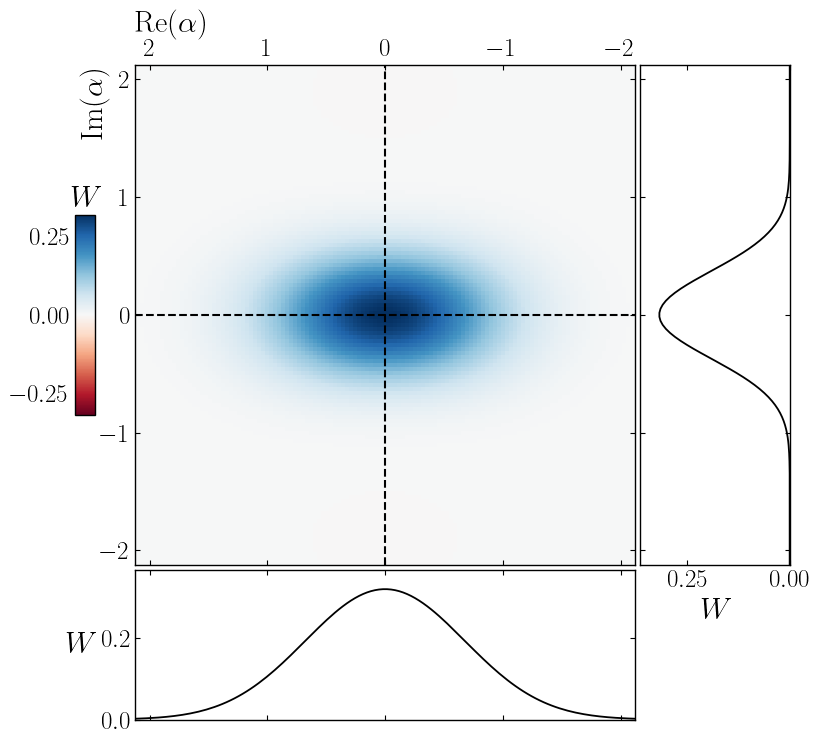

In [50]:
# ══════════════════════════════════════════════════════════════════
# CELL — PARAMETERS AT SWEET SPOT AND STATE CONSTRUCTION
# ══════════════════════════════════════════════════════════════════
t       = 1.0
Delta_e = 1.0
omega0  = 1.0
eps_val = 1.5
lam     = np.sqrt(eps_val/omega0)

E_o, x_o = minimize_odd(lam)
alpha, r = x_o

E_e, x_e = minimize_even(lam, Delta_e)
a1, a2, rp1, rp2 = x_e
r_e        = 0.5*(rp1 + rp2)
alpha_half = a2

print(f"eps_t = {eps_val - lam**2*omega0:.3e}  (should be ~0 at sweet spot)")
print(f"Odd sector:  alpha={alpha:.4f}  r={r:.4f}  E_o={E_o:.6f}")
print(f"Even sector:    a1={a1:.4f}  a2={a2:.4f}  r1={rp1:.4f}  r2={rp2:.4f}  E_e={E_e:.6f}")

# ─── β en el marco laboratorio (idéntico para ambos sectores) ────
beta_o = -lam/_S2 + alpha/2.0          # odd:  modo relativo
beta_e = -lam/_S2 + alpha_half         # even: modo CoM (recentrado)
print(f"\nbeta_o (odd) = {beta_o:.4f}   beta_e (even, centered) = {beta_e:.4f}  (should match)")

# ─── estados gato con normalización analítica ────────────────────
cat_o_minus = cat_state(beta_o, r,   sign=-1.0)
cat_o_plus  = cat_state(beta_o, r,   sign=+1.0)
cat_e_minus = cat_state(beta_e, r_e, sign=-1.0)
cat_e_plus  = cat_state(beta_e, r_e, sign=+1.0)

odd_states  = [cat_o_minus, cat_o_plus]
odd_titles  = [r"Cat $-$", r"Cat $+$"]

even_states = [cat_e_minus, cat_e_plus]
even_titles = [r"Cat $-$", r"Cat $+$"]

# ══════════════════════════════════════════════════════════════════
# CELL — graficación: odd (modo relativo) y even (modo CoM)
# ══════════════════════════════════════════════════════════════════

# ─── sector impar ────────────────────────────────────────────────
Ws_odd, cuts_odd_p0, cuts_odd_x0 = get_wigner_data(odd_states)
figs_odd = plot_all_wigner(
    Ws_odd, cuts_odd_p0, cuts_odd_x0, odd_titles,
    suptitle=rf"Odd sector - relative mode "
             rf"($\lambda={lam:.2f},\ r={r:.4f},\ \beta={beta_o:.4f},"
             rf"\ \varepsilon={eps_val},\ t/\omega_0={t/omega0}$)",
)

# ─── sector par ──────────────────────────────────────────────────
Ws_even, cuts_even_p0, cuts_even_x0 = get_wigner_data(even_states)
figs_even = plot_all_wigner(
    Ws_even, cuts_even_p0, cuts_even_x0, even_titles,
    suptitle=rf"Even sector - CoM mode "
             rf"($\lambda={lam:.2f},\ r={r_e:.4f},\ \beta={beta_e:.4f},"
             rf"\ \varepsilon={eps_val},\ \Delta/\omega_0={Delta_e/omega0}$)",
)

#### $t$ = 1.0, $\Delta$ = 1.0, $\varepsilon$ = 4.0, $\lambda$ = 2.0

eps_t = 0.000e+00  (should be ~0 at sweet spot)
Odd sector:  alpha=0.6718  r=-0.3363  E_o=-0.074911
Even sector:    a1=-2.1541  a2=0.0682  r1=-0.2546  r2=-0.0329  E_e=-0.147898

beta_o (odd) = -1.0783   beta_e (even, centered) = -1.3460  (should match)

Odd sector - relative mode ($\lambda=2.00,\ r=-0.3363,\ \beta=-1.0783,\ \varepsilon=4.0,\ t/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3165     0.1472
  Cat $+$                         -0.0325     0.3172
  ----------------------------------------------------


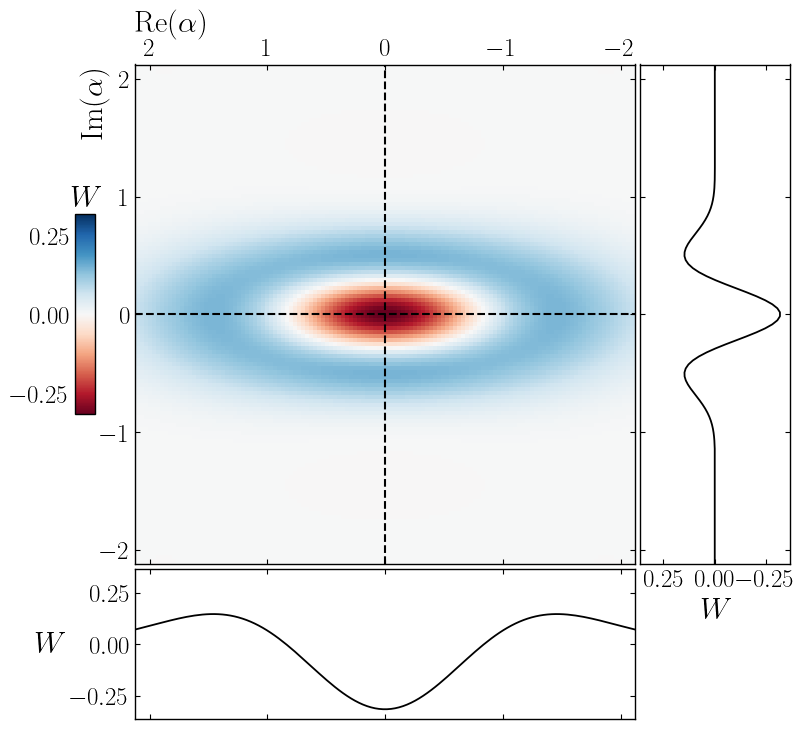

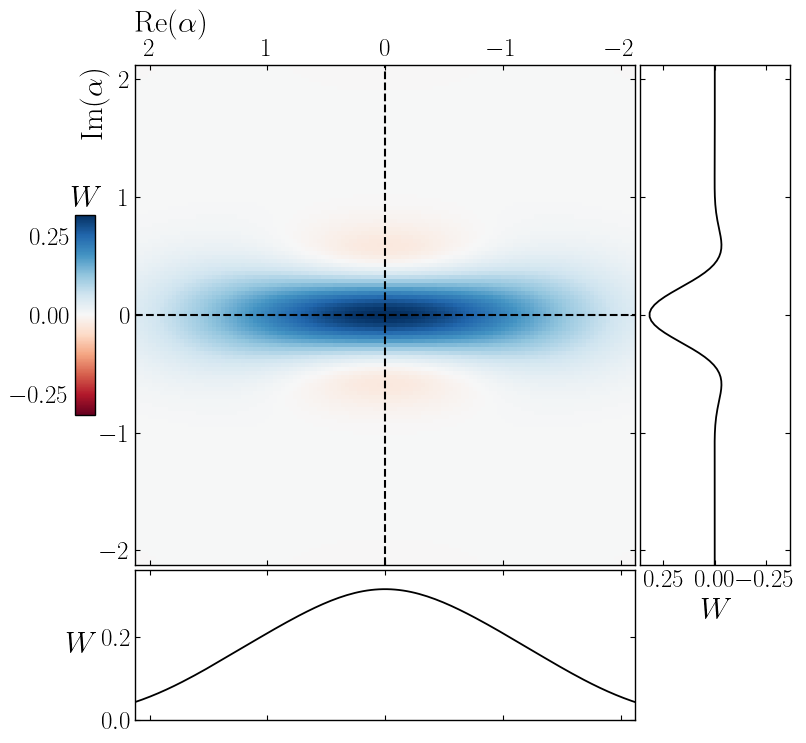


Even sector - CoM mode ($\lambda=2.00,\ r=-0.1438,\ \beta=-1.3460,\ \varepsilon=4.0,\ \Delta/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.3164     0.1692
  Cat $+$                         -0.1277     0.3167
  ----------------------------------------------------


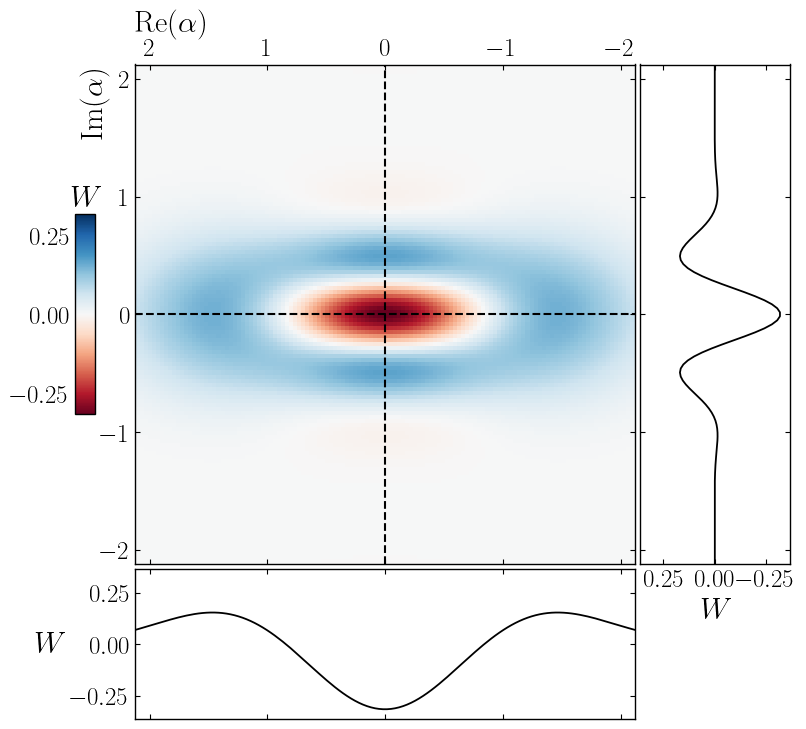

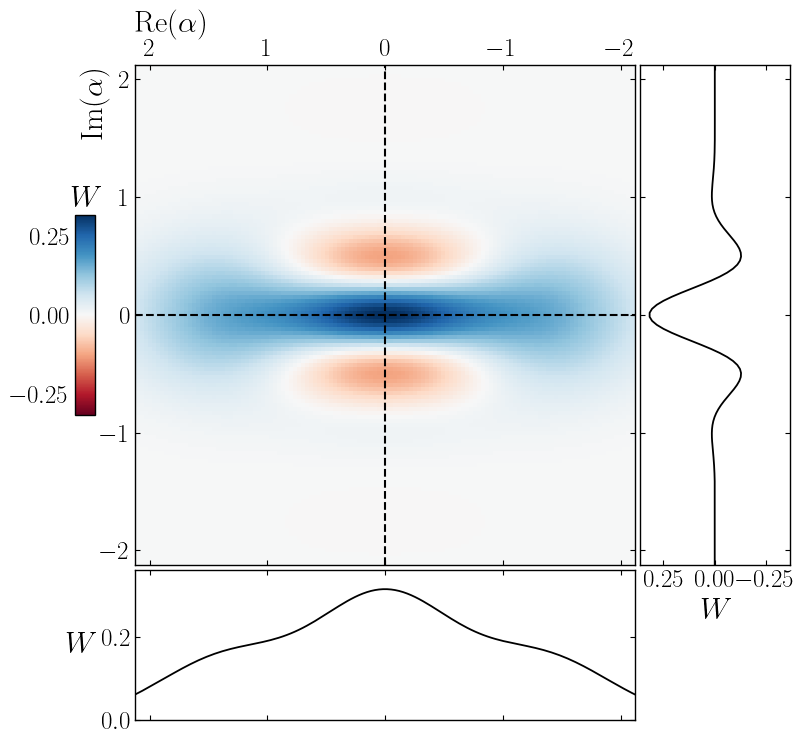

In [51]:
# ══════════════════════════════════════════════════════════════════
# CELL — PARAMETERS AT SWEET SPOT AND STATE CONSTRUCTION
# ══════════════════════════════════════════════════════════════════
t       = 1.0
Delta_e = 1.0
omega0  = 1.0
eps_val = 4.0
lam     = np.sqrt(eps_val/omega0)

E_o, x_o = minimize_odd(lam)
alpha, r = x_o

E_e, x_e = minimize_even(lam, Delta_e)
a1, a2, rp1, rp2 = x_e
r_e        = 0.5*(rp1 + rp2)
alpha_half = a2

print(f"eps_t = {eps_val - lam**2*omega0:.3e}  (should be ~0 at sweet spot)")
print(f"Odd sector:  alpha={alpha:.4f}  r={r:.4f}  E_o={E_o:.6f}")
print(f"Even sector:    a1={a1:.4f}  a2={a2:.4f}  r1={rp1:.4f}  r2={rp2:.4f}  E_e={E_e:.6f}")

# ─── β en el marco laboratorio (idéntico para ambos sectores) ────
beta_o = -lam/_S2 + alpha/2.0          # odd:  modo relativo
beta_e = -lam/_S2 + alpha_half         # even: modo CoM (recentrado)
print(f"\nbeta_o (odd) = {beta_o:.4f}   beta_e (even, centered) = {beta_e:.4f}  (should match)")

# ─── estados gato con normalización analítica ────────────────────
cat_o_minus = cat_state(beta_o, r,   sign=-1.0)
cat_o_plus  = cat_state(beta_o, r,   sign=+1.0)
cat_e_minus = cat_state(beta_e, r_e, sign=-1.0)
cat_e_plus  = cat_state(beta_e, r_e, sign=+1.0)

odd_states  = [cat_o_minus, cat_o_plus]
odd_titles  = [r"Cat $-$", r"Cat $+$"]

even_states = [cat_e_minus, cat_e_plus]
even_titles = [r"Cat $-$", r"Cat $+$"]

# ══════════════════════════════════════════════════════════════════
# CELL — graficación: odd (modo relativo) y even (modo CoM)
# ══════════════════════════════════════════════════════════════════

# ─── sector impar ────────────────────────────────────────────────
Ws_odd, cuts_odd_p0, cuts_odd_x0 = get_wigner_data(odd_states)
figs_odd = plot_all_wigner(
    Ws_odd, cuts_odd_p0, cuts_odd_x0, odd_titles,
    suptitle=rf"Odd sector - relative mode "
             rf"($\lambda={lam:.2f},\ r={r:.4f},\ \beta={beta_o:.4f},"
             rf"\ \varepsilon={eps_val},\ t/\omega_0={t/omega0}$)",
)

# ─── sector par ──────────────────────────────────────────────────
Ws_even, cuts_even_p0, cuts_even_x0 = get_wigner_data(even_states)
figs_even = plot_all_wigner(
    Ws_even, cuts_even_p0, cuts_even_x0, even_titles,
    suptitle=rf"Even sector - CoM mode "
             rf"($\lambda={lam:.2f},\ r={r_e:.4f},\ \beta={beta_e:.4f},"
             rf"\ \varepsilon={eps_val},\ \Delta/\omega_0={Delta_e/omega0}$)",
)

#### $t$ = 1.0, $\Delta$ = 1.0, $\varepsilon$ = 9.0, $\lambda$ = 3.0

eps_t = 0.000e+00  (should be ~0 at sweet spot)
Odd sector:  alpha=0.0000  r=0.0000  E_o=-0.000000
Even sector:    a1=-12.6479  a2=0.0005  r1=-0.0063  r2=-0.0000  E_e=-0.006211

beta_o (odd) = -6.3640   beta_e (even, centered) = -6.3635  (should match)

Odd sector - relative mode ($\lambda=9.00,\ r=0.0000,\ \beta=-6.3640,\ \varepsilon=81.0,\ t/\omega_0=1.0$)
  ----------------------------------------------------
  estado                            W_min      W_max
  ----------------------------------------------------
  Cat $-$                         -0.6231     0.5906
  Cat $+$                         -0.0004     0.0004
  ----------------------------------------------------


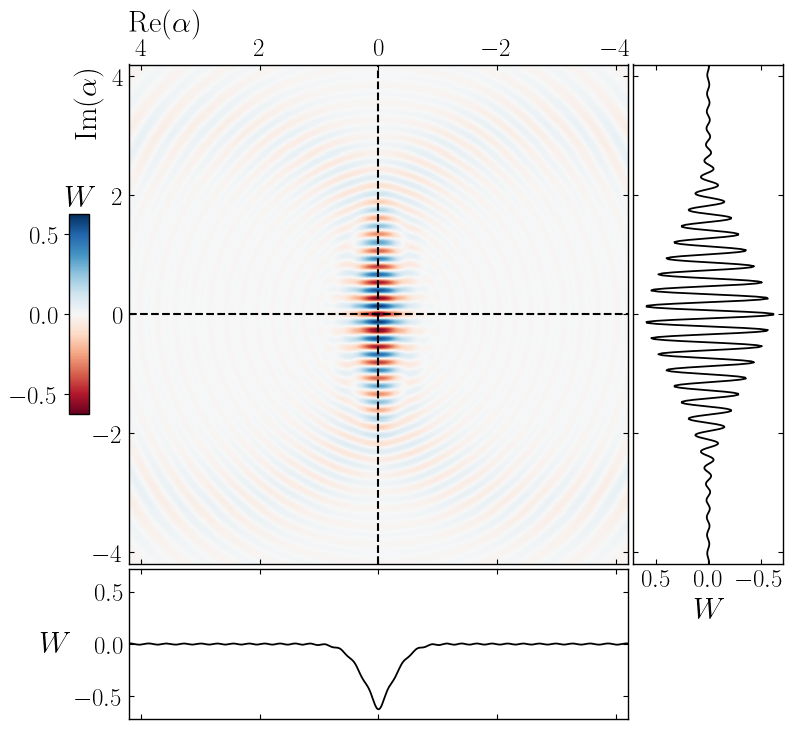

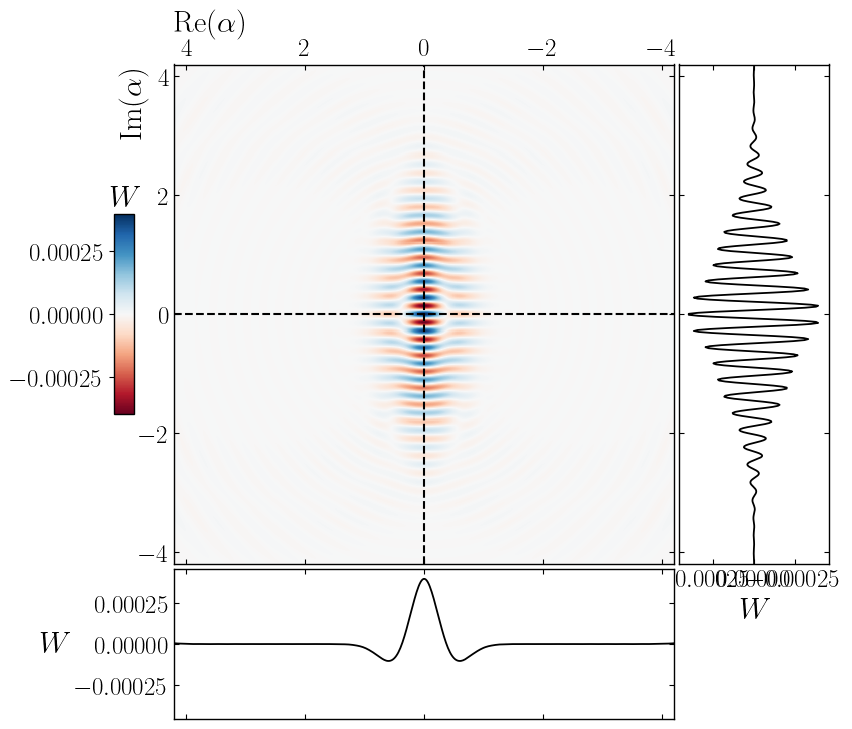

In [12]:
# ══════════════════════════════════════════════════════════════════
# CELL — PARAMETERS AT SWEET SPOT AND STATE CONSTRUCTION
# ══════════════════════════════════════════════════════════════════
t       = 1.0
Delta_e = 1.0
omega0  = 1.0
eps_val = 9.0**2
lam     = np.sqrt(eps_val/omega0)

E_o, x_o = minimize_odd(lam)
alpha, r = x_o

E_e, x_e = minimize_even(lam, Delta_e)
a1, a2, rp1, rp2 = x_e
r_e        = 0.5*(rp1 + rp2)
alpha_half = a2

print(f"eps_t = {eps_val - lam**2*omega0:.3e}  (should be ~0 at sweet spot)")
print(f"Odd sector:  alpha={alpha:.4f}  r={r:.4f}  E_o={E_o:.6f}")
print(f"Even sector:    a1={a1:.4f}  a2={a2:.4f}  r1={rp1:.4f}  r2={rp2:.4f}  E_e={E_e:.6f}")

# ─── β en el marco laboratorio (idéntico para ambos sectores) ────
beta_o = -lam/_S2 + alpha/2.0          # odd:  modo relativo
beta_e = -lam/_S2 + alpha_half         # even: modo CoM (recentrado)
print(f"\nbeta_o (odd) = {beta_o:.4f}   beta_e (even, centered) = {beta_e:.4f}  (should match)")

# ─── estados gato con normalización analítica ────────────────────
cat_o_minus = cat_state(beta_o, r,   sign=-1.0)
cat_o_plus  = cat_state(beta_o, r,   sign=+1.0)
cat_e_minus = cat_state(beta_e, r_e, sign=-1.0)
cat_e_plus  = cat_state(beta_e, r_e, sign=+1.0)

odd_states  = [cat_o_minus, cat_o_plus]
odd_titles  = [r"Cat $-$", r"Cat $+$"]

even_states = [cat_e_minus, cat_e_plus]
even_titles = [r"Cat $-$", r"Cat $+$"]

# ══════════════════════════════════════════════════════════════════
# CELL — graficación: odd (modo relativo) y even (modo CoM)
# ══════════════════════════════════════════════════════════════════

# ─── sector impar ────────────────────────────────────────────────
Ws_odd, cuts_odd_p0, cuts_odd_x0 = get_wigner_data(odd_states)
figs_odd = plot_all_wigner(
    Ws_odd, cuts_odd_p0, cuts_odd_x0, odd_titles,
    suptitle=rf"Odd sector - relative mode "
             rf"($\lambda={lam:.2f},\ r={r:.4f},\ \beta={beta_o:.4f},"
             rf"\ \varepsilon={eps_val},\ t/\omega_0={t/omega0}$)", axis_lim=(-4.2, 4.2), labeleven=True
)


In [ ]:
import matplotlib.ticker as ticker
from matplotlib.colors import TwoSlopeNorm
from matplotlib.cm import ScalarMappable


def _lo_hi(cut, m, tol):
    hp = np.max(cut) >  tol
    hn = np.min(cut) < -tol
    if hp and hn: return (-m, m)
    if hp:        return (0.0, m)
    if hn:        return (-m, 0.0)
    return (-m, m)

def plot_wigner_stack(Ws, cuts_p0, cuts_x0,
                      xvec=xvec, pvec=pvec, cmap='RdBu',
                      axis_lim=(-4.2, 4.2), ylim=(-2.1, 2.1),
                      data_aspect=0.5, cut_margin=1.15, panel_frac=0.30,
                      tol=1e-3, labeleven=True, figsize=(6.0, 5.5), suptitle=None):
    re = xvec/np.sqrt(2); im = pvec/np.sqrt(2); n = len(Ws)
    X = axis_lim[1]-axis_lim[0]; Y = ylim[1]-ylim[0]; Fw, Fh = figsize

    # norma COMÚN -> una sola colorbar válida para ambos mapas
    vmax = max(np.max(np.abs(W)) for W in Ws)
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

    fig = plt.figure(figsize=figsize)

    # ── geometría en fracción de figura ──────────────────────────
    wm = 0.62; hm = data_aspect*wm*(Fw/Fh)*(Y/X)   # alto que fija el aspecto de datos
    wr = panel_frac*wm - 0.01; hb = panel_frac*hm + 0.01
    padr, padb = 0.008, 0.014
    Lm, Tm     = 0.10, 0.12       # margen izquierdo / superior
    gap_v      = 0.025            # separación vertical entre los dos grupos
    gap_cb, hcb = 0.055, 0.022    # separación y alto de la colorbar horizontal
    Hg = hm + padb + hb           # alto de un grupo (main + below)

    axes = []
    for i in range(n):
        y_main = (1.0 - Tm - hm) - i*(Hg + gap_v)   # apilado de arriba hacia abajo
        ax_main  = fig.add_axes([Lm,         y_main,         wm, hm])
        ax_below = fig.add_axes([Lm,         y_main-padb-hb, wm, hb])
        ax_right = fig.add_axes([Lm+wm+padr, y_main,         wr, hm])
        axes.append((ax_main, ax_below, ax_right))

        # ── mapa central ──
        ax_main.pcolormesh(re, im, Ws[i], cmap=cmap, norm=norm, shading='auto', zorder=0)
        ax_main.axhline(0, color='k', ls='--', lw=1.3, zorder=1)
        ax_main.axvline(0, color='k', ls='--', lw=1.3, zorder=1)
        ax_main.set_xlim(axis_lim[1], axis_lim[0])
        ax_main.set_ylim(*ylim)
        ax_main.yaxis.set_major_locator(ticker.MultipleLocator(2 if labeleven else 1))
        ax_main.tick_params(axis='both', direction='in', length=3.5,
                    top=True, bottom=True, left=True, right=True)
        ax_main.tick_params(axis='x', labelbottom=False, labeltop=(i==0))
        # Forzar zorder alto en los ticks y spines para que no los tape pcolormesh
        for spine in ax_main.spines.values():
            spine.set_zorder(5)
        ax_main.xaxis.set_tick_params(zorder=5)
        ax_main.yaxis.set_tick_params(zorder=5)
        ax_main.xaxis.set_label_position('top')
        if i == 0:                                   # ← Re(α) solo en la de arriba
            ax_main.set_xlabel(r'$\mathrm{Re}(\alpha)$', labelpad=6)
        ax_main.set_ylabel(r'$\mathrm{Im}(\alpha)$', labelpad=4)
        # etiqueta de panel (a),(b),... en la esquina superior izquierda
        ax_main.text(0.015, 0.94, f'({chr(97+i)})', transform=ax_main.transAxes,
                     ha='left', va='top',
                     bbox=dict(boxstyle='round,pad=0.12', fc='white', ec='none', alpha=0.6))

        m = cut_margin * max(np.max(np.abs(cuts_p0[i])), np.max(np.abs(cuts_x0[i])))

        # ── corte inferior: W(Re, Im=0) ──
        ax_below.plot(re, cuts_p0[i], 'k', lw=1.2)
        ax_below.set_xlim(axis_lim[1], axis_lim[0])
        lo, hi = _lo_hi(cuts_p0[i], m, tol); ax_below.set_ylim(lo, hi)
        ax_below.set_ylabel(r'$W$', rotation=0, labelpad=14, va='center')
        ax_below.tick_params(axis='x', labelbottom=False, direction='in', top=True, bottom=True, size=3.5)
        ax_below.tick_params(axis='y', direction='in', left=True, right=True, size=3.5)

        # ── corte derecho: W(Re=0, Im) ──  (eje x invertido: + izq, − der)
        ax_right.plot(cuts_x0[i], im, 'k', lw=1.2)
        ax_right.set_ylim(*ylim)
        lo, hi = _lo_hi(cuts_x0[i], m, tol); ax_right.set_xlim(hi, lo)
        ax_right.set_xlabel(r'$W$')
        ax_right.tick_params(axis='y', labelleft=False, direction='in', left=True, right=True, size=3.5)
        ax_right.tick_params(axis='x', direction='in', top=True, bottom=True, size=3.5)

    # ── colorbar HORIZONTAL abajo, alineada con el ancho de los mapas ──
    y_last_below = (1.0 - Tm - hm) - (n-1)*(Hg + gap_v) - padb - hb
    y_cb = y_last_below - gap_cb - hcb
    cax = fig.add_axes([Lm, y_cb, wm, hcb])
    sm = ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    cax.xaxis.set_ticks_position('bottom'); cax.xaxis.set_label_position('bottom')
    # W a la derecha de la colorbar (en vez de cbar.set_label, que la pone debajo)
    cax.text(1.035, 0.5, r'$W$', transform=cax.transAxes, ha='left', va='center')
    cax.xaxis.set_ticks_position('bottom'); cax.xaxis.set_label_position('bottom')

    if suptitle:
        fig.suptitle(suptitle, y=1.0)

    plt.savefig(
    'Resultados/Wigner_odd_sector.png',
    bbox_inches='tight',
    transparent=False,
    dpi=300)
    return fig, axes

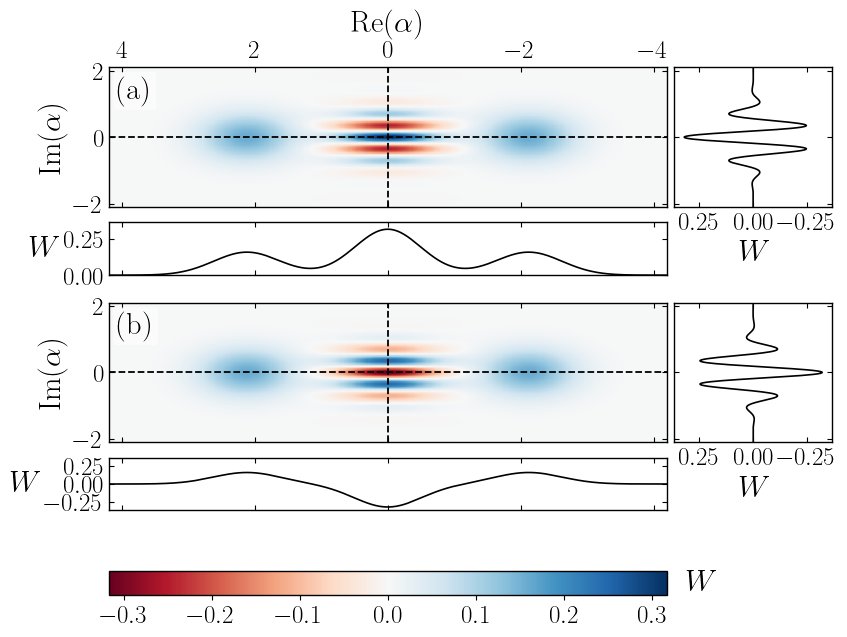

In [54]:
Ws_odd, cuts_odd_p0, cuts_odd_x0 = get_wigner_data(odd_states)

fig, axes = plot_wigner_stack(
    [Ws_odd[1], Ws_odd[0]],            # [cat_plus, cat_minus]
    [cuts_odd_p0[1], cuts_odd_p0[0]],
    [cuts_odd_x0[1], cuts_odd_x0[0]],
    axis_lim=(-4.2, 4.2), ylim=(-2.1, 2.1), labeleven=True, figsize=(9.0, 11.0),
)

#### Cat probabilities

In [35]:
# ══════════════════════════════════════════════════════════════════
# CELDA — probabilidades de medida p_± a lo largo del sweet spot
#   p_+ = ½(1 − e^{-2β²e^{2r}}),   p_- = ½(1 + e^{-2β²e^{2r}})
#   En cada λ se impone ε = λ²ω0  (⇒ ε̃ = 0, sweet spot).
# ══════════════════════════════════════════════════════════════════
t       = 1.0
Delta_e = 0.5
omega0  = 1.0
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 2.6, 300)

p_plus_o  = np.empty_like(lam_arr)   # sector impar
p_minus_o = np.empty_like(lam_arr)
p_plus_e  = np.empty_like(lam_arr)   # sector par
p_minus_e = np.empty_like(lam_arr)

warm_o = warm_e = None
for k, lam in enumerate(tqdm(lam_arr, desc="p_± sweet spot")):
    eps_val = lam**2 * omega0          # ← sweet spot: ε̃ = ε − λ²ω0 = 0

    # ----- sector impar -----
    _, x_o = minimize_odd(lam, x_warm=warm_o); warm_o = x_o
    alpha_o, r_o = x_o
    beta_o = -lam/_S2 + alpha_o/2.0
    ov_o = np.exp(-2.0 * beta_o**2 * np.exp(2.0*r_o))
    p_plus_o[k]  = 0.5*(1.0 - ov_o)
    p_minus_o[k] = 0.5*(1.0 + ov_o)

    # ----- sector par -----
    _, x_e = minimize_even(lam, Delta_e, x_warm=warm_e); warm_e = x_e
    a1, a2, rp1, rp2 = x_e
    r_e    = 0.5*(rp1 + rp2)
    beta_e = -lam/_S2 + a2
    ov_e = np.exp(-2.0 * beta_e**2 * np.exp(2.0*r_e))
    p_plus_e[k]  = 0.5*(1.0 - ov_e)
    p_minus_e[k] = 0.5*(1.0 + ov_e)

print("Probabilidades listas.")

p_± sweet spot: 100%|██████████| 300/300 [00:04<00:00, 65.47it/s]

Probabilidades listas.


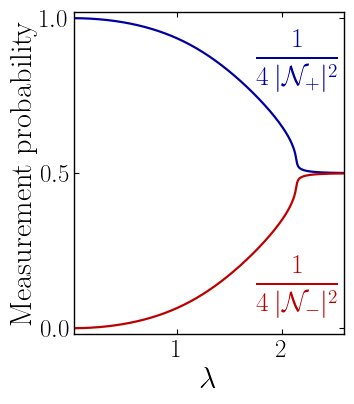

In [36]:
import matplotlib.ticker as ticker

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → p_+
C_MINUS = plt.cm.seismic(0.12)    # azul  → p_-
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig, ax = plt.subplots(figsize=(4.0, 4.5))

ax.plot(lam_arr, p_minus_o, '-', color=C_MINUS, lw=1.6)
ax.plot(lam_arr, p_plus_o,  '-', color=C_PLUS,  lw=1.6)


ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'Measurement probability', labelpad=2)
ax.set_xlim(lam_arr[0], lam_arr[-1])
ax.set_ylim(-0.02, 1.02)
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

# ── ticks del eje y solo en 0.0, 0.5, 1.0 ────────────────────────
ax.yaxis.set_major_locator(ticker.FixedLocator([0.0, 0.5, 1.0]))

# ── etiquetas como anotación junto a cada curva (estilo paper) ───
ax.text(0.975, 0.85, r'$\dfrac{1}{4\,|\mathcal{N}_+|^{2}}$',
        transform=ax.transAxes, color=C_MINUS, ha='right', va='center', fontsize=20)
ax.text(0.975, 0.15, r'$\dfrac{1}{4\,|\mathcal{N}_-|^{2}}$',
        transform=ax.transAxes, color=C_PLUS,  ha='right', va='center', fontsize=20)

plt.tight_layout()
plt.savefig(f'Resultados/Probabilidades_medida_sweet_spot_Delta{Delta_e}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

In [ ]:
# ══════════════════════════════════════════════════════════════════
# CELDA — |N_±|² del gato a lo largo del sweet spot
#   |N_±|² = [ 2 ( 1 ± e^{-2β²e^{2r}} ) ]^{-1}        (sector impar)
# ══════════════════════════════════════════════════════════════════

t       = 1.0
omega0  = 1.0
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 3.0, 300)

N2_plus  = np.empty_like(lam_arr)
N2_minus = np.empty_like(lam_arr)

warm_o = None
for k, lam in enumerate(tqdm(lam_arr, desc="|N_±|² sweet spot")):
    eps_val = lam**2 * omega0                  # sweet spot: ε̃ = 0
    _, x_o = minimize_odd(lam, x_warm=warm_o); warm_o = x_o
    alpha_o, r_o = x_o
    beta_o = -lam/_S2 + alpha_o/2.0
    s = np.exp(-2.0 * beta_o**2 * np.exp(2.0*r_o))   # solape ∈ (0,1]
    N2_plus[k]  = 1.0/(2.0*(1.0 + s))
    N2_minus[k] = 1.0/(2.0*(1.0 - s))

print("Factores |N|² listos.")
print(f"  |N_+|² : min={N2_plus.min():.4f}  max={N2_plus.max():.4f}")
print(f"  |N_-|² : min={N2_minus.min():.4f}  max={N2_minus.max():.4f}  "
      f"(diverge cuando s→1, es decir λ→0)")

|N_±|² sweet spot: 100%|██████████| 300/300 [00:03<00:00, 98.92it/s] 

Factores |N|² listos.
  |N_+|² : min=0.2500  max=0.4999
  |N_-|² : min=0.5001  max=44999.2500  (diverge cuando s→1, es decir λ→0)


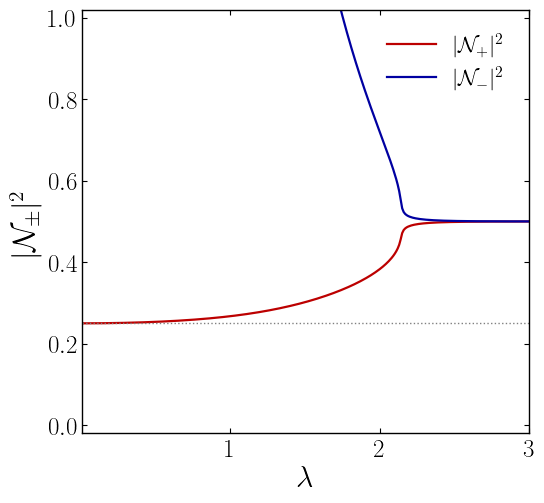

In [84]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — |N_±|² vs λ
# ══════════════════════════════════════════════════════════════════
C_PLUS  = plt.cm.seismic(0.88)    # rojo  → |N_+|²
C_MINUS = plt.cm.seismic(0.12)    # azul  → |N_-|²
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig, ax = plt.subplots(figsize=(6.0, 5.5))

ax.plot(lam_arr, N2_plus,  '-', color=C_PLUS,  lw=1.6, label=r'$|\mathcal{N}_+|^{2}$')
ax.plot(lam_arr, N2_minus, '-', color=C_MINUS, lw=1.6, label=r'$|\mathcal{N}_-|^{2}$')

ax.axhline(0.25, color='gray', ls=':', lw=1.0)   # límite común |N|²→1/4 (s→0)

ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$|\mathcal{N}_{\pm}|^{2}$')
ax.set_xlim(lam_arr[0], lam_arr[-1])
ax.set_ylim(-0.02, 1.02)
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
          loc='upper right', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

plt.tight_layout()
plt.savefig('Resultados/Normalizacion2_gato_sweet_spot.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

In [37]:
# ══════════════════════════════════════════════════════════════════
# CELDA — correlación cruzada ⟨X₁X₂⟩_o^(±) a lo largo del sweet spot
#   ⟨X₁X₂⟩_o^(±) = ¼ − ½⟨X²⟩_cat^(±),   con
#   ⟨X²⟩_cat^(±) = ½e^{-2r} + 2β²/(1 ± e^{-2β²e^{2r}})
#   En cada λ se impone ε = λ²ω0  (⇒ ε̃ = 0, sweet spot).
# ══════════════════════════════════════════════════════════════════
t       = 1.0
omega0  = 1.0
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 2.6, 300)

X1X2_plus_o  = np.empty_like(lam_arr)   # rama +
X1X2_minus_o = np.empty_like(lam_arr)   # rama −

warm_o = None
for k, lam in enumerate(tqdm(lam_arr, desc="⟨X₁X₂⟩ sweet spot")):
    eps_val = lam**2 * omega0          # sweet spot: ε̃ = 0

    _, x_o = minimize_odd(lam, x_warm=warm_o); warm_o = x_o
    alpha_o, r_o = x_o
    beta_o = -lam/_S2 + alpha_o/2.0

    s = np.exp(-2.0 * beta_o**2 * np.exp(2.0*r_o))       # solape
    half_e2r = 0.5*np.exp(-2.0*r_o)

    X2_plus  = half_e2r + 2.0*beta_o**2/(1.0 + s)        # ⟨X²⟩_cat^(+)
    X2_minus = half_e2r + 2.0*beta_o**2/(1.0 - s)        # ⟨X²⟩_cat^(−)

    X1X2_plus_o[k]  = 0.25 - 0.5*X2_plus                 # ⟨X₁X₂⟩_o^(+)
    X1X2_minus_o[k] = 0.25 - 0.5*X2_minus                # ⟨X₁X₂⟩_o^(−)

print("Correlación cruzada lista (sector impar, ramas ±).")

⟨X₁X₂⟩ sweet spot:   6%|▌         | 18/300 [00:00<00:01, 174.36it/s]

⟨X₁X₂⟩ sweet spot: 100%|██████████| 300/300 [00:01<00:00, 201.33it/s]

Correlación cruzada lista (sector impar, ramas ±).


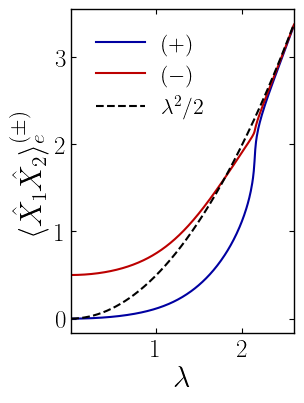

In [38]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — ⟨X₁X₂⟩_o^(±) vs λ
# ══════════════════════════════════════════════════════════════════
C_PLUS  = plt.cm.seismic(0.12)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.88)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

tend =  lam_arr**2 * 1/2
fig, ax = plt.subplots(figsize=(3.5, 4.5))

ax.plot(lam_arr, -X1X2_plus_o,  '-', color=C_PLUS,  lw=1.5, label=r'$(+)$')
ax.plot(lam_arr, -X1X2_minus_o, '-', color=C_MINUS, lw=1.5, label=r'$(-)$')
ax.plot(lam_arr, tend, '--', color='k', lw=1.5, label=r'$\lambda^2/2$')
ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle_e^{(\pm)}$')
ax.set_xlim(lam_arr[0], lam_arr[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

ax.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='upper left', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

plt.tight_layout()
plt.savefig('Resultados/Correlacion_cruzada_sweet_spot.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

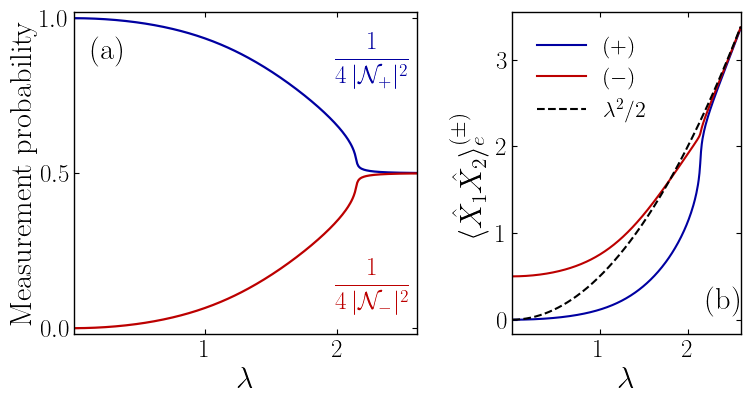

In [39]:
import matplotlib.ticker as ticker

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig, (axa, axb) = plt.subplots(1, 2, figsize=(8.0, 4.5), gridspec_kw={'width_ratios': [6, 4]})

# ═══════════════════════════════════════════════════════════════
# Panel (a): probabilidades de medida
# ═══════════════════════════════════════════════════════════════
axa.plot(lam_arr, p_minus_o, '-', color=C_MINUS, lw=1.6)
axa.plot(lam_arr, p_plus_o,  '-', color=C_PLUS,  lw=1.6)

axa.set_xlabel(r'$\lambda$')
axa.set_ylabel(r'Measurement probability', labelpad=2)
axa.set_xlim(lam_arr[0], lam_arr[-1])
axa.set_ylim(-0.02, 1.02)
axa.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)
axa.yaxis.set_major_locator(ticker.FixedLocator([0.0, 0.5, 1.0]))

axa.text(0.975, 0.85, r'$\dfrac{1}{4\,|\mathcal{N}_+|^{2}}$',
         transform=axa.transAxes, color=C_MINUS, ha='right', va='center', fontsize=18)
axa.text(0.975, 0.15, r'$\dfrac{1}{4\,|\mathcal{N}_-|^{2}}$',
         transform=axa.transAxes, color=C_PLUS,  ha='right', va='center', fontsize=18)

axa.text(0.05, 0.925, '(a)', transform=axa.transAxes, ha='left', va='top', fontweight='bold')

# ═══════════════════════════════════════════════════════════════
# Panel (b): correlación cruzada ⟨X₁X₂⟩_e^(±)
# ═══════════════════════════════════════════════════════════════
tend = lam_arr**2 / 2.0

axb.plot(lam_arr, -X1X2_plus_o,  '-',  color=C_MINUS,  lw=1.5, label=r'$(+)$')
axb.plot(lam_arr, -X1X2_minus_o, '-',  color=C_PLUS, lw=1.5, label=r'$(-)$')
axb.plot(lam_arr, tend,          '--', color='k',     lw=1.5, label=r'$\lambda^2/2$')

axb.set_xlabel(r'$\lambda$')
axb.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle_e^{(\pm)}$', labelpad=5)
axb.set_xlim(lam_arr[0], lam_arr[-1])
axb.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

axb.legend(frameon=True, edgecolor='black', framealpha=0.0, fancybox=False,
           loc='upper left', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

axb.text(0.85, 0.15, '(b)', transform=axb.transAxes, ha='left', va='top', fontweight='bold')

plt.tight_layout()
plt.savefig(f'Resultados/Paneles_prob_correlacion_sweet_spot_t{t}.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

In [248]:
# ══════════════════════════════════════════════════════════════════
# CELDA — correlación cruzada ⟨X₁X₂⟩_e^(±) en el sweet spot, varios t/ω0
#   ⟨X₁X₂⟩_o^(±) = ¼ − ½⟨X²⟩_cat^(±),   ⟨X₁X₂⟩_e = −⟨X₁X₂⟩_o
#   ⟨X²⟩_cat^(±) = ½e^{-2r} + 2β²/(1 ± e^{-2β²e^{2r}})
# ══════════════════════════════════════════════════════════════════
omega0  = 1.0
_S2     = np.sqrt(2.0)

lam_arr = np.linspace(0.01, 2.6, 300)
tv_list = [0.5, 1.0, 1.5]                       # t/ω0
LS = {0.5: '-', 1.0: '--', 1.5: ':'}            # estilo de línea por t

# almacenamiento: X1X2[tv]['+'/'-']  (ya con signo del sector PAR, = −impar)
X1X2 = {tv: {'+': np.empty_like(lam_arr), '-': np.empty_like(lam_arr)} for tv in tv_list}

for tv in tv_list:
    t = tv
    warm_o = None
    for k, lam in enumerate(tqdm(lam_arr, desc=f"⟨X₁X₂⟩ t/ω0={tv}")):
        eps_val = lam**2 * omega0                # sweet spot: ε̃ = 0
        _, x_o = minimize_odd(lam, x_warm=warm_o); warm_o = x_o
        alpha_o, r_o = x_o
        beta_o = -lam/_S2 + alpha_o/2.0

        s = np.exp(-2.0 * beta_o**2 * np.exp(2.0*r_o))
        half_e2r = 0.5*np.exp(-2.0*r_o)
        X2_plus  = half_e2r + 2.0*beta_o**2/(1.0 + s)
        X2_minus = half_e2r + 2.0*beta_o**2/(1.0 - s)

        # sector PAR = −(sector impar)
        X1X2[tv]['+'][k] = -(0.25 - 0.5*X2_plus)
        X1X2[tv]['-'][k] = -(0.25 - 0.5*X2_minus)

print("Correlación cruzada lista (sector par, ramas ±, varios t/ω0).")

⟨X₁X₂⟩ t/ω0=0.5:   0%|          | 0/300 [00:00<?, ?it/s]

⟨X₁X₂⟩ t/ω0=1.5: 100%|██████████| 300/300 [00:01<00:00, 241.73it/s]

Correlación cruzada lista (sector par, ramas ±, varios t/ω0).


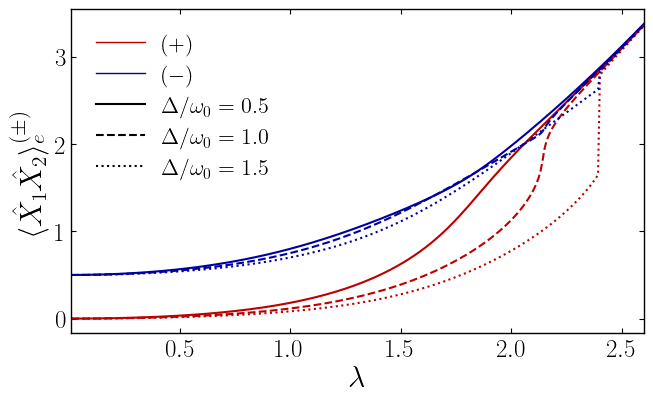

In [249]:
# ══════════════════════════════════════════════════════════════════
# CELDA DE GRAFICACIÓN — ⟨X₁X₂⟩_e^(±) vs λ  para varios t/ω0
# ══════════════════════════════════════════════════════════════════
import matplotlib.lines as mlines

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

tend = lam_arr**2 / 2.0           # línea de tendencia λ²/2

fig, ax = plt.subplots(figsize=(7.0, 4.5))

for tv in tv_list:
    ax.plot(lam_arr, X1X2[tv]['+'], LS[tv], color=C_PLUS,  lw=1.5)
    ax.plot(lam_arr, X1X2[tv]['-'], LS[tv], color=C_MINUS, lw=1.5)


ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle_e^{(\pm)}$')
#ax.set_xlim(1.8, 2.5)
#ax.set_ylim(0.4, 3.2)
ax.set_xlim(lam_arr[0], lam_arr[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

# leyenda: color = rama del gato, estilo de línea = t/ω0
handles = [
    mlines.Line2D([], [], color=C_PLUS,  lw=1.0, label=r'$(+)$'),
    mlines.Line2D([], [], color=C_MINUS, lw=1.0, label=r'$(-)$'),
    mlines.Line2D([], [], color='k', lw=1.5, ls=LS[0.5], label=r'$\Delta/\omega_0=0.5$'),
    mlines.Line2D([], [], color='k', lw=1.5, ls=LS[1.0], label=r'$\Delta/\omega_0=1.0$'),
    mlines.Line2D([], [], color='k', lw=1.5, ls=LS[1.5], label=r'$\Delta/\omega_0=1.5$'),
]
ax.legend(handles=handles, frameon=True, edgecolor='black', framealpha=0.0, fancybox=False, loc='upper left', borderpad=0.6, handlelength=2.2, labelspacing=0.4)

plt.tight_layout()
plt.savefig('Resultados/Correlacion_cruzada_sweet_spot2.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

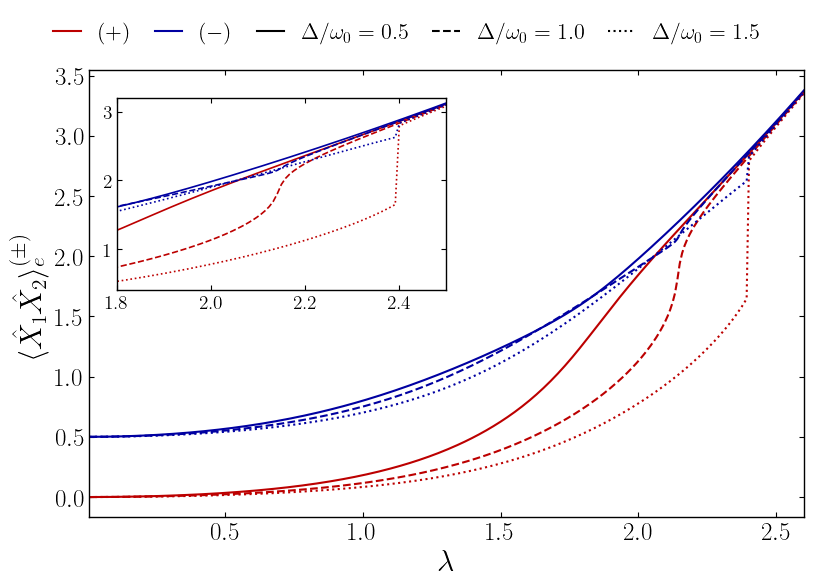

In [267]:
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

C_PLUS  = plt.cm.seismic(0.88)    # rojo  → rama +
C_MINUS = plt.cm.seismic(0.12)    # azul  → rama −
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

tend = lam_arr**2 / 2.0           # línea de tendencia λ²/2

fig, ax = plt.subplots(figsize=(8.6, 6.0))

# ── curvas principales ───────────────────────────────────────────
for tv in tv_list:
    ax.plot(lam_arr, X1X2[tv]['+'], LS[tv], color=C_PLUS,  lw=1.5)
    ax.plot(lam_arr, X1X2[tv]['-'], LS[tv], color=C_MINUS, lw=1.5)

ax.set_xlabel(r'$\lambda$')
ax.set_ylabel(r'$\langle\hat{X}_1\hat{X}_2\rangle_e^{(\pm)}$')
ax.set_xlim(lam_arr[0], lam_arr[-1])
ax.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True)

# ── inset de zoom (esquina superior izquierda) ───────────────────
axins = inset_axes(ax, width="46%", height="43%", loc='upper left', borderpad=1.25)
for tv in tv_list:
    axins.plot(lam_arr, X1X2[tv]['+'], LS[tv], color=C_PLUS,  lw=1.2)
    axins.plot(lam_arr, X1X2[tv]['-'], LS[tv], color=C_MINUS, lw=1.2)
axins.set_xlim(1.8, 2.5)
axins.set_ylim(0.4, 3.2)
axins.tick_params(axis='both', direction='in', bottom=True, top=True, left=True, right=True, labelsize=14)


# ── leyenda arriba, una sola fila ────────────────────────────────
handles = [
    mlines.Line2D([], [], color=C_PLUS,  lw=1.5, label=r'$(+)$'),
    mlines.Line2D([], [], color=C_MINUS, lw=1.5, label=r'$(-)$'),
    mlines.Line2D([], [], color='k', lw=1.5, ls=LS[0.5], label=r'$\Delta/\omega_0=0.5$'),
    mlines.Line2D([], [], color='k', lw=1.5, ls=LS[1.0], label=r'$\Delta/\omega_0=1.0$'),
    mlines.Line2D([], [], color='k', lw=1.5, ls=LS[1.5], label=r'$\Delta/\omega_0=1.5$'),
]

fig.legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, 1.02),
           ncol=len(handles), frameon=False, borderpad=0.6,
           handlelength=1.25, labelspacing=0.4, columnspacing=1.0)

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.savefig('Resultados/Correlacion_cruzada_sweet_spot2.png',
            bbox_inches='tight', transparent=False, dpi=300)
plt.show()

### Test

In [4]:
from scipy.optimize import minimize, differential_evolution, dual_annealing

# ─── parámetros del sistema (re-declarados) ──────────────────────
omega0  = 1.0
eps_val = 0.25
_S2     = np.sqrt(2.0)
t       = 1.5          # acoplamiento túnel; transición pronunciada a este valor
M       = 70           # truncación de Fock (modo relativo)

lam_scan = np.linspace(1.5, 2.9, 45)   # ventana alrededor de la transición

# ─── energía CERRADA del sector impar (sin diagonalizar) ─────────
def E_odd(x, lam):
    a, r = x
    return (eps_val - lam**2*omega0
            + omega0*(0.25*a*a + np.sinh(r)**2)
            - t*np.exp(-0.5*(_S2*lam - a)**2 * np.exp(2.0*r)))

# ─── estado EXACTO del sector impar (bloque relativo reducido) ───
def psi_exact_odd(lam):
    eps_t = eps_val - lam**2*omega0
    Dt = disp_matrix(M, _S2*lam); n1 = M+1
    diag = eps_t*np.eye(n1) + np.diag(np.arange(n1)*omega0)
    H = np.zeros((2*n1, 2*n1)); H[:n1,:n1]=diag; H[n1:,n1:]=diag
    H[:n1,n1:]=t*Dt; H[n1:,:n1]=t*Dt.T
    return np.linalg.eigh(H)[1][:, 0]

# ─── fidelidad global del ansatz (pesos (1,−1)/√2 fijos por simetría) ─
def fidelity_odd(x, pe):
    a, r = x
    sv = squeezed_vacuum(M, r)
    pv = np.concatenate([disp_matrix(M, a/2.0) @ sv,
                         -(disp_matrix(M, -a/2.0) @ sv)])
    pv /= np.linalg.norm(pv)
    return abs(pv @ pe)**2

def squeezed_vacuum(M, r):
    """S(r)|0> en base de Fock. float() evita el desbordamiento de int64 en C(2k,k) para M grande."""
    vec  = np.zeros(M + 1)
    pref = 1.0 / np.sqrt(np.cosh(r))
    th   = np.tanh(r)
    for k in range(M // 2 + 1):
        if 2*k <= M:
            vec[2*k] = pref * ((-th)**k) * np.sqrt(float(_C(2*k, k))) / (2.0**k)
    return vec

# ══════════════════════════════════════════════════════════════════
#  EXPERIMENTO 1 — ¿mínimo global de la energía? (rejilla vs DE vs SA)
# ══════════════════════════════════════════════════════════════════
AG = np.linspace(-0.5, 5.0, 600); RG = np.linspace(-1.5, 1.5, 300)
AA, RR = np.meshgrid(AG, RG, indexing='ij')
def grid_min_E(lam):
    EE = (eps_val - lam**2*omega0 + omega0*(0.25*AA*AA + np.sinh(RR)**2)
          - t*np.exp(-0.5*(_S2*lam - AA)**2 * np.exp(2.0*RR)))
    k = np.unravel_index(np.argmin(EE), EE.shape)
    return EE[k], np.array([AG[k[0]], RG[k[1]]])

E_grid = np.empty_like(lam_scan)
a_star = np.empty_like(lam_scan); r_star = np.empty_like(lam_scan)
opt_disagree = np.empty_like(lam_scan)   # |E_opt − E_grid| máx entre DE y SA
bnds = [(-0.5, 5.0), (-1.5, 1.5)]
for k, lam in enumerate(lam_scan):
    Eg, xg = grid_min_E(lam)
    rDE = differential_evolution(E_odd, bnds, args=(lam,), tol=1e-13,
                                 seed=1, polish=True, maxiter=300)
    rSA = dual_annealing(E_odd, bnds, args=(lam,), seed=1, maxiter=300)
    E_grid[k] = Eg; a_star[k], r_star[k] = xg
    opt_disagree[k] = max(abs(rDE.fun - Eg), abs(rSA.fun - Eg))

print("Exp 1 — máx desacuerdo |E_opt − E_grid| sobre todo el barrido: %.2e"
      % opt_disagree.max())
print("        (≈ tolerancia del optimizador ⇒ los 3 hallan el MISMO mínimo global)")

# ══════════════════════════════════════════════════════════════════
#  EXPERIMENTO 2 — techo de fidelidad del ansatz (maximizar fidelidad)
# ══════════════════════════════════════════════════════════════════
# Estados del ansatz sobre una malla (α,r) NORMALIZADOS, precomputados una
# sola vez (no dependen de λ) → la fidelidad por punto es un solo producto.
AGf = np.linspace(-0.5, 4.5, 130)
RGf = np.linspace(-1.3, 0.6, 90)
PV = np.empty((len(AGf), len(RGf), 2*(M+1)))
for i, a in enumerate(AGf):
    Dp = disp_matrix(M, a/2.0); Dm = disp_matrix(M, -a/2.0)
    for j, r in enumerate(RGf):
        sv = squeezed_vacuum(M, r)
        pv = np.concatenate([Dp @ sv, -(Dm @ sv)])
        PV[i, j] = pv / np.linalg.norm(pv)
PVflat = PV.reshape(-1, 2*(M+1))

fid_Emin = np.empty_like(lam_scan)   # fidelidad en el (α,r) que minimiza ENERGÍA
fid_max  = np.empty_like(lam_scan)   # mejor fidelidad posible del ansatz
for k, lam in enumerate(lam_scan):
    pe = psi_exact_odd(lam)
    fid_Emin[k] = fidelity_odd((a_star[k], r_star[k]), pe)
    Fg = (PVflat @ pe)**2
    kF = np.argmax(Fg)
    iF, jF = np.unravel_index(kF, (len(AGf), len(RGf)))
    rF = minimize(lambda y: -fidelity_odd(y, pe), [AGf[iF], RGf[jF]],
                  method='Nelder-Mead',
                  options={'xatol': 1e-6, 'fatol': 1e-10, 'maxiter': 300})
    fid_max[k] = max(Fg[kF], -rF.fun)

print("Exp 2 — caída mínima de fidelidad en la transición:")
print("        fid @ E_min : %.4f   |   fid_MAX (techo del ansatz): %.4f"
      % (fid_Emin.min(), fid_max.min()))

Exp 1 — máx desacuerdo |E_opt − E_grid| sobre todo el barrido: 2.94e-05
        (≈ tolerancia del optimizador ⇒ los 3 hallan el MISMO mínimo global)
Exp 2 — caída mínima de fidelidad en la transición:
        fid @ E_min : 0.8864   |   fid_MAX (techo del ansatz): 0.9668


findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: 

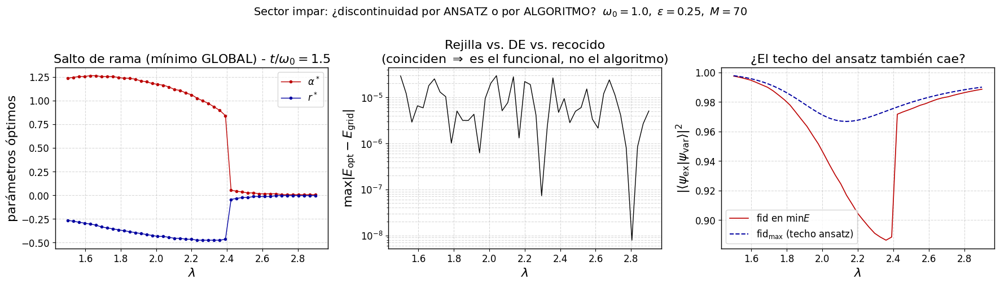

In [5]:
# ══════════════════════════════════════════════════════════════════
#  GRAFICACIÓN
# ══════════════════════════════════════════════════════════════════
# Tu sesión tiene text.usetex=True; el LaTeX "pelado" de matplotlib no maneja
# '⇒' ni acentos. mathtext (usetex=False) renderiza $...$ y acentos sin problema.
plt.rcParams['text.usetex'] = False   # para volver a tus fuentes LaTeX: ponlo en True

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5.2))

# (1) parámetros óptimos: el salto
C_A = plt.cm.seismic(0.12); C_B = plt.cm.seismic(0.88)
ax1.plot(lam_scan, a_star, '-o', ms=3, color=C_B, lw=1.0, label=r'$\alpha^*$')
ax1.plot(lam_scan, r_star, '-o', ms=3, color=C_A, lw=1.0, label=r'$r^*$')
ax1.set(xlabel=r'$\lambda$', ylabel='parámetros óptimos',
        title=rf'Salto de rama (mínimo GLOBAL) - $t/\omega_0={t}$')
ax1.legend(); ax1.grid(alpha=0.3, ls='--')

# (2) acuerdo entre optimizadores (escala log)
ax2.semilogy(lam_scan, np.maximum(opt_disagree, 1e-16), '-', color='k', lw=1.0)
ax2.set(xlabel=r'$\lambda$', ylabel=r'$\max|E_{\rm opt}-E_{\rm grid}|$',
        title='Rejilla vs. DE vs. recocido\n'
              r'(coinciden $\Rightarrow$ es el funcional, no el algoritmo)')
ax2.grid(alpha=0.3, ls='--', which='both')

# (3) techo de fidelidad: el test definitivo
ax3.plot(lam_scan, fid_Emin, '-',  color=C_B, lw=1.2, label=r'fid en $\min E$')
ax3.plot(lam_scan, fid_max,  '--', color=C_A, lw=1.4, label=r'fid$_{\max}$ (techo ansatz)')
ax3.set(xlabel=r'$\lambda$', ylabel=r'$|\langle\psi_{\rm ex}|\psi_{\rm var}\rangle|^2$',
        title='¿El techo del ansatz también cae?')
ax3.legend(); ax3.grid(alpha=0.3, ls='--')

fig.suptitle(r'Sector impar: ¿discontinuidad por ANSATZ o por ALGORITMO?  '
             rf'$\omega_0={omega0},\ \varepsilon={eps_val},\ M={M}$')
plt.tight_layout(); plt.show()